## Impostazione **Weight & Biases DL Training** con **Rappresentazione Time-Domain Signal (1D)** 

## Optimization Weight and Biases - EEG Time Domain Signal 

#### **Weight & Biases Procedure FINAL SEQUENCE OF STEPS - EEG Time Domain 1D - ONLY HYPER-PARAMS**

In [68]:
#Library Importing 
    
import os
import math
import copy as cp 

import tqdm
from tqdm import tqdm

import random 

#import mne 
import scipy

import numpy as np  # NumPy per operazioni numeriche
import matplotlib.pyplot as plt  # Matplotlib per la visualizzazione dei dati

from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report

import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F

from torchsummary import summary
from torch.utils.data import TensorDataset, DataLoader

import os
import pickle

import random

import wandb

In [ ]:
import pickle
import numpy

# Apri il file in modalità lettura binaria ('rb')

#path = '/home/stefano/Interrogait/all_datas/Unfamiliar_Spectrograms/'

#path = '/home/stefano/Interrogait/all_datas/Familiar_Spectrograms_channels_frequencies/'


path = '/home/stefano/Interrogait/all_datas/Unfamiliar_Spectrograms_channels_frequencies/'

with open(f"{path}new_all_th_concat_spectrograms_coupled_exp.pkl", "rb") as f:
    data = pickle.load(f)


#### **Utils Functions - EEG Time Domain 1D**

In [5]:
'''
QUI DENTRO HO CONFIGURATO 
LE FUNZIONI DI CONTROLLO DELLE STRINGHE 
PER IL SALVATAGGIO DELLE PERFORMANCE DEL MODELLO
NELLE RELATIVE SUBFOLDERS

(I.E., get_subfolder_from_key, get_subfolder_from_key_hyper)

IN MODO CHE SI LEGHINO ALLA CHIAVE 'STANDARDIZATION' DELL'OGGETTO SWEEP_CONFIG

'''


import pickle
import numpy as np

def load_data(data_type, category, subject_type, wavelet_level=None, condition = "th_resp_vs_pt_resp", channels = [12, 30, 48]):
    """
    Carica i dati EEG dalla directory appropriata, seleziona la finestra temporale (50°-300° punto)
    e applica la selezione dei canali SOLO per i dati 1-20 e 1-45.

    Parameters:
    - data_type: str, "1-20", "1-45" o "wavelet"
    - category: str, "familiar" o "unfamiliar"
    - subject_type: str, "th" (terapisti) o "pt" (pazienti)
    - wavelet_level: str, "theta", "delta", ecc. (solo per dati wavelet)
    - condition: str, condizione sperimentale da selezionare
    - channels: list, lista di indici dei canali EEG da selezionare (default: [12, 30, 48])

    Returns:
    - X: Dati EEG sotto-selezionati (50°-300° punto e canali selezionati se applicabile)
    - y: Etichette corrispondenti
    """

    # Definizione dei percorsi base
    base_paths = {
        "1_20": {
            "familiar": "/home/stefano/Interrogait/all_datas/Familiar_1_20/",
            "unfamiliar": "/home/stefano/Interrogait/all_datas/Unfamiliar_1_20/"
        },
        "1_45": {
            "familiar": "/home/stefano/Interrogait/all_datas/Familiar_1_45/",
            "unfamiliar": "/home/stefano/Interrogait/all_datas/Unfamiliar_1_45/"
        },
        "wavelet": {
            "familiar": "/home/stefano/Interrogait/all_datas/Familiar_Wavelet_Reconstructions/",
            "unfamiliar": "/home/stefano/Interrogait/all_datas/Unfamiliar_Wavelet_Reconstructions/"
        }
    }

    # Seleziona il path corretto
    base_path = base_paths[data_type][category]

    # Determina il nome del file corretto
    if data_type in ["1_20", "1_45"]:
        filename = f"new_all_{subject_type}_concat_reconstructions_{condition}_{data_type}.pkl"
    elif data_type == "wavelet":
        filename = f"new_all_{subject_type}_concat_reconstructions_wavelet_levels_coupled_exp.pkl"
    else:
        raise ValueError("data_type non valido. Scegli tra '1_20', '1_45' o 'wavelet'.")

    # Caricamento del file
    filepath = base_path + filename
    with open(filepath, "rb") as f:
        data = pickle.load(f)
    
    '''
    Per i dati wavelet, la funzione accede al livello specificato (wavelet_level) come 'delta' o un altro livello.
    All'interno del livello, la funzione seleziona la condizione desiderata (condition = "th_resp_vs_pt_resp") 
    e preleva i dati e le etichette associati a questa condizione.
    '''
    
    # Selezione della finestra temporale e delle etichette
    X = data[wavelet_level][condition]["data"][:, :, 50:300] if data_type == "wavelet" else data["data"][:, :, 50:300]
    y = data[wavelet_level][condition]["labels"] if data_type == "wavelet" else data["labels"]

    # SOLO per i dati 1-20 e 1-45: Selezione dei canali EEG
    if data_type in ["1_20", "1_45"]:
        X = select_channels(X, channels)

    return X, y


def select_channels(data, channels=[12, 30, 48]):
    """
    Seleziona i canali EEG specificati SOLO per i dati 1-20 e 1-45.

    Parameters:
    - data: array NumPy, dati EEG con shape (n_trials, n_channels, n_timepoints)
    - channels: list, indici dei canali da selezionare

    Returns:
    - data filtrato sui canali specificati
    """
    return data[:, channels, :]


# Funzione per train-test split
#https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.train_test_split.html

def split_data(X, y, test_size=0.2, val_size=0.2):
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, random_state=42)
    X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=val_size, random_state=42)
    return X_train, X_val, X_test, y_train, y_val, y_test


'''ATTENZIONE MODIFICATA FUNZIONE DI STANDARDIZZAZIONE'''
# Funzione per standardizzare i dati
# Con questa modifica eviti che std==0 produca NaN e i tuoi loss torneranno numeri sensati.
def standardize_data(X_train, X_val, X_test, eps = 1e-8):
    
    mean = X_train.mean(axis=0, keepdims=True)
    std = X_train.std(axis=0, keepdims=True)
    
    #aggiungo eps per evitare divisione per zero
    X_train = (X_train - mean) / (std + eps)
    X_val = (X_val - mean) / (std + eps)
    X_test = (X_test - mean) / (std + eps)
    
    return X_train, X_val, X_test



import torch
from torch.utils.data import TensorDataset, DataLoader
from sklearn.utils.class_weight import compute_class_weight


'''
Questa funzione prende in input i dati di training, validation e test, 
il tipo di modello scelto e la dimensione del batch. Si occupa di:

Calcolare i pesi delle classi.
Convertire i dati in tensori PyTorch, con le opportune trasformazioni per CNN, LSTM o Transformer.
Creare i dataset e i dataloader per il training.
'''


def prepare_data_for_model(X_train, X_val, X_test, y_train, y_val, y_test, model_type, batch_size=48):
    
    # Calcolo dei pesi delle classi
    class_weights = compute_class_weight(class_weight='balanced', 
                                         classes=np.unique(y_train), 
                                         y=y_train)
    
    class_weights_tensor = torch.tensor(class_weights, dtype=torch.float32)
    class_weights_tensor = class_weights_tensor.to(dtype=torch.float32, device=device)
    
    # Conversione delle etichette in interi
    y_train = y_train.astype(int)
    y_val = y_val.astype(int)
    y_test = y_test.astype(int)
    
    # Conversione dei dati in tensori PyTorch con permutazione se necessario
    #if model_type == "CNN2D":   
    
    '''ATTENZIONE MODIFICATA QUI'''
    if model_type == "CNN1D":
        X_train_tensor = torch.tensor(X_train, dtype=torch.float32)
        X_val_tensor = torch.tensor(X_val, dtype=torch.float32)
        X_test_tensor = torch.tensor(X_test, dtype=torch.float32)
    
    #BiLSTM (ReadMEndYou):
    #Ora il modello si aspetta l’input con shape (batch, canali, frequenze, tempo) 
    #e, al suo interno, 
    #esegue la permutazione per avere il tempo come dimensione sequenziale. 
    #Non serve quindi applicare una permutazione anche qui.
    
    elif model_type == "BiLSTM":
            
        X_train_tensor = torch.tensor(X_train, dtype=torch.float32)
        X_val_tensor = torch.tensor(X_val, dtype=torch.float32)
        X_test_tensor = torch.tensor(X_test, dtype=torch.float32)
    
    #Transformer (ReadMYMind):
    #Analogamente, il modello gestisce internamente la riorganizzazione dell’input, quindi lasciamo i dati nella loro forma originale.
    elif model_type == "Transformer":
        X_train_tensor = torch.tensor(X_train, dtype=torch.float32)
        X_val_tensor = torch.tensor(X_val, dtype=torch.float32)
        X_test_tensor = torch.tensor(X_test, dtype=torch.float32)
    
    else:
        raise ValueError("Modello non riconosciuto. Scegli tra 'CNN1D', 'BiLSTM' o 'Transformer'.")
    
    # Conversione delle etichette in tensori
    y_train_tensor = torch.tensor(y_train, dtype=torch.long)
    y_val_tensor = torch.tensor(y_val, dtype=torch.long)
    y_test_tensor = torch.tensor(y_test, dtype=torch.long)
    
    # Creazione dei dataset
    train_dataset = TensorDataset(X_train_tensor, y_train_tensor)
    val_dataset = TensorDataset(X_val_tensor, y_val_tensor)
    test_dataset = TensorDataset(X_test_tensor, y_test_tensor)
    
    # Creazione dei dataloader
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)
    
    return train_loader, val_loader, test_loader, class_weights_tensor


# Funzione per determinare a quale subfolder appartiene la chiave
def get_subfolder_from_key(key, sweep_config):
    
    '''
    Mi richiamo la chiave 'standardization' che ho impostato nella configurazione dell'oggetto weight and biases
    #(i.e., sweep_config['standardization']) e eseguo una procedura condizionale 
    
    ossia che, se risulta o True o False, lui cambi le condizioni di gestione 
    della costruzione delle path di salvataggio 
    
    '''
    # Controlla se i dati sono standardizzati
    if sweep_config['standardization']:
    
        #PER I DATI SCALED
        if '_familiar_th' in key:
            return 'th_fam'
        elif '_unfamiliar_th' in key:
            return 'th_unfam'
        elif '_familiar_pt' in key:
            return 'pt_fam'
        elif '_unfamiliar_pt' in key:
            return 'pt_unfam'
        else:
            return None
    else: 
        #PER I DATI UNSCALED

        if '_familiar_th' in key:
            return 'th_fam_unscaled'
        elif '_unfamiliar_th' in key:
            return 'th_unfam_unscaled'
        elif '_familiar_pt' in key:
            return 'pt_fam_unscaled'
        elif '_unfamiliar_pt' in key:
            return 'pt_unfam_unscaled'
        else:
            return None
    
# Funzione per salvare i risultati
def save_performance_results(model_name, my_train_results, my_test_results, key, data_type, sweep_config, condition = "th_resp_vs_pt_resp"):
    """
    Funzione che salva i risultati del modello in base alla combinazione di 'key' e 'model_name'.
    """
    
    # Identificazione del subfolder in base alla chiave
    subfolder = get_subfolder_from_key(key, sweep_config)
    
    # Debug: controllo sulla subfolder
    print(f"\nDEBUG - Chiave: \033[1m{key}\033[0m, Subfolder ottenuto: \033[1m{subfolder}\033[0m")
    
    if subfolder is None:
        print(f"Errore: La chiave \033[1m{key}\033[0m non corrisponde a nessun subfolder valido.\n")
        return
    
    # Determinazione del tipo di dato direttamente dalla chiave
    if "wavelet" in key:
        data_type_str = "wavelet_delta"
    elif "1_20" in key:
        data_type_str = "1_20"
    elif "1_45" in key:
        data_type_str = "1_45"
    else:
        print(f"Errore: Tipo di dato non riconosciuto nella chiave '{key}'.")
        return

    # Creazione del nome del file con l'inclusione della combinazione key + model_name
    file_name = f"{model_name}_performances_{condition}_{subfolder}_{data_type_str}.pkl"
    folder_path = os.path.join(base_folder, subfolder)
    
    # Verifica se la cartella di destinazione esiste, altrimenti creala
    if not os.path.exists(folder_path):
        os.makedirs(folder_path)
    
    file_path = os.path.join(folder_path, file_name)

    # Creazione del dizionario con i risultati
    results_dict = {
        'my_train_results': my_train_results,
        'my_test_results': my_test_results
    }

    # Salvataggio del dizionario con i risultati
    try:
        with open(file_path, 'wb') as f:
            pickle.dump(results_dict, f)
        print(f"\nRisultati salvati con successo ✅ in: \n\033[1m{file_path}\033[0m\n")
    except Exception as e:
        print(f"Errore durante il salvataggio dei risultati: {e}")

#### **DL Models - EEG Time Domain 1D**

In [45]:
'''
DEFINIZIONE DEI MODELLI NUOVI PER P300 FROM 1D TIME-DOMAIN SIGNAL  
'''

'''
CNN1D CON LE FUNZIONI DI ATTIVAZIONI DINAMICHE (LAYER CONVOLUTIVI + FC1) E DINAMISMO DEI KERNEL SIZE DI CONV e POOL LAYER e STRIDE
'''


#https://docs.pytorch.org/docs/stable/generated/torch.nn.Conv1d.html

class CNN1D(nn.Module):
    def __init__(
        self,
        input_channels: int,
        num_classes: int,

        # da sweep: conv_out_channels
        conv_out_channels: int,

        # da sweep: conv_k1, conv_k2, conv_k3
        
        # <-- estrai i tre valori della grandezza del kernel size per ogni layer convolutivo
        
        conv_k1: int,
        conv_k2: int,
        conv_k3: int,

        # da sweep: conv_s1, conv_s2, conv_s3
        
        # <-- estrai i tre valori dello stride del kernel convolutivo per ogni layer convolutivo
        
        conv_s1: int,
        conv_s2: int,
        conv_s3: int,

        # da sweep: pool_type, pool_p1, pool_p2, pool_p3
        
        # <-- estrai i tre valori del kernel size dello strato di pooling per ogni layer di pooling
        
        pool_type: str,
        pool_p1: int,
        pool_p2: int,
        pool_p3: int,

        # da sweep: fc1_units, dropout
        fc1_units: int,
        dropout: float,

        # da sweep: cnn_act1, cnn_act2, cnn_act3
        cnn_act1: str,
        cnn_act2: str,
        cnn_act3: str,
    ):
        super().__init__()
        
        # costruiamo la lista delle 3 activation
        mapping = {'relu': F.relu, 'selu': F.selu, 'elu': F.elu}
        self.act_fns = [
            mapping[cnn_act1],
            mapping[cnn_act2],
            mapping[cnn_act3],
        ]
        
        # Calcolo padding
        p1 = (conv_k1 - 1) // 2
        p2 = (conv_k2 - 1) // 2
        p3 = (conv_k3 - 1) // 2

        # conv + batchnorm + pooling
        self.conv1 = nn.Conv1d(input_channels, conv_out_channels,
                               kernel_size=conv_k1, stride=conv_s1, padding = p1) #'same'
        self.bn1   = nn.BatchNorm1d(conv_out_channels)
        self.pool1 = nn.MaxPool1d(pool_p1) if pool_type=='max' else nn.AvgPool1d(pool_p1)

        self.conv2 = nn.Conv1d(conv_out_channels, conv_out_channels*2,
                               kernel_size=conv_k2, stride=conv_s2, padding = p2)#'same'
        self.bn2   = nn.BatchNorm1d(conv_out_channels*2)
        self.pool2 = nn.MaxPool1d(pool_p2) if pool_type=='max' else nn.AvgPool1d(pool_p2)

        self.conv3 = nn.Conv1d(conv_out_channels*2, conv_out_channels*3,
                               kernel_size=conv_k3, stride=conv_s3, padding = p3)#'same'
        self.bn3   = nn.BatchNorm1d(conv_out_channels*3)
        self.pool3 = nn.MaxPool1d(pool_p3) if pool_type=='max' else nn.AvgPool1d(pool_p3)

        # fully‐connected finale
        self.fc1 = nn.LazyLinear(fc1_units)
        self.dropout = nn.Dropout(dropout)
        self.fc2 = nn.LazyLinear(num_classes)

    def forward(self, x):
        
        x = self.pool1(self.act_fns[0]( self.bn1(self.conv1(x)) ))
        x = self.pool2(self.act_fns[1]( self.bn2(self.conv2(x)) ))
        x = self.pool3(self.act_fns[2]( self.bn3(self.conv3(x)) ))

        x = torch.flatten(x, start_dim=1)
        #x = self.dropout( random.choice(self.act_fns)( self.fc1(x) ) )
        
        # uso sempre ReLU dopo fc1, poi Dropout
        x = self.dropout(F.relu(self.fc1(x)))
        
        return self.fc2(x)
    

    

'''
BILSTM HIDDEN SIZE, DROPOUT e BIDIREZIONALITA' DINAMICI
'''


class ReadMEndYou(nn.Module):
    def __init__(
        self,
        input_size: int,
        hidden_size: int,
        output_size: int,
        num_layers: int, # --> ricordati qui è 3!
        dropout: float,

        # da sweep: bidirectional come 0/1
        bidirectional: int):
        
        super().__init__()
        # cast da int a bool
        self.bidirectional = bool(bidirectional)

        #base_sizes = [hidden_size]*num_layers
        #self.hidden_sizes = [
        #    h * (2 if self.bidirectional else 1) for h in base_sizes
        #]
        
        # hidden_size è per direzione; il fattore 2 si applica SOLO agli input_size dei layer successivi e al FC
        
        self.dirs = 2 if self.bidirectional else 1
        self.hidden_sizes = [hidden_size] * num_layers

        self.lstm1 = nn.LSTM(input_size, self.hidden_sizes[0], num_layers=1,
                             batch_first=True, bidirectional=self.bidirectional)
        #self.lstm2 = nn.LSTM(self.hidden_sizes[0], self.hidden_sizes[1], num_layers=1,
        #                     batch_first=True, bidirectional=self.bidirectional)
        
        self.lstm2 = nn.LSTM(self.hidden_sizes[0] * self.dirs, self.hidden_sizes[1], num_layers=1,
                             batch_first=True, bidirectional=self.bidirectional)
                             
        #self.lstm3 = nn.LSTM(self.hidden_sizes[1], self.hidden_sizes[2], num_layers=1,
        #                     batch_first=True, bidirectional=self.bidirectional)
        
        self.lstm3 = nn.LSTM(self.hidden_sizes[1] * self.dirs, self.hidden_sizes[2], num_layers=1,
                             batch_first=True, bidirectional=self.bidirectional)

        self.dropout = nn.Dropout(dropout)
        #self.fc = nn.Linear(self.hidden_sizes[2], output_size)
        self.fc = nn.Linear(self.hidden_sizes[2] * self.dirs, output_size)

    def forward(self, x):
        
        # x: (batch_size, channels=3, time_steps=250)
        # trasformalo in (batch_size, time_steps=250, features=3)
        
        #n questo modo:
        #x.permute(0,2,1) passa da (N, 3, 250) a (N, 250, 3).
        #Ora batch_first=True corrisponde davvero a (batch, seq_len, features), con features=3=input_size.

        x = x.permute(0, 2, 1)
        
        out,_ = self.lstm1(x); out = self.dropout(out)
        out,_ = self.lstm2(out); out = self.dropout(out)
        out,_ = self.lstm3(out); out = self.dropout(out)
        out = out[:, -1, :]
        out = self.dropout(out)
        return self.fc(out)
    



'''
TRANSFORMER 
'''

class ReadMYMind(nn.Module):
    def __init__(self,
                 num_channels: int,
                 seq_length: int,
                 
                 # da sweep
                 d_model: int,
                 num_heads: int,
                 
                 num_layers: int,
                 num_classes: int,
                 
                 ff_mult: int,
                 dropout: float,
                 transformer_activations: str,
    ):
        super().__init__()
        dim_feedforward = ff_mult * d_model

        # embedding per il ramo temporale (canali → d_model)
        self.embedding_temporal = nn.Linear(num_channels, d_model)
        
        # embedding per il ramo spaziale (time_steps → d_model)
        self.embedding_spatial  = nn.Linear(seq_length, d_model)

        encoder_layer = nn.TransformerEncoderLayer(
            d_model=d_model,
            nhead=num_heads,
            dim_feedforward=dim_feedforward,
            dropout=dropout,
            activation=transformer_activations
        )
        # Transformer “temporale”: lavora su sequenza di lunghezza seq_length
        self.temporal_transformer = nn.TransformerEncoder(encoder_layer, num_layers)
        
        # Transformer “spaziale”: lavora su sequenza di lunghezza num_channels
        self.spatial_transformer  = nn.TransformerEncoder(encoder_layer, num_layers)

        self.cross_attention     = nn.MultiheadAttention(d_model, num_heads, dropout=dropout)
        self.fc_fusion           = nn.Linear(d_model, d_model)
        self.fc_classify         = nn.Linear(d_model, num_classes)

    def forward(self, x):
        # x: (B, C=3, T=250)

        # ——— Ramo temporale ———
        # STEP T1: (B, C, T) → (B, T, C)
        xt = x.permute(0, 2, 1)
        # STEP T2: embed i canali in d_model → (B, T, d_model)
        xt = self.embedding_temporal(xt)
        # STEP T3: prepara per Transformer → (T, B, d_model)
        xt = xt.permute(1, 0, 2)
        # STEP T4: applica TransformerEncoder
        xt = self.temporal_transformer(xt)  # (T, B, d_model)

        # ——— Ramo spaziale ———
        # STEP S1: (B, C, T) → embed ogni canale come token → (B, C, d_model)
        xs = self.embedding_spatial(x)
        # STEP S2: prepara per Transformer → (C, B, d_model)
        xs = xs.permute(1, 0, 2)
        # STEP S3: applica TransformerEncoder
        xs = self.spatial_transformer(xs)   # (C, B, d_model)

        # ——— Cross‑Attention ———
        # usa xt come query, xs come key/value
        # output: (T, B, d_model)
        x_cross, _ = self.cross_attention(xt, xs, xs)

        # ——— Fusione & Classificazione ———
        # media temporale dei token (su dim=0 → over T)
        # oppure media spaziale (su dim=0 → over C), o mix
        
        
        # Qui sommiamo e facciamo media sui time steps:
        
        x_fused = (xt + x_cross).mean(dim=0)  # → (B, d_model)
        x_fused = self.fc_fusion(x_fused)    # → (B, d_model)
        out     = self.fc_classify(x_fused)  # → (B, num_classes)

        return out
    
    

#### **Early Stopping - EEG Time Domain 1D**

In [17]:
'''
DEFINIZIONE EARLY STOPPING
'''

import io
from PIL import Image
from sklearn.metrics import precision_score, recall_score, f1_score, roc_auc_score
import pickle
import numpy as np


class EarlyStopping:
    def __init__(self, patience = 10, min_delta = 0.001, mode = 'max'):
        
        
        """
        :param patience: Numero di epoche da attendere prima di interrompere il training se non c'è miglioramento
        
        Esempio: il training si interromperà se non si osserva un miglioramento per (N = 5) epoche consecutive.
        
        :param min_delta: Variazione minima richiesta per considerare un miglioramento
        
        definisce il miglioramento minimo richiesto per essere considerato significativo. 
        Se il miglioramento è inferiore a min_delta, non viene considerato un vero miglioramento.
        
        Il parametro min_delta in una configurazione di early stopping indica 
        la minima variazione del valore di una metrica 
        (ad esempio, la perdita o l'accuratezza) 
        che deve verificarsi tra un'epoca e la successiva 
        per continuare l'allenamento. 
        
        In genere, il valore di min_delta dipende dal tipo di modello e dai dati specifici, 
        ma di solito si trova in un intervallo tra 0.001 e 0.01.
    
            - Se stai cercando di evitare che l'allenamento si fermi troppo presto,
            puoi impostare un valore più basso per min_delta (come 0.001), 
            - Se vuoi essere più conservativo e permettere fluttuazioni nei valori della metrica,
            un valore più alto (come 0.01) potrebbe essere appropriato.

        Un buon punto di partenza potrebbe essere 0.001, e poi fare dei test per capire quale valore funziona meglio
        nel tuo caso specifico!
        
        :param mode: 'min' per monitorare la loss (minimizzazione), 'max' per l'accuracy (massimizzazione)
        
        'max' → ottimizza metriche da massimizzare (es. accuracy, F1-score, AUC).
        'min' → ottimizza metriche da minimizzare (es. loss).
        
        """
            
        self.patience = patience
        self.min_delta = min_delta
        self.mode = mode
        self.best_score = None # Tiene traccia del miglior punteggio osservato
        self.counter = 0 # Conta quante epoche consecutive non migliorano
        self.early_stop = False # Flag che indica se attivare l'early stopping
        
        #Ogni volta che si chiama la classe con early_stopping(current_score), controlla se il modello sta migliorando o meno.

    def __call__(self, current_score):
        
        #Caso 1: Prima iterazione (best_score ancora None)
        #→ Se non esiste ancora un miglior punteggio, lo inizializza con il primo valore ricevuto.
        
        if self.best_score is None:
            self.best_score = current_score
            
        #Caso 2: Il modello migliora
        #→ Se il valore migliora di almeno min_delta, aggiorna best_score e resetta il contatore.

        elif (self.mode == 'min' and current_score < self.best_score - self.min_delta) or \
             (self.mode == 'max' and current_score > self.best_score + self.min_delta):
            self.best_score = current_score
            self.counter = 0  # Reset contatore se migliora
            
        #Caso 3: Il modello NON migliora
        
        #→ Se il valore non migliora, incrementa il contatore.
        #→ Se il contatore raggiunge patience, imposta early_stop = True, segnalando che il training deve essere interrotto.
        
        else:
            self.counter += 1  # Incrementa se non migliora
            if self.counter >= self.patience:
                print(f"🛑 Early stopping attivato! Nessun miglioramento per {self.patience} epoche consecutive.")
                self.early_stop = True


#### **Weight & Biases Login - EEG Time Domain 1D**

In [8]:
'''

WEIGHT AND BIASES LOGIN

Il messaggio che stai ricevendo indica 
che sei già connesso al tuo account Weights & Biases (wandb).

Se vuoi forzare il login, puoi usare il comando suggerito:

wandb login --relogin

Questo comando ti permetterà di reinserire le credenziali e riconnetterti al tuo account.
Se non hai bisogno di disconnetterti o di cambiare l'account,
puoi semplicemente continuare a usare wandb senza ulteriori passaggi. 
Hai bisogno di ulteriore assistenza con wandb o con il tuo progetto?
'''


import wandb
wandb.login()
print("✅ Weights & Biases login effettuato con successo!")

wandb: Currently logged in as: stefano-bargione (stefano-bargione-universit-di-roma-tor-vergata) to https://api.wandb.ai. Use `wandb login --relogin` to force relogin


✅ Weights & Biases login effettuato con successo!


In [ ]:
'''

Per verificare se ci sono degli sweep già configurati o in corso nel tuo progetto di WandB, puoi utilizzare il comando wandb.sweeps() per recuperare tutte le informazioni sugli sweep attivi nel tuo account e nel tuo progetto. Ecco come fare:

Accedere ai sweep attivi e storici:
Puoi visualizzare i sweep attivi e passati nel tuo progetto usando wandb.sweeps().

Comando di esempio:
Ecco un esempio su come ottenere i dettagli sugli sweep nel tuo progetto:


import wandb

# Assicurati di essere loggato
wandb.login()

# Ottieni tutti gli sweep disponibili per il tuo progetto
sweeps = wandb.sweeps()

# Visualizza informazioni sui sweep
for sweep in sweeps:
    print(f"Sweep ID: {sweep.id}")
    print(f"Name: {sweep.name}")
    print(f"State: {sweep.state}")  # Può essere "running", "completed", ecc.
    print(f"Config: {sweep.config}")  # Configurazione dello sweep
    print("---------")
    
Filtrare per progetto specifico:
Se hai più progetti, puoi filtrare gli sweep per il progetto di interesse, come nel seguente esempio:


sweeps = wandb.sweeps(project="NomeDelTuoProgetto")
Stato dello sweep:
Lo stato dello sweep può essere:

running: lo sweep è in corso.

completed: lo sweep è stato completato.

failed: lo sweep ha fallito.

paused: lo sweep è in pausa.

Verifica degli sweep:
Se il tuo sweep non è visibile, significa che non c'è nessun sweep attivo per quel progetto, oppure c'è stato un errore nella configurazione.

Visualizzare solo gli sweep completati:
Se vuoi visualizzare solo gli sweep completati, puoi farlo filtrando per stato:


completed_sweeps = [sweep for sweep in sweeps if sweep.state == 'completed']
print(completed_sweeps)

Controllo via Web UI:
In alternativa, puoi andare nella Dashboard di WandB e controllare la sezione "Sweeps" del tuo progetto. 
Questo ti permette di vedere tutti gli sweep attivi, passati, e le loro configurazioni.

Dopo aver verificato, se hai bisogno di rimuovere o interrompere degli sweep, puoi farlo tramite la UI o,
se hai bisogno di farlo via codice, puoi utilizzare il comando wandb.sweep(id).delete() per eliminare uno sweep (solo se non è attivo).

'''

In [9]:
'''
Per modificare il percorso in cui W&B salva i dati localmente,
puoi configurare la variabile di ambiente WANDB_DIR.

Questo ti permette di specificare una directory personalizzata in cui W&B salva tutti i file associati al tuo run, inclusi i dati e i log.
'''

import os

# Imposta la directory per i dati W&B:
# Questo cambierà la cartella in cui W&B salva i dati per quella sessione di esecuzione

# Definisci la cartella principale
WB_dir = "/home/stefano/Interrogait/WB_time_domain_analyses"
os.makedirs(WB_dir, exist_ok=True)


os.environ["WANDB_DIR"] = WB_dir


#### **Weight & Biases Login PRECEDURA CORRETTA ✅ (CANCELLAZIONE RUNS + NON SWEEPS!) - EEG Time Domain - 1D**

In [ ]:
print('finito')

#### **Datasets Loading - EEG Time Domain 1D**

In [10]:
                            ##################### CODICE UFFICIALE DEL 04/03/2025 ORE 9:30 #####################
                                 ##################### SENZA DETTAGLI SCRITTI V°3 #####################
        
'''ATTENZIONE: 

HO SOSTITUITO LE VARIABILI DI 

    1) DATASET_TRAIN_LOADER -->  TRAIN_LOADER
    2) DATASET_VAL_LOADER -->  VAL_LOADER

    VEDI FUNZIONE 'PREPARE_DATA_FOR_MODEL --> NOMI DELLE VARIABILI DEI TORCH TENSOR DATASET LOADER SON  'TRAIN_LOADER' E VAL_LOADER!!!  

'''
import torch
import torch.nn as nn
import torch.optim as optim
import wandb
from tqdm import tqdm
from sklearn.metrics import precision_score, recall_score, f1_score, roc_auc_score
import copy as cp
import numpy as np

import wandb
import random
import copy as cp


# Definisci le lista delle coppie di condizioni sperimentali
experimental_conditions = ["th_resp_vs_pt_resp", "th_resp_vs_shared_resp", "pt_resp_vs_shared_resp"]

# Inizializza il dizionario per caricare i dati
data_dict = {}

# Definisci la cartella principale
base_dir = "/home/stefano/Interrogait/WB_time_domain_best_results"
os.makedirs(base_dir, exist_ok=True)

'''LOOP DI CARICAMENTO DATI'''

for condition in experimental_conditions:
    # Crea la cartella per la condizione sperimentale
    condition_dir = os.path.join(base_dir, condition)
    os.makedirs(condition_dir, exist_ok=True)
    
    # Aggiungi un livello di annidamento per ogni condizione
    data_dict[condition] = {}
    
    for data_type in ["1_20", "1_45", "wavelet"]:
        # Crea la cartella per il tipo di dato
        data_dir = os.path.join(condition_dir, data_type)
        os.makedirs(data_dir, exist_ok=True)
        
        for category in ["familiar", "unfamiliar"]:
            # Crea la cartella per la categoria
            #category_dir = os.path.join(data_dir, category)
            #os.makedirs(category_dir, exist_ok=True)
            
            for subject_type in ["th", "pt"]:
                # Caricamento e suddivisione dei dati
                if data_type == "wavelet":
                    dwt_level = "delta"
                    print(f"Caricamento dati per: {condition} - {data_type} - {category}_{subject_type} - wavelet_level: {dwt_level}")
                    X, y = load_data(data_type, category, subject_type, wavelet_level=dwt_level, condition=condition)
                else:
                    X, y = load_data(data_type, category, subject_type, condition=condition)
                
                # Creazione della chiave per il dizionario annidato
                data_dict[condition][data_type] = data_dict[condition].get(data_type, {})
                data_dict[condition][data_type][f"{category}_{subject_type}"] = (X, y)
                
                # Stampa di conferma
                if data_type == "1_20" or data_type == "1_45":
                    print(f"Dataset caricato: \033[1m{condition}\033[0m_\033[1m{data_type}\033[0m_\033[1m{category}_{subject_type}\033[0m - Shape X: \033[1m{X.shape}\033[0m, Shape y: \033[1m{len(y)}\033[0m")
                elif data_type == "wavelet":
                    print(f"Dataset caricato: \033[1m{condition}\033[0m_\033[1m{dwt_level}\033[0m_\033[1m{category}_{subject_type}\033[0m - Shape X: \033[1m{X.shape}\033[0m, Shape y: \033[1m{len(y)}\033[0m")

Dataset caricato: th_resp_vs_pt_resp_1_20_familiar_th - Shape X: (1594, 3, 250), Shape y: 1594
Dataset caricato: th_resp_vs_pt_resp_1_20_familiar_pt - Shape X: (1589, 3, 250), Shape y: 1589
Dataset caricato: th_resp_vs_pt_resp_1_20_unfamiliar_th - Shape X: (1673, 3, 250), Shape y: 1673
Dataset caricato: th_resp_vs_pt_resp_1_20_unfamiliar_pt - Shape X: (1674, 3, 250), Shape y: 1674
Dataset caricato: th_resp_vs_pt_resp_1_45_familiar_th - Shape X: (1586, 3, 250), Shape y: 1586
Dataset caricato: th_resp_vs_pt_resp_1_45_familiar_pt - Shape X: (1580, 3, 250), Shape y: 1580
Dataset caricato: th_resp_vs_pt_resp_1_45_unfamiliar_th - Shape X: (1667, 3, 250), Shape y: 1667
Dataset caricato: th_resp_vs_pt_resp_1_45_unfamiliar_pt - Shape X: (1667, 3, 250), Shape y: 1667
Caricamento dati per: th_resp_vs_pt_resp - wavelet - familiar_th - wavelet_level: delta
Dataset caricato: th_resp_vs_pt_resp_delta_familiar_th - Shape X: (1594, 3, 250), Shape y: 1594
Caricamento dati per: th_resp_vs_pt_resp - wavel

#### **Sweep Configuration - EEG Time Domain 1D**


#### **Sweep separati per ciascuno dei modelli CNN1D, BiLSTM, Transformer**

In [11]:
'''
N.B. 

PER SAPERE A QUALE COMBINAZIONE DI FATTORI CORRISPONDONO I DATI (i.e, X_train, X_val, X_test, y_train, y_val, y_test)

MI CREO UN DIZIONARIO ULTERIORE, 'DATA_DICT_PREPROCESSED' CHE CONTIENE PER OGNI COMBINAZIONE DI FATTORI I DATI SPLITTATI

IN QUESTO MODO, QUANDO FORNISCO ALLA FUNZIONE 'TRAINING_SWEEP' LA TUPLA CON I VARI DATI ((TRAIN, VAL E TEST))
IO POSSO CAPIRE A QUALE COMBINAZIONI DI FATTORI CORRISPONDE QUELLA TUPLA DI DATI (TRAIN, VAL E TEST)


INOLTRE,
MI CREO ANCHE UNA LISTA DI TUPLE DI STRINGHE, DOVE OGNI TUPLA CONTIENE LE STRINGHE DELLE CHIAVI USATE 
PER LA GENERAZIONE DI DATA_DICT_PREPROCESSED.

IN QUESTO MODO, MI ASSICURO CHE SIA UNA COERENZA TRA LA CREAZIONE DEI 'NAME' E 'TAG' DELLA RUN
E
LA CORRETTA ESTRAZIONE DEI DATI (OSSIA I DATI DI QUALE CONDIZIONE SPERIMENTALE, QUALI EEG INPUT, E DA CHI PROVENGONO!)  


Questo approccio permette di garantire la corrispondenza tra 

1) le chiavi dei dati pre‐processati e 
2) la configurazione delle runs su W&B

andando a creare due strutture in parallelo:

- data_dict_preprocessed – che contiene, per ogni combinazione (condition, data_type, category_subject), 
                            la tupla dei dati già suddivisi (X_train, X_val, X_test, y_train, y_val, y_test);
                            
- sweeps_id – che contiene, per ogni combinazione (condition, data_type, category_subject), 
              sia la stringa univoca dello sweep ID, che l'insieme delle stringhe che formano la combinazione (condition, data_type, category_subject)



LOOP DI PREPARAZIONE DATI (FINO A DATASET SPLITTING)
'''



from sklearn.model_selection import train_test_split

#A QUESTO PUNTO PER OGNI DATASET, FACCIO STEP PRIMA DELLO SWEEP

# Set per tenere traccia dei dataset già elaborati
processed_datasets = set()

# Seleziona il dispositivo (GPU o CPU)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')


# Modelli che useremo nei sweep
MODEL_LIST = ["CNN1D", "BiLSTM", "Transformer"]


# Dizionario per salvare gli sweep ID associati a ogni condizione sperimentale

'''sweep_ids_for_models contiene la struttura che mi serve da copiare per best_models''' 
sweep_ids_for_models = {}

'''sweep_ids contiene la struttura che mi serve da copiare per iterare sui singoli swweps di ogni combinazione di fattori'''
sweep_ids = {}  

'''DIZIONARIO CHE VIENE FORNITO IN INGRESSO A TRAINING_SWEEP'''
# Dizionario per salvare la tupla di dati già preprocessati
data_dict_preprocessed = {}


# Loop di addestramento e test per ogni condizione sperimentale
for condition, data_types in data_dict.items():  # Itera sulle condizioni sperimentali
    
    data_dict_preprocessed[condition] = {}
    
    # Aggiungi al dizionario sweep_ids
    if condition not in sweep_ids:
        sweep_ids[condition] = {}
        
        '''sweep_ids_for_models'''
        sweep_ids_for_models[condition] = {}
        
    for data_type, categories in data_types.items():  # Itera sui tipi di dati (1_20, 1_45, wavelet)
        
        data_dict_preprocessed[condition][data_type] = {}
        
        if data_type not in sweep_ids[condition]:
            sweep_ids[condition][data_type] = {}
            
            '''sweep_ids_for_models'''
            sweep_ids_for_models[condition][data_type] = {}
            
        for category_subject, (X_data, y_data) in categories.items():  # Itera sulle coppie category_subject
            
            # 1. Prepara spazio nei dizionari: sotto category_subject, un dict per ogni modello
            
            data_dict_preprocessed[condition][data_type][category_subject] = None
            
            if category_subject not in sweep_ids[condition][data_type]:
                
                sweep_ids[condition][data_type][category_subject] = {}
                
                '''NUOVA MODIFICA'''
                sweep_ids[condition][data_type][category_subject] = {
                model: [] for model in MODEL_LIST
                }

                '''sweep_ids_for_models'''
                sweep_ids_for_models[condition][data_type][category_subject] = {}
                
                '''NUOVA MODIFICA'''
                sweep_ids_for_models[condition][data_type][category_subject] = {
                model: [] for model in MODEL_LIST
                }
                
            print(f"\n\n\033[1mEstrazione Dati\033[0m della Chiave \033[1m{condition}_{data_type}_{category_subject}\033[0m")
            
            # Controlla se il dataset è già stato elaborato (se la chiave è già nel set)
            if (condition, data_type, category_subject) in processed_datasets:
                print(f"⚠️ ATTENZIONE: Il dataset {condition} - {data_type} - {category_subject} è già stato elaborato! Salto iterazione...")
                continue  # Salta se il dataset è già stato processato

            # Aggiungi il dataset al set
            processed_datasets.add((condition, data_type, category_subject))

            X_train, X_val, X_test, y_train, y_val, y_test = split_data(X_data, y_data)
            
            data_dict_preprocessed[condition][data_type][category_subject] = (X_train, X_val, X_test, y_train, y_val, y_test)
            
            # Puoi anche aggiungere altri print per verificare la dimensione dei set
            print(f"\033[1mDataset Splitting\033[0m: Train Set Shape: {X_train.shape}, Validation Set Shape: {X_val.shape}, Test Set Shape: {X_test.shape}")

            
print(f"\nCreato \033[1mdata_dict_preprocessed\033[0m")




Estrazione Dati della Chiave th_resp_vs_pt_resp_1_20_familiar_th
Dataset Splitting: Train Set Shape: (1020, 3, 250), Validation Set Shape: (255, 3, 250), Test Set Shape: (319, 3, 250)


Estrazione Dati della Chiave th_resp_vs_pt_resp_1_20_familiar_pt
Dataset Splitting: Train Set Shape: (1016, 3, 250), Validation Set Shape: (255, 3, 250), Test Set Shape: (318, 3, 250)


Estrazione Dati della Chiave th_resp_vs_pt_resp_1_20_unfamiliar_th
Dataset Splitting: Train Set Shape: (1070, 3, 250), Validation Set Shape: (268, 3, 250), Test Set Shape: (335, 3, 250)


Estrazione Dati della Chiave th_resp_vs_pt_resp_1_20_unfamiliar_pt
Dataset Splitting: Train Set Shape: (1071, 3, 250), Validation Set Shape: (268, 3, 250), Test Set Shape: (335, 3, 250)


Estrazione Dati della Chiave th_resp_vs_pt_resp_1_45_familiar_th
Dataset Splitting: Train Set Shape: (1014, 3, 250), Validation Set Shape: (254, 3, 250), Test Set Shape: (318, 3, 250)


Estrazione Dati della Chiave th_resp_vs_pt_resp_1_45_familiar_pt

In [12]:
data_dict['th_resp_vs_pt_resp'].keys()

dict_keys(['1_20', '1_45', 'wavelet'])

In [13]:
print(data_dict_preprocessed.keys())
print(data_dict_preprocessed['th_resp_vs_pt_resp'].keys())
print(data_dict_preprocessed['th_resp_vs_pt_resp']['1_20'].keys())
print(type(data_dict_preprocessed['th_resp_vs_pt_resp']['1_20'].keys()))

#All'interno, c'è una tupla, di 6 elementi!
print(type(data_dict_preprocessed['th_resp_vs_pt_resp']['1_20']['familiar_th']))

#I 6 elementi della tupla sono X_train, X_val, X_test, y_train, y_val, y_test !
print(len(data_dict_preprocessed['th_resp_vs_pt_resp']['1_20']['familiar_th']))

dict_keys(['th_resp_vs_pt_resp', 'th_resp_vs_shared_resp', 'pt_resp_vs_shared_resp'])
dict_keys(['1_20', '1_45', 'wavelet'])
dict_keys(['familiar_th', 'familiar_pt', 'unfamiliar_th', 'unfamiliar_pt'])
<class 'dict_keys'>
<class 'tuple'>
6


In [14]:
print(sweep_ids_for_models)

{'th_resp_vs_pt_resp': {'1_20': {'familiar_th': {'CNN1D': [], 'BiLSTM': [], 'Transformer': []}, 'familiar_pt': {'CNN1D': [], 'BiLSTM': [], 'Transformer': []}, 'unfamiliar_th': {'CNN1D': [], 'BiLSTM': [], 'Transformer': []}, 'unfamiliar_pt': {'CNN1D': [], 'BiLSTM': [], 'Transformer': []}}, '1_45': {'familiar_th': {'CNN1D': [], 'BiLSTM': [], 'Transformer': []}, 'familiar_pt': {'CNN1D': [], 'BiLSTM': [], 'Transformer': []}, 'unfamiliar_th': {'CNN1D': [], 'BiLSTM': [], 'Transformer': []}, 'unfamiliar_pt': {'CNN1D': [], 'BiLSTM': [], 'Transformer': []}}, 'wavelet': {'familiar_th': {'CNN1D': [], 'BiLSTM': [], 'Transformer': []}, 'familiar_pt': {'CNN1D': [], 'BiLSTM': [], 'Transformer': []}, 'unfamiliar_th': {'CNN1D': [], 'BiLSTM': [], 'Transformer': []}, 'unfamiliar_pt': {'CNN1D': [], 'BiLSTM': [], 'Transformer': []}}}, 'th_resp_vs_shared_resp': {'1_20': {'familiar_th': {'CNN1D': [], 'BiLSTM': [], 'Transformer': []}, 'familiar_pt': {'CNN1D': [], 'BiLSTM': [], 'Transformer': []}, 'unfamiliar_

In [15]:
print(sweep_ids)

{'th_resp_vs_pt_resp': {'1_20': {'familiar_th': {'CNN1D': [], 'BiLSTM': [], 'Transformer': []}, 'familiar_pt': {'CNN1D': [], 'BiLSTM': [], 'Transformer': []}, 'unfamiliar_th': {'CNN1D': [], 'BiLSTM': [], 'Transformer': []}, 'unfamiliar_pt': {'CNN1D': [], 'BiLSTM': [], 'Transformer': []}}, '1_45': {'familiar_th': {'CNN1D': [], 'BiLSTM': [], 'Transformer': []}, 'familiar_pt': {'CNN1D': [], 'BiLSTM': [], 'Transformer': []}, 'unfamiliar_th': {'CNN1D': [], 'BiLSTM': [], 'Transformer': []}, 'unfamiliar_pt': {'CNN1D': [], 'BiLSTM': [], 'Transformer': []}}, 'wavelet': {'familiar_th': {'CNN1D': [], 'BiLSTM': [], 'Transformer': []}, 'familiar_pt': {'CNN1D': [], 'BiLSTM': [], 'Transformer': []}, 'unfamiliar_th': {'CNN1D': [], 'BiLSTM': [], 'Transformer': []}, 'unfamiliar_pt': {'CNN1D': [], 'BiLSTM': [], 'Transformer': []}}}, 'th_resp_vs_shared_resp': {'1_20': {'familiar_th': {'CNN1D': [], 'BiLSTM': [], 'Transformer': []}, 'familiar_pt': {'CNN1D': [], 'BiLSTM': [], 'Transformer': []}, 'unfamiliar_

In [16]:
print(sweep_ids_for_models)

{'th_resp_vs_pt_resp': {'1_20': {'familiar_th': {'CNN1D': [], 'BiLSTM': [], 'Transformer': []}, 'familiar_pt': {'CNN1D': [], 'BiLSTM': [], 'Transformer': []}, 'unfamiliar_th': {'CNN1D': [], 'BiLSTM': [], 'Transformer': []}, 'unfamiliar_pt': {'CNN1D': [], 'BiLSTM': [], 'Transformer': []}}, '1_45': {'familiar_th': {'CNN1D': [], 'BiLSTM': [], 'Transformer': []}, 'familiar_pt': {'CNN1D': [], 'BiLSTM': [], 'Transformer': []}, 'unfamiliar_th': {'CNN1D': [], 'BiLSTM': [], 'Transformer': []}, 'unfamiliar_pt': {'CNN1D': [], 'BiLSTM': [], 'Transformer': []}}, 'wavelet': {'familiar_th': {'CNN1D': [], 'BiLSTM': [], 'Transformer': []}, 'familiar_pt': {'CNN1D': [], 'BiLSTM': [], 'Transformer': []}, 'unfamiliar_th': {'CNN1D': [], 'BiLSTM': [], 'Transformer': []}, 'unfamiliar_pt': {'CNN1D': [], 'BiLSTM': [], 'Transformer': []}}}, 'th_resp_vs_shared_resp': {'1_20': {'familiar_th': {'CNN1D': [], 'BiLSTM': [], 'Transformer': []}, 'familiar_pt': {'CNN1D': [], 'BiLSTM': [], 'Transformer': []}, 'unfamiliar_

In [17]:
''' 
Sweep Configs
'''



# --- CNN1D solo quando model_name=="CNN1D" ---

sweep_config_cnn1d = {
    "method": "random",
    "metric": {"name": "val_accuracy", "goal": "maximize"},
    "parameters": {
        "lr": {"values": [1e-5, 5e-5, 1e-4, 5e-4, 1e-3, 5e-3, 1e-2]},
        "weight_decay": {"values": [0, 1e-4, 1e-3, 1e-2, 1e-1]},
        "n_epochs": {"value": 100},
        "patience": {"value": 12},
        "model_name": {"values": ["CNN1D"]},
        "batch_size": {"values": [32, 48, 64, 96]},
        
        "standardization": {"values": [True]}, #        ATTENZIONE QUI IMPOSTIAMO SEMPRE A TRUE
        
        "beta1": {"values": [0.9, 0.95]},
        "beta2": {"values": [0.99, 0.995]},
        "eps": {"values": [1e-8, 1e-7]},
        "dropout": {"values": [0.5]},
        
        "conv_out_channels":{"values":[16]},

        "conv_k1":{"values":[3]},
        "conv_k2":{"values":[3]},
        "conv_k3":{"values":[3]},

        "conv_s1":{"values":[1]},
        "conv_s2":{"values":[1]},
        "conv_s3":{"values":[1]},

        "pool_p1":{"values":[1]},
        "pool_p2":{"values":[1]},
        "pool_p3":{"values":[1]},

        "pool_type":{"values":["avg"]},
        "fc1_units":{"values":[8]},

        "cnn_act1":{"values":["relu"]},
        "cnn_act2":{"values":["relu"]},
        "cnn_act3":{"values":["relu"]}
    }
}


# --- BiLSTM solo quando model_name=="BiLSTM" ---

sweep_config_bilstm = {
    "method": "random",
    "metric": {"name": "val_accuracy", "goal": "maximize"},
    "parameters": {
        "lr": {"values": [1e-5, 5e-5, 1e-4, 5e-4, 1e-3, 5e-3, 1e-2]},
        "weight_decay": {"values": [0, 1e-4, 1e-3, 1e-2, 1e-1]},
        "n_epochs": {"value": 100},
        "patience": {"value": 12},
        "model_name": {"values": ["BiLSTM"]},
        "batch_size": {"values": [32, 48, 64, 96]},
        
        "standardization": {"values": [True]}, #        ATTENZIONE QUI IMPOSTIAMO SEMPRE A TRUE
        
        
        "beta1": {"values": [0.9, 0.95]},
        "beta2": {"values": [0.99, 0.995]},
        "eps": {"values": [1e-8, 1e-7]},
        "dropout": {"values": [0.5]},

        # --- BiLSTM solo quando model_name=="BiLSTM" ---
        "hidden_size":{"values":[16]},
        "bidirectional":{"values":[0,1]}
    }
}


# --- Transformer solo quando model_name =="Transformer" ---

sweep_config_transformer = {
    "method": "random",
    "metric": {"name": "val_accuracy", "goal": "maximize"},
    "parameters": {
        "lr": {"values": [1e-5, 5e-5, 1e-4, 5e-4, 1e-3, 5e-3, 1e-2]},
        "weight_decay": {"values": [0, 1e-4, 1e-3, 1e-2, 1e-1]},
        "n_epochs": {"value": 100},
        "patience": {"value": 12},
        "model_name": {"values": ["Transformer"]},
        "batch_size": {"values": [32, 48, 64, 96]},
        
        "standardization": {"values": [True]}, #        ATTENZIONE QUI IMPOSTIAMO SEMPRE A TRUE
        
        "beta1": {"values": [0.9, 0.95]},
        "beta2": {"values": [0.99, 0.995]},
        "eps": {"values": [1e-8, 1e-7]},
        "dropout": {"values": [0.5]},
         # --- Transformer solo quando model_name=="Transformer" ---
        "d_model":{"values":[8]},
        
        #"num_heads":{"values":[2,4,6,8,10,12]}, # 6,10,12 vanno tolti, perché non divisori di tutti i d_model!
        "num_heads":{"values":[2]}, # solo divisori di tutti i d_model
        
        "num_layers":{"values":[2]},
        "ff_mult":{"values":[2]},
        "transformer_activations":{"values":["relu","gelu"]}
    }
}


    
'''SWEEP_IDS_FOR_MODELS

# 2) Popolo sweep_ids_for_models in base a MODEL_LIST (già inizializzato nella prima cella)
'''

#Preparazione del dizionario sweep_ids_for_models (lo aggiorno inserendo il livello delle chiavi dei modelli, per copiare poi la struttura per creare best_models)

#for condition in sweep_ids_for_models:
    #for data_type in sweep_ids_for_models[condition]:
        #for category_subject in sweep_ids_for_models[condition][data_type]:
            #for model_name in sweep_config["parameters"]["model_name"]["values"]:
                
                # Aggiungi il modello al dizionario, se non esiste già
                #if model_name not in sweep_ids_for_models[condition][data_type][category_subject]:
                    #sweep_ids_for_models[condition][data_type][category_subject][model_name] = []

                    
print(f"\nAggiornato \033[1msweep_ids_for_models\033[0m")


'''BEST_MODELS

# 3) Creo best_models da sweep_ids_for_models
'''

#Preparazione del dizionario best_models (facendo una copia della struttura di 'sweep_ids_for_models')

#In questo modo potrò, per ogni condizione sperimentale, tipo di dato EEG e combinazione di ruolo/gruppo,
#accedere facilmente al miglior modello (cioè ai suoi pesi e bias) e gestirlo in maniera separata!

import copy
best_models = copy.deepcopy(sweep_ids_for_models)

# Inizializzo il dizionario che contiene il migliori modello tra quelli degli sweep testati, 
# relativi ad una certa combinazione di fattori,
#per ogni condizione sperimentale
#tipo di dato EEG 
#combinazione di ruolo/gruppo

for condition in best_models:
    for data_type in best_models[condition]:
        for category_subject in best_models[condition][data_type]:
            for model_name in best_models[condition][data_type][category_subject]:
                best_models[condition][data_type][category_subject][model_name] = {
                    "model": None,
                    "max_val_acc": -float('inf'),
                    "best_epoch": None,
                    
                    #ATTENZIONE! CREATA ALTRA CHIAVE PER SALVARE 
                    #LA MIGLIORE CONFIGURAZIONE DI IPER-PARAMETRI DI OGNI MODELLO!
                    "config": None}
                
print(f"\nCreato \033[1mbest_models\033[0m")


#'''SWEEP_IDS'''

#Preparazione del dizionario sweep_ids (lo aggiorno inserendo solo una lista all'ultimo livello)

# Itera su sweep_ids e crea le chiavi per category_subject con liste vuote
#for condition in sweep_ids:
    #for data_type in sweep_ids[condition]:
        #for category_subject in sweep_ids[condition][data_type]:
            # Inizializza una lista vuota se non esiste già
            #if not isinstance(sweep_ids[condition][data_type][category_subject], list):
                #sweep_ids[condition][data_type][category_subject] = []
                    
#print(f"\nAggiornato \033[1msweep_ids\033[0m")



Aggiornato sweep_ids_for_models

Creato best_models


In [18]:
#print(best_models)
#print(sweep_ids_for_models)
#print(sweep_ids)
#print(data_dict_preprocessed['th_resp_vs_pt_resp']['1_20']['familiar_th'][0].shape)

In [19]:
print(best_models)

{'th_resp_vs_pt_resp': {'1_20': {'familiar_th': {'CNN1D': {'model': None, 'max_val_acc': -inf, 'best_epoch': None, 'config': None}, 'BiLSTM': {'model': None, 'max_val_acc': -inf, 'best_epoch': None, 'config': None}, 'Transformer': {'model': None, 'max_val_acc': -inf, 'best_epoch': None, 'config': None}}, 'familiar_pt': {'CNN1D': {'model': None, 'max_val_acc': -inf, 'best_epoch': None, 'config': None}, 'BiLSTM': {'model': None, 'max_val_acc': -inf, 'best_epoch': None, 'config': None}, 'Transformer': {'model': None, 'max_val_acc': -inf, 'best_epoch': None, 'config': None}}, 'unfamiliar_th': {'CNN1D': {'model': None, 'max_val_acc': -inf, 'best_epoch': None, 'config': None}, 'BiLSTM': {'model': None, 'max_val_acc': -inf, 'best_epoch': None, 'config': None}, 'Transformer': {'model': None, 'max_val_acc': -inf, 'best_epoch': None, 'config': None}}, 'unfamiliar_pt': {'CNN1D': {'model': None, 'max_val_acc': -inf, 'best_epoch': None, 'config': None}, 'BiLSTM': {'model': None, 'max_val_acc': -inf

In [20]:
print(sweep_ids_for_models)

{'th_resp_vs_pt_resp': {'1_20': {'familiar_th': {'CNN1D': [], 'BiLSTM': [], 'Transformer': []}, 'familiar_pt': {'CNN1D': [], 'BiLSTM': [], 'Transformer': []}, 'unfamiliar_th': {'CNN1D': [], 'BiLSTM': [], 'Transformer': []}, 'unfamiliar_pt': {'CNN1D': [], 'BiLSTM': [], 'Transformer': []}}, '1_45': {'familiar_th': {'CNN1D': [], 'BiLSTM': [], 'Transformer': []}, 'familiar_pt': {'CNN1D': [], 'BiLSTM': [], 'Transformer': []}, 'unfamiliar_th': {'CNN1D': [], 'BiLSTM': [], 'Transformer': []}, 'unfamiliar_pt': {'CNN1D': [], 'BiLSTM': [], 'Transformer': []}}, 'wavelet': {'familiar_th': {'CNN1D': [], 'BiLSTM': [], 'Transformer': []}, 'familiar_pt': {'CNN1D': [], 'BiLSTM': [], 'Transformer': []}, 'unfamiliar_th': {'CNN1D': [], 'BiLSTM': [], 'Transformer': []}, 'unfamiliar_pt': {'CNN1D': [], 'BiLSTM': [], 'Transformer': []}}}, 'th_resp_vs_shared_resp': {'1_20': {'familiar_th': {'CNN1D': [], 'BiLSTM': [], 'Transformer': []}, 'familiar_pt': {'CNN1D': [], 'BiLSTM': [], 'Transformer': []}, 'unfamiliar_

In [21]:
print(sweep_ids)

{'th_resp_vs_pt_resp': {'1_20': {'familiar_th': {'CNN1D': [], 'BiLSTM': [], 'Transformer': []}, 'familiar_pt': {'CNN1D': [], 'BiLSTM': [], 'Transformer': []}, 'unfamiliar_th': {'CNN1D': [], 'BiLSTM': [], 'Transformer': []}, 'unfamiliar_pt': {'CNN1D': [], 'BiLSTM': [], 'Transformer': []}}, '1_45': {'familiar_th': {'CNN1D': [], 'BiLSTM': [], 'Transformer': []}, 'familiar_pt': {'CNN1D': [], 'BiLSTM': [], 'Transformer': []}, 'unfamiliar_th': {'CNN1D': [], 'BiLSTM': [], 'Transformer': []}, 'unfamiliar_pt': {'CNN1D': [], 'BiLSTM': [], 'Transformer': []}}, 'wavelet': {'familiar_th': {'CNN1D': [], 'BiLSTM': [], 'Transformer': []}, 'familiar_pt': {'CNN1D': [], 'BiLSTM': [], 'Transformer': []}, 'unfamiliar_th': {'CNN1D': [], 'BiLSTM': [], 'Transformer': []}, 'unfamiliar_pt': {'CNN1D': [], 'BiLSTM': [], 'Transformer': []}}}, 'th_resp_vs_shared_resp': {'1_20': {'familiar_th': {'CNN1D': [], 'BiLSTM': [], 'Transformer': []}, 'familiar_pt': {'CNN1D': [], 'BiLSTM': [], 'Transformer': []}, 'unfamiliar_

In [ ]:
#data_dict_preprocessed['th_resp_vs_pt_resp']['1_20']['familiar_th'][5].shape

**NOTA BENE**

Come output, io otterrò **quando crei gli sweeps** una cosa come questa, ad esempio:

        Create sweep with ID: y73iajvw
        Sweep URL: https://wandb.ai/stefano-bargione-universit-di-roma-tor-vergata/th_resp_vs_pt_resp/sweeps/y73iajvw
        Sweep ID creato per th_resp_vs_pt_resp - 1_20 - familiar_th - CNN1D: n° sweep y73iajvw
        Create sweep with ID: 3b6o28jt
        Sweep URL: https://wandb.ai/stefano-bargione-universit-di-roma-tor-vergata/th_resp_vs_pt_resp/sweeps/3b6o28jt
        Sweep ID creato per th_resp_vs_pt_resp - 1_20 - familiar_th - BiLSTM: n° sweep 3b6o28jt
        Create sweep with ID: q6yp4fas

        .....

Vedendole bene, per **ogni condizione sperimentale (3)**, **per ogni dato EEG (3)** e **per ogni provenienza del dato EEG (4)**, 
Io **DOVREI OTTENERE** in totale = **3x3x4 = 36 sweeps** per **OGNI CONDIZIONE SPERIMENTALE**


Per **ognuna di queste sweeps**, io se ho capito bene creerò **15 esperimenti** (le mie runs), che corrispondo alle **diverse configurazioni di iper-parametri testati per lo stesso specifico sweep**!

(ad esempio, solo questo 

<br> 

        Create sweep with ID: y73iajvw
        Sweep URL: https://wandb.ai/stefano-bargione-universit-di-roma-tor-vergata/th_resp_vs_pt_resp/sweeps/y73iajvw
        Sweep ID creato per th_resp_vs_pt_resp - 1_20 - familiar_th - CNN1D: n° sweep y73iajvw)

Dove, le diverse configurazioni, son determinate randomicamente a partire dai valori dentro la variabile "**sweep_config**"  che è questa 


    #Creo la configurazione dello sweep e la eseguo
    sweep_config = {
        "method": "random",
        "metric": {"name": "val_accuracy", "goal": "maximize"},
        "parameters": {
            "lr": {"values": [0.01, 0.001, 0.0005, 0.0001]},
            "weight_decay": {"values": [0, 0.01, 0.001, 0.0001]},
            "n_epochs": {"value": 100},
            "patience": {"value": 10},
            "model_name":{"values": ['CNN1D', 'BiLSTM', 'Transformer']},
            "batch_size": {"values": [32, 48, 64, 96]},
            "standardization":{"values": [True, False]},
        }
    }
    
    



In [ ]:
'''
ATTENZIONE CHE A QUESTO PUNTO


1) sweep_ids[cond][dtype][cat][model_name] contiene le tuple (sweep_id, combo_key) per ciascun modello, che ancora non esistono perché devo esser create durante la creazione degli sweeps, ma ho solo una lista

{'rest_vs_left_fist': {'spectrograms': {'familiar_th': []}}, 
'rest_vs_right_fist': {'spectrograms': {'familiar_th': []}}, 
'left_fist_vs_right_fist': {'spectrograms': {'familiar_th': []}}}


2) sweep_ids_for_models e best_models sono paralleli a sweep_ids con lo stesso livello model_name

ossia 

sweep_ids_for_models come

{'rest_vs_left_fist': {'spectrograms': {'familiar_th': {'CNN3D_LSTM_FC': [], 'SeparableCNN2D_LSTM_FC': []}}},
'rest_vs_right_fist': {'spectrograms': {'familiar_th': {'CNN3D_LSTM_FC': [], 'SeparableCNN2D_LSTM_FC': []}}},
'left_fist_vs_right_fist': {'spectrograms': {'familiar_th': {'CNN3D_LSTM_FC': [], 'SeparableCNN2D_LSTM_FC': []}}}}

best_models come

{'rest_vs_left_fist': {'spectrograms': {'familiar_th': 
{'CNN3D_LSTM_FC': {'model': None, 'max_val_acc': -inf, 'best_epoch': None, 'config': None}, 
'SeparableCNN2D_LSTM_FC': {'model': None, 'max_val_acc': -inf, 'best_epoch': None, 'config': None}}}},

'rest_vs_right_fist': {'spectrograms': {'familiar_th': 
{'CNN3D_LSTM_FC': {'model': None, 'max_val_acc': -inf, 'best_epoch': None, 'config': None}, 
'SeparableCNN2D_LSTM_FC': {'model': None, 'max_val_acc': -inf, 'best_epoch': None, 'config': None}}}}, 

'left_fist_vs_right_fist': {'spectrograms': {'familiar_th': 
{'CNN3D_LSTM_FC': {'model': None, 'max_val_acc': -inf, 'best_epoch': None, 'config': None},
'SeparableCNN2D_LSTM_FC': {'model': None, 'max_val_acc': -inf, 'best_epoch': None, 'config': None}}}}}


'''


In [22]:
'''
Popolamento di sweep_ids e lancio degli agenti:

Obiettivo: 

Per ogni combinazione (condition, data_type, category_subject, model_name), 
Se la lista è vuota, crei uno sweep usando wandb.sweep(sweep_config, project=condition) e lo inserisci nella lista. 
In seguito, iteri su quella lista (che ora contiene IL TUO SPECIFICO sweep_id) e lanci wandb.agent() per eseguire il training.



Nota importante:
L'ID restituito da wandb.sweep() è una STRINGA UNIVOCA generata automaticamente da WandB.
Non puoi assegnargli direttamente una stringa personalizzata, ma puoi comunque usarlo per mappare nel tuo dizionario la combinazione di fattori! 

In questo ciclo, il fatto che la lista parta vuota è normale: il codice la popola se necessario e poi lancia l'agente per ogni sweep_id presente.


****** ****** ******  ****** ****** ******  ****** ****** ******  ****** ****** ******  ****** ****** ******
INOLTRE, BISOGNA CONTROLLARE CHE SI STIA ITERANDO CORRETTAMENTE SOLO SULLA COMBINAZIONE CORRENTE DI 

                CONDITION, DATA_TYPE, CATEGORY_SUBJECT E MODEL_NAME
                
QUESTO PERCHÉ SE UN CICLO SI RIPETE PER UNA CONDIZIONE IN PIÙ UNA COMBINAZIONE, POTREBBE GENERARE PIÙ  SWEEP IDS DI QUELLI CHE TI ASPETTI!
****** ****** ******  ****** ****** ******  ****** ****** ******  ****** ****** ******  ****** ****** ******



SOLUZIONE:

Un buon approccio per evitare la creazione ripetuta di Sweep ID 
per la stessa combinazione di condition, data_type, category_subject e model_name 
è quello di utilizzare un SET per tenere traccia delle combinazioni già processate.
Se una combinazione è già presente nel set, non dovresti creare un nuovo Sweep ID, ma semplicemente saltare quella parte del codice


Inoltre, ho avuto una idea ad un certo punto! 


****************************** ******************************
ILLUMINAZIONE DEL POMERIGGIO DEL 04/03/2025: 
****************************** ******************************


Quando creo ogni sweep singolarmente, si genera una stringa univoca di quello sweep, che si riferisce ad un dataset che è il prodotto di diversi fattori:

- una certa condizione sperimentale,  
- una certo preprocessing sui dati EEG (1_20, 1_45, wavelet)
- una certa provenienza del dato proprio (in termini di ruolo e gruppo --> th o pt, familiar o unfamiliar)


Di conseguenza, iterando su ogni sweep_ids (che ho fatto in modo avesse la STESSA struttura dei miei dati già splittati i.e, data_dict_preprocessed
io posso, 

1) da un lato eseguire la creazione della stringa univoca associata a quello sweep,
2) crearmi una 'combination_key', che sarebbe l'insieme delle stringhe che descrivono quel dataset specifico di data_dict_preprocessed

che sarà costituito da

- una certa condizione sperimentale,  
- una certo preprocessing sui dati EEG (1_20, 1_45, wavelet)
- una certa provenienza del dato proprio (in termini di ruolo e gruppo --> th o pt, familiar o unfamiliar)


Poiché quindi so già la corrispondenza tra ogni Sweep ID e la sua combinazione di fattori (condition, data_type, category_subject), 
posso creare un MAPPING, che associ, ad certo Sweep ID e la stringa che descrive i suoi fattori associati!


In questo modo, forse, si riesce a risolvere il PROBLEMA 2 NELLA CELLA DI CREAZIONE DELLA FUNZIONE DI TRAINING (VEDI SOTTO!)



                                                        ******IMPORTANTE MODIFICA*****
                                                        
Ora lo sweep_ids non si deve sdoppiare ora, perché sostanzialmente, 
per ogni modello si creano gli sweeps ids corrispondenti e salvati come valore
dentro la chiave del modello corrispondente, sotto forma di tupla...

cioè non più così

"sweep_ids[condition][data_type][category_subject].append((new_sweep_id, combination_key))"

ma una cosa del genere

"sweep_ids[condition][data_type][category_subject][model_name].append((new_sweep_id, combination_key))




COME ERA PRIMA

#Inizializza un set per tenere traccia delle combinazioni già elaborate

created_combinations = set()

for condition in sweep_ids:
    for data_type in sweep_ids[condition]:
        for category_subject in sweep_ids[condition][data_type]:
            
            combination_key = f"{condition}_{data_type}_{category_subject}"

            # Controlla se la combinazione è già stata elaborata
            if combination_key not in created_combinations:

                if not sweep_ids[condition][data_type][category_subject]:
                    #new_sweep_id = wandb.sweep(sweep_config, project=f"{condition}_spectrograms")
                    new_sweep_id = wandb.sweep(sweep_config, project=f"{condition}_spectrograms_channels_freqs_new_3d_grid_multiband")

                    #QUI, viene creata la mappatura tra Sweep ID e la descrizione della combinazione (in formato di stringhe)
                    #CON LA CREAZIONE DI UNA TUPLA, DENTRO LA LISTA 
                
                    sweep_ids[condition][data_type][category_subject].append((new_sweep_id, combination_key))
                    
                    print(f"Sweep ID creato per \033[1m{combination_key}\033[0m: n° sweep \033[1m{new_sweep_id}\033[0m")

                # Aggiungi la combinazione al set per evitare duplicazioni
                created_combinations.add(combination_key)
            else:
                # Se la combinazione è già stata creata, salta
                print(f"Sweep ID per {combination_key} già esistente.")
                
'''


'''
ADESSO


Cosa fa questo snippet

Cicla su ogni (condition, data_type, category_subject) una volta sola grazie a created_combinations.

All’interno, fa un sottoloop su MODEL_LIST (i tuoi due modelli).

In base a model_name, sceglie sweep_config_cnn3d o sweep_config_cnn_sep.

Chiama wandb.sweep(...) con il config giusto e salva il risultato in


sweep_ids[condition][data_type][category_subject][model_name]
anziché nella lista “piatta” che avevi prima.


In questo modo:

sweep_ids[cond][dtype][cat] resta un dict con due chiavi ("CNN3D_LSTM_FC" e "SeparableCNN2D_LSTM_FC")

Ognuna di quelle chiavi punta a una propria lista di tuple (sweep_id, combo_key)

Non serve sdoppiare l’intero sweep_ids, perché tiene già separati gli sweep di ciascun modello

Più tardi, quando lancerai gli agent, ti basterà:


for model_name, sweeps in sweep_ids[cond][dtype][cat].items():
    for sweep_id, combo_key in sweeps:
        # qui scegli il train_fn in base a model_name
        wandb.agent(sweep_id, function=train_fn_map[model_name], count=200)
e ogni modello girerà solo i suoi sweep.



Alla fine, sweep_ids avrà la forma:

{
  'rest_vs_left_fist': {
    'spectrograms': {
      'familiar_th': {
         'CNN3D_LSTM_FC':       [(sweep_id_1, 'rest_vs_left_fist_spectrograms_familiar_th')],
         'SeparableCNN2D_LSTM_FC': [(sweep_id_2, 'rest_vs_left_fist_spectrograms_familiar_th')]
      }
    }
  },
  …
}
'''


#Ecco come puoi riscrivere solo la TERZA CELLA (quella in cui crei effettivamente gli sweep) 
#mantenendo la tua struttura “a celle” e usando per ognuno il sweep_config giusto in base al model_name.

#Creazione degli sweep (Terza cella)
#Ecco il solo snippet che devi usare per creare gli sweep ripartiti per modello, usando i due sweep_config_*:


'''
Per mantenere la stessa logica di prima ma tenendo conto che ora stai lavorando con modelli separati, 
dovresti modificare il controllo in modo che verifichi se una combinazione di condition, data_type, category_subject
è già stata processata per ciascun modello.

Quindi, il controllo dovrebbe essere fatto separatamente per ogni modello dentro il loop che itera sui modelli (MODEL_LIST).
Di seguito ti mostro la versione modificata che tiene conto di questo:



#Inizializza un set per tenere traccia delle combinazioni già elaborate

created_combinations = set()

for condition in sweep_ids:
    for data_type in sweep_ids[condition]:
        for category_subject in sweep_ids[condition][data_type]:
            
            combination_key = f"{condition}_{data_type}_{category_subject}"

            # Controlla se la combinazione è già stata elaborata
            if combination_key not in created_combinations:

                if not sweep_ids[condition][data_type][category_subject]:
                    #new_sweep_id = wandb.sweep(sweep_config, project=f"{condition}_spectrograms")
                    new_sweep_id = wandb.sweep(sweep_config, project=f"{condition}_spectrograms_channels_freqs_new_3d_grid_multiband")

                    #QUI, viene creata la mappatura tra Sweep ID e la descrizione della combinazione (in formato di stringhe)
                    #CON LA CREAZIONE DI UNA TUPLA, DENTRO LA LISTA 
                
                    sweep_ids[condition][data_type][category_subject].append((new_sweep_id, combination_key))
                    
                    print(f"Sweep ID creato per \033[1m{combination_key}\033[0m: n° sweep \033[1m{new_sweep_id}\033[0m")

                # Aggiungi la combinazione al set per evitare duplicazioni
                created_combinations.add(combination_key)
            else:
                # Se la combinazione è già stata creata, salta
                print(f"Sweep ID per {combination_key} già esistente.")
                
                
                
'''

                    
'''

Cosa è stato cambiato rispetto alla versione precedente?
Controllo della combinazione di modello:
La logica del controllo della combinazione (combination_key, model_name) nel set created_combinations è corretta, 
perché vogliamo evitare di creare più volte lo stesso sweep per una combinazione di condition, data_type, category_subject, e model_name.

Controllo e creazione dello sweep:
Il codice controlla prima se la combinazione con il modello non è stata già processata 
con il controllo if (combination_key, model_name) not in created_combinations. 

Se non è stata processata, procede a creare lo sweep corrispondente. 
Se la combinazione esiste già, salta la creazione dello sweep per quel modello.

Aggiunta del nuovo sweep ID:
Una volta creato il nuovo sweep per il modello, viene aggiunto correttamente 
alla lista del modello specifico sotto sweep_ids[condition][data_type][category_subject][model_name].

Aggiunta al set delle combinazioni:
Dopo aver creato lo sweep, aggiungiamo (combination_key, model_name) al set created_combinations
per tenere traccia delle combinazioni già elaborate.

Verifica della logica:
La combinazione (combination_key, model_name) deve essere unica per ciascun modello, 
e quindi il controllo che evita duplicazioni nel set è corretto.

La creazione dello sweep per ciascun modello separato è mantenuta, 
e viene applicata solo quando la combinazione specifica non è già stata elaborata per quel modello.

In questo modo, la logica funziona come nel codice precedente, ma ora si tiene conto anche dei modelli separati, 
creando un sweep per ciascuno di essi e mantenendo la traccia delle combinazioni in modo appropriato.

'''

#sweep_config_cnn1d
#sweep_config_bilstm
#sweep_config_transformer

created_combinations = set()

# Per semplicità, tieni MODEL_LIST a portata di mano
MODEL_LIST = ["CNN1D", "BiLSTM", "Transformer"]

for condition in sweep_ids:
    for data_type in sweep_ids[condition]:
        for category_subject in sweep_ids[condition][data_type]:
            
            combination_key = f"{condition}_{data_type}_{category_subject}"
            
            # per ciascun modello, creo uno sweep separato
            for model_name in MODEL_LIST:

                # Controlla se la combinazione di condition, data_type, category_subject + modello è già stata elaborata
                if (combination_key, model_name) not in created_combinations:

                    # Scegli il config in base al model_name
                    if model_name == "CNN1D":
                        sweep_conf = sweep_config_cnn1d
                        
                    elif model_name == "BiLSTM":
                        sweep_conf = sweep_config_bilstm
                        
                    else:  # SeparableCNN2D_LSTM_FC
                        sweep_conf = sweep_config_transformer
                    
                    # Controllo se la lista per il modello specifico è vuota
                    if not sweep_ids[condition][data_type][category_subject][model_name]:

                        # Crea lo sweep e lo appendo nella lista dedicata a quel modello
                        #new_sweep_id = wandb.sweep(sweep_conf, project=f"{condition}_spectrograms_channels_freqs_new_3d_grid_multiband")
                        
                        new_sweep_id = wandb.sweep(sweep_conf, project = f"{combination_key}")
                        
                        #QUI, viene creata la mappatura tra Sweep ID e la descrizione della combinazione (in formato di stringhe)
                        #CON LA CREAZIONE DI UNA TUPLA, DENTRO LA LISTA 
                        
                        sweep_ids[condition][data_type][category_subject][model_name].append((new_sweep_id, combination_key))

                    print(f"▶ Sweep \033[1m{new_sweep_id}\033[0m creato per \033[1m{combination_key}\033[0m, modello \033[1m{model_name}\033[0m")
                    
                    # Aggiungi la combinazione al set per evitare duplicazioni
                    created_combinations.add((combination_key, model_name))  # Aggiungi la combinazione con il modello
                else:
                    # Se la combinazione è già stata creata, salta
                    print(f"⚠️ {combination_key} già processato per il modello {model_name}, skip.")
                    continue


Create sweep with ID: fe29eo2d
Sweep URL: https://wandb.ai/stefano-bargione-universit-di-roma-tor-vergata/th_resp_vs_pt_resp_1_20_familiar_th/sweeps/fe29eo2d
▶ Sweep fe29eo2d creato per th_resp_vs_pt_resp_1_20_familiar_th, modello CNN1D
Create sweep with ID: qyx99ki8
Sweep URL: https://wandb.ai/stefano-bargione-universit-di-roma-tor-vergata/th_resp_vs_pt_resp_1_20_familiar_th/sweeps/qyx99ki8
▶ Sweep qyx99ki8 creato per th_resp_vs_pt_resp_1_20_familiar_th, modello BiLSTM
Create sweep with ID: jfhczts3
Sweep URL: https://wandb.ai/stefano-bargione-universit-di-roma-tor-vergata/th_resp_vs_pt_resp_1_20_familiar_th/sweeps/jfhczts3
▶ Sweep jfhczts3 creato per th_resp_vs_pt_resp_1_20_familiar_th, modello Transformer
Create sweep with ID: f3usyvex
Sweep URL: https://wandb.ai/stefano-bargione-universit-di-roma-tor-vergata/th_resp_vs_pt_resp_1_20_familiar_pt/sweeps/f3usyvex
▶ Sweep f3usyvex creato per th_resp_vs_pt_resp_1_20_familiar_pt, modello CNN1D
Create sweep with ID: ycq3emqd
Sweep URL: htt

wandb: Network error (ReadTimeout), entering retry loop.


Create sweep with ID: 1g6ixupu
Sweep URL: https://wandb.ai/stefano-bargione-universit-di-roma-tor-vergata/th_resp_vs_pt_resp_wavelet_familiar_th/sweeps/1g6ixupu
▶ Sweep 1g6ixupu creato per th_resp_vs_pt_resp_wavelet_familiar_th, modello BiLSTM
Create sweep with ID: tvhi6qv2
Sweep URL: https://wandb.ai/stefano-bargione-universit-di-roma-tor-vergata/th_resp_vs_pt_resp_wavelet_familiar_th/sweeps/tvhi6qv2
▶ Sweep tvhi6qv2 creato per th_resp_vs_pt_resp_wavelet_familiar_th, modello Transformer
Create sweep with ID: v3t6n2zi
Sweep URL: https://wandb.ai/stefano-bargione-universit-di-roma-tor-vergata/th_resp_vs_pt_resp_wavelet_familiar_pt/sweeps/v3t6n2zi
▶ Sweep v3t6n2zi creato per th_resp_vs_pt_resp_wavelet_familiar_pt, modello CNN1D
Create sweep with ID: gfrsqnj7
Sweep URL: https://wandb.ai/stefano-bargione-universit-di-roma-tor-vergata/th_resp_vs_pt_resp_wavelet_familiar_pt/sweeps/gfrsqnj7
▶ Sweep gfrsqnj7 creato per th_resp_vs_pt_resp_wavelet_familiar_pt, modello BiLSTM
Create sweep with ID

In [23]:
# Calcola e stampa il numero totale di combinazioni uniche (e quindi di sweep creati)

total_sweeps = len(created_combinations)
total_runs = total_sweeps * 200

print(f"Numero totale di sweep creati: {total_sweeps}")
print(f"Numero totale di runs da eseguire: {total_runs}")

Numero totale di sweep creati: 108
Numero totale di runs da eseguire: 21600


In [ ]:
'''ESEGUI QUI QUESTA CELLA PER VEDERE COME SI STRUTTURA SWEEP_IDS'''

#sweep_ids

In [ ]:
#sweep_ids.keys()
#sweep_ids['th_resp_vs_pt_resp'].keys()
#sweep_ids['th_resp_vs_pt_resp'].keys()

**NOTA BENE**


I **numeri degli sweeps** tornano e son corretti! 
Tuttavia, avendo solo preparato l'inizializzazione degli sweeps dentro 'sweep_ids', 
Sul sito di weight and biases, io vedo le tre condizioni sperimentali, create ciascuna come un progetto separato, che è corretto, ma ancora le runs di ciascuna le vedo a 0

Deduco che questo comportamento, dovrebbe esser normale, dato che ancora non ho avviato l'agente appunto wandb.agent(), con cui gli fornisco lo sweep_id generato adesso in questo loop precedente.

In [24]:
print(data_dict_preprocessed.keys())
print(sweep_ids.keys())

dict_keys(['th_resp_vs_pt_resp', 'th_resp_vs_shared_resp', 'pt_resp_vs_shared_resp'])
dict_keys(['th_resp_vs_pt_resp', 'th_resp_vs_shared_resp', 'pt_resp_vs_shared_resp'])


In [25]:
data_dict_preprocessed.keys()

dict_keys(['th_resp_vs_pt_resp', 'th_resp_vs_shared_resp', 'pt_resp_vs_shared_resp'])

In [27]:
data_dict_preprocessed['th_resp_vs_pt_resp'].keys()

dict_keys(['1_20', '1_45', 'wavelet'])

#### **VERSIONE DEL 6 MARZO (RISOLUZIONE DEFINITIVA!)**

##### **Training Function Edits - EEG Time Domain 1D**

In [ ]:
'''CELLA DI ESEMPIO PER VERIFICARE SE QUESTA FUNZIONE FACESSE IL PARSING DELLE STRINGHE DELLE COMBINAZIONI DI FATTORI CORRETTAMENTE

import re

def parse_combination_key(combination_key):
    """ Estrae condition_experiment, data_type_key, e subject_key da combination_key """
    match = re.match(
        r"^(pt_resp_vs_shared_resp|th_resp_vs_pt_resp|th_resp_vs_shared_resp)_(1_20|1_45|wavelet)_(familiar_th|familiar_pt|unfamiliar_th|unfamiliar_pt)$", 
        combination_key
    )
    if match:
        return match.groups()  # Restituisce i tre componenti
    else:
        raise ValueError(f"Formato non valido: {combination_key}")

# Test
combination_key = "pt_resp_vs_shared_resp_1_20_familiar_th"
condition_experiment, data_type_key, subject_key = parse_combination_key(combination_key)

print("Condizione:", condition_experiment)
print("Data Type:", data_type_key)
print("Soggetto:", subject_key)
'''

In [46]:
'''
                                                                ***** FUNZIONE DI TRAINING *****
                                                                ***** VERSIONE DEL 5 MARZO *****
                                                                
                                                                    **** SALVATAGGIO DI **** 
                                                        
                                                        1) PESI E BIAS DI UN CERTO MODELLO 
                                                        2) CONFIGURAZIONE IPER-PARAMETRI DI UN CERTO MODELLO
                                                                
Il punto critico è garantire che ogni configurazione di iperparametri estratta randomicamente da W&B per OGNI SWEEP sia coerente con:

Il dataset giusto (ossia la coppia di condizioni sperimentali corrispondente).
Il tipo di dato EEG usato (1_20, 1_45, wavelet ecc.).
L'origine dei dati tra le quattro tipologie di soggetti.


che io andrei a prelevare ogni volta da 'data_dict_preprocessed'!

Quindi, ad ogni iterazione del loop sui dati (i.e., data_dict_preprocessed?)
il codice dovrebbe assicurarsi/verificare che, 


1) la configurazione selezionata da W&B presa da uno SPECIFICO SWEEP,  
sia quella che effettivamente corrisponde ad un certo dataset in termini di combinazione di fattori 

- una specifica condizione sperimentale
- una specifico tipo di dato EEG 
- una specifica combinazione di ruolo/gruppo


2) che le run di quella sweep siano inserita nel progetto del dataset di quella specifica condizione sperimentale,


(3 PLUS OPZIONALE

e che il "name" e i "tag" (eventualmente, delle runs associate a quello sweep)
siano costruiti in maniera coerente con la combinazione di fattori associata allo sweep (e quindi alla condizione sperimentale corrente)



****************************** ******************************
CONCLUSIONE A CUI SON ARRIVATO LA MATTINA DEL 04/03/2025: 
****************************** ******************************

Dato che ogni sweep si applica per verificare, tra le 15 diversi set di iper-parametri diversi, 
quale sia la configurazione migliore, per uno specifico set di dati in termini di combinazione di fattori, che sono

- relativi ad una certa condizione sperimentale,  
- con un certo preprocessing
- con un certa provenienza del dato


Son arrivato ad un punto in cui credo che sia davvero molto complesso controllare la corrispondenza esatta tra 

1) di chi esegue lo sweep
2) la definizione del nome della sue 15 runs (cioè di quale dato si riferisca etc. in termini di combinazione di fattori) ...

Quindi l'unica cosa che ha senso è forse solo creare le runs in modo da inserirle tutte assieme in base al solo nome del progetto,
che però è prelevabile dalla prima chiave di 'data_dict_preprocessed'.. 

in questo modo, pur non avendo il controllo sul nome della run e del suo tag,
almeno dovrei esser sicuro che comunque le runs associate all'uso dei dati di ALMENO 
una certa condizione sperimentale vengano inserite nel relativo progetto su weight and biases...



TUTTAVIA, 

****************************** ******************************
ILLUMINAZIONE DEL POMERIGGIO DEL 04/03/2025: 
****************************** ******************************

MI HA PORTATO A PENSARE A PROVARE A CAPIRE ANCORA SE RIESCO A RISOLVERE IL PROBLEMA ...
'''


#VERSIONE NUOVA!

#Fase 2: Creazione della funzione di 'training_sweep' 
    
'''Questa funzione parse_combination_key serve per estrarre 
le varie stringhe che compongono la combinazioni di fattori (condizione sperimentale, tipo di dato EEG e provenienza del dato EEG) 
che si riferiscono allo sweep ID corrente.

Esempio:

Lo tupla sweep (sweep ID, combinazioni di fattori in stringa) è la seguente:

Inizio l'agent per sweep_id: ('4u94ovth', 'pt_resp_vs_shared_resp_wavelet_unfamiliar_pt') dove
- sweep ID: 4u94ovth
- combinazioni di fattori in stringa: pt_resp_vs_shared_resp_wavelet_unfamiliar_pt

Di conseguenza, quando avvio l'agent per quella condizione sperimentale nel loop, 
dentro la funzione di 'training_sweep' io prenderò in input la tupla


""" Esegue il training per uno specifico sweep """

def training_sweep(data_dict_preprocessed, sweep_config, sweep_ids, sweep_id, sweep_tuple, best_models): 

sweep_id, combination_key = sweep_tuple
exp_cond, data_type, category_subject = parse_combination_key(combination_key)


E lui estrarrà la combinazione di fattori che la compongono, in questo caso è 

1) Condizione Sperimentale = pt_resp_vs_shared_resp
2) Tipo di Dato EEG = wavelet
3) Provenienza del Tipo di Dato EEG unfamiliar_pt

Successivamente, confronta se questa combinazione di stringhe si trova dentro la mia struttura dati e, se la trova

1) creerà il progetto con il nome della condizione sperimentale combaciante tra 
 
 - la combination_key associata allo Sweep ID corrente e
 - il sottodizionario di data_dict_preprocessed 
 
2) le relative run di quello specifico Sweep, verranno nominate con la combinazioni di fattori combaciante su W&B

3) Esegue e gestisce il salvataggio della migliore configurazione di iper-parametri del relativo modello preso in esame (CNN1D, BiLSTM e Transformer)
   tra le 15 runs di OGNI SWEEP
   
   
   
   
'''

import re

def set_seed(seed: int = 32) -> None:
    """
    Set the random seed for Python, NumPy, and PyTorch in order to improve
    experiment reproducibility across runs.

    This function:
    1. fixes Python's built-in random generator,
    2. fixes NumPy's random generator,
    3. fixes PyTorch CPU random generation,
    4. fixes PyTorch CUDA random generation on all available GPUs,
    5. requests deterministic CuDNN behavior when possible,
    6. disables CuDNN benchmarking to avoid non-deterministic algorithm selection.

    Parameters
    ----------
    seed : int, default=32
        Integer seed used to initialize all supported random number generators.

    Notes
    -----
    - This improves reproducibility, but exact bitwise reproducibility is not
      always guaranteed on every hardware/software stack.
    - The function should be called before DataLoader creation, model
      initialization, and training.
    """
    random.seed(seed)                 # Python built-in random module
    np.random.seed(seed)              # NumPy random generator
    torch.manual_seed(seed)           # PyTorch random generator on CPU

    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(seed)   # PyTorch random generator on all CUDA devices

    #torch.backends.cudnn.deterministic = True   # Prefer deterministic CuDNN algorithms
    #torch.backends.cudnn.benchmark = False      # Disable dynamic CuDNN autotuning
    
    # Set the seed before any stochastic step of the pipeline
    #set_seed(32)
    

def parse_combination_key(combination_key):
    """ Estrae condition_experiment, data_type_key, e subject_key da combination_key """
    match = re.match(
        r"^(th_resp_vs_pt_resp|pt_resp_vs_shared_resp|th_resp_vs_shared_resp)_(1_20|1_45|wavelet)_(familiar_th|familiar_pt|unfamiliar_th|unfamiliar_pt)$", 
        combination_key
    )
    if match:
        return match.groups()  # Restituisce i tre componenti
    else:
        raise ValueError(f"Formato non valido: {combination_key}")
        
        
def training_sweep(data_dict_preprocessed, sweep_config, sweep_ids, sweep_id, sweep_tuple, best_models): 
    
    # Per ogni sweep, che viene iterato nel loop, io prendo 
    #1) la stringa univoca dello Sweep ID
    #2) la sua combinazione di fattori stringa (che mi serviranno per prelevare il dato corrispondente da 'data_dict_preprocessed'
    
    sweep_id, combination_key = sweep_tuple
    exp_cond, data_type, category_subject = parse_combination_key(combination_key)
    
    #for exp_cond in data_dict_preprocessed:
    
    # Set the seed before any stochastic step of the pipeline
    set_seed(32)    
        
    if not (exp_cond in data_dict_preprocessed and data_type in data_dict_preprocessed[exp_cond] and category_subject in data_dict_preprocessed[exp_cond][data_type]):
        raise ValueError(f"❌ ERRORE - Combinazione \033[1mNON TROVATA\033[0m in data_dict_preprocessed: \033[1m{exp_cond}\033[0m, \033[1m{data_type}\033[0m, \033[1m{category_subject}\033[0m")

    run_name = f"{exp_cond}_{data_type}_{category_subject}"
    tags = [exp_cond, data_type, category_subject]

    #Inizializza la run dello specifico Sweep dentro Weights & Biases (W&B) con

    #1) un nome del progetto pari alla condizione sperimentale corrente
    #2) il nome e tag della run in base alla combinazione di fattori corrispondente
    #3) la congiurazione di iper-parametri è pari a quella passata in input a 'training_sweep'

    #Vedi questo link su wandb.init() per vedere i suoi parametri --> #https://docs.wandb.ai/ref/python/init/
    
    '''OLD VERSION'''
    #wandb.init(project=exp_cond, name=run_name, tags=tags)
    
    '''NEW VERSION'''
    wandb.init(project=combination_key, name=run_name, tags=tags)
    
    '''OLD VERSION'''
    #print(f"\nCreo wandb project per: \033[1m{exp_cond}\033[0m")
    

    '''NEW VERSION'''
    
    print(f"\nCreo wandb project per: \033[1m{combination_key}\033[0m")
    
    print(f"Lo sweep corrente è \033[1m{sweep_tuple}\033[0m")
    print(f"\nInizio addestramento sul dataset \033[1m{exp_cond}\033[0m con dati EEG \033[1m{data_type}\033[0m di \033[1m{category_subject}\033[0m")

    # Parametri dell'esperimento presi da wandb
    config = wandb.config

    # Recupera i dati pre-processati per la combinazione corrente una volta verificata l'esatta corrispondenza tra:
    #1)il combination_key dello sweep
    #2)l'esistenza di specifico dataset con le stesse 'combination_key' dentro data_dict_preprocessed

    try:
        X_train, X_val, X_test, y_train, y_val, y_test = data_dict_preprocessed[exp_cond][data_type][category_subject]
        print(f"\nCarico i dati di \033[1m{exp_cond}\033[0m, \033[1m{data_type}\033[0m, \033[1m{category_subject}\033[0m")
        print(f"X_train shape: {X_train.shape}, y_train shape: {y_train.shape}")
        print(f"X_val shape: {X_val.shape}, y_val shape: {y_val.shape}")
        print(f"X_test shape: {X_test.shape}, y_test shape: {y_test.shape}\n")
    except KeyError:
        raise ValueError(f"❌ ERRORE - Combinazione \033[1mNON TROVATA\033[0m in data_dict_preprocessed: \033[1m{exp_cond}\033[0m, \033[1m{data_type}\033[0m, \033[1m{category_subject}\033[0m")

    '''ATTENZIONE HO MESSO SEMPRE STANDARDIZATION DATI NELLO SWEEP CONFIG! '''
    if config.standardization:
        # Standardizzazione
        X_train, X_val, X_test = standardize_data(X_train, X_val, X_test)
        print(f"\nUso DATI \033[1mSTANDARDIZZATI\033[0m!")
    else:
        print(f"\nUso DATI \033[1mNON STANDARDIZZATI\033[0m!")
    
    #X_train, X_val, X_test = standardize_data(X_train, X_val, X_test)
    #print(f"\nUso DATI \033[1mSTANDARDIZZATI\033[0m!")
        
    # Preparazione dei dataloaders (N.B. prendo uno dei modelli considerati dentro config.model_name)
    train_loader, val_loader, test_loader, class_weights_tensor = prepare_data_for_model(
        X_train, X_val, X_test, y_train, y_val, y_test, model_type=config.model_name, batch_size = config.batch_size
    )

    #Qui estraggo il relativo modello su cui sto iterando al momento corrente e lo inizializzo

    # Inizializza il modello in base al valore scelto in config.model_name
    
    '''OLD VERSION'''
    #if config.model_name == "CNN1D":
        #model = CNN1D(input_channels=3, num_classes=2)
        
    '''NEW VERSION
    
    Spiegazione rapida

    input_channels e num_classes li imposti a priori sulla base del tuo problema (es. 3 canali EEG, classificazione binaria)
    
    conv_out_channels, conv_stride, pool_type, pool_kernel_size, fc1_units, dropout e activations 
    vengono pescati da config (quindi dallo sweep di W&B).

    conv_kernel_size diventa una tupla di tre interi (k1, k2, k3) 
    anch’essa estratta da config.conv_kernel_size.

    Così ogni run del tuo sweep inizializzerà la CNN1D con la tripla di kernel e le funzioni di attivazione esattamente 
    come decisa dal tuo sweep_config.
    '''
    
    # appena caricato X_train, X_val, X_test, etc.
    # X_train.shape == (N, channels, time_steps)
    _, channels, time_steps = X_train.shape
    
    '''
    # --- CNN1D solo quando model_name=="CNN1D" ---
        "conv_out_channels":{"values":[16,20,24,28,32]},

        "conv_k1":{"values":[2,4,6,8]},
        "conv_k2":{"values":[2,4,6,8]},
        "conv_k3":{"values":[2,4,6,8]},

        "conv_s1":{"values":[1,2]},
        "conv_s2":{"values":[1,2]},
        "conv_s3":{"values":[1,2]},

        "pool_p1":{"values":[1,2]},
        "pool_p2":{"values":[1,2]},
        "pool_p3":{"values":[1,2]},

        "pool_type":{"values":["max","avg"]},
        "fc1_units":{"values":[8,10,12,14,16]},

        "cnn_act1":{"values":["relu","selu","elu"]},
        "cnn_act2":{"values":["relu","selu","elu"]},
        "cnn_act3":{"values":["relu","selu","elu"]},
    
    # --- BiLSTM solo quando model_name=="BiLSTM" ---
        "hidden_size":{"values":list(range(16,34,2))},
        "bidirectional":{"values":[0,1]},

        # --- Transformer solo quando model_name=="Transformer" ---
        "d_model":{"values":list(range(8,65,8))},
        
        #"num_heads":{"values":[2,4,6,8,10,12]}, # 6,10,12 vanno tolti, perché non divisori di tutti i d_model!
        #"num_heads":{"values":[2,4,8]}, # solo divisori di tutti i d_model
        
        "num_layers":{"values":[1,2,3]},
        "ff_mult":{"values":[2,4]},
        "transformer_activations":{"values":["relu","gelu"]},

        # Comune alle 3 reti neurali (CNN1D, BiLSTM e Transformer) 
        "dropout":{"values":[0.0,0.1,0.2,0.3,0.4,0.5]}
    '''
    
    if config.model_name == "CNN1D":
        
        #Numero di classi da riconoscere (es. binaria)
        num_classes = 2
        
        model = CNN1D(
            input_channels   = channels,
            num_classes      = num_classes,
            conv_out_channels= config.conv_out_channels,
            conv_k1          = config.conv_k1,
            conv_k2          = config.conv_k2,
            conv_k3          = config.conv_k3,
            conv_s1          = config.conv_s1,
            conv_s2          = config.conv_s2,
            conv_s3          = config.conv_s3,
            pool_type        = config.pool_type,
            pool_p1          = config.pool_p1,
            pool_p2          = config.pool_p2,
            pool_p3          = config.pool_p3,
            fc1_units        = config.fc1_units,
            dropout          = config.dropout,
            cnn_act1         = config.cnn_act1,
            cnn_act2         = config.cnn_act2,
            cnn_act3         = config.cnn_act3,
        )
        
    #if config.model_name == "CNN1D":
        
        # Numero di canali EEG (a seguito dei test statistici)
        
        #input_channels = 3
        
        #input_channels = channels
        
        #Numero di classi da riconoscere (es. binaria)
        #num_classes = 2
        
        # estrai triple da wandb.config
        #k1,k2,k3 = tuple(config.conv_kernel_size)
        #s1,s2,s3 = tuple(config.conv_stride)
        #p1,p2,p3 = tuple(config.pool_kernel_size)

        # config.conv_kernel_size è ora una tupla (k1,k2,k3)
        #model = CNN1D(
            #input_channels   = input_channels,
            #num_classes      = num_classes,
            #conv_out_channels = config.conv_out_channels,
            
            #conv_kernel_size = tuple(config.conv_kernel_size),
            #conv_kernel_size  = (k1, k2, k3),
            
            #conv_stride      = config.conv_stride,
            #conv_stride = (s1, s2, s3),
            
            #pool_type = config.pool_type,
            
            #pool_kernel_size = config.pool_kernel_size,
            #pool_kernel_size  = (p1, p2, p3),
            
            #fc1_units = config.fc1_units,
            #dropout = config.dropout,
            #ccn_activations = tuple(config.cnn_activations)
        #)
        
        print(f"\nInizializzazione Modello \033[1m{config.model_name}\033[0m")
    
    #'''OLD VERSION'''
    #elif config.model_name == "BiLSTM":
        #model = ReadMEndYou(input_size=3, hidden_sizes=[24, 48, 62], output_size=2, bidirectional=True)
    
    
    #NEW VERSION
    
    #Spiegazione veloce

    #input_size=3 perché alla tua LSTM passi sequenze di lunghezza 300 con 3 canali EEG come feature per time-step.
    #hidden_size, dropout e bidirectional vengono prelevati da config. (quindi dal tuo sweep).
    #num_layers lo lasci a 3, come nel costruttore della classe.
    #output_size=2 è il numero di classi della tua classificazione binaria.

    #In questo modo, ogni run del tuo sweep inizializzerà la BiLSTM con 
    #l’hidden_size, il dropout e la bidirectional esatti decisi dalla tua configurazione.
    
    elif config.model_name == "BiLSTM":
    
        # Numero di canali EEG (features ad ogni time-step)
        #input_size  = 3
        
        input_size  = channels
        
        #Numero di classi da riconoscere (es. binaria)
        num_classes = 2

        model = ReadMEndYou(
            input_size    = input_size,         # qui: canali EEG
            hidden_size   = config.hidden_size, # estratto dallo sweep
            output_size   = num_classes,        # es. 2 classi
            num_layers    = 3,                  # fisso a 3 come nel tuo costruttore
            dropout       = config.dropout,     # estratto dallo sweep
            bidirectional = config.bidirectional# True/False dallo sweep
        )
        
        print(f"\nInizializzazione Modello \033[1m{config.model_name}\033[0m")
    
    #'''OLD VERSION'''
    #elif config.model_name == "Transformer":
        #model = ReadMYMind(num_channels=3, seq_length=250, d_model=16, num_heads=4, num_layers=2, num_classes=2)
    
    
    #'''NEW VERSION'''
    
    elif config.model_name == "Transformer":
        
        # Numero di canali EEG
        #num_channels = 3
        
        num_channels = channels
        
        #Lunghezza della sequenza (punti temporali EEG)
        #seq_length  = 250
        
        seq_length = time_steps
        
        num_classes  = 2

        model = ReadMYMind(
            num_channels = num_channels,
            seq_length   = seq_length,
            d_model      = config.d_model,    # estratto dallo sweep
            num_heads    = config.num_heads,  # estratto dallo sweep
            num_layers   = config.num_layers,  # estratto dallo sweep
            num_classes  = num_classes,       # es. classificazione binaria
            ff_mult = config.ff_mult,          # <— moltiplicatore layer feed-forward transformer
            dropout = config.dropout,
            transformer_activations = config.transformer_activations
        )
        print(f"\nInizializzazione Modello \033[1m{config.model_name}\033[0m")
        
    '''OLD VERSION'''
    #optimizer = optim.Adam(model.parameters(), lr=config.lr, weight_decay=config.weight_decay)
    
    '''NEW VERSION'''
    # 1) Optimizer con betas, eps, weight_decay
    optimizer = optim.Adam(
        model.parameters(),
        lr=config.lr,
        betas=(config.beta1, config.beta2),
        eps=config.eps,
        weight_decay=config.weight_decay
    )

    criterion = nn.CrossEntropyLoss(weight = class_weights_tensor)
    
    '''NEW VERSION'''
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
        optimizer,
        mode ='min',      # monitoriamo val_loss
        factor = 0.1,      # dimezza lr
        patience = 8,      # 4 epoche di plateau
        verbose = True
    )
    
    device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
    model.to(device)

    # Parametri di training
    n_epochs = config.n_epochs
    patience = config.patience
    
    #'''OLD VERSION'''
    #early_stopping = EarlyStopping(patience=patience, mode='max')
    
    '''NEW VERSION'''
    early_stopping = EarlyStopping(patience=patience, mode='max')

    best_model = None
    max_val_acc = 0
    best_epoch = 0

    #'''AGGIORNAMENTI FINALI'''
    #from sklearn.metrics import roc_auc_score

    pbar = tqdm(range(n_epochs))

    for epoch in pbar:
        
        # ---------------------- TRAIN ----------------------
        #'''AGGIORNAMENTI FINALI'''
        #model.train()  
        
        train_loss_tmp = []
        correct_train = 0
        y_true_train_list, y_pred_train_list = [], []

        for x, y in train_loader:
            x, y = x.to(device), y.to(device)
            optimizer.zero_grad()

            y_pred = model(x)
            loss = criterion(y_pred, y.view(-1))
            loss.backward()
            optimizer.step()

            train_loss_tmp.append(loss.item())
            _, predicted_train = torch.max(y_pred, 1)
            correct_train += (predicted_train == y).sum().item()
            y_true_train_list.extend(y.cpu().numpy())
            y_pred_train_list.extend(predicted_train.cpu().numpy())
            
            #'''AGGIORNAMENTI FINALI'''
            
            # 👇 NOVITÀ: SCORE CONTINUO PER AUC TRAIN (usa la Softmax):
            # OPZIONE A: puoi usare la Softmax per avere le probabilità,
            # OPZIONE B: oppure direttamente CrossEntropy y_pred[:,1] (logit della classe 1).
            
            # Opzione A: usare le probabilità (softmax) 
            
            #DECOMMENTA QUESTE 2 RIGHE PER USARE SOFTMAX
            
            #probs_train = torch.softmax(y_pred, dim=1)
            #y_score_train_list.extend(probs_train[:, 1].detach().cpu().numpy())
            
            # Opzione B: usare direttamente i logits della classe 1 (consigliata, compatibile con CrossEntropy)
            
            #DECOMMENTA QUESTA RIGA PER USARE CROSSENTROPY
            
            # y_score_train_list.extend(y_pred[:, 1].detach().cpu().numpy())

        accuracy_train = correct_train / len(train_loader.dataset)
        loss_train = np.mean(train_loss_tmp)

        precision_train = precision_score(y_true_train_list, y_pred_train_list, average='weighted')
        recall_train = recall_score(y_true_train_list, y_pred_train_list, average='weighted')
        f1_train = f1_score(y_true_train_list, y_pred_train_list, average='weighted')
        
        '''come dovrebbe essere calcolato se non si dovesse passare al load_best_run_results'''
        #auc_train = roc_auc_score(y_true_train_list, y_pred_train_list)
        
        '''come è stato calcolato se si dovesse passare al load_best_run_results'''
        auc_train = roc_auc_score(y_true_train_list, y_pred_train_list, average='weighted')
        
        
        
        #'''AGGIORNAMENTI FINALI'''
        #try:
            #auc_train = roc_auc_score(y_true_train_list, y_pred_train_list, average='weighted')
        #except ValueError:
            #print("⚠️ AUC non calcolabile: nel train set c'è una sola classe.")
            #auc_val = np.nan
        
        # ---------------------- VALIDATION ----------------------
        #'''AGGIORNAMENTI FINALI'''
        #model.eval()
        
        loss_val_tmp = []
        correct_val = 0
        y_true_val_list, y_pred_val_list = [], []
        
                
        #'''AGGIORNAMENTI FINALI'''
        #y_score_val_list = []  # per AUC valida

        with torch.no_grad():
            for x, y in val_loader:
                x, y = x.to(device), y.to(device)
                y_pred = model(x)

                loss = criterion(y_pred, y.view(-1))
                loss_val_tmp.append(loss.item())
                _, predicted_val = torch.max(y_pred, 1)

                correct_val += (predicted_val == y).sum().item()
                y_true_val_list.extend(y.cpu().numpy())
                y_pred_val_list.extend(predicted_val.cpu().numpy())
                
                #'''AGGIORNAMENTI FINALI'''
                
                # 👇 NOVITÀ: SCORE CONTINUO PER AUC TRAIN (usa la Softmax):
                
                # OPZIONE A: puoi usare la Softmax per avere le probabilità,
                # OPZIONE B: oppure direttamente CrossEntropy y_pred[:,1] (logit della classe 1).
                
                # Opzione A: usare le probabilità (softmax) 
                
                #DECOMMENTA QUESTE 2 RIGHE PER USARE SOFTMAX
                
                #probs_val = torch.softmax(y_pred, dim=1)
                #y_score_val_list.extend(probs_val[:, 1].detach().cpu().numpy())
                
                # Opzione B: usare direttamente i logits della classe 1 (consigliata, compatibile con CrossEntropy)
                
                #DECOMMENTA QUESTA RIGA PER USARE CROSSENTROPY
                # y_score_val_list.extend(y_pred[:, 1].detach().cpu().numpy())
                

        accuracy_val = correct_val / len(val_loader.dataset)
        loss_val = np.mean(loss_val_tmp)
        
        #'''AGGIORNAMENTI FINALI'''
        #precision_val = precision_score(y_true_val_list, y_pred_val_list, average='weighted')
        #recall_val    = recall_score(y_true_val_list, y_pred_val_list, average='weighted')
        #f1_val        = f1_score(y_true_val_list, y_pred_val_list, average='weighted')
        
        #try:
            # ATTENZIONE: qui usiamo gli score continui, NON le etichette
            #auc_val = roc_auc_score(y_true_val_list, y_score_val_list, average='weighted')
        #except ValueError:
            #print("⚠️ AUC non calcolabile: nel validation set c'è una sola classe.")
            #auc_val = np.nan

        wandb.log({
            "epoch": epoch,
            
            # TRAIN
            "train_loss": loss_train,
            "train_accuracy": accuracy_train,
            "train_precision": precision_train,
            "train_recall": recall_train,
            "train_f1": f1_train,
            "train_auc": auc_train,
            
            # VALIDATION
            
            "val_loss": loss_val,
            "val_accuracy": accuracy_val,
            
            # se vuoi loggare anche queste (consigliato):
            
            #"val_precision": precision_val,
            #"val_recall": recall_val,
            #"val_f1": f1_val,
            #"val_auc": auc_val,
        })
        
        #Nota: questa patch qua sopra (correzione su train e validation) rende corretto anche train_auc per le run future, 
        #quindi non avrai più bisogno della “correzione a posteriori” in load_best_run_results 
        #per i nuovi esperimenti (ma la puoi lasciare per compatibilità coi vecchi run).

        if accuracy_val > max_val_acc:
            max_val_acc = accuracy_val
            best_epoch = epoch
            best_model = cp.deepcopy(model)
            
        
        '''OLD VERSION'''
        #early_stopping(accuracy_val)
        #if early_stopping.early_stop:
            #print("🛑 Early stopping attivato!")
            #break
        
        '''NEW VERSION'''
        scheduler.step(loss_val)
        #early_stopping(loss_val)
        early_stopping(accuracy_val)
        if early_stopping.early_stop:
            print(f"🛑 Early stopping attivato!")
            break

        '''
        Qui, si usa config.model_name tra le chiavi di best_models, 
        così che gestisca automaticamente il salvataggio del best model estratto dalla configurazione randomica di iper-parametri
        della specifica run di un determinato sweep, che è relativa allo specifico modello correntemente estratto randomicamente dalla sweep_config!
        
        ***** ***** ***** ***** ***** ***** ***** ***** ***** ***** ***** ***** ***** ***** ***** ***** ***** ***** ***** ***** ***** ***** ***** *****
        IMPORTANTISSIMO: COME SALVARSI LA MIGLIORE CONFIGURAZIONE DI IPER-PARAMETRI DI UN CERTO MODELLO, DI UN DATO DI UNA CERTA COMBINAZIONE DI FATTORI
        (CONDIZIONE SPERIMENTALE, TIPO DI DATO, PROVENIENZA DEL DATO!)
        ***** ***** ***** ***** ***** ***** ***** ***** ***** ***** ***** ***** ***** ***** ***** ***** ***** ***** ***** ***** ***** ***** ***** *****
        
        CHATGPT:
        
        Nei run eseguiti con W&B ogni esecuzione registra automaticamente la configurazione degli iper-parametri (tramite wandb.config) 
        insieme alle metriche e ai log. 
        Quindi, a meno che tu non abbia modificato il comportamento predefinito, 
        ogni run con il tuo sweep ha già la configurazione associata registrata nei run logs di W&B.

        Tuttavia, per associare in modo “automatico” e diretto la migliore configurazione agli specifici modelli salvati in .pth, 
        potresti considerare di fare uno o più di questi aggiustamenti:

        Salvare la configurazione nel dizionario dei best_models:
        Quando aggiorni il dizionario best_models (cioè quando salvi il miglior modello per una determinata combinazione), 
        puoi salvare anche una copia della configurazione corrente. 
        
        Ad esempio, potresti modificare il blocco in cui aggiorni best_models in questo modo:
        
        best_models[exp_cond][data_type][category_subject][config.model_name] = {
            "model": cp.deepcopy(model),
            "max_val_acc": accuracy_val,
            "best_epoch": best_epoch,
            "config": dict(config)  # Salva la configurazione degli iper-parametri
        }
        
        In questo modo, ogni volta che un modello viene considerato il migliore per quella combinazione,
        la sua configurazione sarà salvata insieme ai pesi.
        Questo ti permetterà, in seguito, di sapere esattamente quali iper-parametri sono stati usati per ottenere quel modello.
        
        
        In sintesi, se hai già usato wandb.config e hai loggato le configurazioni durante le run,
        W&B le ha automaticamente salvate nei run logs. 
        
        Se vuoi rendere più esplicita l'associazione tra il modello salvato (.pth) e la sua configurazione, 
        è utile modificare il tuo codice di TRAINING per salvare ANCHE 
        
        1) il dizionario di configurazione insieme a 
        2) i pesi nel dizionario best_models oppure nei metadati del file salvato.
        
        Questo piccolo accorgimento ti consentirà di recuperare facilmente la configurazione ottimale per ogni modello salvato.
        
        OSSIA
        Aggiungendo la chiave "config": dict(config) nel dizionario che memorizza il best model,
        salvi anche la configurazione degli iper-parametri utilizzata in quella run.
        
        In questo modo, per ogni modello salvato (.pth) potrai recuperare facilmente sia i pesi che la configurazione ottimale che li ha generati.
        
        Questo approccio garantisce che ogni modello sia associato in modo esplicito al set di iper-parametri che ha prodotto le migliori performance, 
        rendendo più semplice il successivo confronto o la replica degli esperimenti.
        
        '''
        
        
        # ***** ATTENZIONE: CAMBIAMENTI ESEGUITI RISPETTO A PRIMA *****
        #1)Al posto di salvarmi solo i migliori pesi (i.e.,  model_file = f"{model_path}/{best_model_name}.pth")
        #  ora mi salvo anche la MIGLIORE configurazione di iper-parametri trovata rispetto alle 15 RUNS di un certo SWEEP
        #  di un certo MODELLO, applicato su un DATASET con una SPECIFICA COMBINAZIONE DI FATTORI
        #  condizione sperimentale, tipo di dato e provenienza del dato!
        
    

        if best_models[exp_cond][data_type][category_subject][config.model_name]["max_val_acc"] == -float('inf'):

            # Salvo il primo best_model per quella combinazione
            best_models[exp_cond][data_type][category_subject][config.model_name] = {
                "model": cp.deepcopy(model),
                "max_val_acc": accuracy_val,
                "best_epoch": epoch,
                
                #***** ATTENZIONE: CAMBIAMENTI ESEGUITI RISPETTO A PRIMA *****
                #***** AGGIUNTA DELLA CHIAVE CONFIG CHE PRELEVA AUTOMATICAMENTE LA MIGLIORE CONFIGURAZIONE DI IPER-PARAMETRI DENTRO 'BEST_MODELS'
                
                # Salva la configurazione degli iper-parametri della migliore run di uno sweep 
                # in relazione ad un certo modello applicato su un dataset costituito da 
                # una certa combinazione di fattori: 
                # condizione sperimentale, tipo di dato EEG usato, provenienza del dato usato
                "config": dict(config)  
            }

            best_model_name = f"{config.model_name}_{exp_cond}_{data_type}_{category_subject}"

            model_path = os.path.join(base_dir, exp_cond, data_type, category_subject)

            os.makedirs(model_path, exist_ok=True)
            
            #***** ATTENZIONE: CAMBIAMENTI ESEGUITI RISPETTO A PRIMA *****
            #***** SALVATAGGIO DI UN FILE .PKL, CHE CONTIENE 
            
            #1) I PESI E BIAS DEL MODELLO DERIVATO DALLA MIGLIORE CONFIGURAZIONE DI IPER-PARAMETRI OTTENUTA DALLA MIGLIORE RUN DI UN CERTO SWEEP
            #   IN RELAZIONE AD UN CERTO DATASET COSTITUITO DA UNA CERTA COMBINAZIONE DI FATTORI
            
            '''OLD VERSION (SOLO SALVATAGGIO PESI E BIAS DEL MODELLO!'''
            #model_file = f"{model_path}/{best_model_name}.pth"
            
            model_file = f"{model_path}/{best_model_name}.pkl"
            
            '''OLD VERSION (SOLO SALVATAGGIO PESI E BIAS DEL MODELLO!'''
            #torch.save(best_model.state_dict(), model_file)
            
            # Salva un dizionario contenente sia i pesi che la configurazione
            torch.save({
                "state_dict": best_model.state_dict(),
                "config": dict(config)
            }, model_file)

            print(f"Il modello \n\033[1m{best_model_name}\033[0m verrà salvato in questa folder directory: \n\033[1m{model_file}\033[0m")

            #Condizione di aggiornamento:
            #Se l'accuracy corrente (accuracy_val) di quel modello di quello sweep supera il valore già salvato in best_models[...], 
            #allora aggiorniamo il dizionario e sovrascriviamo il file del best model, di quel modello, di quella combinazione di fattori.


            # Puoi confrontare e salvare il modello solo se il nuovo è migliore


            #Questo assicura che il salvataggio del modello avvenga solo se
            #il nuovo modello ha un'accuratezza di validazione (max_val_acc) migliore 
            #rispetto a quella già memorizzata per la condizione specifica (exp_cond).

            #In questo modo, si evita di sovrascrivere il modello salvato con uno peggiore


            # Nuovo modello migliore per questa combinazione: aggiorna e sovrascrivi il file


        elif accuracy_val > best_models[exp_cond][data_type][category_subject][config.model_name]["max_val_acc"]:
                best_models[exp_cond][data_type][category_subject][config.model_name] = {
                    "model": best_model,
                    "max_val_acc": accuracy_val,
                    "best_epoch": best_epoch,
                    
                    # Salva la configurazione degli iper-parametri della migliore run di uno sweep 
                    # in relazione ad un certo modello applicato su un dataset costituito da 
                    # una certa combinazione di fattori: 
                    # condizione sperimentale, tipo di dato EEG usato, provenienza del dato usato
                    "config": dict(config)  
                }
                best_model_name = f"{config.model_name}_{exp_cond}_{data_type}_{category_subject}"
                model_path = os.path.join(base_dir, exp_cond, data_type, category_subject)
                os.makedirs(model_path, exist_ok=True)

                print(f"Il modello di questa folder directory:\n\033[1m{model_path}\033[0m")
                print(f"\nHa un MIGLIORAMENTO!")

                '''OLD VERSION (SOLO SALVATAGGIO PESI E BIAS DEL MODELLO!'''
                #model_file = f"{model_path}/{best_model_name}.pth"

                model_file = f"{model_path}/{best_model_name}.pkl"

                if os.path.exists(model_file):

                    # Se il file esiste, stampiamo un messaggio di aggiornamento
                    print(f"\n⚠️ ATTENZIONE: \nIl modello \033[1m{best_model_name}\033[0m verrà AGGIORNATO in \n\033[1m{model_path}\033[0m")

                    # Salva il miglior modello solo se è stato aggiornato
                    
                    '''OLD VERSION (SOLO SALVATAGGIO PESI E BIAS DEL MODELLO!'''
                    #torch.save(best_model.state_dict(), model_file)

                    # Salva un dizionario contenente sia i pesi che la configurazione
                    torch.save({
                        "state_dict": best_model.state_dict(),
                        "config": dict(config)
                    }, model_file)
                    
                    print(f"\nIl nome del modello AGGIORNATO è:\n\033[1m{best_model_name}\033[0m")

                else:
                    continue

                #Condizione "nessun miglioramento":
                #Se il modello corrente non migliora il best già salvato, viene semplicemente stampato un messaggio.

                #Questa logica garantisce che per ogni combinazione il file .pth contenga 
                #sempre i pesi del miglior modello (secondo la validation accuracy) fino a quel momento.
                #Adatta eventualmente i nomi delle variabili (es. accuracy_val vs max_val_acc) per essere coerente con il resto del tuo codice.
        else:
            ''''QUI VA RIDEFINITO LA MODEL_PATH (e anche se vuoi MODE_FILE) ALTRIMENTI IN QUESTO ELSE NON ESISTONO!'''

            best_model_name = f"{config.model_name}_{exp_cond}_{data_type}_{category_subject}"
            model_path = os.path.join(base_dir, exp_cond, data_type, category_subject)
            model_file = f"{model_path}/{best_model_name}.pkl"
            print(f"Nessun miglioramento per il modello \033[1m{config.model_name}\033[0m in \n\033[1m{model_path}\033[0m, ossia \n\033[1m{model_file}\033[0m")

    wandb.finish()
    
    torch.cuda.empty_cache()
    
    return best_models


#### **Weight & Biases Procedure Final Edits - EEG Time Domain 1D**
#### **Sweep separati per ciascuno dei modelli CNN1D, BiLSTM e Transformer**

In [ ]:
'''

                                        QUI IL LOOP LO ESEGUO SU OGNI SINGOLO SWEEP DI OGNI COMBINAZIONE DI FATTORI!!!
                                                            
                                                                    VERSIONE C 
                                                                    
                                                                    
                                                W&B SWEEPS AND TRAING LAUNCH WITH MULTIPLE GPUs MANAGEMENT
                                        
Questa volta, invece, andiamo ad iterare rispetto a 

- sweep_tuple, che la tuple che contiene

1) relativo codice stringa univoco dello Sweep ID
2  la sua combination_key, che ri-associa allo Sweep ID la combinazione di fattori della relativa condizione sperimentale


PRIMA FACEVO IN QUESTO MODO

for sweep_id in sweep_ids[condition][data_type][category_subject]:
    print(f"\033[1mInizio l'agent\033[0m per sweep_id: \033[1m{sweep_id}\033[0m")
    
ORA INVECE ITERO SULLA TUPLA!


for condition in sweep_ids:
    for data_type in sweep_ids[condition]:
        for category_subject in sweep_ids[condition][data_type]:
            for sweep_tuple in sweep_ids[condition][data_type][data_tuples]:
        

VERSIONE C (SEMPLIFICATA!)


****** ****** ****** ****** ****** ****** ****** ****** ****** ****** ****** ****** ****** ****** ****** ****** ****** ****** ****** ****** ******

SPIEGAZIONE

GPU counter: Ho aggiunto un contatore (gpu_counter) che cicla tra le GPU disponibili. 

In questo modo, il primo sweep sarà eseguito sulla GPU 0, il secondo sulla GPU 1, e così via. 
Quando il contatore raggiunge il numero di GPU disponibili, torna a 0 per riusare la prima GPU.

Rotazione delle GPU: All'interno del loop, per ogni sweep, viene assegnata una GPU diversa. 
Se ci sono più di 1 GPU, il contatore incrementa, e la variabile CUDA_VISIBLE_DEVICES cambia automaticamente per assegnare la GPU corretta.

Esecuzione parallela: Ogni sweep viene eseguito su una GPU separata. Se ci sono 2 GPU, il primo sweep va su GPU 0, il secondo su GPU 1, il terzo su GPU 0, e così via.

Risposta alla tua domanda:
In questo modo, ogni sweep_id viene eseguito una sola volta, ma su GPU diverse (se disponibili). Non ci sono duplicati dello stesso sweep su entrambe le GPU.


DOMANDE SUL NUOVO CODICE

1) Gli sweep sono eseguiti già in parallelo giusto?
No, in questo caso gli sweep non sono eseguiti in parallelo in modo esplicito tramite il codice che hai scritto.

Anche se hai assegnato ciascun sweep a una GPU diversa, il codice esegue sequenzialmente ogni sweep, solo che li distribuisce su GPU differenti in modo rotazionale.
Ogni volta che il ciclo passa ad un nuovo sweep, assegna un ID GPU e poi esegue l'agent su quella GPU. Non vengono eseguiti in parallelo a livello di codice.

2) O semplicemente in questo modo faccio in modo di distribuire ogni sweep sull'altra GPU rispetto a quella usata dallo sweep precedente
per "ottimizzare" il carico computazionale di ogni GPU?

Esatto! Quello che stai facendo è distribuire i vari sweep su GPU diverse, assicurandoti che ogni sweep venga eseguito su una GPU separata (se ne hai di disponibili).
Questo permette di ottimizzare l'uso delle risorse, evitando che una GPU venga sovraccaricata da più sweep. Se il numero di GPU disponibili è maggiore di 1, 
allora i sweep sono distribuiti sulle diverse GPU, ma ogni sweep sarà ancora eseguito singolarmente.





Sì, con il codice che hai fornito, stai distribuendo gli sweep tra le diverse GPU, in modo da ottimizzare il carico computazionale e non sovraccaricare una sola GPU.

Dettaglio del funzionamento:
Distribuzione delle GPU (rotazionale):

Quando ci sono più di una GPU, il codice assegna a ciascun sweep una GPU diversa in modo rotazionale.

Per ogni ciclo del loop, la variabile gpu_counter determina a quale GPU assegnare il prossimo sweep.

Se ci sono 2 GPU, il primo sweep viene eseguito sulla GPU 0, il secondo sulla GPU 1, il terzo di nuovo sulla GPU 0, e così via.

Gestione della GPU:

Se hai più di una GPU, os.environ["CUDA_VISIBLE_DEVICES"] imposta il dispositivo GPU corrente su cui il codice deve girare (GPU 0 o GPU 1). Questo permette di gestire quale GPU eseguirà l'addestramento per ciascun sweep.

Quando num_gpus > 1, il codice alterna l'assegnazione della GPU per ogni sweep, evitando di sovraccaricare una singola GPU con troppe operazioni contemporaneamente.

Ottimizzazione del carico computazionale:

L'alternanza tra GPU successive per ciascun sweep aiuta a distribuire il carico in modo equilibrato, specialmente se il numero di sweep è alto.

In pratica, se hai 2 GPU e 10 sweep da eseguire, ogni GPU eseguirà 5 sweep, evitando di saturare una singola GPU.

Parallelizzazione effettiva:
Nel tuo codice non c'è parallelismo vero e proprio tra le GPU (come quello che otterresti con DataParallel o DistributedDataParallel), ma piuttosto distribuisci gli sweep su GPU diverse. Ogni sweep è eseguito sequenzialmente su una GPU diversa, ma non stai parallelizzando il training dello stesso sweep su più GPU.

Se volessi fare in modo che un singolo sweep fosse parallelizzato su più GPU (in modo che il lavoro venga diviso tra le GPU per uno stesso sweep), dovresti usare DataParallel o DistributedDataParallel, come descritto in precedenza. Ma in questo caso, ogni sweep è isolato e viene eseguito su una sola GPU, quindi non c'è un vero parallelismo dentro ogni singolo sweep.

Domande che potrebbero sorgere:
Gli sweep vengono eseguiti in parallelo?

No, i sweep sono eseguiti uno alla volta, ma su GPU diverse. Quindi, mentre il primo sweep usa la GPU 0, il secondo usa la GPU 1 e così via. Ogni sweep viene gestito separatamente, ma sfrutti più GPU per parallelizzare l'esecuzione di più sweep contemporaneamente.

La distribuzione delle GPU tra gli sweep è ottimizzata?

Sì, stai bilanciando il carico computazionale tra le GPU, assegnando a ogni GPU uno sweep alternato. Se hai molte GPU, puoi ottimizzare ulteriormente distribuendo i sweep su più dispositivi.

Se volessi parallelizzare più agenti W&B su diverse GPU, il codice che stai utilizzando sarebbe corretto, ma per ottimizzare ulteriormente i tempi di esecuzione, potresti prendere in considerazione anche l'utilizzo di tecniche come DataParallel o DistributedDataParallel per far sì che più GPU lavorino contemporaneamente sullo stesso sweep. Ma la logica che hai già implementato va bene per distribuire più sweep tra le GPU.

Se hai bisogno di ulteriori dettagli su come implementare il parallelismo vero e proprio (inclusi DataParallel o DistributedDataParallel), fammi sapere!



****** ****** ****** ****** ****** ****** ****** ****** ****** ****** ****** ****** ****** ****** ****** ****** ****** ****** ****** ****** ******



'''



'''

Per modificare il loop in modo che accetti i sweeps per ogni modello e gestisca correttamente
l'esecuzione del training per ciascun modello con il relativo sweep, dobbiamo fare alcune modifiche.


Modifiche principali:

1) Funzione make_train_wrapper:
La funzione dovrà essere adattata per passare correttamente la configurazione di sweep per ogni modello, 
invece di passare un'unica configurazione generica (sweep_config).

2) Identificazione corretta del modello: 
Nel loop, per ogni combinazione (condition, data_type, category_subject)
e per ogni modello (ad esempio, CNN3D_LSTM_FC e SeparableCNN2D_LSTM_FC), 

dobbiamo passare al wandb.agent il relativo sweep ID per il modello e la sua configurazione.

3) Modifica della funzione make_train_wrapper per gestire ogni modello separatamente: 
Ogni modello avrà il proprio sweep e la propria configurazione.


Spiegazione delle modifiche:

1) Funzione make_train_wrapper:

Adesso prende anche model_name per passare il relativo sweep_config dal dizionario sweep_config_dict.
Passa il sweep_config corretto per ogni modello, a seconda del model_name passato nel ciclo.

2) Dizionario sweep_config_dict:

Ho creato un dizionario sweep_config_dict che associa ciascun modello ("CNN3D_LSTM_FC" e "SeparableCNN2D_LSTM_FC")
alla sua configurazione di sweep (sweep_config_cnn3d e sweep_config_cnn_sep).
Questo permette di usare la corretta configurazione per ogni modello.

3) Modifica nel ciclo:

Il ciclo ora scorre su model_name (i.e., i modelli CNN3D_LSTM_FC e SeparableCNN2D_LSTM_FC) 
per ogni combinazione di condition, data_type, category_subject.

Per ogni modello, il relativo sweep viene creato ed eseguito.


Risultato:
Ora, per ogni combinazione di condition, data_type, e category_subject, 
il codice creerà e gestirà separatamente gli sweeps per ciascun modello,
e li eseguirà utilizzando la funzione training_sweep con la relativa configurazione specifica per ogni modello.

Questa modifica ti consente di avere il corretto flusso di lavoro per eseguire
il training separato per ogni modello con la sua configurazione.


'''


import time  # Importa il modulo time


# Definiamo una funzione wrapper che "cattura" lo sweep_id e le altre variabili

'''ATTENZIONE AGGIUNTO model_name tra i parametri di --> make_train_wrapper'''

def make_train_wrapper(sweep_id, sweep_tuple, condition, data_type, category_subject, model_name):
    def train_wrapper():

        # Qui chiamiamo la funzione di training con i parametri appropriati
        #print(f"\nSetto il training per lo Sweep ID \033[1m{condition}_{data_type}_{category_subject}\033[0m con sweep_id {sweep_id}")
        #print(f"\nSetting Up Training per lo Sweep ID \033[1m{sweep_id}\033[0m --> \033[1m{combination_key}\033[0m")
        
        print(f"\nSetting Up Training per lo Sweep ID \033[1m{sweep_id}\033[0m --> \033[1m{combination_key}\033[0m, modello \033[1m{model_name}\033[0m")
        training_sweep(
            data_dict_preprocessed, 
            sweep_config_dict[model_name], # Prendi la configurazione per il modello specifico
            sweep_ids,
            sweep_id,
            sweep_tuple,
            best_models  # Best models viene aggiornato all'interno della funzione
        )
    return train_wrapper



#sweep_config_cnn1d
#sweep_config_bilstm
#sweep_config_transformer


'''AL PRIMO GIRO ABILITA SOLO QUESTO'''
#sweep_config_dict = {
    #"CNN1D": sweep_config_cnn1d,
    #"BiLSTM": sweep_config_bilstm
#}


#sweep_config_dict = {
#    "BiLSTM": sweep_config_bilstm
#}


#TARGET_PROJECTS = {
#    "th_resp_vs_pt_resp_1_20_unfamiliar_pt",
#    "th_resp_vs_pt_resp_wavelet_unfamiliar_pt",
#    "th_resp_vs_shared_resp_1_20_unfamiliar_pt",
#    "th_resp_vs_shared_resp_wavelet_familiar_pt",
#    "th_resp_vs_shared_resp_wavelet_familiar_th",
#    "pt_resp_vs_shared_resp_1_20_familiar_pt",
#    "pt_resp_vs_shared_resp_1_20_unfamiliar_th",
#    "pt_resp_vs_shared_resp_1_45_familiar_th",
#    "pt_resp_vs_shared_resp_wavelet_unfamiliar_th"
#}


#TARGET_PROJECTS = {
#    "th_resp_vs_pt_resp_wavelet_unfamiliar_pt",
#    "th_resp_vs_shared_resp_wavelet_familiar_th",
#    "pt_resp_vs_shared_resp_1_20_familiar_pt",
#    "pt_resp_vs_shared_resp_1_20_unfamiliar_th",
#    "pt_resp_vs_shared_resp_1_45_familiar_th"
#}

'''AL SECONDO GIRO ABILITA QUESTO'''
sweep_config_dict = {
    "Transformer": sweep_config_transformer
}

'''AL SECONDO GIRO ABILITA QUESTO'''
enabled_models = set(sweep_config_dict.keys())  # {'Transformer'}



# Verifica quante GPU sono disponibili
num_gpus = torch.cuda.device_count()


# Crea un contatore per assegnare un GPU diversa a ciascun sweep
gpu_counter = 0

# Registra il tempo di inizio
start_time = time.time()

for condition in sweep_ids:
    for data_type in sweep_ids[condition]:
        for category_subject in sweep_ids[condition][data_type]:
            
            #combination_key = f"{condition}_{data_type}_{category_subject}"

            #if combination_key not in TARGET_PROJECTS:
                #print(f"Skip {combination_key}: non abilitato in questo giro")
                #continue
                
            
            for model_name in sweep_ids[condition][data_type][category_subject]:  # Aggiunto loop per il modello
                
                # Salta i modelli che non sono inclusi nello sweep_config_dict
                #if model_name not in sweep_config_dict:
                    #continue
                
                '''AL SECONDO GIRO ABILITA QUESTO'''
                # ⬇️ SKIPPA tutti i modelli non abilitati (CNN1D, BiLSTM, ... Tranformer)
                if model_name not in enabled_models:
                    print(f"Skip {model_name}: non abilitato in questo giro")
                    continue
                    
                    
                #for sweep_tuple in sweep_ids[condition][data_type][category_subject]:
                
                
                for sweep_tuple in sweep_ids[condition][data_type][category_subject][model_name]:  # Itera sugli sweep per ciascun modello

                    # Esegui l'unpacking della tupla per ottenere solo il primo elemento della tupla (sweep_id, combination_key)
                    sweep_id, combination_key = sweep_tuple
                    
                    
                    combination_key = f"{condition}_{data_type}_{category_subject}"
                    
                    print(f'\nProgetto su cui eseguo modello {enabled_models}: {combination_key}\n')
                    # filtra i progetti target
                    #if combination_key not in TARGET_PROJECTS:
                        #print(f"Skip {combination_key}: non abilitato in questo giro")
                        #continue
                        
                        
                    # Un modo efficace per "catturare" il contesto (come sweep_id e le altre variabili) 
                    # per ogni iterazione è definire una funzione wrapper locale all'interno del ciclo
                    # In questo modo, ogni volta che chiami l'agente, il wrapper avrà già i parametri specifici per quella combinazione


                    # Se ci sono più di 1 GPU, assegna a ciascuna GPU uno sweep diverso
                    if num_gpus > 1:

                        '''ATTENZIONE AGGIUNTO model_name tra i parametri di --> make_train_wrapper''' 
                        
                        # Assegna la GPU in modo rotazionale
                        os.environ["CUDA_VISIBLE_DEVICES"] = str(gpu_counter)
                        
                        agent_function = make_train_wrapper(sweep_id, sweep_tuple, condition, data_type, category_subject, model_name)
                    
                        wandb.agent(sweep_id, function=make_train_wrapper(sweep_id, sweep_tuple, condition, data_type, category_subject, model_name), project=f"{combination_key}", count=200)
                        
                        # Passa alla prossima GPU per il prossimo sweep
                        gpu_counter = (gpu_counter + 1) % num_gpus

                    else:
                        
                        # Se c'è una sola GPU, esegui il sweep sulla GPU 0
                        os.environ["CUDA_VISIBLE_DEVICES"] = "0"
                        
                        agent_function = make_train_wrapper(sweep_id, sweep_tuple, condition, data_type, category_subject, model_name)
                        
                        wandb.agent(sweep_id, function=make_train_wrapper(sweep_id, sweep_tuple, condition, data_type, category_subject, model_name), project=f"{combination_key}", count=200)


                    # Crea la funzione wrapper per l'agent
                    '''COMMENTATO'''
                    #agent_function = make_train_wrapper(sweep_id, sweep_tuple, condition, data_type, category_subject)


                    # NOTA: non assegno il valore di wandb.agent a best_models, lascio che training_sweep aggiorni best_models internamente!
                    '''DEVI INSERIRE PER L'AGENTE COME PARAMETRO IL NOME DELLA CONDIZIONE SPERIMENTALE DEL PROGETTO SU  W&B
                       ALTRIMENTI CERCA LO SWEEP NEL PROGETTO SBAGLIATO '''

                    print(f"Inizio l'\033[1magent\033[0m per \033[1msweep_id\033[0m \tN°: \033[1m{sweep_tuple}\033[0m")

                    '''COMMENTATO'''
                    #wandb.agent(sweep_id, function=agent_function, project = f"{condition}_spectrograms_channels_freqs_new_2d_grid_multiband_topomap", count=15)

                    print(f"\nLo sweep id corrente \033[1m{sweep_id}\033[0m ha la combinazione di fattori stringhe: \033[1m{condition}; {data_type}; {category_subject}\033[0m\n")

                    torch.cuda.empty_cache()

# Registra il tempo di fine
end_time = time.time()

# Calcola il tempo totale
total_time = end_time - start_time
hours = int(total_time // 3600)
minutes = int((total_time % 3600) // 60)
seconds = int(total_time % 60)

# Stampa il tempo totale in formato leggibile
print(f"\nTempo totale impiegato: \033[1m{hours} ore, {minutes} minuti e {seconds} secondi\033[0m.\n")

Skip CNN1D: non abilitato in questo giro
Skip BiLSTM: non abilitato in questo giro

Progetto su cui eseguo modello {'Transformer'}: th_resp_vs_pt_resp_1_20_familiar_th



wandb: Agent Starting Run: c2v1v0i0 with config:
wandb: 	batch_size: 48
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	d_model: 8
wandb: 	dropout: 0.5
wandb: 	eps: 1e-07
wandb: 	ff_mult: 2
wandb: 	lr: 1e-05
wandb: 	model_name: Transformer
wandb: 	n_epochs: 100
wandb: 	num_heads: 2
wandb: 	num_layers: 2
wandb: 	patience: 12
wandb: 	standardization: True
wandb: 	transformer_activations: relu
wandb: 	weight_decay: 0.0001



Setting Up Training per lo Sweep ID jfhczts3 --> th_resp_vs_pt_resp_1_20_familiar_th, modello Transformer


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/torch/nn/modules/transformer.py:385: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(



Creo wandb project per: th_resp_vs_pt_resp_1_20_familiar_th
Lo sweep corrente è ('jfhczts3', 'th_resp_vs_pt_resp_1_20_familiar_th')

Inizio addestramento sul dataset th_resp_vs_pt_resp con dati EEG 1_20 di familiar_th

Carico i dati di th_resp_vs_pt_resp, 1_20, familiar_th
X_train shape: (1020, 3, 250), y_train shape: (1020,)
X_val shape: (255, 3, 250), y_val shape: (255,)
X_test shape: (319, 3, 250), y_test shape: (319,)


Uso DATI STANDARDIZZATI!

Inizializzazione Modello Transformer


  1%|▍                                          | 1/100 [00:01<01:46,  1.07s/it]

Il modello 
Transformer_th_resp_vs_pt_resp_1_20_familiar_th verrà salvato in questa folder directory: 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


  2%|▊                                          | 2/100 [00:01<01:34,  1.03it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


  3%|█▎                                         | 3/100 [00:02<01:31,  1.06it/s]

Il modello di questa folder directory:
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th

Ha un MIGLIORAMENTO!

⚠️ ATTENZIONE: 
Il modello Transformer_th_resp_vs_pt_resp_1_20_familiar_th verrà AGGIORNATO in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th

Il nome del modello AGGIORNATO è:
Transformer_th_resp_vs_pt_resp_1_20_familiar_th


  4%|█▋                                         | 4/100 [00:03<01:27,  1.09it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


  5%|██▏                                        | 5/100 [00:04<01:23,  1.14it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


  6%|██▌                                        | 6/100 [00:05<01:19,  1.19it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


  7%|███                                        | 7/100 [00:06<01:17,  1.21it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


  8%|███▍                                       | 8/100 [00:06<01:15,  1.22it/s]

Il modello di questa folder directory:
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th

Ha un MIGLIORAMENTO!

⚠️ ATTENZIONE: 
Il modello Transformer_th_resp_vs_pt_resp_1_20_familiar_th verrà AGGIORNATO in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th

Il nome del modello AGGIORNATO è:
Transformer_th_resp_vs_pt_resp_1_20_familiar_th


  9%|███▊                                       | 9/100 [00:07<01:14,  1.22it/s]

Il modello di questa folder directory:
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th

Ha un MIGLIORAMENTO!

⚠️ ATTENZIONE: 
Il modello Transformer_th_resp_vs_pt_resp_1_20_familiar_th verrà AGGIORNATO in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th

Il nome del modello AGGIORNATO è:
Transformer_th_resp_vs_pt_resp_1_20_familiar_th


 10%|████▏                                     | 10/100 [00:08<01:13,  1.23it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 11%|████▌                                     | 11/100 [00:09<01:12,  1.23it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 12%|█████                                     | 12/100 [00:10<01:11,  1.23it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 13%|█████▍                                    | 13/100 [00:10<01:10,  1.23it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 14%|█████▉                                    | 14/100 [00:11<01:09,  1.23it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 15%|██████▎                                   | 15/100 [00:12<01:08,  1.24it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 16%|██████▋                                   | 16/100 [00:13<01:07,  1.25it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 17%|███████▏                                  | 17/100 [00:14<01:07,  1.23it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 18%|███████▌                                  | 18/100 [00:15<01:06,  1.22it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 19%|███████▉                                  | 19/100 [00:15<01:06,  1.22it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 20%|████████▍                                 | 20/100 [00:16<01:05,  1.22it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 21%|████████▊                                 | 21/100 [00:17<01:03,  1.24it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 22%|█████████▏                                | 22/100 [00:18<01:01,  1.26it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 23%|█████████▋                                | 23/100 [00:19<01:00,  1.27it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 24%|██████████                                | 24/100 [00:19<00:59,  1.27it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 25%|██████████▌                               | 25/100 [00:20<01:00,  1.24it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 26%|██████████▉                               | 26/100 [00:21<01:00,  1.22it/s]

Il modello di questa folder directory:
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th

Ha un MIGLIORAMENTO!

⚠️ ATTENZIONE: 
Il modello Transformer_th_resp_vs_pt_resp_1_20_familiar_th verrà AGGIORNATO in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th

Il nome del modello AGGIORNATO è:
Transformer_th_resp_vs_pt_resp_1_20_familiar_th


 27%|███████████▎                              | 27/100 [00:22<00:59,  1.22it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 28%|███████████▊                              | 28/100 [00:23<00:58,  1.22it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 29%|████████████▏                             | 29/100 [00:23<00:58,  1.22it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 30%|████████████▌                             | 30/100 [00:24<00:57,  1.21it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 31%|█████████████                             | 31/100 [00:25<00:56,  1.22it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 32%|█████████████▍                            | 32/100 [00:26<00:54,  1.24it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 33%|█████████████▊                            | 33/100 [00:27<00:53,  1.26it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 34%|██████████████▎                           | 34/100 [00:27<00:52,  1.25it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 35%|██████████████▋                           | 35/100 [00:28<00:52,  1.25it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 36%|███████████████                           | 36/100 [00:29<00:51,  1.24it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 37%|███████████████▌                          | 37/100 [00:30<00:50,  1.25it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 38%|███████████████▉                          | 38/100 [00:31<00:49,  1.26it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 39%|████████████████▍                         | 39/100 [00:31<00:49,  1.24it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 40%|████████████████▊                         | 40/100 [00:32<00:48,  1.23it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 41%|█████████████████▏                        | 41/100 [00:33<00:47,  1.23it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 42%|█████████████████▋                        | 42/100 [00:34<00:47,  1.23it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 43%|██████████████████                        | 43/100 [00:35<00:47,  1.21it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 44%|██████████████████▍                       | 44/100 [00:36<00:47,  1.19it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 45%|██████████████████▉                       | 45/100 [00:37<00:46,  1.17it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 46%|███████████████████▎                      | 46/100 [00:37<00:46,  1.17it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 47%|███████████████████▋                      | 47/100 [00:38<00:45,  1.17it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 48%|████████████████████▏                     | 48/100 [00:39<00:44,  1.16it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 49%|████████████████████▌                     | 49/100 [00:40<00:43,  1.18it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 50%|█████████████████████                     | 50/100 [00:41<00:41,  1.19it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 51%|█████████████████████▍                    | 51/100 [00:42<00:40,  1.22it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 52%|█████████████████████▊                    | 52/100 [00:42<00:38,  1.24it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 53%|██████████████████████▎                   | 53/100 [00:43<00:37,  1.26it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 54%|██████████████████████▋                   | 54/100 [00:44<00:36,  1.26it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 55%|███████████████████████                   | 55/100 [00:45<00:35,  1.27it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 56%|███████████████████████▌                  | 56/100 [00:45<00:34,  1.26it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 57%|███████████████████████▉                  | 57/100 [00:46<00:34,  1.25it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 58%|████████████████████████▎                 | 58/100 [00:47<00:33,  1.24it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 59%|████████████████████████▊                 | 59/100 [00:48<00:33,  1.24it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 60%|█████████████████████████▏                | 60/100 [00:49<00:32,  1.23it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 61%|█████████████████████████▌                | 61/100 [00:50<00:31,  1.23it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 62%|██████████████████████████                | 62/100 [00:50<00:30,  1.23it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 63%|██████████████████████████▍               | 63/100 [00:51<00:30,  1.23it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 64%|██████████████████████████▉               | 64/100 [00:52<00:29,  1.23it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 65%|███████████████████████████▎              | 65/100 [00:53<00:28,  1.24it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 66%|███████████████████████████▋              | 66/100 [00:54<00:27,  1.22it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 67%|████████████████████████████▏             | 67/100 [00:54<00:26,  1.23it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 68%|████████████████████████████▌             | 68/100 [00:55<00:26,  1.22it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 68%|████████████████████████████▌             | 68/100 [00:56<00:26,  1.20it/s]

🛑 Early stopping attivato! Nessun miglioramento per 12 epoche consecutive.
🛑 Early stopping attivato!


epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇▇███
train_accuracy,▃▂▁▄▂▄▃▄▆▃▄▄▄▃▅▆▆▄▃▃▆▃▅▃▇▂▃▂▆▂▃▃▅▄▅▂▅█▁▇
train_auc,▂▁▂▄▂▄▃▄▄▃▆▅▄▆▄▄▃▃▆▆▄▆▃▆▄▆▄▇▃▃▄▃▇▃▅▆▅▆▆█
train_f1,▁▁▁▁▂▂▃▂▃▄▄▃▄▄▄▅▅▅▅▆▆▇▆▆▅▅▅▆▆▆▇▆▇▇▇▇█▆▇█
train_loss,█▇▇▆▆▅▆▅▆▅▅▄▄▄▄▃▃▃▃▃▃▃▃▂▃▂▂▂▂▂▁▂▂▂▂▂▂▂▁▁
train_precision,▅▇▃▅▅▇▄█▇▆▄▇█▅▅▂▆▃▆▅▄▃▂▁▂▁▅▁▂▃▅▄▄▄▂▃▂▇▁▆
train_recall,▃▂▁▂▄▄▄▂▄▄▆▅▅▄▃▄▆▅▄▄▃▅▅▂▅▃▇▅▆▂▂▅▂▂▃▅▅█▇▆
val_accuracy,▃▄▂▃▅▅▃▆▄▆▅▅█▄▅▄▄▅▅█▆▃▅▄▄▃▆▃▂▅▃▄▂▆▆▁▅▄▃▂
val_loss,████▇▆▆▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▁▂▂▂▁▁▁▂▂▁▁▁▁▁▁▁
epoch,68
train_accuracy,0.54804


wandb: Agent Starting Run: ldst4bvj with config:
wandb: 	batch_size: 64
wandb: 	beta1: 0.95
wandb: 	beta2: 0.995
wandb: 	d_model: 8
wandb: 	dropout: 0.5
wandb: 	eps: 1e-08
wandb: 	ff_mult: 2
wandb: 	lr: 0.005
wandb: 	model_name: Transformer
wandb: 	n_epochs: 100
wandb: 	num_heads: 2
wandb: 	num_layers: 2
wandb: 	patience: 12
wandb: 	standardization: True
wandb: 	transformer_activations: gelu
wandb: 	weight_decay: 0.1



Setting Up Training per lo Sweep ID jfhczts3 --> th_resp_vs_pt_resp_1_20_familiar_th, modello Transformer


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/torch/nn/modules/transformer.py:385: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(



Creo wandb project per: th_resp_vs_pt_resp_1_20_familiar_th
Lo sweep corrente è ('jfhczts3', 'th_resp_vs_pt_resp_1_20_familiar_th')

Inizio addestramento sul dataset th_resp_vs_pt_resp con dati EEG 1_20 di familiar_th

Carico i dati di th_resp_vs_pt_resp, 1_20, familiar_th
X_train shape: (1020, 3, 250), y_train shape: (1020,)
X_val shape: (255, 3, 250), y_val shape: (255,)
X_test shape: (319, 3, 250), y_test shape: (319,)


Uso DATI STANDARDIZZATI!

Inizializzazione Modello Transformer


  1%|▍                                          | 1/100 [00:00<01:30,  1.10it/s]

Il modello di questa folder directory:
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th

Ha un MIGLIORAMENTO!

⚠️ ATTENZIONE: 
Il modello Transformer_th_resp_vs_pt_resp_1_20_familiar_th verrà AGGIORNATO in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th

Il nome del modello AGGIORNATO è:
Transformer_th_resp_vs_pt_resp_1_20_familiar_th


  2%|▊                                          | 2/100 [00:01<01:21,  1.20it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


  3%|█▎                                         | 3/100 [00:02<01:20,  1.21it/s]

Il modello di questa folder directory:
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th

Ha un MIGLIORAMENTO!

⚠️ ATTENZIONE: 
Il modello Transformer_th_resp_vs_pt_resp_1_20_familiar_th verrà AGGIORNATO in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th

Il nome del modello AGGIORNATO è:
Transformer_th_resp_vs_pt_resp_1_20_familiar_th


  4%|█▋                                         | 4/100 [00:03<01:19,  1.21it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


  5%|██▏                                        | 5/100 [00:04<01:18,  1.21it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


  6%|██▌                                        | 6/100 [00:04<01:16,  1.24it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
  7%|███                                        | 7/100 [00:05<01:14,  1.25it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


  8%|███▍                                       | 8/100 [00:06<01:12,  1.28it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


  9%|███▊                                       | 9/100 [00:07<01:10,  1.30it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 10%|████▏                                     | 10/100 [00:07<01:09,  1.30it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 11%|████▌                                     | 11/100 [00:08<01:08,  1.29it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
 12%|█████                                     | 12/100 [00:09<01:07,  1.30it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 13%|█████▍                                    | 13/100 [00:10<01:06,  1.30it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
 14%|█████▉                                    | 14/100 [00:11<01:05,  1.31it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 15%|██████▎                                   | 15/100 [00:11<01:03,  1.34it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
 16%|██████▋                                   | 16/100 [00:12<01:04,  1.31it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 17%|███████▏                                  | 17/100 [00:13<01:02,  1.33it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
 18%|███████▌                                  | 18/100 [00:14<01:01,  1.34it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 19%|███████▉                                  | 19/100 [00:14<01:00,  1.35it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 19%|███████▉                                  | 19/100 [00:15<01:05,  1.23it/s]

🛑 Early stopping attivato! Nessun miglioramento per 12 epoche consecutive.
🛑 Early stopping attivato!


epoch,▁▁▂▂▂▃▃▄▄▄▅▅▅▆▆▇▇▇██
train_accuracy,▆██▆▆▄▅▄▅▂▃▅▁▅▃▅▁▂▂▂
train_auc,▇██▇▆▃▄▃▄▂▅▄▁▄▃▄▃▄▄▁
train_f1,███▇█▃▂▃▃▆▅▂▄▂▆▂▄▁▆▅
train_loss,█▁▁▃▃▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄
train_precision,████▇▆▂▆█▇▇▂▆▂▇▂▆▁▇▆
train_recall,▆██▆▆▄▅▄▅▂▃▅▁▅▃▅▁▂▂▂
val_accuracy,█▃█▆▁▄▄▁▄▆▄▄▄▄▄▄▆▆▄▄
val_loss,▄█▃▂▃▃▂▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,19
train_accuracy,0.48431


wandb: Agent Starting Run: 78hc7ve2 with config:
wandb: 	batch_size: 64
wandb: 	beta1: 0.9
wandb: 	beta2: 0.995
wandb: 	d_model: 8
wandb: 	dropout: 0.5
wandb: 	eps: 1e-07
wandb: 	ff_mult: 2
wandb: 	lr: 5e-05
wandb: 	model_name: Transformer
wandb: 	n_epochs: 100
wandb: 	num_heads: 2
wandb: 	num_layers: 2
wandb: 	patience: 12
wandb: 	standardization: True
wandb: 	transformer_activations: relu
wandb: 	weight_decay: 0



Setting Up Training per lo Sweep ID jfhczts3 --> th_resp_vs_pt_resp_1_20_familiar_th, modello Transformer


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/torch/nn/modules/transformer.py:385: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(



Creo wandb project per: th_resp_vs_pt_resp_1_20_familiar_th
Lo sweep corrente è ('jfhczts3', 'th_resp_vs_pt_resp_1_20_familiar_th')

Inizio addestramento sul dataset th_resp_vs_pt_resp con dati EEG 1_20 di familiar_th

Carico i dati di th_resp_vs_pt_resp, 1_20, familiar_th
X_train shape: (1020, 3, 250), y_train shape: (1020,)
X_val shape: (255, 3, 250), y_val shape: (255,)
X_test shape: (319, 3, 250), y_test shape: (319,)


Uso DATI STANDARDIZZATI!

Inizializzazione Modello Transformer


  1%|▍                                          | 1/100 [00:00<01:18,  1.25it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


  2%|▊                                          | 2/100 [00:01<01:15,  1.31it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


  3%|█▎                                         | 3/100 [00:02<01:14,  1.31it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


  4%|█▋                                         | 4/100 [00:03<01:12,  1.33it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


  5%|██▏                                        | 5/100 [00:03<01:09,  1.37it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


  6%|██▌                                        | 6/100 [00:04<01:08,  1.38it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


  7%|███                                        | 7/100 [00:05<01:06,  1.39it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


  8%|███▍                                       | 8/100 [00:05<01:06,  1.39it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


  9%|███▊                                       | 9/100 [00:06<01:05,  1.39it/s]

Il modello di questa folder directory:
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th

Ha un MIGLIORAMENTO!

⚠️ ATTENZIONE: 
Il modello Transformer_th_resp_vs_pt_resp_1_20_familiar_th verrà AGGIORNATO in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th

Il nome del modello AGGIORNATO è:
Transformer_th_resp_vs_pt_resp_1_20_familiar_th


 10%|████▏                                     | 10/100 [00:07<01:04,  1.39it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 11%|████▌                                     | 11/100 [00:08<01:04,  1.38it/s]

Il modello di questa folder directory:
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th

Ha un MIGLIORAMENTO!

⚠️ ATTENZIONE: 
Il modello Transformer_th_resp_vs_pt_resp_1_20_familiar_th verrà AGGIORNATO in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th

Il nome del modello AGGIORNATO è:
Transformer_th_resp_vs_pt_resp_1_20_familiar_th


 12%|█████                                     | 12/100 [00:08<01:02,  1.41it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 13%|█████▍                                    | 13/100 [00:09<01:01,  1.42it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 14%|█████▉                                    | 14/100 [00:10<01:01,  1.40it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 15%|██████▎                                   | 15/100 [00:10<01:01,  1.39it/s]

Il modello di questa folder directory:
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th

Ha un MIGLIORAMENTO!

⚠️ ATTENZIONE: 
Il modello Transformer_th_resp_vs_pt_resp_1_20_familiar_th verrà AGGIORNATO in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th

Il nome del modello AGGIORNATO è:
Transformer_th_resp_vs_pt_resp_1_20_familiar_th


 16%|██████▋                                   | 16/100 [00:11<01:00,  1.39it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 17%|███████▏                                  | 17/100 [00:12<00:59,  1.39it/s]

Il modello di questa folder directory:
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th

Ha un MIGLIORAMENTO!

⚠️ ATTENZIONE: 
Il modello Transformer_th_resp_vs_pt_resp_1_20_familiar_th verrà AGGIORNATO in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th

Il nome del modello AGGIORNATO è:
Transformer_th_resp_vs_pt_resp_1_20_familiar_th


 18%|███████▌                                  | 18/100 [00:13<00:59,  1.38it/s]

Il modello di questa folder directory:
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th

Ha un MIGLIORAMENTO!

⚠️ ATTENZIONE: 
Il modello Transformer_th_resp_vs_pt_resp_1_20_familiar_th verrà AGGIORNATO in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th

Il nome del modello AGGIORNATO è:
Transformer_th_resp_vs_pt_resp_1_20_familiar_th


 19%|███████▉                                  | 19/100 [00:13<00:58,  1.38it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 20%|████████▍                                 | 20/100 [00:14<00:58,  1.37it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 20%|████████▍                                 | 20/100 [00:15<01:00,  1.31it/s]

🛑 Early stopping attivato! Nessun miglioramento per 12 epoche consecutive.
🛑 Early stopping attivato!


epoch,▁▁▂▂▂▃▃▃▄▄▅▅▅▆▆▆▇▇▇██
train_accuracy,▁▁▁▂▂▂▁▃▃▃▃▄▅▅▆▆▇▆▇█▇
train_auc,▁▁▁▂▂▂▁▃▃▃▂▃▅▄▆▅▆▅▆█▇
train_f1,▁▁▁▂▂▂▃▄▅▅▅▆▇▇▇▇█▇███
train_loss,█▇▆▅▅▄▄▃▃▃▃▂▂▂▂▂▁▂▂▁▁
train_precision,█▃▄▅▃▂▁▂▂▂▁▂▂▂▂▂▂▂▂▃▃
train_recall,▁▁▁▂▂▂▁▃▃▃▃▄▅▅▆▆▇▆▇█▇
val_accuracy,▁▂▁▂▁▁▂▃▆▄▇▅▆▇▇▅██▅▃▆
val_loss,██▇▄▅▃▃▃▂▃▃▁▃▂▄▂▃▂▃▂▁
epoch,20
train_accuracy,0.55882


wandb: Agent Starting Run: pvnslbhs with config:
wandb: 	batch_size: 48
wandb: 	beta1: 0.95
wandb: 	beta2: 0.995
wandb: 	d_model: 8
wandb: 	dropout: 0.5
wandb: 	eps: 1e-07
wandb: 	ff_mult: 2
wandb: 	lr: 0.0005
wandb: 	model_name: Transformer
wandb: 	n_epochs: 100
wandb: 	num_heads: 2
wandb: 	num_layers: 2
wandb: 	patience: 12
wandb: 	standardization: True
wandb: 	transformer_activations: gelu
wandb: 	weight_decay: 0



Setting Up Training per lo Sweep ID jfhczts3 --> th_resp_vs_pt_resp_1_20_familiar_th, modello Transformer


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/torch/nn/modules/transformer.py:385: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(



Creo wandb project per: th_resp_vs_pt_resp_1_20_familiar_th
Lo sweep corrente è ('jfhczts3', 'th_resp_vs_pt_resp_1_20_familiar_th')

Inizio addestramento sul dataset th_resp_vs_pt_resp con dati EEG 1_20 di familiar_th

Carico i dati di th_resp_vs_pt_resp, 1_20, familiar_th
X_train shape: (1020, 3, 250), y_train shape: (1020,)
X_val shape: (255, 3, 250), y_val shape: (255,)
X_test shape: (319, 3, 250), y_test shape: (319,)


Uso DATI STANDARDIZZATI!

Inizializzazione Modello Transformer


  1%|▍                                          | 1/100 [00:00<01:26,  1.14it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


  2%|▊                                          | 2/100 [00:01<01:23,  1.17it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


  3%|█▎                                         | 3/100 [00:02<01:21,  1.19it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


  4%|█▋                                         | 4/100 [00:03<01:20,  1.20it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


  5%|██▏                                        | 5/100 [00:04<01:18,  1.21it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


  6%|██▌                                        | 6/100 [00:04<01:17,  1.21it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


  7%|███                                        | 7/100 [00:05<01:17,  1.20it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


  8%|███▍                                       | 8/100 [00:06<01:17,  1.18it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


  9%|███▊                                       | 9/100 [00:07<01:16,  1.20it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 10%|████▏                                     | 10/100 [00:08<01:15,  1.20it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 11%|████▌                                     | 11/100 [00:09<01:13,  1.21it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 12%|█████                                     | 12/100 [00:09<01:12,  1.21it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 13%|█████▍                                    | 13/100 [00:10<01:11,  1.21it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 14%|█████▉                                    | 14/100 [00:11<01:11,  1.21it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 15%|██████▎                                   | 15/100 [00:12<01:09,  1.22it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 15%|██████▎                                   | 15/100 [00:13<01:15,  1.13it/s]

🛑 Early stopping attivato! Nessun miglioramento per 12 epoche consecutive.
🛑 Early stopping attivato!


epoch,▁▁▂▂▃▃▄▄▅▅▆▆▇▇██
train_accuracy,▁▂▄▅▆▆▆▆▆▇▇▇▇▇█▇
train_auc,▁▃▄▅▆▆▆▆▇▇▇▇▇▇█▇
train_f1,▁▅▆▆▇▇▇▇▇▇▇▇▇▇█▇
train_loss,█▆▅▅▄▄▄▃▃▃▂▃▂▁▂▂
train_precision,▂▁▃▄▅▅▅▆▆▆▇▆▆▇█▇
train_recall,▁▂▄▅▆▆▆▆▆▇▇▇▇▇█▇
val_accuracy,█▆▆▅▅▅▅▆▄▆▅▁▃▅▃▂
val_loss,▄▃▂▁▃▂▄▅▅▄▆██▅▇▆
epoch,15
train_accuracy,0.63431


wandb: Agent Starting Run: foregl16 with config:
wandb: 	batch_size: 32
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	d_model: 8
wandb: 	dropout: 0.5
wandb: 	eps: 1e-07
wandb: 	ff_mult: 2
wandb: 	lr: 5e-05
wandb: 	model_name: Transformer
wandb: 	n_epochs: 100
wandb: 	num_heads: 2
wandb: 	num_layers: 2
wandb: 	patience: 12
wandb: 	standardization: True
wandb: 	transformer_activations: relu
wandb: 	weight_decay: 0.001



Setting Up Training per lo Sweep ID jfhczts3 --> th_resp_vs_pt_resp_1_20_familiar_th, modello Transformer


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/torch/nn/modules/transformer.py:385: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(



Creo wandb project per: th_resp_vs_pt_resp_1_20_familiar_th
Lo sweep corrente è ('jfhczts3', 'th_resp_vs_pt_resp_1_20_familiar_th')

Inizio addestramento sul dataset th_resp_vs_pt_resp con dati EEG 1_20 di familiar_th

Carico i dati di th_resp_vs_pt_resp, 1_20, familiar_th
X_train shape: (1020, 3, 250), y_train shape: (1020,)
X_val shape: (255, 3, 250), y_val shape: (255,)
X_test shape: (319, 3, 250), y_test shape: (319,)


Uso DATI STANDARDIZZATI!

Inizializzazione Modello Transformer


  0%|                                                   | 0/100 [00:00<?, ?it/s]/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
  1%|▍                                          | 1/100 [00:00<01:35,  1.04it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
  2%|▊                                          | 2/100 [00:01<01:33,  1.05it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
  3%|█▎                                         | 3/100 [00:02<01:31,  1.06it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
  4%|█▋                                         | 4/100 [00:03<01:29,  1.07it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


  5%|██▏                                        | 5/100 [00:04<01:28,  1.08it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


  6%|██▌                                        | 6/100 [00:05<01:27,  1.08it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


  7%|███                                        | 7/100 [00:06<01:26,  1.07it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


  8%|███▍                                       | 8/100 [00:07<01:25,  1.07it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


  9%|███▊                                       | 9/100 [00:08<01:24,  1.07it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 10%|████▏                                     | 10/100 [00:09<01:23,  1.08it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 11%|████▌                                     | 11/100 [00:10<01:23,  1.07it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 12%|█████                                     | 12/100 [00:11<01:22,  1.06it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 13%|█████▍                                    | 13/100 [00:12<01:22,  1.06it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 14%|█████▉                                    | 14/100 [00:13<01:20,  1.06it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 15%|██████▎                                   | 15/100 [00:14<01:19,  1.07it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 16%|██████▋                                   | 16/100 [00:14<01:18,  1.07it/s]

Il modello di questa folder directory:
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th

Ha un MIGLIORAMENTO!

⚠️ ATTENZIONE: 
Il modello Transformer_th_resp_vs_pt_resp_1_20_familiar_th verrà AGGIORNATO in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th

Il nome del modello AGGIORNATO è:
Transformer_th_resp_vs_pt_resp_1_20_familiar_th


 17%|███████▏                                  | 17/100 [00:15<01:18,  1.05it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 18%|███████▌                                  | 18/100 [00:16<01:18,  1.04it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 19%|███████▉                                  | 19/100 [00:17<01:18,  1.03it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 20%|████████▍                                 | 20/100 [00:18<01:18,  1.02it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 21%|████████▊                                 | 21/100 [00:19<01:17,  1.01it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 22%|█████████▏                                | 22/100 [00:20<01:18,  1.00s/it]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 22%|█████████▏                                | 22/100 [00:22<01:18,  1.00s/it]

🛑 Early stopping attivato! Nessun miglioramento per 12 epoche consecutive.
🛑 Early stopping attivato!


epoch,▁▁▂▂▂▃▃▃▄▄▄▅▅▅▅▆▆▆▇▇▇██
train_accuracy,▁▁▁▁▁▁▁▁▂▂▃▃▆▆▆▆▇▇▇█▇██
train_auc,▁▁▁▁▁▁▁▁▂▂▃▃▆▆▆▆▆▇▇█▇▇█
train_f1,▁▁▁▁▁▁▁▂▃▄▅▅▇▇▇▇▇██████
train_loss,█▇▆▅▅▄▄▃▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁
train_precision,▁▁▁▁█▆▅▅▆▅▅▅▆▅▅▅▆▆▆▆▆▆▆
train_recall,▁▁▁▁▁▁▁▁▂▂▃▃▆▆▆▆▇▇▇█▇██
val_accuracy,▂▂▂▂▂▂▁▂▂▁▃▅▂▃▂█▆▃▄▆▆▁▆
val_loss,██▆▄▄▃▂▂▂▂▁▂▂▂▂▂▂▂▂▂▁▂▁
epoch,22
train_accuracy,0.58529


wandb: Agent Starting Run: aioy9i6o with config:
wandb: 	batch_size: 48
wandb: 	beta1: 0.95
wandb: 	beta2: 0.99
wandb: 	d_model: 8
wandb: 	dropout: 0.5
wandb: 	eps: 1e-08
wandb: 	ff_mult: 2
wandb: 	lr: 5e-05
wandb: 	model_name: Transformer
wandb: 	n_epochs: 100
wandb: 	num_heads: 2
wandb: 	num_layers: 2
wandb: 	patience: 12
wandb: 	standardization: True
wandb: 	transformer_activations: gelu
wandb: 	weight_decay: 0



Setting Up Training per lo Sweep ID jfhczts3 --> th_resp_vs_pt_resp_1_20_familiar_th, modello Transformer


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/torch/nn/modules/transformer.py:385: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(



Creo wandb project per: th_resp_vs_pt_resp_1_20_familiar_th
Lo sweep corrente è ('jfhczts3', 'th_resp_vs_pt_resp_1_20_familiar_th')

Inizio addestramento sul dataset th_resp_vs_pt_resp con dati EEG 1_20 di familiar_th

Carico i dati di th_resp_vs_pt_resp, 1_20, familiar_th
X_train shape: (1020, 3, 250), y_train shape: (1020,)
X_val shape: (255, 3, 250), y_val shape: (255,)
X_test shape: (319, 3, 250), y_test shape: (319,)


Uso DATI STANDARDIZZATI!

Inizializzazione Modello Transformer


  1%|▍                                          | 1/100 [00:00<01:30,  1.10it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


  2%|▊                                          | 2/100 [00:01<01:26,  1.14it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


  3%|█▎                                         | 3/100 [00:02<01:25,  1.14it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


  4%|█▋                                         | 4/100 [00:03<01:25,  1.12it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


  5%|██▏                                        | 5/100 [00:04<01:24,  1.12it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


  6%|██▌                                        | 6/100 [00:05<01:22,  1.14it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


  7%|███                                        | 7/100 [00:06<01:21,  1.15it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


  8%|███▍                                       | 8/100 [00:07<01:20,  1.15it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


  9%|███▊                                       | 9/100 [00:07<01:19,  1.15it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 10%|████▏                                     | 10/100 [00:08<01:18,  1.15it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 11%|████▌                                     | 11/100 [00:09<01:17,  1.14it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 12%|█████                                     | 12/100 [00:10<01:17,  1.13it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 13%|█████▍                                    | 13/100 [00:11<01:16,  1.13it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 14%|█████▉                                    | 14/100 [00:12<01:16,  1.13it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 15%|██████▎                                   | 15/100 [00:13<01:16,  1.11it/s]

Il modello di questa folder directory:
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th

Ha un MIGLIORAMENTO!

⚠️ ATTENZIONE: 
Il modello Transformer_th_resp_vs_pt_resp_1_20_familiar_th verrà AGGIORNATO in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th

Il nome del modello AGGIORNATO è:
Transformer_th_resp_vs_pt_resp_1_20_familiar_th


 16%|██████▋                                   | 16/100 [00:14<01:15,  1.11it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 17%|███████▏                                  | 17/100 [00:15<01:15,  1.11it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 18%|███████▌                                  | 18/100 [00:15<01:13,  1.12it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 19%|███████▉                                  | 19/100 [00:16<01:12,  1.12it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 20%|████████▍                                 | 20/100 [00:17<01:11,  1.12it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 21%|████████▊                                 | 21/100 [00:18<01:10,  1.11it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 22%|█████████▏                                | 22/100 [00:19<01:09,  1.13it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 23%|█████████▋                                | 23/100 [00:20<01:08,  1.13it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 24%|██████████                                | 24/100 [00:21<01:07,  1.13it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 25%|██████████▌                               | 25/100 [00:22<01:05,  1.15it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 25%|██████████▌                               | 25/100 [00:22<01:08,  1.09it/s]

🛑 Early stopping attivato! Nessun miglioramento per 12 epoche consecutive.
🛑 Early stopping attivato!


epoch,▁▁▂▂▂▂▃▃▃▄▄▄▄▅▅▅▅▆▆▆▇▇▇▇██
train_accuracy,▃▂▂▂▃▂▂▂▁▃▁▃▃▄▅▅▇▆▅▆▆▆▇▇▇█
train_auc,▂▂▂▂▂▁▂▂▁▃▂▃▃▄▅▆▇▆▅▆▇▇▇▇██
train_f1,▁▁▁▂▂▂▃▃▃▄▄▅▅▆▆▇▇▇▇▇▇▇▇███
train_loss,██▇▆▅▅▅▄▄▄▄▃▃▃▃▃▂▂▃▁▂▂▂▁▁▁
train_precision,▁▁▁▁▃▂▃▃▂▄▃▄▄▅▆▆▇▇▆▆▇▇▇███
train_recall,▃▂▂▂▃▂▂▂▁▃▁▃▃▄▅▅▇▆▅▆▆▆▇▇▇█
val_accuracy,▂▁▂▂▁▃▂▂▁▂▃▄▄▇█▃▅▆▆▅▅▇▆▃▄▃
val_loss,█▇▇▅▄▄▄▃▃▂▃▂▁▁▂▃▃▂▂▂▁▁▁▂▂▂
epoch,25
train_accuracy,0.55098


wandb: Agent Starting Run: zods6xtv with config:
wandb: 	batch_size: 96
wandb: 	beta1: 0.95
wandb: 	beta2: 0.99
wandb: 	d_model: 8
wandb: 	dropout: 0.5
wandb: 	eps: 1e-08
wandb: 	ff_mult: 2
wandb: 	lr: 0.005
wandb: 	model_name: Transformer
wandb: 	n_epochs: 100
wandb: 	num_heads: 2
wandb: 	num_layers: 2
wandb: 	patience: 12
wandb: 	standardization: True
wandb: 	transformer_activations: gelu
wandb: 	weight_decay: 0.1



Setting Up Training per lo Sweep ID jfhczts3 --> th_resp_vs_pt_resp_1_20_familiar_th, modello Transformer


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/torch/nn/modules/transformer.py:385: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(



Creo wandb project per: th_resp_vs_pt_resp_1_20_familiar_th
Lo sweep corrente è ('jfhczts3', 'th_resp_vs_pt_resp_1_20_familiar_th')

Inizio addestramento sul dataset th_resp_vs_pt_resp con dati EEG 1_20 di familiar_th

Carico i dati di th_resp_vs_pt_resp, 1_20, familiar_th
X_train shape: (1020, 3, 250), y_train shape: (1020,)
X_val shape: (255, 3, 250), y_val shape: (255,)
X_test shape: (319, 3, 250), y_test shape: (319,)


Uso DATI STANDARDIZZATI!

Inizializzazione Modello Transformer


  1%|▍                                          | 1/100 [00:00<01:34,  1.05it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


  2%|▊                                          | 2/100 [00:01<01:32,  1.06it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


  3%|█▎                                         | 3/100 [00:02<01:31,  1.06it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


  4%|█▋                                         | 4/100 [00:03<01:30,  1.06it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


  5%|██▏                                        | 5/100 [00:04<01:28,  1.07it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


  6%|██▌                                        | 6/100 [00:05<01:27,  1.08it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


  7%|███                                        | 7/100 [00:06<01:25,  1.08it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


  8%|███▍                                       | 8/100 [00:07<01:25,  1.08it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
  9%|███▊                                       | 9/100 [00:08<01:24,  1.08it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
 10%|████▏                                     | 10/100 [00:09<01:23,  1.07it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 11%|████▌                                     | 11/100 [00:10<01:23,  1.07it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
 12%|█████                                     | 12/100 [00:11<01:22,  1.07it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
 13%|█████▍                                    | 13/100 [00:12<01:20,  1.09it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 13%|█████▍                                    | 13/100 [00:13<01:27,  1.00s/it]

🛑 Early stopping attivato! Nessun miglioramento per 12 epoche consecutive.
🛑 Early stopping attivato!


epoch,▁▂▂▃▃▄▄▅▅▆▆▇▇█
train_accuracy,▆█▆▆▇▆▅▂▂▂▂▅▅▁
train_auc,▆█▇▆▇▆▆▄▄▄▂▄▄▁
train_f1,██▇▇▇▇▇▁▁▁▆▂▂▆
train_loss,▇▁▂▅▇▇████████
train_precision,▆▆▆▆▆▆▆█▁▁▅▂▂▅
train_recall,▆█▆▆▇▆▅▂▂▂▂▅▅▁
val_accuracy,▆█▇▃▁▆▆▆▆▆▄▄▄▆
val_loss,█▁▁▂▁▁▁▁▁▁▁▁▁▁
epoch,13
train_accuracy,0.47843


wandb: Agent Starting Run: eq48xco5 with config:
wandb: 	batch_size: 48
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	d_model: 8
wandb: 	dropout: 0.5
wandb: 	eps: 1e-07
wandb: 	ff_mult: 2
wandb: 	lr: 0.0001
wandb: 	model_name: Transformer
wandb: 	n_epochs: 100
wandb: 	num_heads: 2
wandb: 	num_layers: 2
wandb: 	patience: 12
wandb: 	standardization: True
wandb: 	transformer_activations: gelu
wandb: 	weight_decay: 0.1



Setting Up Training per lo Sweep ID jfhczts3 --> th_resp_vs_pt_resp_1_20_familiar_th, modello Transformer


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/torch/nn/modules/transformer.py:385: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(



Creo wandb project per: th_resp_vs_pt_resp_1_20_familiar_th
Lo sweep corrente è ('jfhczts3', 'th_resp_vs_pt_resp_1_20_familiar_th')

Inizio addestramento sul dataset th_resp_vs_pt_resp con dati EEG 1_20 di familiar_th

Carico i dati di th_resp_vs_pt_resp, 1_20, familiar_th
X_train shape: (1020, 3, 250), y_train shape: (1020,)
X_val shape: (255, 3, 250), y_val shape: (255,)
X_test shape: (319, 3, 250), y_test shape: (319,)


Uso DATI STANDARDIZZATI!

Inizializzazione Modello Transformer


  1%|▍                                          | 1/100 [00:00<01:34,  1.05it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


  2%|▊                                          | 2/100 [00:01<01:34,  1.03it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


  3%|█▎                                         | 3/100 [00:02<01:29,  1.08it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


  4%|█▋                                         | 4/100 [00:03<01:24,  1.14it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


  5%|██▏                                        | 5/100 [00:04<01:21,  1.17it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


  6%|██▌                                        | 6/100 [00:05<01:19,  1.18it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


  7%|███                                        | 7/100 [00:06<01:19,  1.17it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


  8%|███▍                                       | 8/100 [00:06<01:18,  1.18it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


  9%|███▊                                       | 9/100 [00:07<01:17,  1.17it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 10%|████▏                                     | 10/100 [00:08<01:15,  1.19it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 11%|████▌                                     | 11/100 [00:09<01:16,  1.17it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 12%|█████                                     | 12/100 [00:10<01:15,  1.17it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 13%|█████▍                                    | 13/100 [00:11<01:14,  1.17it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 14%|█████▉                                    | 14/100 [00:12<01:13,  1.17it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 15%|██████▎                                   | 15/100 [00:12<01:12,  1.17it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 16%|██████▋                                   | 16/100 [00:13<01:10,  1.19it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 17%|███████▏                                  | 17/100 [00:14<01:09,  1.19it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 18%|███████▌                                  | 18/100 [00:15<01:08,  1.19it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 19%|███████▉                                  | 19/100 [00:16<01:06,  1.21it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 20%|████████▍                                 | 20/100 [00:17<01:05,  1.22it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 21%|████████▊                                 | 21/100 [00:17<01:04,  1.23it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 22%|█████████▏                                | 22/100 [00:18<01:04,  1.21it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 23%|█████████▋                                | 23/100 [00:19<01:04,  1.20it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 24%|██████████                                | 24/100 [00:20<01:04,  1.19it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 25%|██████████▌                               | 25/100 [00:21<01:03,  1.18it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 26%|██████████▉                               | 26/100 [00:22<01:02,  1.19it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 27%|███████████▎                              | 27/100 [00:22<01:01,  1.18it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 28%|███████████▊                              | 28/100 [00:23<01:00,  1.19it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 29%|████████████▏                             | 29/100 [00:24<00:58,  1.21it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 30%|████████████▌                             | 30/100 [00:25<00:57,  1.21it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 31%|█████████████                             | 31/100 [00:26<00:58,  1.18it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 32%|█████████████▍                            | 32/100 [00:27<00:57,  1.18it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 33%|█████████████▊                            | 33/100 [00:27<00:55,  1.20it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 34%|██████████████▎                           | 34/100 [00:28<00:54,  1.20it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 35%|██████████████▋                           | 35/100 [00:29<00:53,  1.22it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 36%|███████████████                           | 36/100 [00:30<00:52,  1.23it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 36%|███████████████                           | 36/100 [00:31<00:55,  1.15it/s]

🛑 Early stopping attivato! Nessun miglioramento per 12 epoche consecutive.
🛑 Early stopping attivato!


epoch,▁▁▁▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇███
train_accuracy,▁▂▃▃▄▃▄▅▆▄▅▅▆▅▆▆▆▇▆▇▇▇▇▆▇██▇▇█████▇█▇
train_auc,▁▂▃▃▄▄▄▅▆▄▅▅▆▅▆▆▆▇▆▇▇▇▇▆▇██▇▇█████▇█▇
train_f1,▁▂▃▄▄▃▄▅▆▄▅▅▆▅▆▆▆▇▇▇▇▇▇▆▇██▇▇█████▇█▇
train_loss,█▇▇▆▄▄▃▄▄▄▃▃▃▃▃▂▂▂▂▂▂▂▁▂▂▂▂▃▁▂▂▂▂▁▂▁▂
train_precision,▁▂▃▃▄▄▄▅▆▄▅▅▇▅▆▆▆▇▆▇▇▇▇▆▇██▇▇█████▇█▇
train_recall,▁▂▃▃▄▃▄▅▆▄▅▅▆▅▆▆▆▇▆▇▇▇▇▆▇██▇▇█████▇█▇
val_accuracy,▁▆▆▂▅▃▅▆▄▅▇▄█▆▆▇▆▅█▆▄▅▆▃▇▄▆▅▆▅▇▄▄▅▄▆▅
val_loss,█▆▇▆▅▆▅▄▅▅▃▃▂▄▃▂▃▂▃▂▂▂▂▂▁▃▂▂▂▃▁▁▂▃▁▁▂
epoch,36
train_accuracy,0.58137


wandb: Agent Starting Run: 3hmw79lz with config:
wandb: 	batch_size: 48
wandb: 	beta1: 0.95
wandb: 	beta2: 0.99
wandb: 	d_model: 8
wandb: 	dropout: 0.5
wandb: 	eps: 1e-08
wandb: 	ff_mult: 2
wandb: 	lr: 1e-05
wandb: 	model_name: Transformer
wandb: 	n_epochs: 100
wandb: 	num_heads: 2
wandb: 	num_layers: 2
wandb: 	patience: 12
wandb: 	standardization: True
wandb: 	transformer_activations: relu
wandb: 	weight_decay: 0



Setting Up Training per lo Sweep ID jfhczts3 --> th_resp_vs_pt_resp_1_20_familiar_th, modello Transformer


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/torch/nn/modules/transformer.py:385: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(



Creo wandb project per: th_resp_vs_pt_resp_1_20_familiar_th
Lo sweep corrente è ('jfhczts3', 'th_resp_vs_pt_resp_1_20_familiar_th')

Inizio addestramento sul dataset th_resp_vs_pt_resp con dati EEG 1_20 di familiar_th

Carico i dati di th_resp_vs_pt_resp, 1_20, familiar_th
X_train shape: (1020, 3, 250), y_train shape: (1020,)
X_val shape: (255, 3, 250), y_val shape: (255,)
X_test shape: (319, 3, 250), y_test shape: (319,)


Uso DATI STANDARDIZZATI!

Inizializzazione Modello Transformer


  0%|                                                   | 0/100 [00:00<?, ?it/s]/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
  1%|▍                                          | 1/100 [00:00<01:19,  1.24it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
  2%|▊                                          | 2/100 [00:01<01:17,  1.26it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
  3%|█▎                                         | 3/100 [00:02<01:17,  1.25it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
  4%|█▋                                         | 4/100 [00:03<01:16,  1.25it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
  5%|██▏                                        | 5/100 [00:03<01:14,  1.28it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
  6%|██▌                                        | 6/100 [00:04<01:12,  1.30it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
  7%|███                                        | 7/100 [00:05<01:10,  1.31it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
  8%|███▍                                       | 8/100 [00:06<01:10,  1.31it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
  9%|███▊                                       | 9/100 [00:06<01:09,  1.31it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
 10%|████▏                                     | 10/100 [00:07<01:07,  1.33it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
 11%|████▌                                     | 11/100 [00:08<01:06,  1.33it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
 12%|█████                                     | 12/100 [00:09<01:05,  1.34it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
 13%|█████▍                                    | 13/100 [00:09<01:04,  1.35it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
 14%|█████▉                                    | 14/100 [00:10<01:04,  1.33it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
 15%|██████▎                                   | 15/100 [00:11<01:03,  1.34it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
 16%|██████▋                                   | 16/100 [00:12<01:02,  1.34it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
 17%|███████▏                                  | 17/100 [00:12<01:02,  1.34it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
 18%|███████▌                                  | 18/100 [00:13<01:01,  1.34it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
 19%|███████▉                                  | 19/100 [00:14<01:01,  1.33it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
 20%|████████▍                                 | 20/100 [00:15<01:00,  1.33it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
 21%|████████▊                                 | 21/100 [00:15<00:58,  1.35it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
 22%|█████████▏                                | 22/100 [00:16<00:58,  1.34it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
 23%|█████████▋                                | 23/100 [00:17<00:57,  1.34it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
 24%|██████████                                | 24/100 [00:18<00:56,  1.34it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
 25%|██████████▌                               | 25/100 [00:18<00:55,  1.34it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
 26%|██████████▉                               | 26/100 [00:19<00:54,  1.35it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
 27%|███████████▎                              | 27/100 [00:20<00:54,  1.34it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
 28%|███████████▊                              | 28/100 [00:21<00:53,  1.34it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
 29%|████████████▏                             | 29/100 [00:21<00:53,  1.33it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
 30%|████████████▌                             | 30/100 [00:22<00:52,  1.33it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
 31%|█████████████                             | 31/100 [00:23<00:51,  1.34it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
 32%|█████████████▍                            | 32/100 [00:24<00:50,  1.34it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
 33%|█████████████▊                            | 33/100 [00:24<00:49,  1.35it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
 34%|██████████████▎                           | 34/100 [00:25<00:48,  1.36it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
 35%|██████████████▋                           | 35/100 [00:26<00:48,  1.35it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
 36%|███████████████                           | 36/100 [00:27<00:47,  1.34it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 37%|███████████████▌                          | 37/100 [00:27<00:46,  1.35it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 38%|███████████████▉                          | 38/100 [00:28<00:46,  1.35it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 39%|████████████████▍                         | 39/100 [00:29<00:44,  1.36it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 40%|████████████████▊                         | 40/100 [00:30<00:44,  1.35it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 41%|█████████████████▏                        | 41/100 [00:30<00:44,  1.34it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 42%|█████████████████▋                        | 42/100 [00:31<00:43,  1.34it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 43%|██████████████████                        | 43/100 [00:32<00:42,  1.34it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 44%|██████████████████▍                       | 44/100 [00:33<00:41,  1.34it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 45%|██████████████████▉                       | 45/100 [00:33<00:41,  1.34it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 46%|███████████████████▎                      | 46/100 [00:34<00:40,  1.34it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 47%|███████████████████▋                      | 47/100 [00:35<00:39,  1.34it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 48%|████████████████████▏                     | 48/100 [00:36<00:38,  1.34it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 49%|████████████████████▌                     | 49/100 [00:36<00:37,  1.35it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 50%|█████████████████████                     | 50/100 [00:37<00:37,  1.35it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 51%|█████████████████████▍                    | 51/100 [00:38<00:36,  1.34it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 52%|█████████████████████▊                    | 52/100 [00:39<00:35,  1.34it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 53%|██████████████████████▎                   | 53/100 [00:39<00:35,  1.33it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 54%|██████████████████████▋                   | 54/100 [00:40<00:34,  1.34it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 55%|███████████████████████                   | 55/100 [00:41<00:33,  1.34it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 56%|███████████████████████▌                  | 56/100 [00:42<00:32,  1.34it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 57%|███████████████████████▉                  | 57/100 [00:42<00:32,  1.34it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 58%|████████████████████████▎                 | 58/100 [00:43<00:31,  1.34it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 59%|████████████████████████▊                 | 59/100 [00:44<00:31,  1.31it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 60%|█████████████████████████▏                | 60/100 [00:45<00:30,  1.32it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 61%|█████████████████████████▌                | 61/100 [00:45<00:29,  1.31it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 62%|██████████████████████████                | 62/100 [00:46<00:29,  1.30it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


 62%|██████████████████████████                | 62/100 [00:47<00:29,  1.31it/s]

🛑 Early stopping attivato! Nessun miglioramento per 12 epoche consecutive.
🛑 Early stopping attivato!


epoch,▁▁▂▂▂▂▂▃▃▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇███
train_accuracy,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▂▂▂▂▄▄▄▅▆▇▆█▇
train_auc,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▂▂▃▂▃▂▄▅▅▅▆███▇
train_f1,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▂▂▂▂▃▄▄▄▅▆▇▇███
train_loss,██▇▇▇▇▇▇▆▅▅▅▅▄▅▄▃▄▄▄▃▃▃▃▃▂▂▂▂▂▂▂▂▂▁▂▂▂▂▁
train_precision,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁██▆▆▆▆▅▅▆▆▆▆▆▆▆▆▆▆▅
train_recall,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▂▂▂▂▂▂▄▄▅▅▆▇▇▇█▇
val_accuracy,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▂▂▁▂▁▂▄▆▂█▆▇▇▄▃
val_loss,██▇▇▇▆▇▆▆▆▅▆▅▅▅▄▄▄▄▄▄▄▄▃▂▃▃▃▃▃▂▂▂▂▁▁▁▁▂▂
epoch,62
train_accuracy,0.55882


wandb: Agent Starting Run: 5i819m5q with config:
wandb: 	batch_size: 64
wandb: 	beta1: 0.9
wandb: 	beta2: 0.995
wandb: 	d_model: 8
wandb: 	dropout: 0.5
wandb: 	eps: 1e-07
wandb: 	ff_mult: 2
wandb: 	lr: 0.001
wandb: 	model_name: Transformer
wandb: 	n_epochs: 100
wandb: 	num_heads: 2
wandb: 	num_layers: 2
wandb: 	patience: 12
wandb: 	standardization: True
wandb: 	transformer_activations: relu
wandb: 	weight_decay: 0



Setting Up Training per lo Sweep ID jfhczts3 --> th_resp_vs_pt_resp_1_20_familiar_th, modello Transformer


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/torch/nn/modules/transformer.py:385: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(



Creo wandb project per: th_resp_vs_pt_resp_1_20_familiar_th
Lo sweep corrente è ('jfhczts3', 'th_resp_vs_pt_resp_1_20_familiar_th')

Inizio addestramento sul dataset th_resp_vs_pt_resp con dati EEG 1_20 di familiar_th

Carico i dati di th_resp_vs_pt_resp, 1_20, familiar_th
X_train shape: (1020, 3, 250), y_train shape: (1020,)
X_val shape: (255, 3, 250), y_val shape: (255,)
X_test shape: (319, 3, 250), y_test shape: (319,)


Uso DATI STANDARDIZZATI!

Inizializzazione Modello Transformer


  1%|▍                                          | 1/100 [00:00<01:26,  1.14it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


  2%|▊                                          | 2/100 [00:01<01:24,  1.16it/s]

Nessun miglioramento per il modello Transformer in 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th, ossia 
/home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th.pkl


## Impostazione **Recupero DL Optimized Models** con **Rappresentazione Time-Domain Signal (1D)** 


#### **Weight & Biases Procedure FINAL SEQUENCE OF STEPS - EEG Time Domain 1D - ONLY HYPER-PARAMS**

In [10]:
#Library Importing 
    
import os
import math
import copy as cp 

import tqdm
from tqdm import tqdm

import random 

#import mne 
import scipy

import numpy as np  # NumPy per operazioni numeriche
import matplotlib.pyplot as plt  # Matplotlib per la visualizzazione dei dati

from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report

import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F

from torchsummary import summary
from torch.utils.data import TensorDataset, DataLoader

import os
import pickle

import random

import wandb

In [2]:
import pickle
import numpy

# Apri il file in modalità lettura binaria ('rb')

#path = '/home/stefano/Interrogait/all_datas/Unfamiliar_Spectrograms/'

#path = '/home/stefano/Interrogait/all_datas/Familiar_Spectrograms_channels_frequencies/'


path = '/home/stefano/Interrogait/all_datas/Unfamiliar_Spectrograms_channels_frequencies/'

with open(f"{path}new_all_th_concat_spectrograms_coupled_exp.pkl", "rb") as f:
    data = pickle.load(f)


#### **Utils Functions - EEG Time Domain 1D**

In [3]:
'''
QUI DENTRO HO CONFIGURATO 
LE FUNZIONI DI CONTROLLO DELLE STRINGHE 
PER IL SALVATAGGIO DELLE PERFORMANCE DEL MODELLO
NELLE RELATIVE SUBFOLDERS

(I.E., get_subfolder_from_key, get_subfolder_from_key_hyper)

IN MODO CHE SI LEGHINO ALLA CHIAVE 'STANDARDIZATION' DELL'OGGETTO SWEEP_CONFIG

'''
      
        

def load_data(data_type, category, subject_type, wavelet_level=None, condition = "th_resp_vs_pt_resp", channels = [12, 30, 48]):
    """
    Carica i dati EEG dalla directory appropriata, seleziona la finestra temporale (50°-300° punto)
    e applica la selezione dei canali SOLO per i dati 1-20 e 1-45.

    Parameters:
    - data_type: str, "1-20", "1-45" o "wavelet"
    - category: str, "familiar" o "unfamiliar"
    - subject_type: str, "th" (terapisti) o "pt" (pazienti)
    - wavelet_level: str, "theta", "delta", ecc. (solo per dati wavelet)
    - condition: str, condizione sperimentale da selezionare
    - channels: list, lista di indici dei canali EEG da selezionare (default: [12, 30, 48])

    Returns:
    - X: Dati EEG sotto-selezionati (50°-300° punto e canali selezionati se applicabile)
    - y: Etichette corrispondenti
    """

    # Definizione dei percorsi base
    base_paths = {
        "1_20": {
            "familiar": "/home/stefano/Interrogait/all_datas/Familiar_1_20/",
            "unfamiliar": "/home/stefano/Interrogait/all_datas/Unfamiliar_1_20/"
        },
        "1_45": {
            "familiar": "/home/stefano/Interrogait/all_datas/Familiar_1_45/",
            "unfamiliar": "/home/stefano/Interrogait/all_datas/Unfamiliar_1_45/"
        },
        "wavelet": {
            "familiar": "/home/stefano/Interrogait/all_datas/Familiar_Wavelet_Reconstructions/",
            "unfamiliar": "/home/stefano/Interrogait/all_datas/Unfamiliar_Wavelet_Reconstructions/"
        }
    }

    # Seleziona il path corretto
    base_path = base_paths[data_type][category]

    # Determina il nome del file corretto
    if data_type in ["1_20", "1_45"]:
        filename = f"new_all_{subject_type}_concat_reconstructions_{condition}_{data_type}.pkl"
    elif data_type == "wavelet":
        filename = f"new_all_{subject_type}_concat_reconstructions_wavelet_levels_coupled_exp.pkl"
    else:
        raise ValueError("data_type non valido. Scegli tra '1_20', '1_45' o 'wavelet'.")

    # Caricamento del file
    filepath = base_path + filename
    with open(filepath, "rb") as f:
        data = pickle.load(f)
    
    '''
    Per i dati wavelet, la funzione accede al livello specificato (wavelet_level) come 'delta' o un altro livello.
    All'interno del livello, la funzione seleziona la condizione desiderata (condition = "th_resp_vs_pt_resp") 
    e preleva i dati e le etichette associati a questa condizione.
    '''
    
    # Selezione della finestra temporale e delle etichette
    X = data[wavelet_level][condition]["data"][:, :, 50:300] if data_type == "wavelet" else data["data"][:, :, 50:300]
    y = data[wavelet_level][condition]["labels"] if data_type == "wavelet" else data["labels"]

    # SOLO per i dati 1-20 e 1-45: Selezione dei canali EEG
    if data_type in ["1_20", "1_45"]:
        X = select_channels(X, channels)

    return X, y


def select_channels(data, channels=[12, 30, 48]):
    """
    Seleziona i canali EEG specificati SOLO per i dati 1-20 e 1-45.

    Parameters:
    - data: array NumPy, dati EEG con shape (n_trials, n_channels, n_timepoints)
    - channels: list, indici dei canali da selezionare

    Returns:
    - data filtrato sui canali specificati
    """
    return data[:, channels, :]


# Funzione per train-test split
#https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.train_test_split.html

def split_data(X, y, test_size=0.2, val_size=0.2):
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, random_state=42)
    X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=val_size, random_state=42)
    return X_train, X_val, X_test, y_train, y_val, y_test


'''ATTENZIONE MODIFICATA FUNZIONE DI STANDARDIZZAZIONE'''
# Funzione per standardizzare i dati
# Con questa modifica eviti che std==0 produca NaN e i tuoi loss torneranno numeri sensati.
def standardize_data(X_train, X_val, X_test, eps = 1e-8):
    
    mean = X_train.mean(axis=0, keepdims=True)
    std = X_train.std(axis=0, keepdims=True)
    
    #aggiungo eps per evitare divisione per zero
    X_train = (X_train - mean) / (std + eps)
    X_val = (X_val - mean) / (std + eps)
    X_test = (X_test - mean) / (std + eps)
    
    return X_train, X_val, X_test


import torch
from torch.utils.data import TensorDataset, DataLoader
from sklearn.utils.class_weight import compute_class_weight


'''
Questa funzione prende in input i dati di training, validation e test, 
il tipo di modello scelto e la dimensione del batch. Si occupa di:

Calcolare i pesi delle classi.
Convertire i dati in tensori PyTorch, con le opportune trasformazioni per CNN, LSTM o Transformer.
Creare i dataset e i dataloader per il training.
'''


def prepare_data_for_model(X_train, X_val, X_test, y_train, y_val, y_test, model_type, batch_size=48):
    
    # Calcolo dei pesi delle classi
    class_weights = compute_class_weight(class_weight='balanced', 
                                         classes=np.unique(y_train), 
                                         y=y_train)
    
    class_weights_tensor = torch.tensor(class_weights, dtype=torch.float32)
    class_weights_tensor = class_weights_tensor.to(dtype=torch.float32, device=device)
    
    # Conversione delle etichette in interi
    y_train = y_train.astype(int)
    y_val = y_val.astype(int)
    y_test = y_test.astype(int)
    
    # Conversione dei dati in tensori PyTorch con permutazione se necessario
    #if model_type == "CNN2D":   
    
    '''ATTENZIONE MODIFICATA QUI'''
    if model_type == "CNN1D":
        X_train_tensor = torch.tensor(X_train, dtype=torch.float32)
        X_val_tensor = torch.tensor(X_val, dtype=torch.float32)
        X_test_tensor = torch.tensor(X_test, dtype=torch.float32)
    
    #BiLSTM (ReadMEndYou):
    #Ora il modello si aspetta l’input con shape (batch, canali, frequenze, tempo) 
    #e, al suo interno, 
    #esegue la permutazione per avere il tempo come dimensione sequenziale. 
    #Non serve quindi applicare una permutazione anche qui.
    
    elif model_type == "BiLSTM":
            
        X_train_tensor = torch.tensor(X_train, dtype=torch.float32)
        X_val_tensor = torch.tensor(X_val, dtype=torch.float32)
        X_test_tensor = torch.tensor(X_test, dtype=torch.float32)
    
    #Transformer (ReadMYMind):
    #Analogamente, il modello gestisce internamente la riorganizzazione dell’input, quindi lasciamo i dati nella loro forma originale.
    elif model_type == "Transformer":
        X_train_tensor = torch.tensor(X_train, dtype=torch.float32)
        X_val_tensor = torch.tensor(X_val, dtype=torch.float32)
        X_test_tensor = torch.tensor(X_test, dtype=torch.float32)
    
    else:
        raise ValueError("Modello non riconosciuto. Scegli tra 'CNN1D', 'BiLSTM' o 'Transformer'.")
    
    # Conversione delle etichette in tensori
    y_train_tensor = torch.tensor(y_train, dtype=torch.long)
    y_val_tensor = torch.tensor(y_val, dtype=torch.long)
    y_test_tensor = torch.tensor(y_test, dtype=torch.long)
    
    # Creazione dei dataset
    train_dataset = TensorDataset(X_train_tensor, y_train_tensor)
    val_dataset = TensorDataset(X_val_tensor, y_val_tensor)
    test_dataset = TensorDataset(X_test_tensor, y_test_tensor)
    
    # Creazione dei dataloader
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)
    
    return train_loader, val_loader, test_loader, class_weights_tensor



# Funzione per determinare a quale subfolder appartiene la chiave
def get_subfolder_from_key(key, model_standardization):
    
    #DEFINIZIONE DELLA PATH DOVE VIENE SALVATO IL FILE
    if '_familiar_th' in key:
        return 'th_fam'
    elif '_unfamiliar_th' in key:
        return 'th_unfam'
    elif '_familiar_pt' in key:
        return 'pt_fam'
    elif '_unfamiliar_pt' in key:
        return 'pt_unfam'
    else:
        return None
    
    


# Funzione per salvare i risultati
def save_performance_results(model_name, 
                             my_train_results,
                             my_test_results, 
                             key,
                             exp_cond,
                             model_standardization,
                             base_folder):
    """
    Funzione che salva i risultati del modello in base alla combinazione di 'key' e 'model_name'.
    Se gradcam_image è fornita, la salva anche in formato PNG con un nome che inizia con 'GradCAM_results'.
    """
    
    # Identificazione del subfolder in base alla chiave
    subfolder = get_subfolder_from_key(key, model_standardization)
    
    # Debug: controllo sulla subfolder
    print(f"\nDEBUG - Chiave: \033[1m{key}\033[0m, Subfolder ottenuto: \033[1m{subfolder}\033[0m")
    
    if subfolder is None:
        print(f"Errore: La chiave \033[1m{key}\033[0m non corrisponde a nessun subfolder valido.\n")
        return
    
    # Determinazione del tipo di dato direttamente dalla chiave
    if "wavelet" in key:
        #data_type_str = "wavelet_delta"
        data_type_str = "wavelet"
    elif "1_20" in key:
        data_type_str = "1_20"
    elif "1_45" in key:
        data_type_str = "1_45"
    else:
        print(f"Errore: Tipo di dato non riconosciuto nella chiave '{key}'.")
        return

    # Creazione del nome del file pickle con l'inclusione della combinazione key + model_name
    if model_standardization:
        file_name = f"{model_name}_performances_{exp_cond}_{data_type_str}_{subfolder}_std.pkl"
        folder_path = os.path.join(base_folder, exp_cond, data_type_str, subfolder)
    else:
        file_name = f"{model_name}_performances_{exp_cond}_{data_type_str}_{subfolder}.pkl"
        folder_path = os.path.join(base_folder, exp_cond, data_type_str, subfolder)
    
    # Verifica se la cartella di destinazione esiste, altrimenti creala
    if not os.path.exists(folder_path):
        os.makedirs(folder_path)
    
    file_path = os.path.join(folder_path, file_name)

    # Creazione del dizionario con i risultati
    results_dict = {
        'my_train_results': my_train_results,
        'my_test_results': my_test_results
    }

    # Salvataggio del dizionario con i risultati
    try:
        with open(file_path, 'wb') as f:
            pickle.dump(results_dict, f)
        print(f"\n🔬Risultati salvati con successo 👍 in: \n\033[1m{file_path}\033[0m\n")
    except Exception as e:
        print(f"❌Errore durante il salvataggio dei risultati: {e}")

#### **NUOVE UTILS DATI NON HYPER POST W&B**

In [4]:
'''
Parsing della chiave e costruzione del path:
Usando la funzione parse_combination_key si estraggono 

exp_cond, data_type e category_subject dalla chiave del dataset. 

Questi vengono usati per costruire il percorso in cui cercare i file .pkl.
'''
import re 

# Funzione per parsare la chiave
def parse_combination_key(combination_key):
    """
    Estrae (exp_cond, data_type, category_subject) da combination_key.
    Il formato atteso è:
    "th_resp_vs_pt_resp|pt_resp_vs_shared_resp|th_resp_vs_shared_resp" _ 
    "1_20|1_45|wavelet" _ 
    "familiar_th|familiar_pt|unfamiliar_th|unfamiliar_pt"
    """
    match = re.match(
        r"^(th_resp_vs_pt_resp|pt_resp_vs_shared_resp|th_resp_vs_shared_resp)_(1_20|1_45|wavelet)_(familiar_th|familiar_pt|unfamiliar_th|unfamiliar_pt)$",
        combination_key
    )
    if match:
        return match.groups()  # (exp_cond, data_type, category_subject)
    else:
        raise ValueError(f"Formato non valido: {combination_key}")
        

'''CELLA DI ESEMPIO PER VERIFICARE SE QUESTA FUNZIONE FACESSE IL PARSING DELLE STRINGHE DELLE COMBINAZIONI DI FATTORI CORRETTAMENTE'''

# Test
combination_key = "th_resp_vs_pt_resp_1_20_familiar_th"
condition_experiment, data_type, subject_key = parse_combination_key(combination_key)

print("Condizione:", condition_experiment)
print("Data Type:", data_type)
print("Soggetto:", subject_key)

Condizione: th_resp_vs_pt_resp
Data Type: 1_20
Soggetto: familiar_th


In [5]:
'''
Verifica del file .pkl:
La funzione load_config_if_available cerca, per ogni modello, il file con nome del tipo
"{model_name}_{exp_cond}_{data_type}_{category_subject}.pkl"
all’interno della struttura di cartelle basata su base_path. 

Se il file esiste, allora viene passata poi a load_model_config_and_weights, 
che carica il dizionario di partenza 
e da questo estrae i 2 sotto-dizionari 'config' e 'state_dict'.
'''

def load_config_if_available(dataset_key, model_name, base_path):
    """
    Data una chiave (es. "th_resp_vs_pt_resp_wavelet_familiar_th") e il nome del modello,
    cerca il file .pkl corrispondente e ritorna (config, state_dict).
    Se non esiste, restituisce (None, None).
    """
    try:
        exp_cond, data_type, category_subject = parse_combination_key(dataset_key)
        config, state_dict = load_model_config_and_weights(exp_cond, data_type, category_subject, model_name, base_path)
        print(f"✅ File .pkl trovato per \033[1m{model_name}\033[0m su \033[1m{dataset_key}\033[0m")
        
        return config, state_dict
    except Exception as e:
        print(f"⚠️ Nessun file .pkl per {model_name} su {dataset_key} - uso parametri di default. ({e})")
        return None, None

In [6]:
'''
Caricamento del file .pkl:
La funzione load_model_config_and_weights cerca, per ogni modello, il file con nome del tipo
"{model_name}_{exp_cond}_{data_type}_{category_subject}.pkl"
all’interno della struttura di cartelle basata su base_path. Se il file esiste, vengono restituiti config e state_dict.
'''

# Funzione per caricare il file .pkl con la configurazione e i pesi ottimali
def load_model_config_and_weights(exp_cond, data_type, category_subject, model_name, base_path):
    """
    Costruisce il path usando:
        base_path / exp_cond / data_type / category_subject
    e il nome del file:
        {model_name}_{exp_cond}_{data_type}_{category_subject}.pkl
    Se il file esiste, lo carica e restituisce (config, state_dict).
    """
    
    file_name = f"{model_name}_{exp_cond}_{data_type}_{category_subject}.pkl"
    file_path = os.path.join(base_path, exp_cond, data_type, category_subject, file_name)
    
    if os.path.exists(file_path):
        print(f"🕵️‍♂️🔍Caricamento file .pkl: \033[1m{file_path}\033[0m")
        
        # Il file .pkl è stato salvato con torch.save() e contiene un dizionario con chiavi al suo interno che sono: "config" e "state_dict"
        with open(file_path, "rb") as f:
            data = torch.load(f)
        return data["config"], data["state_dict"]
    else:
        raise FileNotFoundError(f"File {file_path} non trovato.")

#### **Early Stopping - EEG Time Domain 1D**

In [18]:
'''
DEFINIZIONE EARLY STOPPING
'''

import io
from PIL import Image
from sklearn.metrics import precision_score, recall_score, f1_score, roc_auc_score
import pickle
import numpy as np


class EarlyStopping:
    def __init__(self, patience = 10, min_delta = 0.001, mode = 'max'):
        
        
        """
        :param patience: Numero di epoche da attendere prima di interrompere il training se non c'è miglioramento
        
        Esempio: il training si interromperà se non si osserva un miglioramento per (N = 5) epoche consecutive.
        
        :param min_delta: Variazione minima richiesta per considerare un miglioramento
        
        definisce il miglioramento minimo richiesto per essere considerato significativo. 
        Se il miglioramento è inferiore a min_delta, non viene considerato un vero miglioramento.
        
        Il parametro min_delta in una configurazione di early stopping indica 
        la minima variazione del valore di una metrica 
        (ad esempio, la perdita o l'accuratezza) 
        che deve verificarsi tra un'epoca e la successiva 
        per continuare l'allenamento. 
        
        In genere, il valore di min_delta dipende dal tipo di modello e dai dati specifici, 
        ma di solito si trova in un intervallo tra 0.001 e 0.01.
    
            - Se stai cercando di evitare che l'allenamento si fermi troppo presto,
            puoi impostare un valore più basso per min_delta (come 0.001), 
            - Se vuoi essere più conservativo e permettere fluttuazioni nei valori della metrica,
            un valore più alto (come 0.01) potrebbe essere appropriato.

        Un buon punto di partenza potrebbe essere 0.001, e poi fare dei test per capire quale valore funziona meglio
        nel tuo caso specifico!
        
        :param mode: 'min' per monitorare la loss (minimizzazione), 'max' per l'accuracy (massimizzazione)
        
        'max' → ottimizza metriche da massimizzare (es. accuracy, F1-score, AUC).
        'min' → ottimizza metriche da minimizzare (es. loss).
        
        """
            
        self.patience = patience
        self.min_delta = min_delta
        self.mode = mode
        self.best_score = None # Tiene traccia del miglior punteggio osservato
        self.counter = 0 # Conta quante epoche consecutive non migliorano
        self.early_stop = False # Flag che indica se attivare l'early stopping
        
        #Ogni volta che si chiama la classe con early_stopping(current_score), controlla se il modello sta migliorando o meno.

    def __call__(self, current_score):
        
        #Caso 1: Prima iterazione (best_score ancora None)
        #→ Se non esiste ancora un miglior punteggio, lo inizializza con il primo valore ricevuto.
        
        if self.best_score is None:
            self.best_score = current_score
            
        #Caso 2: Il modello migliora
        #→ Se il valore migliora di almeno min_delta, aggiorna best_score e resetta il contatore.

        elif (self.mode == 'min' and current_score < self.best_score - self.min_delta) or \
             (self.mode == 'max' and current_score > self.best_score + self.min_delta):
            self.best_score = current_score
            self.counter = 0  # Reset contatore se migliora
            
        #Caso 3: Il modello NON migliora
        
        #→ Se il valore non migliora, incrementa il contatore.
        #→ Se il contatore raggiunge patience, imposta early_stop = True, segnalando che il training deve essere interrotto.
        
        else:
            self.counter += 1  # Incrementa se non migliora
            if self.counter >= self.patience:
                print(f"🛑 Early stopping attivato! Nessun miglioramento per {self.patience} epoche consecutive.")
                self.early_stop = True


#### **TESTING**

In [19]:
'''
TESTING FUNCTION: CORRETTA ANCHE PER IL GRAD-CAM

SUCCESSIVAMENTE, DENTRO AL FOR LOOP DEL TRAINING E TESTING, 
SI RICHIAMA LA FUNZIONE DIRETTAMENTE DI 

1) compute_gradcam_figure, LA QUALE AL SUO INTERNO PRESENTA GIÀ 
TUTTO QUELLO CHE SERVE PER CALCOLARE IL GRADCAM, DI MODO CHE VADA A 

Selezionare esempi rappresentativi per ciascuna classe.
Calcolare le mappe GradCAM e gli overlay.
Creare una figura con le heatmap e le sovrapposizioni, completa di titoli esplicativi.
Restituire un'immagine (buffer) pronta per essere salvata

SUCCESSIVAMENTE, QUINDI, IL PROCEDIMENTO DIVENTA COME SEGUE:

1) Si esegue il TESTING, per ottenere le metriche e salvare i risultati (senza GradCAM)

2) Nel loop principale di TRAINING & TESTING, se il modello è CNN2D, allora 

 - richiama la funzione 'compute_gradcam_figure', la quale va a
    - calcolare le mappe di attivazione e successivamente creo le immagini che gli ho chiesto
    - passa l'immagine ottenuta da GradCAM alla funzione 'save_performance_results', la quale va a 
        - salvare i risultati di test ottenuti dalla funzione di 'testing'
        - salvare l'immagine risultatante del GradCAM e la sovrapposizione del GradCAM sullo spettrogramma originale della classe risultante
        
        
Questo approccio garantisce chiarezza e separa la parte di performance (testing) dalla parte di explainability (GradCAM).


'''

from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns
import matplotlib.pyplot as plt

import io
from PIL import Image

from sklearn.metrics import precision_score, recall_score, f1_score, roc_auc_score


def testing(results, test_loader, criterion):
    
    # Recupera il miglior modello ottenuto durante la validazione
    model = results['best_model']
    model.to(device)
    
    model.eval()  # Imposta il modello in modalità valutazione

    y_true_list = []  # Lista per salvare le etichette reali
    y_pred_list = []  # Lista per salvare le previsioni del modello
    
    '''AGGIUNTA NUOVA PER CALCOLO AUC-ROC'''
    y_score_list = []   # <— Lista per salvare gli score per le probabilità della classe positiva (per auc-roc!)
    
    total_loss = 0
    correct = 0
    
    test_performances = {
        "test_loss": [],
        "test_accuracy": [],
        "test_precision": [],
        "test_recall": [],
        "test_f1_score": [],
        "test_auc": []
    }
    

    with torch.no_grad():
        
        pbar = tqdm(test_loader, desc="Testing")
        
        for inputs, labels in pbar:
            
            inputs, labels = inputs.to(device), labels.to(device)
            
            # Ottenere le predizioni del modello
            outputs = model(inputs)
            
            '''AGGIUNTA NUOVA PER CALCOLO AUC-ROC'''
            # aggiungi queste due righe
            probs = torch.softmax(outputs, dim=1)
            y_score_list.extend(probs[:,1].cpu().numpy())

            # Calcolare la loss
            test_loss = criterion(outputs, labels)
            total_loss += test_loss.item()

            # Memorizzare predizioni ed etichette vere
            _, predicted = torch.max(outputs, 1)
            y_pred_list.extend(predicted.cpu().numpy())
            y_true_list.extend(labels.cpu().numpy())

            # Aggiornare il numero di predizioni corrette
            correct += (predicted == labels).sum().item()

            pbar.set_description(f"Loss: {test_loss.item():.4f}")

    # Calcolare l'accuratezza complessiva
    accuracy = correct / len(test_loader.dataset)
    
    
    # Calcolare precision, recall, F1-score, AUC durante il testing
    precision_test = precision_score(y_true_list, y_pred_list, average='weighted')
    recall_test = recall_score(y_true_list, y_pred_list, average='weighted')
    f1_test = f1_score(y_true_list, y_pred_list, average='weighted')
    
    '''OLD VERSION'''
    #auc_test = roc_auc_score(y_true_list, y_pred_list, average='weighted')  # Assicurati che il problema sia binario o multi-class
    
    '''AGGIUNTA NUOVA PER CALCOLO AUC-ROC
    
    In questo modo l’roc_auc_score calcola l’area sotto tutta la curva ROC (tutte le soglie), invece di valutare un solo punto corrispondente alla soglia 0.5
    '''
    
    #https://scikit-learn.org/stable/modules/generated/sklearn.metrics.roc_auc_score.html
    auc_test = roc_auc_score(y_true_list, y_score_list)


    # Aggiungere questi valori nel dizionario delle performance (arrotondando a 4 decimali)
    test_performances["test_loss"].append(round(total_loss / len(test_loader), 4))  # Media della loss
    test_performances["test_accuracy"].append(round(accuracy, 4))
    test_performances["test_precision"].append(round(precision_test, 4))
    test_performances["test_recall"].append(round(recall_test, 4))
    test_performances["test_f1_score"].append(round(f1_test, 4))
    test_performances["test_auc"].append(round(auc_test, 4))
    
    # Creare la confusion matrix
    conf_matrix = confusion_matrix(y_true_list, y_pred_list)
    
    # Stampare classification report
    class_report = classification_report(y_true_list, y_pred_list)

    print(f"\nTest Accuracy: {accuracy:.4f}")
    print("\nClassification Report:\n", class_report)

    # Visualizzare la confusion matrix
    #plt.figure(figsize=(8, 6))
    #sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues")
    #plt.title("Confusion Matrix")
    #plt.xlabel("Predicted")
    #plt.ylabel("True")
    #plt.show()
    
    # Salviamo l'immagine della confusion matrix in un buffer
    #buf = io.BytesIO()
    #plt.savefig(buf, format='png')
    #buf.seek(0)
    #conf_matrix_image_data = buf.getvalue()
    #buf.close()
    
    
    # Salviamo l'immagine della confusion matrix in un buffer
    buf = io.BytesIO()
    plt.figure(figsize=(8, 6))  # Nuova figura per evitare sovrapposizioni
    sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues")
    plt.title("Confusion Matrix")
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.savefig(buf, format='png')  # Salva l'immagine nel buffer
    buf.seek(0)  # Torna all'inizio del buffer
    conf_matrix_image_data = buf.getvalue()  # Ottieni l'immagine in formato binario
    buf.close()  # Chiudi il buffer

    # Mostra la confusion matrix (opzionale)
    #plt.show()
    
    # Salvataggio della configurazione del modello e iper-parametri
    '''COMMENTATO'''
    #model_config = {
        #"model_architecture": str(model),
        #"batch_size_test": test_loader.batch_size,
    #}
    
    '''COMMENTATO'''
    # Dizionario degli iper-parametri
    #hyperparams = {
        #"optimizer": str(optimizer),
        #"loss_function": str(criterion),
        #"learning_rate": optimizer.param_groups[0]['lr'],
    #}

    
    '''COMMENTATO'''
    # Restituisci i risultati come dizionario
    #test_results = {
        #"test_performances": test_performances,  # Aggiungi il dizionario delle performance
        #"confusion_matrix": conf_matrix,
        #"classification_report": class_report,
        #"model_configuration": model_config,
        #"hyperparameters": hyperparams,  # Aggiunti i due nuovi dizionari
        #"confusion_matrix_image": conf_matrix_image_data,  # Aggiunta l'immagine della confusion matrix
    #}
    
    
    # Restituisci i risultati come dizionario
    test_results = {
        "test_performances": test_performances,  # Aggiungi il dizionario delle performance
        "confusion_matrix": conf_matrix,
        "classification_report": class_report,
        "confusion_matrix_image": conf_matrix_image_data,  # Aggiunta l'immagine della confusion matrix
    }
    
        
    return test_results


#### **DL Models - EEG Time Domain 1D**

In [11]:
'''
DEFINIZIONE DEI MODELLI NUOVI PER P300 FROM 1D TIME-DOMAIN SIGNAL  
'''

'''
CNN1D CON LE FUNZIONI DI ATTIVAZIONI DINAMICHE (LAYER CONVOLUTIVI + FC1) E DINAMISMO DEI KERNEL SIZE DI CONV e POOL LAYER e STRIDE
'''


#https://docs.pytorch.org/docs/stable/generated/torch.nn.Conv1d.html

class CNN1D(nn.Module):
    def __init__(
        self,
        input_channels: int,
        num_classes: int,

        # da sweep: conv_out_channels
        conv_out_channels: int,

        # da sweep: conv_k1, conv_k2, conv_k3
        
        # <-- estrai i tre valori della grandezza del kernel size per ogni layer convolutivo
        
        conv_k1: int,
        conv_k2: int,
        conv_k3: int,

        # da sweep: conv_s1, conv_s2, conv_s3
        
        # <-- estrai i tre valori dello stride del kernel convolutivo per ogni layer convolutivo
        
        conv_s1: int,
        conv_s2: int,
        conv_s3: int,

        # da sweep: pool_type, pool_p1, pool_p2, pool_p3
        
        # <-- estrai i tre valori del kernel size dello strato di pooling per ogni layer di pooling
        
        pool_type: str,
        pool_p1: int,
        pool_p2: int,
        pool_p3: int,

        # da sweep: fc1_units, dropout
        fc1_units: int,
        dropout: float,

        # da sweep: cnn_act1, cnn_act2, cnn_act3
        cnn_act1: str,
        cnn_act2: str,
        cnn_act3: str,
    ):
        super().__init__()
        
        # costruiamo la lista delle 3 activation
        mapping = {'relu': F.relu, 'selu': F.selu, 'elu': F.elu}
        self.act_fns = [
            mapping[cnn_act1],
            mapping[cnn_act2],
            mapping[cnn_act3],
        ]
        
        # Calcolo padding
        p1 = (conv_k1 - 1) // 2
        p2 = (conv_k2 - 1) // 2
        p3 = (conv_k3 - 1) // 2

        # conv + batchnorm + pooling
        self.conv1 = nn.Conv1d(input_channels, conv_out_channels,
                               kernel_size=conv_k1, stride=conv_s1, padding = p1) #'same'
        self.bn1   = nn.BatchNorm1d(conv_out_channels)
        self.pool1 = nn.MaxPool1d(pool_p1) if pool_type=='max' else nn.AvgPool1d(pool_p1)

        self.conv2 = nn.Conv1d(conv_out_channels, conv_out_channels*2,
                               kernel_size=conv_k2, stride=conv_s2, padding = p2)#'same'
        self.bn2   = nn.BatchNorm1d(conv_out_channels*2)
        self.pool2 = nn.MaxPool1d(pool_p2) if pool_type=='max' else nn.AvgPool1d(pool_p2)

        self.conv3 = nn.Conv1d(conv_out_channels*2, conv_out_channels*3,
                               kernel_size=conv_k3, stride=conv_s3, padding = p3)#'same'
        self.bn3   = nn.BatchNorm1d(conv_out_channels*3)
        self.pool3 = nn.MaxPool1d(pool_p3) if pool_type=='max' else nn.AvgPool1d(pool_p3)

        # fully‐connected finale
        self.fc1 = nn.LazyLinear(fc1_units)
        self.dropout = nn.Dropout(dropout)
        self.fc2 = nn.LazyLinear(num_classes)

    def forward(self, x):
        
        x = self.pool1(self.act_fns[0]( self.bn1(self.conv1(x)) ))
        x = self.pool2(self.act_fns[1]( self.bn2(self.conv2(x)) ))
        x = self.pool3(self.act_fns[2]( self.bn3(self.conv3(x)) ))

        x = torch.flatten(x, start_dim=1)
        #x = self.dropout( random.choice(self.act_fns)( self.fc1(x) ) )
        
        # uso sempre ReLU dopo fc1, poi Dropout
        x = self.dropout(F.relu(self.fc1(x)))
        
        return self.fc2(x)
    

    

'''
BILSTM HIDDEN SIZE, DROPOUT e BIDIREZIONALITA' DINAMICI
'''


class ReadMEndYou(nn.Module):
    def __init__(
        self,
        input_size: int,
        hidden_size: int,
        output_size: int,
        num_layers: int, # --> ricordati qui è 3!
        dropout: float,

        # da sweep: bidirectional come 0/1
        bidirectional: int):
        
        super().__init__()
        # cast da int a bool
        self.bidirectional = bool(bidirectional)

        #base_sizes = [hidden_size]*num_layers
        #self.hidden_sizes = [
        #    h * (2 if self.bidirectional else 1) for h in base_sizes
        #]
        
        # hidden_size è per direzione; il fattore 2 si applica SOLO agli input_size dei layer successivi e al FC
        
        self.dirs = 2 if self.bidirectional else 1
        self.hidden_sizes = [hidden_size] * num_layers

        self.lstm1 = nn.LSTM(input_size, self.hidden_sizes[0], num_layers=1,
                             batch_first=True, bidirectional=self.bidirectional)
        #self.lstm2 = nn.LSTM(self.hidden_sizes[0], self.hidden_sizes[1], num_layers=1,
        #                     batch_first=True, bidirectional=self.bidirectional)
        
        self.lstm2 = nn.LSTM(self.hidden_sizes[0] * self.dirs, self.hidden_sizes[1], num_layers=1,
                             batch_first=True, bidirectional=self.bidirectional)
                             
        #self.lstm3 = nn.LSTM(self.hidden_sizes[1], self.hidden_sizes[2], num_layers=1,
        #                     batch_first=True, bidirectional=self.bidirectional)
        
        self.lstm3 = nn.LSTM(self.hidden_sizes[1] * self.dirs, self.hidden_sizes[2], num_layers=1,
                             batch_first=True, bidirectional=self.bidirectional)

        self.dropout = nn.Dropout(dropout)
        #self.fc = nn.Linear(self.hidden_sizes[2], output_size)
        self.fc = nn.Linear(self.hidden_sizes[2] * self.dirs, output_size)

    def forward(self, x):
        
        # x: (batch_size, channels=3, time_steps=250)
        # trasformalo in (batch_size, time_steps=250, features=3)
        
        #n questo modo:
        #x.permute(0,2,1) passa da (N, 3, 250) a (N, 250, 3).
        #Ora batch_first=True corrisponde davvero a (batch, seq_len, features), con features=3=input_size.

        x = x.permute(0, 2, 1)
        
        out,_ = self.lstm1(x); out = self.dropout(out)
        out,_ = self.lstm2(out); out = self.dropout(out)
        out,_ = self.lstm3(out); out = self.dropout(out)
        out = out[:, -1, :]
        out = self.dropout(out)
        return self.fc(out)
    



'''
TRANSFORMER 
'''

class ReadMYMind(nn.Module):
    def __init__(self,
                 num_channels: int,
                 seq_length: int,
                 
                 # da sweep
                 d_model: int,
                 num_heads: int,
                 
                 num_layers: int,
                 num_classes: int,
                 
                 ff_mult: int,
                 dropout: float,
                 transformer_activations: str,
    ):
        super().__init__()
        dim_feedforward = ff_mult * d_model

        # embedding per il ramo temporale (canali → d_model)
        self.embedding_temporal = nn.Linear(num_channels, d_model)
        
        # embedding per il ramo spaziale (time_steps → d_model)
        self.embedding_spatial  = nn.Linear(seq_length, d_model)

        encoder_layer = nn.TransformerEncoderLayer(
            d_model=d_model,
            nhead=num_heads,
            dim_feedforward=dim_feedforward,
            dropout=dropout,
            activation=transformer_activations
        )
        # Transformer “temporale”: lavora su sequenza di lunghezza seq_length
        self.temporal_transformer = nn.TransformerEncoder(encoder_layer, num_layers)
        
        # Transformer “spaziale”: lavora su sequenza di lunghezza num_channels
        self.spatial_transformer  = nn.TransformerEncoder(encoder_layer, num_layers)

        self.cross_attention     = nn.MultiheadAttention(d_model, num_heads, dropout=dropout)
        self.fc_fusion           = nn.Linear(d_model, d_model)
        self.fc_classify         = nn.Linear(d_model, num_classes)

    def forward(self, x):
        # x: (B, C=3, T=250)

        # ——— Ramo temporale ———
        # STEP T1: (B, C, T) → (B, T, C)
        xt = x.permute(0, 2, 1)
        # STEP T2: embed i canali in d_model → (B, T, d_model)
        xt = self.embedding_temporal(xt)
        # STEP T3: prepara per Transformer → (T, B, d_model)
        xt = xt.permute(1, 0, 2)
        # STEP T4: applica TransformerEncoder
        xt = self.temporal_transformer(xt)  # (T, B, d_model)

        # ——— Ramo spaziale ———
        # STEP S1: (B, C, T) → embed ogni canale come token → (B, C, d_model)
        xs = self.embedding_spatial(x)
        # STEP S2: prepara per Transformer → (C, B, d_model)
        xs = xs.permute(1, 0, 2)
        # STEP S3: applica TransformerEncoder
        xs = self.spatial_transformer(xs)   # (C, B, d_model)

        # ——— Cross‑Attention ———
        # usa xt come query, xs come key/value
        # output: (T, B, d_model)
        x_cross, _ = self.cross_attention(xt, xs, xs)

        # ——— Fusione & Classificazione ———
        # media temporale dei token (su dim=0 → over T)
        # oppure media spaziale (su dim=0 → over C), o mix
        
        
        # Qui sommiamo e facciamo media sui time steps:
        
        x_fused = (xt + x_cross).mean(dim=0)  # → (B, d_model)
        x_fused = self.fc_fusion(x_fused)    # → (B, d_model)
        out     = self.fc_classify(x_fused)  # → (B, num_classes)

        return out
    
    

#### **NUOVO LOOP PER DATI NON HYPER SU CNN1D, BiLSTM e Transformer**

In [21]:
import os
import re

import random
#perché è importante numpy.random.seed()?
#https://www.analyticsvidhya.com/blog/2021/12/what-does-numpy-random-seed-do/#:~:text=The%20numpy%20random%20seed%20is,displays%20the%20same%20random%20numbers.
from numpy.random import seed

import numpy as np
import copy as cp

from tqdm import tqdm
from sklearn.metrics import precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix, classification_report

#importing librerie pytorch
import torch 
import torch.nn as nn #neural network module
import torch.optim as optim #ottimizzatore
import torch.nn.functional as F 
from torch.utils.data import DataLoader, TensorDataset

#from sklearn.model_selection import KFold

#importing librerie numpy, pandas, scikit-learn e matplotlib
import numpy as np


import pandas as pd
import matplotlib.pyplot as plt

from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score

from sklearn.model_selection import train_test_split

from tqdm import tqdm


In [22]:
'''VERSIONE NUOVA UFFICIALE


Ecco come puoi correggere solo il calcolo dell’AUC–ROC sul training set a posteriori, 
lasciando invariato tutto il resto di load_best_run_results. 


L’idea è:

1) Estrarre la history normale da W&B (che contiene il vecchio train_auc)
2) Individuare best_epoch
3) Caricare il modello migliore da disco
4) Rifare un passaggio solo sullo train_loader per ottenere le vere probabilità e ricalcolare la ROC–AUC
5) Sovrascrivere il vecchio valore auc_train_history[best_epoch] e aggiornare best_metrics["train_auc"]



Cosa è cambiato

1) Ti ho inserito un passaggio 6) in cui ricalcoli l’AUC–ROC vero del train set, usando torch.softmax(…,dim=1)[:,1].
2) Sostituisci il vecchio auc_train_history[best_epoch] col valore corretto.
3) Ricomponi best_metrics["train_auc"] con true_auc_train.

Da qui in poi, puoi chiamare subito dopo la tua testing(...) per ottenere anche tutte le metriche sul test set e salvare la tabella finale in cui:

“Train” = best_metrics["train_*"] (ora con AUC corretta)

“Test” = test_results["test_performances"]

Ecco fatto: nessun re‑training, solo un passaggio aggiuntivo per correggere il calcolo dell’AUC–ROC sul train set.



Quindi il punto 6

# --- 6) Ricalcolo vero train AUC–ROC sul train_loader ---

serve per ri-calcolarsi correttamente l'auc roc al train set nell'epoca in cui sul val set ho ottenuto la migliore validation accuracy, 
che corrisponde quindi al modello salvato dentro il best_model che io ri-prelevo quando poi lo do in pasto al test set?


Esattamente: quel passaggio 6):

Riprende il modello caricato dal file .pkl (che è proprio il best_model scelto sull’epoca di miglior val_accuracy),

Lo mette in eval() e senza gradienti scorre tutto il train_loader,

Calcola le probabilità (softmax(:,1)) e da quelle ricava la vera ROC–AUC per il train set,

Infine sovrascrive auc_train_history[best_epoch] e aggiorna best_metrics["train_auc"] con questo valore corretto.

In questo modo la tua colonna “Train” nella tabella conterrà davvero l’AUC–ROC calcolata sulle probabilità del modello nella stessa epoca 
in cui hai ottenuto la migliore validazione, cioè esattamente quei pesi che poi passerai al test set.


'''

from wandb import Api
import torch
import numpy as np

from sklearn.metrics import (
    accuracy_score, precision_score, recall_score,
    f1_score, roc_auc_score, confusion_matrix, classification_report
)
import io
import matplotlib.pyplot as plt
from PIL import Image


import re


    
'''
1) questa serve per plottare le metriche di loss e accuracy in ogni modello e condizione sperimentale
per salvarla dentro al dizionario 'training_plot' come buffer di memoria
'''


def plot_training_results(loss_train_history, loss_val_history, accuracy_train_history, accuracy_val_history):
    
    '''
    # Creazione di una figura con 2 subplot
    '''
    fig, ax = plt.subplots(2, 1, figsize=(10, 8))  # 2 righe, 1 colonna, dimensione figura

    #Plot della loss
    ax[0].plot(loss_train_history, label='Train Loss', color='blue')
    ax[0].plot(loss_val_history, label='Validation Loss', color='orange')
    #ax[0].set_title(f'Loss during Training: {exp_cond_1} vs {exp_cond_2}', fontsize=16)  # Titolo più grande
    ax[0].set_title(f'Loss during Training: ', fontsize=12)  # Titolo più grande
    ax[0].set_xlabel('Epochs', fontsize=12)  # Dimensione font asse x
    ax[0].set_ylabel('Loss', fontsize=12)    # Dimensione font asse y
    ax[0].legend(fontsize=12)  # Dimensione font legenda
    ax[0].grid(True)

    # Plot dell'accuracy
    ax[1].plot(accuracy_train_history, label='Train Accuracy', color='blue')
    ax[1].plot(accuracy_val_history, label='Validation Accuracy', color='orange')
    #ax[1].set_title(f'Accuracy during Training: {exp_cond_1} vs {exp_cond_2}', fontsize=16)  # Titolo più grande
    ax[1].set_title(f'Accuracy during Training: ', fontsize=12)  # Titolo più grande
    ax[1].set_xlabel('Epochs', fontsize=12)  # Dimensione font asse x
    ax[1].set_ylabel('Accuracy', fontsize=12)  # Dimensione font asse y
    ax[1].legend(fontsize=12)  # Dimensione font legenda
    ax[1].grid(True)
    
    # Regolare la spaziatura tra i subplot
    plt.tight_layout()  # Alternativa: fig.subplots_adjust(hspace=0.3)
    
    #plt.close(fig)
    
    '''
    # Salvare il plot in un buffer di memoria
    '''
    buf = io.BytesIO()
    plt.savefig(buf, format='png')  # Salviamo il plot in formato PNG
    buf.seek(0)  # Torniamo all'inizio del buffer

    # Convertire il buffer in un'immagine PIL (opzionale, per visualizzarla)
    img = Image.open(buf)

    # Aggiungere i dati dell'immagine nel dizionario
    plot_image_data = buf.getvalue()  # Otteniamo i dati binari dell'immagine
    buf.close()
    
    # Ritorniamo i dati dell'immagine da salvare nel dizionario
    return plot_image_data


'''
2) questa serve per estrarmi le stringhe per ricostruire il nome del progetto su W&B per 
poi estrarmi le metriche ottenute sul training e validation 
da salvare sempre dentro al dizionario 'training_plot' 
'''

# Funzione per parsare la chiave
def parse_combination_key(combination_key):
    """
    Estrae (exp_cond, data_type, category_subject) da combination_key.
    Il formato atteso è:
    "th_resp_vs_pt_resp|pt_resp_vs_shared_resp|th_resp_vs_shared_resp" _ 
    "1_20|1_45|wavelet" _ 
    "familiar_th|familiar_pt|unfamiliar_th|unfamiliar_pt"
    """
    match = re.match(
        r"^(th_resp_vs_pt_resp|pt_resp_vs_shared_resp|th_resp_vs_shared_resp)_(1_20|1_45|wavelet)_(familiar_th|familiar_pt|unfamiliar_th|unfamiliar_pt)$",
        combination_key
    )
    if match:
        return match.groups()  # (exp_cond, data_type, category_subject)
    else:
        raise ValueError(f"Formato non valido: {combination_key}")
        


'''CELLA DI ESEMPIO PER VERIFICARE SE QUESTA FUNZIONE FACESSE IL PARSING DELLE STRINGHE DELLE COMBINAZIONI DI FATTORI CORRETTAMENTE'''

# Test
#combination_key = "rest_vs_left_fist_spectrograms_familiar_th"
#condition_experiment, data_type, subject_key = parse_combination_key(combination_key)

#print("Condizione:", condition_experiment)
#print("Data Type:", data_type)
#print("Soggetto:", subject_key)



'''

Ecco come puoi correggere solo il calcolo dell’AUC–ROC sul training set a posteriori, lasciando invariato tutto il resto di load_best_run_results. 


L’idea è:

1) Estrarre la history normale da W&B (che contiene il vecchio train_auc)
2) Individuare best_epoch
3) Caricare il modello migliore da disco
4) Rifare un passaggio solo sullo train_loader per ottenere le vere probabilità e ricalcolare la ROC–AUC
5) Sovrascrivere il vecchio valore auc_train_history[best_epoch] e aggiornare best_metrics["train_auc"]



Cosa è cambiato

1) Ti ho inserito un passaggio 6) in cui ricalcoli l’AUC–ROC vero del train set, usando torch.softmax(…,dim=1)[:,1].
2) Sostituisci il vecchio auc_train_history[best_epoch] col valore corretto.
3) Ricomponi best_metrics["train_auc"] con true_auc_train.

Da qui in poi, puoi chiamare subito dopo la tua testing(...) per ottenere anche tutte le metriche sul test set e salvare la tabella finale in cui:

“Train” = best_metrics["train_*"] (ora con AUC corretta)

“Test” = test_results["test_performances"]

Ecco fatto: nessun re‑training, solo un passaggio aggiuntivo per correggere il calcolo dell’AUC–ROC sul train set.



Quindi il punto 6

# --- 6) Ricalcolo vero train AUC–ROC sul train_loader ---

serve per ri-calcolarsi correttamente l'auc roc al train set nell'epoca in cui sul val set ho ottenuto la migliore validation accuracy, 
che corrisponde quindi al modello salvato dentro il best_model che io ri-prelevo quando poi lo do in pasto al test set?


Esattamente: quel passaggio 6):

Riprende il modello caricato dal file .pkl (che è proprio il best_model scelto sull’epoca di miglior val_accuracy),

Lo mette in eval() e senza gradienti scorre tutto il train_loader,

Calcola le probabilità (softmax(:,1)) e da quelle ricava la vera ROC–AUC per il train set,

Infine sovrascrive auc_train_history[best_epoch] e aggiorna best_metrics["train_auc"] con questo valore corretto.

In questo modo la tua colonna “Train” nella tabella conterrà davvero l’AUC–ROC calcolata sulle probabilità del modello nella stessa epoca 
in cui hai ottenuto la migliore validazione, cioè esattamente quei pesi che poi passerai al test set.

'''


'''
3) Dopodiché, comincia la funzione di load_best_run_results che, 
per ogni progetto e sweep del relativo modello,

si va ad estrarre le metriche del train (corregge il calcolo del train_auc)
e si calcola anche per il validation phase la confusion matrix e classification report


4) dopodichè dovrebbe richiamare la funzione di 
"plot_training_results" in modo che poi si salvi i plot di training e validation (sia loss che accuracy)
in modo che si salvi tutto in una immagine come buffer che viene spuntato fuori da quella funzione 

e poi inserito come valore dentro al dizionario training_results che sarà l'output di "load_best_run_results" 


quindi qui sotto mi manca richiamare la funzione "plot_training_results" con una variabile tipo training_plot = plot_training_results che avrà come argomenti

queste liste qua salvate come colonne del df creato dentro a 'load_best_run_results!'


loss_train_history     = df["train_loss"].tolist()
loss_val_history       = df["val_loss"].tolist()
accuracy_train_history = df["train_accuracy"].tolist()
accuracy_val_history   = df["val_accuracy"].tolist()


5) dopodiché mi serve caricare tutte queste info dentro al dizionario train_results, che sarà l'output di load_best_run_results... 
e su questo ho dei dubbi su quali chiavi del dizionario tenere separate oppure se "unirne" qualcuna, aggregando tutte le info del sweep_config assieme, 
sia che siano veri iper-parametri (learning rate etc) o parametri architetturali della rete (anche se avevano valori fissi) il più delle volte se vedi



# --- CNN1D solo quando model_name=="CNN1D" ---

sweep_config_cnn1d = {
    "method": "random",
    "metric": {"name": "val_accuracy", "goal": "maximize"},
    "parameters": {
        "lr": {"values": [1e-5, 5e-5, 1e-4, 5e-4, 1e-3, 5e-3, 1e-2]},
        "weight_decay": {"values": [0, 1e-4, 1e-3, 1e-2, 1e-1]},
        "n_epochs": {"value": 100},
        "patience": {"value": 12},
        "model_name": {"values": ["CNN1D"]},
        "batch_size": {"values": [32, 48, 64, 96]},
        "beta1": {"values": [0.9, 0.95]},
        "beta2": {"values": [0.99, 0.995]},
        "eps": {"values": [1e-8, 1e-7]},
        "dropout": {"values": [0.5]},
        
        "conv_out_channels":{"values":[16]},

        "conv_k1":{"values":[3]},
        "conv_k2":{"values":[3]},
        "conv_k3":{"values":[3]},

        "conv_s1":{"values":[1]},
        "conv_s2":{"values":[1]},
        "conv_s3":{"values":[1]},

        "pool_p1":{"values":[1]},
        "pool_p2":{"values":[1]},
        "pool_p3":{"values":[1]},

        "pool_type":{"values":["avg"]},
        "fc1_units":{"values":[8]},

        "cnn_act1":{"values":["relu"]},
        "cnn_act2":{"values":["relu"]},
        "cnn_act3":{"values":["relu"]}
    }
}


# --- BiLSTM solo quando model_name=="BiLSTM" ---

sweep_config_bilstm = {
    "method": "random",
    "metric": {"name": "val_accuracy", "goal": "maximize"},
    "parameters": {
        "lr": {"values": [1e-5, 5e-5, 1e-4, 5e-4, 1e-3, 5e-3, 1e-2]},
        "weight_decay": {"values": [0, 1e-4, 1e-3, 1e-2, 1e-1]},
        "n_epochs": {"value": 100},
        "patience": {"value": 12},
        "model_name": {"values": ["BiLSTM"]},
        "batch_size": {"values": [32, 48, 64, 96]},
        "beta1": {"values": [0.9, 0.95]},
        "beta2": {"values": [0.99, 0.995]},
        "eps": {"values": [1e-8, 1e-7]},
        "dropout": {"values": [0.5]},

        # --- BiLSTM solo quando model_name=="BiLSTM" ---
        "hidden_size":{"values":[16]},
        "bidirectional":{"values":[0,1]}
    }
}


# --- Transformer solo quando model_name =="Transformer" ---

sweep_config_transformer = {
    "method": "random",
    "metric": {"name": "val_accuracy", "goal": "maximize"},
    "parameters": {
        "lr": {"values": [1e-5, 5e-5, 1e-4, 5e-4, 1e-3, 5e-3, 1e-2]},
        "weight_decay": {"values": [0, 1e-4, 1e-3, 1e-2, 1e-1]},
        "n_epochs": {"value": 100},
        "patience": {"value": 12},
        "model_name": {"values": ["Transformer"]},
        "batch_size": {"values": [32, 48, 64, 96]},
        "beta1": {"values": [0.9, 0.95]},
        "beta2": {"values": [0.99, 0.995]},
        "eps": {"values": [1e-8, 1e-7]},
        "dropout": {"values": [0.5]},
         # --- Transformer solo quando model_name=="Transformer" ---
        "d_model":{"values":[8]},
        
        #"num_heads":{"values":[2,4,6,8,10,12]}, # 6,10,12 vanno tolti, perché non divisori di tutti i d_model!
        "num_heads":{"values":[2]}, # solo divisori di tutti i d_model
        
        "num_layers":{"values":[2]},
        "ff_mult":{"values":[2]},
        "transformer_activations":{"values":["relu","gelu"]}
    }
}



'''

from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score

def load_best_run_results(
    key, # es. "rest_vs_left_fist_spectrograms_familiar_th"
    model, # # <-- istanza PyTorch già caricata con i pesi best es. "CNN3D_LSTM_FC"
    
    sweep_config,      # <— qui richiamo lo sweep config del modello corrispondente
    
    data_loaders, # dict con DataLoader per "train" e "val"
    entity= "my_wb_entity"): # entity = "stefano‑bargione‑universit‑di‑roma‑tor‑vergata"
    
    
    # --- 1) Parse key e ricava project name ---
    exp_cond, data_type, category_subject = parse_combination_key(key)
    
    
    '''CAMBIATA PER DATI INTERROGAIT IN RAPPRESENTAZIONE TIME DOMAIN 1D'''
    #project = f"{exp_cond}_{data_type}_channels_freqs_new_3d_grid_multiband"
    #project = f"{exp_cond}_{data_type}_time_freqs_new_imagery_3d_grid_multiband"
    
    project = f"{exp_cond}_{data_type}_{category_subject}"
    
    '''OLD APPROACH'''
    #model_name = type(model).__name__
    

    '''SE ESTRAGGO SWEEP ID A POSTERIORI DAL PROGETTO

    1) Prendo tutte le run del progetto e modello corrispondente
    2) Filtro solo quelle con config["model_name"] == model_name.
    3) Controllo che ce ne sia almeno una (altrimenti errore).
    4) Costruisce un set di tutti gli r.sweep e verifica che sia esattamente uno (altrimenti errore).
    5) Estrae quello unico (.pop()) e lo stampa insieme al numero di run.
    6) Infine, seleziona la singola best_run sulla base di val_accuracy.

    '''
    
    '''NEW APPROACH'''
    # === PATCH: accetta alias tra nome classe PyTorch e nome usato nello sweep ===
    def _get_param_list(cfg, key):
        p = cfg["parameters"][key]
        vals = p.get("values", p.get("value"))
        if isinstance(vals, str): 
            return [vals]
        return list(vals) if isinstance(vals, (list, tuple)) else [vals]

    model_class = type(model).__name__          # es. "ReadMEndYou"
    cfg_names   = _get_param_list(sweep_config, "model_name")   # es. ["BiLSTM"]
    aliases     = set([model_class, *cfg_names])                # {"ReadMEndYou","BiLSTM"}
    
    def matches_aliases(r):
        return (
            r.config.get("model_name") in aliases or
            r.config.get("model_class") in aliases or
            bool(set(r.tags or []) & aliases)
        )
    
    
    # 2) Recupero tutte le run del progetto
    api  = Api()
    runs = api.runs(f"{entity}/{project}")
    
    '''OLD APPROACH'''
    # 3) filtro solo quelle del modello giusto
    #runs_filtered = [r for r in runs if r.config.get("model_name", "") == model_name]
    #n_runs = len(runs_filtered)
    
    '''NEW APPROACH'''
    runs_filtered = [r for r in runs if matches_aliases(r)]
    n_runs = len(runs_filtered)

    if n_runs == 0:
        raise RuntimeError(f"Nessuna run trovata per progetto `{project}` e modello `{model_name}`")

    # 4) controllo che le run filtrate appartengano tutte allo stesso sweep
    unique_sweeps = {r.sweep for r in runs_filtered}
    if len(unique_sweeps) != 1:
        raise RuntimeError(
            f"Trovati più sweep per progetto `{project}` e modello `{model_name}`: {unique_sweeps}"
        )

    # 5) estraggo lo sweep_id
    sweep_id_unico = unique_sweeps.pop()
    #print(f"✓ Trovate \033[1m{n_runs}\033[0m runs in progetto `{project}` e modello `{model_name}`, sweep: `{sweep_id_unico}`")
    print(f"✓ Trovate \033[1m{n_runs}\033[0m runs\n")
    print(f"✓ Progetto \033[1m`{project}`\033[0m\n")
    print(f"✓ Modello \033[1m`{model_name}`\033[0m\n")
    print(f"✓ Sweep \033[1m`{sweep_id_unico}`\033[0m\n\n")

    # 6) scelgo la run con val_accuracy massima
    best_run = max(runs_filtered, key=lambda r: r.summary.get("val_accuracy", 0.0))

    # --- 7) Estraggo tutta la history (compresi i train_auc sbagliati) ---
    df = best_run.history(
        keys=[
          "train_loss","train_accuracy","train_precision",
          "train_recall","train_f1","train_auc",
          "val_loss","val_accuracy"
        ],
        pandas=True
    )
    # converto in liste
    loss_train_history     = df["train_loss"].tolist()
    loss_val_history       = df["val_loss"].tolist()
    accuracy_train_history = df["train_accuracy"].tolist()
    accuracy_val_history   = df["val_accuracy"].tolist()
    precision_train_history= df["train_precision"].tolist()
    recall_train_history   = df["train_recall"].tolist()
    f1_train_history       = df["train_f1"].tolist()
    auc_train_history      = df["train_auc"].tolist()

    # best_epoch (su val_accuracy)
    best_epoch = int(df["val_accuracy"].idxmax())

    # --- 8) Prendo il modello ottimizzato .pkl corrispondente passato in input ---
    device     = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    
    model.to(device).eval()

    # --- 9) Ricalcolo vero train AUC–ROC sul train_loader ---
    y_t_train, y_s_train = [], []
    with torch.no_grad():
        for x,y in data_loaders["train"]:
            x = x.to(device)
            logits = model(x)
            probs  = torch.softmax(logits, dim=1)[:,1].cpu().numpy()
            y_s_train.extend(probs)
            y_t_train.extend(y.numpy())
            
    true_auc_train = roc_auc_score(np.array(y_t_train), np.array(y_s_train))

    # Sovrascrivo il vecchio valore sbagliato
    auc_train_history[best_epoch] = true_auc_train

    # Ricostruisco best_metrics
    best_metrics = {
      "train_loss":       [round(loss_train_history[best_epoch],4)],
      "train_accuracy":   [round(accuracy_train_history[best_epoch],4)],
      "train_precision":  [round(precision_train_history[best_epoch],4)],
      "train_recall":     [round(recall_train_history[best_epoch],4)],
      "train_f1_score":   [round(f1_train_history[best_epoch],4)],
      "train_auc":        [round(true_auc_train,4)]
    }

    #Solo una nota: qui non serve per training che l'auc abbia l'average='weighted' 
    #perché è binario e stai usando score continui.
    #anche se sopra lo avevi messo in "training_sweep".
    
    #Per le altre metriche (precision, recall, f1_score invece) l'average andava bene!
    #Anche in binario: average='weighted' = fai la media pesata per supporto delle metriche per ciascuna classe (0 e 1). 
    #È sensato se hai sbilanciamento e vuoi che le metriche riflettano anche quanto è frequente ciascuna classe. 
    
    #L’unica cosa da essere consapevoli è che non stai riportando “F1 della classe positiva”, 
    #ma una F1 complessiva pesata sulle due classi. 
    #Ma va bene, basta essere coerenti e chiari nel testo della tesi/paper."
    

    # --- 10) Ricreo confusion matrix e classification report su val set ---
    
    #Per il validation set, invece, rifai il calcolo:
    
    #y_t_val = true labels (0/1).
    #y_p_val = predizioni binarie (0/1), usate per accuracy / precision / recall / f1.
    #y_s_val = score continui (probabilità o logit della classe 1), usati per il calcolo dell'AUC-ROC:
    
    #Quindi diventerà ---> val_auc = roc_auc_score(y_t_val, y_s_val)
    #Quindi qui "y_s_val" è semplicemente la lista di p(y=1) per ogni campione di validation.
    
    y_t_val, y_p_val, y_s_val = [], [], []
    with torch.no_grad():
        for x,y in data_loaders["val"]:
            x = x.to(device)
            logits = model(x)
            probs  = torch.softmax(logits, dim=1)[:,1].cpu().numpy()
            preds  = (probs >= 0.5).astype(int)
            
            
            y_p_val.extend(preds) # predizioni 0/1
            y_s_val.extend(probs) # score continui per AUC
            y_t_val.extend(y.numpy()) 
            
    confusion_matrix_val = confusion_matrix(y_t_val, y_p_val)
    classification_report_val = classification_report(y_t_val, y_p_val, output_dict=False)
    
    # Metriche Validation
    #val_accuracy = accuracy_score(y_t_val, y_p_val)
    val_precision = precision_score(y_t_val, y_p_val, average='weighted')
    val_recall    = recall_score(y_t_val, y_p_val, average='weighted')
    val_f1        = f1_score(y_t_val, y_p_val, average='weighted')
    
    try:
        val_auc = roc_auc_score(y_t_val, y_s_val)   # <-- NOTHING average=... qui
    except ValueError:
        print("⚠️ AUC non calcolabile: nel val set c'è una sola classe.")
        val_auc = np.nan
    
    # Val performances alla best_epoch
    
    '''
    Qui la cosa importante è: il modello con cui stai facendo il forward su data_loaders["val"] 
    è il best model, cioè quello che hai caricato da .pkl e che dovrebbe corrispondere esattamente 
    ai pesi di best_epoch per quella run.
    
    Per cui, val_loss e val_accuracy che salvi nel dict sono proprio quelli loggati all’epoca best_epoch durante il training.
    Questi sono coerenti con “la migliore epoca secondo val_accuracy”.
    
    Mentre le altre metriche (precision, recall, f1_score, son ricalcolate in base al best model che aveva ottenuto
    a quella epoca specifica la migliore val_accuracy!
    
    '''
    
    validation_performances = {
        # dalla history di W&B (loss/acc per quella epoch)
        "val_loss":       [round(loss_val_history[best_epoch],4)],
        "val_accuracy":   [round(accuracy_val_history[best_epoch],4)],
        
        # dalle metriche ricalcolate con il best_model
        "val_precision":  [round(val_precision,4)],
        "val_recall":     [round(val_recall,4)],
        "val_f1_score":   [round(val_f1,4)],
        "val_auc":        [round(val_auc,4)],
    }
    
        
    # --- 10) Plot delle curve loss/accuracy tra train e test ---
    training_plot = plot_training_results(
        loss_train_history,
        loss_val_history,
        accuracy_train_history,
        accuracy_val_history
    )

    # --- 11) Composizione del dict finale identico a `training()` ---
    
    # Restituire tutti i risultati in un dizionario
    train_results = {
        "training_performances": best_metrics,  # Aggiungi il dizionario delle performance
        
        "loss_train_history": loss_train_history,
        "loss_val_history": loss_val_history,
        
        "accuracy_train_history": accuracy_train_history,
        "accuracy_val_history": accuracy_val_history,
        
        "best_model": model,
        
        # VALIDATION
        "validation_performances": validation_performances,
        
        "confusion_matrix": confusion_matrix_val,
        "classification_report": classification_report_val,
    
        "hyperparams" : {k: best_run.config[k] for k in best_run.config.keys() if k in sweep_config["parameters"]},
            
        "training_plot": training_plot  # Salviamo il buffer con il plot
    }
    
    '''
    Ho questo errore "Errore “cudnn RNN backward can only be called in training mode”" solo con i dati di 
    left_fist_vs_right_fist, per il modello SeparableCNN2D_LSTM_FC, 
    mentre con i dati delle altre condizioni sperimentali, ossia:
    
    rest_vs_left_fist o rest_vs_right_fist, sempre per il modello SeparableCNN2D_LSTM_FC,non succede ... come mai solo con l'ultimo succede? 
    
    cioè dove dovrei aver lasciato il modello caricato in eval.() ?
    
    probabilmente qui nella funzione load_best_train_results!?
    
    quindi qui poi alla fine dovrei rimettere il modello in un'altra modalità alla fine della funzione? 
    perché in sostanza, dovrebbe succedere che in sostanza... non succede nulla per lo stesso modello per  gli altri dati, 
    perché ogni volta che ne prendo uno lo porto in eval e vabbè.. ma poi il problema succede solo per l'ultimo caso solo, 
    perché forse l'ultimo proprio, ossia solo SeparableCNN2D_LSTM_FC usa proprio il layer LSTM e quindi da errore là,
    perché dentro a load_best_train_results è rimasto in .eval() ed ha il layer LSTM e quindi dà errore?
    
    
    
    Perché l’errore appare “solo” con l’ultima combinazione

    1. load_best_run_results() termina con:

    model.to(device).eval()   # ← il modello rimane in eval()
    
    2. In compute_gradcam_figure() tu usi il best model che hai messo in train_results["best_model"] (quello appena impostato in eval()), poi esegui:

   
    output = model(sample_input)
    ...
    target.backward()         # <-- gradiente attraverso l’LSTM
    3. Il kernel CuDNN per gli RNN (LSTM/GRU) rifiuta il backward quando il modulo è in modalità inference (eval()), e solleva:

    
    RuntimeError: cudnn RNN backward can only be called in training mode
    
    4. Per le combinazioni precedenti con lo stesso modello “SeparableCNN2D_LSTM_FC” non è esploso perché, con ogni probabilità, 
    use_lstm=False nelle relative run migliori (quindi l’LSTM non c’è e CuDNN non interviene).
    
    Nell’ultima combinazione invece la best‑run ha use_lstm=True, quindi compare l’LSTM e l’errore salta fuori.
    
    '''

    return train_results

In [23]:
'''NEW VERSION'''

# Percorso base per il salvataggio
base_folder = "/home/stefano/Interrogait/time_domain_1D_best_models_post_WB"

os.makedirs(base_folder, exist_ok=True)

# Condizioni sperimentali

experimental_conditions = ["th_resp_vs_pt_resp", "th_resp_vs_shared_resp", "pt_resp_vs_shared_resp"] 

# Tipologie di dati
data_types = ["1_20", "1_45", "wavelet"]

# Subfolders per tipologia di soggetto
subfolders = ["th_fam", "th_unfam", "pt_fam", "pt_unfam"]

# Creazione della struttura delle cartelle
for condition in experimental_conditions:
    for data_type in data_types:
        for subfolder in subfolders:
            
            path = os.path.join(base_folder, condition, data_type, subfolder)
            
            if not os.path.exists(path):
                os.makedirs(path, exist_ok=True)
            
            print(f"Cartella creata: \033[1m{path}\033[0m")

Cartella creata: /home/stefano/Interrogait/time_domain_1D_best_models_post_WB/th_resp_vs_pt_resp/1_20/th_fam
Cartella creata: /home/stefano/Interrogait/time_domain_1D_best_models_post_WB/th_resp_vs_pt_resp/1_20/th_unfam
Cartella creata: /home/stefano/Interrogait/time_domain_1D_best_models_post_WB/th_resp_vs_pt_resp/1_20/pt_fam
Cartella creata: /home/stefano/Interrogait/time_domain_1D_best_models_post_WB/th_resp_vs_pt_resp/1_20/pt_unfam
Cartella creata: /home/stefano/Interrogait/time_domain_1D_best_models_post_WB/th_resp_vs_pt_resp/1_45/th_fam
Cartella creata: /home/stefano/Interrogait/time_domain_1D_best_models_post_WB/th_resp_vs_pt_resp/1_45/th_unfam
Cartella creata: /home/stefano/Interrogait/time_domain_1D_best_models_post_WB/th_resp_vs_pt_resp/1_45/pt_fam
Cartella creata: /home/stefano/Interrogait/time_domain_1D_best_models_post_WB/th_resp_vs_pt_resp/1_45/pt_unfam
Cartella creata: /home/stefano/Interrogait/time_domain_1D_best_models_post_WB/th_resp_vs_pt_resp/wavelet/th_fam
Cartella

In [24]:
# --- CNN1D solo quando model_name=="CNN1D" ---

sweep_config_cnn1d = {
    "method": "random",
    "metric": {"name": "val_accuracy", "goal": "maximize"},
    "parameters": {
        "lr": {"values": [1e-5, 5e-5, 1e-4, 5e-4, 1e-3, 5e-3, 1e-2]},
        "weight_decay": {"values": [0, 1e-4, 1e-3, 1e-2, 1e-1]},
        "n_epochs": {"value": 100},
        "patience": {"value": 12},
        "model_name": {"values": ["CNN1D"]},
        "batch_size": {"values": [32, 48, 64, 96]},
        
        "standardization": {"values": [True]}, #        ATTENZIONE QUI IMPOSTIAMO SEMPRE A TRUE
        
        "beta1": {"values": [0.9, 0.95]},
        "beta2": {"values": [0.99, 0.995]},
        "eps": {"values": [1e-8, 1e-7]},
        "dropout": {"values": [0.5]},
        
        "conv_out_channels":{"values":[16]},

        "conv_k1":{"values":[3]},
        "conv_k2":{"values":[3]},
        "conv_k3":{"values":[3]},

        "conv_s1":{"values":[1]},
        "conv_s2":{"values":[1]},
        "conv_s3":{"values":[1]},

        "pool_p1":{"values":[1]},
        "pool_p2":{"values":[1]},
        "pool_p3":{"values":[1]},

        "pool_type":{"values":["avg"]},
        "fc1_units":{"values":[8]},

        "cnn_act1":{"values":["relu"]},
        "cnn_act2":{"values":["relu"]},
        "cnn_act3":{"values":["relu"]}
    }
}


# --- BiLSTM solo quando model_name=="BiLSTM" ---

sweep_config_bilstm = {
    "method": "random",
    "metric": {"name": "val_accuracy", "goal": "maximize"},
    "parameters": {
        "lr": {"values": [1e-5, 5e-5, 1e-4, 5e-4, 1e-3, 5e-3, 1e-2]},
        "weight_decay": {"values": [0, 1e-4, 1e-3, 1e-2, 1e-1]},
        "n_epochs": {"value": 100},
        "patience": {"value": 12},
        "model_name": {"values": ["BiLSTM"]},
        "batch_size": {"values": [32, 48, 64, 96]},
        
        "standardization": {"values": [True]}, #        ATTENZIONE QUI IMPOSTIAMO SEMPRE A TRUE
        
        "beta1": {"values": [0.9, 0.95]},
        "beta2": {"values": [0.99, 0.995]},
        "eps": {"values": [1e-8, 1e-7]},
        "dropout": {"values": [0.5]},

        # --- BiLSTM solo quando model_name=="BiLSTM" ---
        "hidden_size":{"values":[16]},
        "bidirectional":{"values":[0,1]}
    }
}


# --- Transformer solo quando model_name =="Transformer" ---

sweep_config_transformer = {
    "method": "random",
    "metric": {"name": "val_accuracy", "goal": "maximize"},
    "parameters": {
        "lr": {"values": [1e-5, 5e-5, 1e-4, 5e-4, 1e-3, 5e-3, 1e-2]},
        "weight_decay": {"values": [0, 1e-4, 1e-3, 1e-2, 1e-1]},
        "n_epochs": {"value": 100},
        "patience": {"value": 12},
        "model_name": {"values": ["Transformer"]},
        "batch_size": {"values": [32, 48, 64, 96]},
        
        "standardization": {"values": [True]}, #        ATTENZIONE QUI IMPOSTIAMO SEMPRE A TRUE
        
        "beta1": {"values": [0.9, 0.95]},
        "beta2": {"values": [0.99, 0.995]},
        "eps": {"values": [1e-8, 1e-7]},
        "dropout": {"values": [0.5]},
         # --- Transformer solo quando model_name=="Transformer" ---
        "d_model":{"values":[8]},
        
        #"num_heads":{"values":[2,4,6,8,10,12]}, # 6,10,12 vanno tolti, perché non divisori di tutti i d_model!
        "num_heads":{"values":[2]}, # solo divisori di tutti i d_model
        
        "num_layers":{"values":[2]},
        "ff_mult":{"values":[2]},
        "transformer_activations":{"values":["relu","gelu"]}
    }
}


In [25]:
import torch
import torch.nn as nn
import torch.optim as optim
import wandb
from tqdm import tqdm
from sklearn.metrics import precision_score, recall_score, f1_score, roc_auc_score
import copy as cp
import numpy as np

import wandb
import random
import copy as cp


# Definisci le lista delle coppie di condizioni sperimentali
experimental_conditions = ["th_resp_vs_pt_resp", "th_resp_vs_shared_resp", "pt_resp_vs_shared_resp"]

# Inizializza il dizionario per caricare i dati
data_dict = {}

# Definisci la cartella principale
#base_dir = "/home/stefano/Interrogait/WB_time_domain_best_results"
#os.makedirs(base_dir, exist_ok=True)

'''LOOP DI CARICAMENTO DATI'''

for condition in experimental_conditions:
    
    # Crea la cartella per la condizione sperimentale
    #condition_dir = os.path.join(base_dir, condition)
    #os.makedirs(condition_dir, exist_ok=True)
    
    # Aggiungi un livello di annidamento per ogni condizione
    data_dict[condition] = {}
    
    for data_type in ["1_20", "1_45", "wavelet"]:
        
        # Crea la cartella per il tipo di dato
        #data_dir = os.path.join(condition_dir, data_type)
        #os.makedirs(data_dir, exist_ok=True)
        
        for category in ["familiar", "unfamiliar"]:
            # Crea la cartella per la categoria
            #category_dir = os.path.join(data_dir, category)
            #os.makedirs(category_dir, exist_ok=True)
            
            for subject_type in ["th", "pt"]:
                
                # Caricamento e suddivisione dei dati
                if data_type == "wavelet":
                    
                    dwt_level = "delta"
                    print(f"Caricamento dati per: {condition} - {data_type} - {category}_{subject_type} - wavelet_level: {dwt_level}")
                    X, y = load_data(data_type, category, subject_type, wavelet_level=dwt_level, condition=condition)
                else:
                    X, y = load_data(data_type, category, subject_type, condition=condition)
                
                # Creazione della chiave per il dizionario annidato
                data_dict[condition][data_type] = data_dict[condition].get(data_type, {})
                data_dict[condition][data_type][f"{category}_{subject_type}"] = (X, y)
                
                # Stampa di conferma
                if data_type == "1_20" or data_type == "1_45":
                    print(f"Dataset caricato: \033[1m{condition}\033[0m_\033[1m{data_type}\033[0m_\033[1m{category}_{subject_type}\033[0m - Shape X: \033[1m{X.shape}\033[0m, Shape y: \033[1m{len(y)}\033[0m")
                elif data_type == "wavelet":
                    print(f"Dataset caricato: \033[1m{condition}\033[0m_\033[1m{dwt_level}\033[0m_\033[1m{category}_{subject_type}\033[0m - Shape X: \033[1m{X.shape}\033[0m, Shape y: \033[1m{len(y)}\033[0m")

Dataset caricato: th_resp_vs_pt_resp_1_20_familiar_th - Shape X: (1594, 3, 250), Shape y: 1594
Dataset caricato: th_resp_vs_pt_resp_1_20_familiar_pt - Shape X: (1589, 3, 250), Shape y: 1589
Dataset caricato: th_resp_vs_pt_resp_1_20_unfamiliar_th - Shape X: (1673, 3, 250), Shape y: 1673
Dataset caricato: th_resp_vs_pt_resp_1_20_unfamiliar_pt - Shape X: (1674, 3, 250), Shape y: 1674
Dataset caricato: th_resp_vs_pt_resp_1_45_familiar_th - Shape X: (1586, 3, 250), Shape y: 1586
Dataset caricato: th_resp_vs_pt_resp_1_45_familiar_pt - Shape X: (1580, 3, 250), Shape y: 1580
Dataset caricato: th_resp_vs_pt_resp_1_45_unfamiliar_th - Shape X: (1667, 3, 250), Shape y: 1667
Dataset caricato: th_resp_vs_pt_resp_1_45_unfamiliar_pt - Shape X: (1667, 3, 250), Shape y: 1667
Caricamento dati per: th_resp_vs_pt_resp - wavelet - familiar_th - wavelet_level: delta
Dataset caricato: th_resp_vs_pt_resp_delta_familiar_th - Shape X: (1594, 3, 250), Shape y: 1594
Caricamento dati per: th_resp_vs_pt_resp - wavel

In [26]:
class ReadMEndYou(nn.Module):
    def __init__(
        self,
        input_size: int,
        hidden_size: int,
        output_size: int,
        num_layers: int,   # 3 in training
        dropout: float,
        bidirectional: int
    ):
        super().__init__()
        self.bidirectional = bool(bidirectional)
        self.dirs = 2 if self.bidirectional else 1
        self.hidden_sizes = [hidden_size] * num_layers

        self.lstm1 = nn.LSTM(
            input_size=input_size,
            hidden_size=self.hidden_sizes[0],
            num_layers=1,
            batch_first=True,
            bidirectional=self.bidirectional
        )
        self.lstm2 = nn.LSTM(
            input_size=self.hidden_sizes[0] * self.dirs,
            hidden_size=self.hidden_sizes[1],
            num_layers=1,
            batch_first=True,
            bidirectional=self.bidirectional
        )
        self.lstm3 = nn.LSTM(
            input_size=self.hidden_sizes[1] * self.dirs,
            hidden_size=self.hidden_sizes[2],
            num_layers=1,
            batch_first=True,
            bidirectional=self.bidirectional
        )

        self.dropout = nn.Dropout(dropout)
        self.fc = nn.Linear(self.hidden_sizes[2] * self.dirs, output_size)

    def forward(self, x):
        # x: (B, C=3, T=250) -> (B, T, C)
        x = x.permute(0, 2, 1)
        out, _ = self.lstm1(x); out = self.dropout(out)
        out, _ = self.lstm2(out); out = self.dropout(out)
        out, _ = self.lstm3(out); out = self.dropout(out)
        out = out[:, -1, :]
        out = self.dropout(out)
        return self.fc(out)




Estrazione Dati per il dataset: th_resp_vs_pt_resp_1_20_familiar_th, 	Shape X: (1594, 3, 250), Shape y: (1594,)
Dataset Splitting: Train: (1020, 3, 250), Val: (255, 3, 250), Test: (319, 3, 250)

Preparazione dati per il dataset th_resp_vs_pt_resp_1_20_familiar_th e il modello CNN1D...
🕵️‍♂️🔍Caricamento file .pkl: /home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/CNN1D_th_resp_vs_pt_resp_1_20_familiar_th.pkl
✅ File .pkl trovato per CNN1D su th_resp_vs_pt_resp_1_20_familiar_th
Parametri per CNN1D: batch_size= 32, n_epochs= 100, patience= 12, lr= 0.0005, model_beta1= 0.95,  model_beta2= 0.995,  model_eps= 1e-07, standardization= True
SÌ Standardizzazione Dati!
📊 Modello CNN1D inizializzato con  pesi ottimizzati tramite hyper-parameter tuning su Weight & Biases
🏋️‍♂️Salvo le metriche del training per CNN1D sul dataset th_resp_vs_pt_resp_1_20_familiar_th a seguito della ottimizzazione su W&B ...


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


✓ Trovate 200 runs

✓ Progetto `th_resp_vs_pt_resp_1_20_familiar_th`

✓ Modello `CNN1D`

✓ Sweep `<Sweep stefano-bargione-universit-di-roma-tor-vergata/th_resp_vs_pt_resp_1_20_familiar_th/fe29eo2d (RUNNING)>`


Avvio del testing per CNN1D sul dataset th_resp_vs_pt_resp_1_20_familiar_th...


Loss: 0.6988: 100%|████████████████████████████| 10/10 [00:00<00:00, 170.59it/s]


Test Accuracy: 0.5047

Classification Report:
               precision    recall  f1-score   support

           0       0.52      0.75      0.62       170
           1       0.44      0.23      0.30       149

    accuracy                           0.50       319
   macro avg       0.48      0.49      0.46       319
weighted avg       0.49      0.50      0.47       319

Salvataggio dei risultati per CNN1D sul dataset th_resp_vs_pt_resp_1_20_familiar_th...

DEBUG - Chiave: th_resp_vs_pt_resp_1_20_familiar_th, Subfolder ottenuto: th_fam



/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(



🔬Risultati salvati con successo 👍 in: 
/home/stefano/Interrogait/time_domain_1D_best_models_post_WB/th_resp_vs_pt_resp/1_20/th_fam/CNN1D_performances_th_resp_vs_pt_resp_1_20_th_fam_std.pkl


Preparazione dati per il dataset th_resp_vs_pt_resp_1_20_familiar_th e il modello BiLSTM...
🕵️‍♂️🔍Caricamento file .pkl: /home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/BiLSTM_th_resp_vs_pt_resp_1_20_familiar_th.pkl
✅ File .pkl trovato per BiLSTM su th_resp_vs_pt_resp_1_20_familiar_th
Parametri per BiLSTM: batch_size= 32, n_epochs= 100, patience= 12, lr= 0.0001, model_beta1= 0.95,  model_beta2= 0.99,  model_eps= 1e-08, standardization= True
SÌ Standardizzazione Dati!
📊 Modello BiLSTM inizializzato con  pesi ottimizzati tramite hyper-parameter tuning su Weight & Biases
🏋️‍♂️Salvo le metriche del training per BiLSTM sul dataset th_resp_vs_pt_resp_1_20_familiar_th a seguito della ottimizzazione su W&B ...
✓ Trovate 201 runs

✓ Progetto `th_resp_vs_pt_resp_1_2

/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metr

Avvio del testing per BiLSTM sul dataset th_resp_vs_pt_resp_1_20_familiar_th...


Loss: 0.6910: 100%|████████████████████████████| 10/10 [00:00<00:00, 297.03it/s]


Test Accuracy: 0.4671

Classification Report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00       170
           1       0.47      1.00      0.64       149

    accuracy                           0.47       319
   macro avg       0.23      0.50      0.32       319
weighted avg       0.22      0.47      0.30       319

Salvataggio dei risultati per BiLSTM sul dataset th_resp_vs_pt_resp_1_20_familiar_th...

DEBUG - Chiave: th_resp_vs_pt_resp_1_20_familiar_th, Subfolder ottenuto: th_fam

🔬Risultati salvati con successo 👍 in: 
/home/stefano/Interrogait/time_domain_1D_best_models_post_WB/th_resp_vs_pt_resp/1_20/th_fam/BiLSTM_performances_th_resp_vs_pt_resp_1_20_th_fam_std.pkl


Preparazione dati per il dataset th_resp_vs_pt_resp_1_20_familiar_th e il modello Transformer...
🕵️‍♂️🔍Caricamento file .pkl: /home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_th/Transformer_th_resp_vs_pt_resp_1_20_familiar_th


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{met

📊 Modello Transformer inizializzato con  pesi ottimizzati tramite hyper-parameter tuning su Weight & Biases
🏋️‍♂️Salvo le metriche del training per Transformer sul dataset th_resp_vs_pt_resp_1_20_familiar_th a seguito della ottimizzazione su W&B ...
✓ Trovate 200 runs

✓ Progetto `th_resp_vs_pt_resp_1_20_familiar_th`

✓ Modello `Transformer`

✓ Sweep `<Sweep stefano-bargione-universit-di-roma-tor-vergata/th_resp_vs_pt_resp_1_20_familiar_th/jfhczts3 (RUNNING)>`


Avvio del testing per Transformer sul dataset th_resp_vs_pt_resp_1_20_familiar_th...


Loss: 0.6910: 100%|██████████████████████████████| 5/5 [00:00<00:00, 222.93it/s]


Test Accuracy: 0.4953

Classification Report:
               precision    recall  f1-score   support

           0       0.53      0.49      0.51       170
           1       0.46      0.50      0.48       149

    accuracy                           0.50       319
   macro avg       0.50      0.50      0.49       319
weighted avg       0.50      0.50      0.50       319

Salvataggio dei risultati per Transformer sul dataset th_resp_vs_pt_resp_1_20_familiar_th...

DEBUG - Chiave: th_resp_vs_pt_resp_1_20_familiar_th, Subfolder ottenuto: th_fam

🔬Risultati salvati con successo 👍 in: 
/home/stefano/Interrogait/time_domain_1D_best_models_post_WB/th_resp_vs_pt_resp/1_20/th_fam/Transformer_performances_th_resp_vs_pt_resp_1_20_th_fam_std.pkl



Estrazione Dati per il dataset: th_resp_vs_pt_resp_1_20_familiar_pt, 	Shape X: (1589, 3, 250), Shape y: (1589,)
Dataset Splitting: Train: (1016, 3, 250), Val: (255, 3, 250), Test: (318, 3, 250)

Preparazione dati per il dataset th_resp_vs_pt_resp_1_20_


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


✅ File .pkl trovato per CNN1D su th_resp_vs_pt_resp_1_20_familiar_pt
Parametri per CNN1D: batch_size= 32, n_epochs= 100, patience= 12, lr= 0.0001, model_beta1= 0.9,  model_beta2= 0.99,  model_eps= 1e-07, standardization= True
SÌ Standardizzazione Dati!
📊 Modello CNN1D inizializzato con  pesi ottimizzati tramite hyper-parameter tuning su Weight & Biases
🏋️‍♂️Salvo le metriche del training per CNN1D sul dataset th_resp_vs_pt_resp_1_20_familiar_pt a seguito della ottimizzazione su W&B ...
✓ Trovate 200 runs

✓ Progetto `th_resp_vs_pt_resp_1_20_familiar_pt`

✓ Modello `CNN1D`

✓ Sweep `<Sweep stefano-bargione-universit-di-roma-tor-vergata/th_resp_vs_pt_resp_1_20_familiar_pt/f3usyvex (RUNNING)>`


Avvio del testing per CNN1D sul dataset th_resp_vs_pt_resp_1_20_familiar_pt...


Loss: 0.7151: 100%|████████████████████████████| 10/10 [00:00<00:00, 326.69it/s]


Test Accuracy: 0.5000

Classification Report:
               precision    recall  f1-score   support

           0       0.55      0.49      0.51       173
           1       0.46      0.52      0.49       145

    accuracy                           0.50       318
   macro avg       0.50      0.50      0.50       318
weighted avg       0.51      0.50      0.50       318

Salvataggio dei risultati per CNN1D sul dataset th_resp_vs_pt_resp_1_20_familiar_pt...

DEBUG - Chiave: th_resp_vs_pt_resp_1_20_familiar_pt, Subfolder ottenuto: pt_fam

🔬Risultati salvati con successo 👍 in: 
/home/stefano/Interrogait/time_domain_1D_best_models_post_WB/th_resp_vs_pt_resp/1_20/pt_fam/CNN1D_performances_th_resp_vs_pt_resp_1_20_pt_fam_std.pkl


Preparazione dati per il dataset th_resp_vs_pt_resp_1_20_familiar_pt e il modello BiLSTM...
🕵️‍♂️🔍Caricamento file .pkl: /home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_pt/BiLSTM_th_resp_vs_pt_resp_1_20_familiar_pt.pkl



/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


✅ File .pkl trovato per BiLSTM su th_resp_vs_pt_resp_1_20_familiar_pt
Parametri per BiLSTM: batch_size= 64, n_epochs= 100, patience= 12, lr= 0.0001, model_beta1= 0.9,  model_beta2= 0.99,  model_eps= 1e-08, standardization= True
SÌ Standardizzazione Dati!
📊 Modello BiLSTM inizializzato con  pesi ottimizzati tramite hyper-parameter tuning su Weight & Biases
🏋️‍♂️Salvo le metriche del training per BiLSTM sul dataset th_resp_vs_pt_resp_1_20_familiar_pt a seguito della ottimizzazione su W&B ...
✓ Trovate 200 runs

✓ Progetto `th_resp_vs_pt_resp_1_20_familiar_pt`

✓ Modello `BiLSTM`

✓ Sweep `<Sweep stefano-bargione-universit-di-roma-tor-vergata/th_resp_vs_pt_resp_1_20_familiar_pt/ycq3emqd (RUNNING)>`




/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metr

Avvio del testing per BiLSTM sul dataset th_resp_vs_pt_resp_1_20_familiar_pt...


Loss: 0.6954: 100%|██████████████████████████████| 5/5 [00:00<00:00, 306.27it/s]


Test Accuracy: 0.5440

Classification Report:
               precision    recall  f1-score   support

           0       0.54      1.00      0.70       173
           1       0.00      0.00      0.00       145

    accuracy                           0.54       318
   macro avg       0.27      0.50      0.35       318
weighted avg       0.30      0.54      0.38       318

Salvataggio dei risultati per BiLSTM sul dataset th_resp_vs_pt_resp_1_20_familiar_pt...

DEBUG - Chiave: th_resp_vs_pt_resp_1_20_familiar_pt, Subfolder ottenuto: pt_fam

🔬Risultati salvati con successo 👍 in: 
/home/stefano/Interrogait/time_domain_1D_best_models_post_WB/th_resp_vs_pt_resp/1_20/pt_fam/BiLSTM_performances_th_resp_vs_pt_resp_1_20_pt_fam_std.pkl


Preparazione dati per il dataset th_resp_vs_pt_resp_1_20_familiar_pt e il modello Transformer...
🕵️‍♂️🔍Caricamento file .pkl: /home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/familiar_pt/Transformer_th_resp_vs_pt_resp_1_20_familiar_pt


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{met

📊 Modello Transformer inizializzato con  pesi ottimizzati tramite hyper-parameter tuning su Weight & Biases
🏋️‍♂️Salvo le metriche del training per Transformer sul dataset th_resp_vs_pt_resp_1_20_familiar_pt a seguito della ottimizzazione su W&B ...
✓ Trovate 200 runs

✓ Progetto `th_resp_vs_pt_resp_1_20_familiar_pt`

✓ Modello `Transformer`

✓ Sweep `<Sweep stefano-bargione-universit-di-roma-tor-vergata/th_resp_vs_pt_resp_1_20_familiar_pt/qgbhi5io (RUNNING)>`


Avvio del testing per Transformer sul dataset th_resp_vs_pt_resp_1_20_familiar_pt...


Loss: 0.6431: 100%|██████████████████████████████| 4/4 [00:00<00:00, 199.71it/s]


Test Accuracy: 0.5409

Classification Report:
               precision    recall  f1-score   support

           0       0.57      0.61      0.59       173
           1       0.50      0.46      0.48       145

    accuracy                           0.54       318
   macro avg       0.54      0.53      0.53       318
weighted avg       0.54      0.54      0.54       318

Salvataggio dei risultati per Transformer sul dataset th_resp_vs_pt_resp_1_20_familiar_pt...

DEBUG - Chiave: th_resp_vs_pt_resp_1_20_familiar_pt, Subfolder ottenuto: pt_fam

🔬Risultati salvati con successo 👍 in: 
/home/stefano/Interrogait/time_domain_1D_best_models_post_WB/th_resp_vs_pt_resp/1_20/pt_fam/Transformer_performances_th_resp_vs_pt_resp_1_20_pt_fam_std.pkl



Estrazione Dati per il dataset: th_resp_vs_pt_resp_1_20_unfamiliar_th, 	Shape X: (1673, 3, 250), Shape y: (1673,)
Dataset Splitting: Train: (1070, 3, 250), Val: (268, 3, 250), Test: (335, 3, 250)

Preparazione dati per il dataset th_resp_vs_pt_resp_1_2


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


SÌ Standardizzazione Dati!
📊 Modello CNN1D inizializzato con  pesi ottimizzati tramite hyper-parameter tuning su Weight & Biases
🏋️‍♂️Salvo le metriche del training per CNN1D sul dataset th_resp_vs_pt_resp_1_20_unfamiliar_th a seguito della ottimizzazione su W&B ...
✓ Trovate 201 runs

✓ Progetto `th_resp_vs_pt_resp_1_20_unfamiliar_th`

✓ Modello `CNN1D`

✓ Sweep `<Sweep stefano-bargione-universit-di-roma-tor-vergata/th_resp_vs_pt_resp_1_20_unfamiliar_th/1o9sa0ny (RUNNING)>`


Avvio del testing per CNN1D sul dataset th_resp_vs_pt_resp_1_20_unfamiliar_th...


Loss: 0.7002: 100%|████████████████████████████| 11/11 [00:00<00:00, 306.95it/s]


Test Accuracy: 0.5194

Classification Report:
               precision    recall  f1-score   support

           0       0.58      0.44      0.50       183
           1       0.48      0.62      0.54       152

    accuracy                           0.52       335
   macro avg       0.53      0.53      0.52       335
weighted avg       0.53      0.52      0.52       335

Salvataggio dei risultati per CNN1D sul dataset th_resp_vs_pt_resp_1_20_unfamiliar_th...

DEBUG - Chiave: th_resp_vs_pt_resp_1_20_unfamiliar_th, Subfolder ottenuto: th_unfam

🔬Risultati salvati con successo 👍 in: 
/home/stefano/Interrogait/time_domain_1D_best_models_post_WB/th_resp_vs_pt_resp/1_20/th_unfam/CNN1D_performances_th_resp_vs_pt_resp_1_20_th_unfam_std.pkl


Preparazione dati per il dataset th_resp_vs_pt_resp_1_20_unfamiliar_th e il modello BiLSTM...
🕵️‍♂️🔍Caricamento file .pkl: /home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/unfamiliar_th/BiLSTM_th_resp_vs_pt_resp_1_20_unfamilia


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


✓ Trovate 200 runs

✓ Progetto `th_resp_vs_pt_resp_1_20_unfamiliar_th`

✓ Modello `BiLSTM`

✓ Sweep `<Sweep stefano-bargione-universit-di-roma-tor-vergata/th_resp_vs_pt_resp_1_20_unfamiliar_th/dqgd3j76 (RUNNING)>`


Avvio del testing per BiLSTM sul dataset th_resp_vs_pt_resp_1_20_unfamiliar_th...


Loss: 0.7076: 100%|██████████████████████████████| 6/6 [00:00<00:00, 301.47it/s]


Test Accuracy: 0.5164

Classification Report:
               precision    recall  f1-score   support

           0       0.56      0.51      0.54       183
           1       0.47      0.52      0.49       152

    accuracy                           0.52       335
   macro avg       0.52      0.52      0.52       335
weighted avg       0.52      0.52      0.52       335

Salvataggio dei risultati per BiLSTM sul dataset th_resp_vs_pt_resp_1_20_unfamiliar_th...

DEBUG - Chiave: th_resp_vs_pt_resp_1_20_unfamiliar_th, Subfolder ottenuto: th_unfam

🔬Risultati salvati con successo 👍 in: 
/home/stefano/Interrogait/time_domain_1D_best_models_post_WB/th_resp_vs_pt_resp/1_20/th_unfam/BiLSTM_performances_th_resp_vs_pt_resp_1_20_th_unfam_std.pkl


Preparazione dati per il dataset th_resp_vs_pt_resp_1_20_unfamiliar_th e il modello Transformer...
🕵️‍♂️🔍Caricamento file .pkl: /home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/unfamiliar_th/Transformer_th_resp_vs_pt_resp_1_


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/torch/nn/modules/transformer.py:385: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


✓ Trovate 200 runs

✓ Progetto `th_resp_vs_pt_resp_1_20_unfamiliar_th`

✓ Modello `Transformer`

✓ Sweep `<Sweep stefano-bargione-universit-di-roma-tor-vergata/th_resp_vs_pt_resp_1_20_unfamiliar_th/ef3qs1ey (RUNNING)>`


Avvio del testing per Transformer sul dataset th_resp_vs_pt_resp_1_20_unfamiliar_th...


Loss: 0.6947: 100%|████████████████████████████| 11/11 [00:00<00:00, 235.37it/s]


Test Accuracy: 0.5582

Classification Report:
               precision    recall  f1-score   support

           0       0.60      0.56      0.58       183
           1       0.51      0.55      0.53       152

    accuracy                           0.56       335
   macro avg       0.56      0.56      0.56       335
weighted avg       0.56      0.56      0.56       335

Salvataggio dei risultati per Transformer sul dataset th_resp_vs_pt_resp_1_20_unfamiliar_th...

DEBUG - Chiave: th_resp_vs_pt_resp_1_20_unfamiliar_th, Subfolder ottenuto: th_unfam

🔬Risultati salvati con successo 👍 in: 
/home/stefano/Interrogait/time_domain_1D_best_models_post_WB/th_resp_vs_pt_resp/1_20/th_unfam/Transformer_performances_th_resp_vs_pt_resp_1_20_th_unfam_std.pkl



Estrazione Dati per il dataset: th_resp_vs_pt_resp_1_20_unfamiliar_pt, 	Shape X: (1674, 3, 250), Shape y: (1674,)
Dataset Splitting: Train: (1071, 3, 250), Val: (268, 3, 250), Test: (335, 3, 250)

Preparazione dati per il dataset th_resp_vs_p


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


🕵️‍♂️🔍Caricamento file .pkl: /home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/unfamiliar_pt/CNN1D_th_resp_vs_pt_resp_1_20_unfamiliar_pt.pkl
✅ File .pkl trovato per CNN1D su th_resp_vs_pt_resp_1_20_unfamiliar_pt
Parametri per CNN1D: batch_size= 96, n_epochs= 100, patience= 12, lr= 0.01, model_beta1= 0.9,  model_beta2= 0.99,  model_eps= 1e-08, standardization= True
SÌ Standardizzazione Dati!
📊 Modello CNN1D inizializzato con  pesi ottimizzati tramite hyper-parameter tuning su Weight & Biases
🏋️‍♂️Salvo le metriche del training per CNN1D sul dataset th_resp_vs_pt_resp_1_20_unfamiliar_pt a seguito della ottimizzazione su W&B ...
✓ Trovate 200 runs

✓ Progetto `th_resp_vs_pt_resp_1_20_unfamiliar_pt`

✓ Modello `CNN1D`

✓ Sweep `<Sweep stefano-bargione-universit-di-roma-tor-vergata/th_resp_vs_pt_resp_1_20_unfamiliar_pt/8p5kgb7m (RUNNING)>`


Avvio del testing per CNN1D sul dataset th_resp_vs_pt_resp_1_20_unfamiliar_pt...


Loss: 0.6952: 100%|██████████████████████████████| 4/4 [00:00<00:00, 228.23it/s]


Test Accuracy: 0.5493

Classification Report:
               precision    recall  f1-score   support

           0       0.54      0.81      0.65       171
           1       0.58      0.27      0.37       164

    accuracy                           0.55       335
   macro avg       0.56      0.54      0.51       335
weighted avg       0.56      0.55      0.51       335

Salvataggio dei risultati per CNN1D sul dataset th_resp_vs_pt_resp_1_20_unfamiliar_pt...

DEBUG - Chiave: th_resp_vs_pt_resp_1_20_unfamiliar_pt, Subfolder ottenuto: pt_unfam

🔬Risultati salvati con successo 👍 in: 
/home/stefano/Interrogait/time_domain_1D_best_models_post_WB/th_resp_vs_pt_resp/1_20/pt_unfam/CNN1D_performances_th_resp_vs_pt_resp_1_20_pt_unfam_std.pkl


Preparazione dati per il dataset th_resp_vs_pt_resp_1_20_unfamiliar_pt e il modello BiLSTM...
🕵️‍♂️🔍Caricamento file .pkl: /home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/unfamiliar_pt/BiLSTM_th_resp_vs_pt_resp_1_20_unfamilia


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


✓ Trovate 204 runs

✓ Progetto `th_resp_vs_pt_resp_1_20_unfamiliar_pt`

✓ Modello `BiLSTM`

✓ Sweep `<Sweep stefano-bargione-universit-di-roma-tor-vergata/th_resp_vs_pt_resp_1_20_unfamiliar_pt/atd5mhfe (RUNNING)>`




/tmp/ipykernel_351505/2820371625.py:86: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(2, 1, figsize=(10, 8))  # 2 righe, 1 colonna, dimensione figura


Avvio del testing per BiLSTM sul dataset th_resp_vs_pt_resp_1_20_unfamiliar_pt...


Loss: 0.6937: 100%|██████████████████████████████| 7/7 [00:00<00:00, 320.63it/s]


Test Accuracy: 0.5015

Classification Report:
               precision    recall  f1-score   support

           0       0.67      0.05      0.09       171
           1       0.50      0.98      0.66       164

    accuracy                           0.50       335
   macro avg       0.58      0.51      0.37       335
weighted avg       0.58      0.50      0.37       335

Salvataggio dei risultati per BiLSTM sul dataset th_resp_vs_pt_resp_1_20_unfamiliar_pt...

DEBUG - Chiave: th_resp_vs_pt_resp_1_20_unfamiliar_pt, Subfolder ottenuto: pt_unfam

🔬Risultati salvati con successo 👍 in: 
/home/stefano/Interrogait/time_domain_1D_best_models_post_WB/th_resp_vs_pt_resp/1_20/pt_unfam/BiLSTM_performances_th_resp_vs_pt_resp_1_20_pt_unfam_std.pkl


Preparazione dati per il dataset th_resp_vs_pt_resp_1_20_unfamiliar_pt e il modello Transformer...
🕵️‍♂️🔍Caricamento file .pkl: /home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_20/unfamiliar_pt/Transformer_th_resp_vs_pt_resp_1_


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/torch/nn/modules/transformer.py:385: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


✓ Trovate 200 runs

✓ Progetto `th_resp_vs_pt_resp_1_20_unfamiliar_pt`

✓ Modello `Transformer`

✓ Sweep `<Sweep stefano-bargione-universit-di-roma-tor-vergata/th_resp_vs_pt_resp_1_20_unfamiliar_pt/hfjtl4is (RUNNING)>`


Avvio del testing per Transformer sul dataset th_resp_vs_pt_resp_1_20_unfamiliar_pt...


Loss: 0.6964: 100%|██████████████████████████████| 4/4 [00:00<00:00, 199.86it/s]


Test Accuracy: 0.4866

Classification Report:
               precision    recall  f1-score   support

           0       0.50      0.44      0.47       171
           1       0.48      0.53      0.50       164

    accuracy                           0.49       335
   macro avg       0.49      0.49      0.49       335
weighted avg       0.49      0.49      0.49       335

Salvataggio dei risultati per Transformer sul dataset th_resp_vs_pt_resp_1_20_unfamiliar_pt...

DEBUG - Chiave: th_resp_vs_pt_resp_1_20_unfamiliar_pt, Subfolder ottenuto: pt_unfam

🔬Risultati salvati con successo 👍 in: 
/home/stefano/Interrogait/time_domain_1D_best_models_post_WB/th_resp_vs_pt_resp/1_20/pt_unfam/Transformer_performances_th_resp_vs_pt_resp_1_20_pt_unfam_std.pkl



Estrazione Dati per il dataset: th_resp_vs_pt_resp_1_45_familiar_th, 	Shape X: (1586, 3, 250), Shape y: (1586,)
Dataset Splitting: Train: (1014, 3, 250), Val: (254, 3, 250), Test: (318, 3, 250)

Preparazione dati per il dataset th_resp_vs_pt_


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


📊 Modello CNN1D inizializzato con  pesi ottimizzati tramite hyper-parameter tuning su Weight & Biases
🏋️‍♂️Salvo le metriche del training per CNN1D sul dataset th_resp_vs_pt_resp_1_45_familiar_th a seguito della ottimizzazione su W&B ...
✓ Trovate 200 runs

✓ Progetto `th_resp_vs_pt_resp_1_45_familiar_th`

✓ Modello `CNN1D`

✓ Sweep `<Sweep stefano-bargione-universit-di-roma-tor-vergata/th_resp_vs_pt_resp_1_45_familiar_th/9wiig1sg (RUNNING)>`


Avvio del testing per CNN1D sul dataset th_resp_vs_pt_resp_1_45_familiar_th...


Loss: 0.7139: 100%|██████████████████████████████| 7/7 [00:00<00:00, 336.62it/s]


Test Accuracy: 0.5063

Classification Report:
               precision    recall  f1-score   support

           0       0.52      0.77      0.62       168
           1       0.45      0.21      0.29       150

    accuracy                           0.51       318
   macro avg       0.49      0.49      0.46       318
weighted avg       0.49      0.51      0.47       318

Salvataggio dei risultati per CNN1D sul dataset th_resp_vs_pt_resp_1_45_familiar_th...

DEBUG - Chiave: th_resp_vs_pt_resp_1_45_familiar_th, Subfolder ottenuto: th_fam

🔬Risultati salvati con successo 👍 in: 
/home/stefano/Interrogait/time_domain_1D_best_models_post_WB/th_resp_vs_pt_resp/1_45/th_fam/CNN1D_performances_th_resp_vs_pt_resp_1_45_th_fam_std.pkl


Preparazione dati per il dataset th_resp_vs_pt_resp_1_45_familiar_th e il modello BiLSTM...
🕵️‍♂️🔍Caricamento file .pkl: /home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_45/familiar_th/BiLSTM_th_resp_vs_pt_resp_1_45_familiar_th.pkl
✅ File 


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


SÌ Standardizzazione Dati!
📊 Modello BiLSTM inizializzato con  pesi ottimizzati tramite hyper-parameter tuning su Weight & Biases
🏋️‍♂️Salvo le metriche del training per BiLSTM sul dataset th_resp_vs_pt_resp_1_45_familiar_th a seguito della ottimizzazione su W&B ...
✓ Trovate 200 runs

✓ Progetto `th_resp_vs_pt_resp_1_45_familiar_th`

✓ Modello `BiLSTM`

✓ Sweep `<Sweep stefano-bargione-universit-di-roma-tor-vergata/th_resp_vs_pt_resp_1_45_familiar_th/k4jfr71r (RUNNING)>`


Avvio del testing per BiLSTM sul dataset th_resp_vs_pt_resp_1_45_familiar_th...


Loss: 0.6930: 100%|██████████████████████████████| 5/5 [00:00<00:00, 289.50it/s]


Test Accuracy: 0.4969

Classification Report:
               precision    recall  f1-score   support

           0       0.75      0.07      0.13       168
           1       0.48      0.97      0.65       150

    accuracy                           0.50       318
   macro avg       0.62      0.52      0.39       318
weighted avg       0.62      0.50      0.37       318

Salvataggio dei risultati per BiLSTM sul dataset th_resp_vs_pt_resp_1_45_familiar_th...

DEBUG - Chiave: th_resp_vs_pt_resp_1_45_familiar_th, Subfolder ottenuto: th_fam

🔬Risultati salvati con successo 👍 in: 
/home/stefano/Interrogait/time_domain_1D_best_models_post_WB/th_resp_vs_pt_resp/1_45/th_fam/BiLSTM_performances_th_resp_vs_pt_resp_1_45_th_fam_std.pkl


Preparazione dati per il dataset th_resp_vs_pt_resp_1_45_familiar_th e il modello Transformer...
🕵️‍♂️🔍Caricamento file .pkl: /home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_45/familiar_th/Transformer_th_resp_vs_pt_resp_1_45_familiar_th


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/torch/nn/modules/transformer.py:385: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


✓ Trovate 200 runs

✓ Progetto `th_resp_vs_pt_resp_1_45_familiar_th`

✓ Modello `Transformer`

✓ Sweep `<Sweep stefano-bargione-universit-di-roma-tor-vergata/th_resp_vs_pt_resp_1_45_familiar_th/4nwux8b3 (RUNNING)>`


Avvio del testing per Transformer sul dataset th_resp_vs_pt_resp_1_45_familiar_th...


Loss: 0.7139: 100%|████████████████████████████| 10/10 [00:00<00:00, 216.95it/s]


Test Accuracy: 0.4906

Classification Report:
               precision    recall  f1-score   support

           0       0.52      0.58      0.54       168
           1       0.45      0.39      0.42       150

    accuracy                           0.49       318
   macro avg       0.48      0.49      0.48       318
weighted avg       0.49      0.49      0.49       318

Salvataggio dei risultati per Transformer sul dataset th_resp_vs_pt_resp_1_45_familiar_th...

DEBUG - Chiave: th_resp_vs_pt_resp_1_45_familiar_th, Subfolder ottenuto: th_fam

🔬Risultati salvati con successo 👍 in: 
/home/stefano/Interrogait/time_domain_1D_best_models_post_WB/th_resp_vs_pt_resp/1_45/th_fam/Transformer_performances_th_resp_vs_pt_resp_1_45_th_fam_std.pkl



Estrazione Dati per il dataset: th_resp_vs_pt_resp_1_45_familiar_pt, 	Shape X: (1580, 3, 250), Shape y: (1580,)
Dataset Splitting: Train: (1011, 3, 250), Val: (253, 3, 250), Test: (316, 3, 250)

Preparazione dati per il dataset th_resp_vs_pt_resp_1_45_


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


✅ File .pkl trovato per CNN1D su th_resp_vs_pt_resp_1_45_familiar_pt
Parametri per CNN1D: batch_size= 64, n_epochs= 100, patience= 12, lr= 0.0005, model_beta1= 0.95,  model_beta2= 0.995,  model_eps= 1e-07, standardization= True
SÌ Standardizzazione Dati!
📊 Modello CNN1D inizializzato con  pesi ottimizzati tramite hyper-parameter tuning su Weight & Biases
🏋️‍♂️Salvo le metriche del training per CNN1D sul dataset th_resp_vs_pt_resp_1_45_familiar_pt a seguito della ottimizzazione su W&B ...
✓ Trovate 200 runs

✓ Progetto `th_resp_vs_pt_resp_1_45_familiar_pt`

✓ Modello `CNN1D`

✓ Sweep `<Sweep stefano-bargione-universit-di-roma-tor-vergata/th_resp_vs_pt_resp_1_45_familiar_pt/m0uvgcxb (RUNNING)>`


Avvio del testing per CNN1D sul dataset th_resp_vs_pt_resp_1_45_familiar_pt...


Loss: 0.7157: 100%|██████████████████████████████| 5/5 [00:00<00:00, 245.04it/s]


Test Accuracy: 0.5348

Classification Report:
               precision    recall  f1-score   support

           0       0.57      0.59      0.58       173
           1       0.49      0.47      0.48       143

    accuracy                           0.53       316
   macro avg       0.53      0.53      0.53       316
weighted avg       0.53      0.53      0.53       316

Salvataggio dei risultati per CNN1D sul dataset th_resp_vs_pt_resp_1_45_familiar_pt...

DEBUG - Chiave: th_resp_vs_pt_resp_1_45_familiar_pt, Subfolder ottenuto: pt_fam

🔬Risultati salvati con successo 👍 in: 
/home/stefano/Interrogait/time_domain_1D_best_models_post_WB/th_resp_vs_pt_resp/1_45/pt_fam/CNN1D_performances_th_resp_vs_pt_resp_1_45_pt_fam_std.pkl


Preparazione dati per il dataset th_resp_vs_pt_resp_1_45_familiar_pt e il modello BiLSTM...
🕵️‍♂️🔍Caricamento file .pkl: /home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_45/familiar_pt/BiLSTM_th_resp_vs_pt_resp_1_45_familiar_pt.pkl
✅ File 


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


✓ Trovate 200 runs

✓ Progetto `th_resp_vs_pt_resp_1_45_familiar_pt`

✓ Modello `BiLSTM`

✓ Sweep `<Sweep stefano-bargione-universit-di-roma-tor-vergata/th_resp_vs_pt_resp_1_45_familiar_pt/o73ztuq3 (RUNNING)>`




/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metr

Avvio del testing per BiLSTM sul dataset th_resp_vs_pt_resp_1_45_familiar_pt...


Loss: 0.6759: 100%|██████████████████████████████| 4/4 [00:00<00:00, 256.42it/s]


Test Accuracy: 0.4525

Classification Report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00       173
           1       0.45      1.00      0.62       143

    accuracy                           0.45       316
   macro avg       0.23      0.50      0.31       316
weighted avg       0.20      0.45      0.28       316

Salvataggio dei risultati per BiLSTM sul dataset th_resp_vs_pt_resp_1_45_familiar_pt...

DEBUG - Chiave: th_resp_vs_pt_resp_1_45_familiar_pt, Subfolder ottenuto: pt_fam

🔬Risultati salvati con successo 👍 in: 
/home/stefano/Interrogait/time_domain_1D_best_models_post_WB/th_resp_vs_pt_resp/1_45/pt_fam/BiLSTM_performances_th_resp_vs_pt_resp_1_45_pt_fam_std.pkl


Preparazione dati per il dataset th_resp_vs_pt_resp_1_45_familiar_pt e il modello Transformer...
🕵️‍♂️🔍Caricamento file .pkl: /home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_45/familiar_pt/Transformer_th_resp_vs_pt_resp_1_45_familiar_pt


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{met

✓ Trovate 200 runs

✓ Progetto `th_resp_vs_pt_resp_1_45_familiar_pt`

✓ Modello `Transformer`

✓ Sweep `<Sweep stefano-bargione-universit-di-roma-tor-vergata/th_resp_vs_pt_resp_1_45_familiar_pt/k60db03j (RUNNING)>`


Avvio del testing per Transformer sul dataset th_resp_vs_pt_resp_1_45_familiar_pt...


Loss: 0.7570: 100%|████████████████████████████| 10/10 [00:00<00:00, 199.81it/s]


Test Accuracy: 0.5222

Classification Report:
               precision    recall  f1-score   support

           0       0.56      0.57      0.57       173
           1       0.47      0.46      0.47       143

    accuracy                           0.52       316
   macro avg       0.52      0.52      0.52       316
weighted avg       0.52      0.52      0.52       316

Salvataggio dei risultati per Transformer sul dataset th_resp_vs_pt_resp_1_45_familiar_pt...

DEBUG - Chiave: th_resp_vs_pt_resp_1_45_familiar_pt, Subfolder ottenuto: pt_fam

🔬Risultati salvati con successo 👍 in: 
/home/stefano/Interrogait/time_domain_1D_best_models_post_WB/th_resp_vs_pt_resp/1_45/pt_fam/Transformer_performances_th_resp_vs_pt_resp_1_45_pt_fam_std.pkl



Estrazione Dati per il dataset: th_resp_vs_pt_resp_1_45_unfamiliar_th, 	Shape X: (1667, 3, 250), Shape y: (1667,)
Dataset Splitting: Train: (1066, 3, 250), Val: (267, 3, 250), Test: (334, 3, 250)

Preparazione dati per il dataset th_resp_vs_pt_resp_1_4


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


🕵️‍♂️🔍Caricamento file .pkl: /home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_45/unfamiliar_th/CNN1D_th_resp_vs_pt_resp_1_45_unfamiliar_th.pkl
✅ File .pkl trovato per CNN1D su th_resp_vs_pt_resp_1_45_unfamiliar_th
Parametri per CNN1D: batch_size= 96, n_epochs= 100, patience= 12, lr= 1e-05, model_beta1= 0.9,  model_beta2= 0.99,  model_eps= 1e-07, standardization= True
SÌ Standardizzazione Dati!
📊 Modello CNN1D inizializzato con  pesi ottimizzati tramite hyper-parameter tuning su Weight & Biases
🏋️‍♂️Salvo le metriche del training per CNN1D sul dataset th_resp_vs_pt_resp_1_45_unfamiliar_th a seguito della ottimizzazione su W&B ...
✓ Trovate 200 runs

✓ Progetto `th_resp_vs_pt_resp_1_45_unfamiliar_th`

✓ Modello `CNN1D`

✓ Sweep `<Sweep stefano-bargione-universit-di-roma-tor-vergata/th_resp_vs_pt_resp_1_45_unfamiliar_th/iq5elis0 (RUNNING)>`


Avvio del testing per CNN1D sul dataset th_resp_vs_pt_resp_1_45_unfamiliar_th...


Loss: 0.6780: 100%|██████████████████████████████| 4/4 [00:00<00:00, 223.16it/s]


Test Accuracy: 0.5659

Classification Report:
               precision    recall  f1-score   support

           0       0.58      0.70      0.64       181
           1       0.53      0.41      0.46       153

    accuracy                           0.57       334
   macro avg       0.56      0.55      0.55       334
weighted avg       0.56      0.57      0.56       334

Salvataggio dei risultati per CNN1D sul dataset th_resp_vs_pt_resp_1_45_unfamiliar_th...

DEBUG - Chiave: th_resp_vs_pt_resp_1_45_unfamiliar_th, Subfolder ottenuto: th_unfam

🔬Risultati salvati con successo 👍 in: 
/home/stefano/Interrogait/time_domain_1D_best_models_post_WB/th_resp_vs_pt_resp/1_45/th_unfam/CNN1D_performances_th_resp_vs_pt_resp_1_45_th_unfam_std.pkl


Preparazione dati per il dataset th_resp_vs_pt_resp_1_45_unfamiliar_th e il modello BiLSTM...
🕵️‍♂️🔍Caricamento file .pkl: /home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_45/unfamiliar_th/BiLSTM_th_resp_vs_pt_resp_1_45_unfamilia


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


✓ Trovate 200 runs

✓ Progetto `th_resp_vs_pt_resp_1_45_unfamiliar_th`

✓ Modello `BiLSTM`

✓ Sweep `<Sweep stefano-bargione-universit-di-roma-tor-vergata/th_resp_vs_pt_resp_1_45_unfamiliar_th/psv5tsi3 (RUNNING)>`


Avvio del testing per BiLSTM sul dataset th_resp_vs_pt_resp_1_45_unfamiliar_th...


Loss: 0.6925: 100%|██████████████████████████████| 7/7 [00:00<00:00, 319.81it/s]


Test Accuracy: 0.5419

Classification Report:
               precision    recall  f1-score   support

           0       0.56      0.70      0.62       181
           1       0.50      0.35      0.41       153

    accuracy                           0.54       334
   macro avg       0.53      0.53      0.52       334
weighted avg       0.53      0.54      0.53       334

Salvataggio dei risultati per BiLSTM sul dataset th_resp_vs_pt_resp_1_45_unfamiliar_th...

DEBUG - Chiave: th_resp_vs_pt_resp_1_45_unfamiliar_th, Subfolder ottenuto: th_unfam

🔬Risultati salvati con successo 👍 in: 
/home/stefano/Interrogait/time_domain_1D_best_models_post_WB/th_resp_vs_pt_resp/1_45/th_unfam/BiLSTM_performances_th_resp_vs_pt_resp_1_45_th_unfam_std.pkl


Preparazione dati per il dataset th_resp_vs_pt_resp_1_45_unfamiliar_th e il modello Transformer...
🕵️‍♂️🔍Caricamento file .pkl: /home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_45/unfamiliar_th/Transformer_th_resp_vs_pt_resp_1_


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/torch/nn/modules/transformer.py:385: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


✓ Trovate 200 runs

✓ Progetto `th_resp_vs_pt_resp_1_45_unfamiliar_th`

✓ Modello `Transformer`

✓ Sweep `<Sweep stefano-bargione-universit-di-roma-tor-vergata/th_resp_vs_pt_resp_1_45_unfamiliar_th/68by83wp (RUNNING)>`


Avvio del testing per Transformer sul dataset th_resp_vs_pt_resp_1_45_unfamiliar_th...


Loss: 0.6981: 100%|██████████████████████████████| 6/6 [00:00<00:00, 186.89it/s]


Test Accuracy: 0.5509

Classification Report:
               precision    recall  f1-score   support

           0       0.59      0.55      0.57       181
           1       0.51      0.55      0.53       153

    accuracy                           0.55       334
   macro avg       0.55      0.55      0.55       334
weighted avg       0.55      0.55      0.55       334

Salvataggio dei risultati per Transformer sul dataset th_resp_vs_pt_resp_1_45_unfamiliar_th...

DEBUG - Chiave: th_resp_vs_pt_resp_1_45_unfamiliar_th, Subfolder ottenuto: th_unfam

🔬Risultati salvati con successo 👍 in: 
/home/stefano/Interrogait/time_domain_1D_best_models_post_WB/th_resp_vs_pt_resp/1_45/th_unfam/Transformer_performances_th_resp_vs_pt_resp_1_45_th_unfam_std.pkl



Estrazione Dati per il dataset: th_resp_vs_pt_resp_1_45_unfamiliar_pt, 	Shape X: (1667, 3, 250), Shape y: (1667,)
Dataset Splitting: Train: (1066, 3, 250), Val: (267, 3, 250), Test: (334, 3, 250)

Preparazione dati per il dataset th_resp_vs_p


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


✓ Trovate 200 runs

✓ Progetto `th_resp_vs_pt_resp_1_45_unfamiliar_pt`

✓ Modello `CNN1D`

✓ Sweep `<Sweep stefano-bargione-universit-di-roma-tor-vergata/th_resp_vs_pt_resp_1_45_unfamiliar_pt/p5qxjv6l (RUNNING)>`


Avvio del testing per CNN1D sul dataset th_resp_vs_pt_resp_1_45_unfamiliar_pt...


Loss: 0.7651: 100%|████████████████████████████| 11/11 [00:00<00:00, 323.02it/s]


Test Accuracy: 0.5569

Classification Report:
               precision    recall  f1-score   support

           0       0.60      0.54      0.57       181
           1       0.51      0.58      0.55       153

    accuracy                           0.56       334
   macro avg       0.56      0.56      0.56       334
weighted avg       0.56      0.56      0.56       334

Salvataggio dei risultati per CNN1D sul dataset th_resp_vs_pt_resp_1_45_unfamiliar_pt...

DEBUG - Chiave: th_resp_vs_pt_resp_1_45_unfamiliar_pt, Subfolder ottenuto: pt_unfam

🔬Risultati salvati con successo 👍 in: 
/home/stefano/Interrogait/time_domain_1D_best_models_post_WB/th_resp_vs_pt_resp/1_45/pt_unfam/CNN1D_performances_th_resp_vs_pt_resp_1_45_pt_unfam_std.pkl


Preparazione dati per il dataset th_resp_vs_pt_resp_1_45_unfamiliar_pt e il modello BiLSTM...
🕵️‍♂️🔍Caricamento file .pkl: /home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_45/unfamiliar_pt/BiLSTM_th_resp_vs_pt_resp_1_45_unfamilia


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


✅ File .pkl trovato per BiLSTM su th_resp_vs_pt_resp_1_45_unfamiliar_pt
Parametri per BiLSTM: batch_size= 48, n_epochs= 100, patience= 12, lr= 0.0001, model_beta1= 0.95,  model_beta2= 0.995,  model_eps= 1e-08, standardization= True
SÌ Standardizzazione Dati!
📊 Modello BiLSTM inizializzato con  pesi ottimizzati tramite hyper-parameter tuning su Weight & Biases
🏋️‍♂️Salvo le metriche del training per BiLSTM sul dataset th_resp_vs_pt_resp_1_45_unfamiliar_pt a seguito della ottimizzazione su W&B ...
✓ Trovate 200 runs

✓ Progetto `th_resp_vs_pt_resp_1_45_unfamiliar_pt`

✓ Modello `BiLSTM`

✓ Sweep `<Sweep stefano-bargione-universit-di-roma-tor-vergata/th_resp_vs_pt_resp_1_45_unfamiliar_pt/i57vc8ka (RUNNING)>`




/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metr

Avvio del testing per BiLSTM sul dataset th_resp_vs_pt_resp_1_45_unfamiliar_pt...


Loss: 0.6914: 100%|██████████████████████████████| 7/7 [00:00<00:00, 335.53it/s]


Test Accuracy: 0.5389

Classification Report:
               precision    recall  f1-score   support

           0       0.54      0.99      0.70       181
           1       0.00      0.00      0.00       153

    accuracy                           0.54       334
   macro avg       0.27      0.50      0.35       334
weighted avg       0.29      0.54      0.38       334

Salvataggio dei risultati per BiLSTM sul dataset th_resp_vs_pt_resp_1_45_unfamiliar_pt...

DEBUG - Chiave: th_resp_vs_pt_resp_1_45_unfamiliar_pt, Subfolder ottenuto: pt_unfam

🔬Risultati salvati con successo 👍 in: 
/home/stefano/Interrogait/time_domain_1D_best_models_post_WB/th_resp_vs_pt_resp/1_45/pt_unfam/BiLSTM_performances_th_resp_vs_pt_resp_1_45_pt_unfam_std.pkl


Preparazione dati per il dataset th_resp_vs_pt_resp_1_45_unfamiliar_pt e il modello Transformer...
🕵️‍♂️🔍Caricamento file .pkl: /home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/1_45/unfamiliar_pt/Transformer_th_resp_vs_pt_resp_1_


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/torch/nn/modules/transformer.py:385: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


✓ Trovate 200 runs

✓ Progetto `th_resp_vs_pt_resp_1_45_unfamiliar_pt`

✓ Modello `Transformer`

✓ Sweep `<Sweep stefano-bargione-universit-di-roma-tor-vergata/th_resp_vs_pt_resp_1_45_unfamiliar_pt/q0ztydef (RUNNING)>`


Avvio del testing per Transformer sul dataset th_resp_vs_pt_resp_1_45_unfamiliar_pt...


Loss: 0.7634: 100%|████████████████████████████| 11/11 [00:00<00:00, 234.41it/s]


Test Accuracy: 0.5838

Classification Report:
               precision    recall  f1-score   support

           0       0.63      0.57      0.60       181
           1       0.54      0.60      0.57       153

    accuracy                           0.58       334
   macro avg       0.58      0.59      0.58       334
weighted avg       0.59      0.58      0.58       334

Salvataggio dei risultati per Transformer sul dataset th_resp_vs_pt_resp_1_45_unfamiliar_pt...

DEBUG - Chiave: th_resp_vs_pt_resp_1_45_unfamiliar_pt, Subfolder ottenuto: pt_unfam

🔬Risultati salvati con successo 👍 in: 
/home/stefano/Interrogait/time_domain_1D_best_models_post_WB/th_resp_vs_pt_resp/1_45/pt_unfam/Transformer_performances_th_resp_vs_pt_resp_1_45_pt_unfam_std.pkl



Estrazione Dati per il dataset: th_resp_vs_pt_resp_wavelet_familiar_th, 	Shape X: (1594, 3, 250), Shape y: (1594,)
Dataset Splitting: Train: (1020, 3, 250), Val: (255, 3, 250), Test: (319, 3, 250)

Preparazione dati per il dataset th_resp_vs_

🕵️‍♂️🔍Caricamento file .pkl: /home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/wavelet/familiar_th/CNN1D_th_resp_vs_pt_resp_wavelet_familiar_th.pkl
✅ File .pkl trovato per CNN1D su th_resp_vs_pt_resp_wavelet_familiar_th
Parametri per CNN1D: batch_size= 32, n_epochs= 100, patience= 12, lr= 5e-05, model_beta1= 0.9,  model_beta2= 0.995,  model_eps= 1e-08, standardization= True
SÌ Standardizzazione Dati!
📊 Modello CNN1D inizializzato con  pesi ottimizzati tramite hyper-parameter tuning su Weight & Biases
🏋️‍♂️Salvo le metriche del training per CNN1D sul dataset th_resp_vs_pt_resp_wavelet_familiar_th a seguito della ottimizzazione su W&B ...


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


✓ Trovate 200 runs

✓ Progetto `th_resp_vs_pt_resp_wavelet_familiar_th`

✓ Modello `CNN1D`

✓ Sweep `<Sweep stefano-bargione-universit-di-roma-tor-vergata/th_resp_vs_pt_resp_wavelet_familiar_th/glx2enqk (RUNNING)>`


Avvio del testing per CNN1D sul dataset th_resp_vs_pt_resp_wavelet_familiar_th...


Loss: 0.6856: 100%|████████████████████████████| 10/10 [00:00<00:00, 368.92it/s]


Test Accuracy: 0.5392

Classification Report:
               precision    recall  f1-score   support

           0       0.59      0.46      0.51       170
           1       0.51      0.63      0.56       149

    accuracy                           0.54       319
   macro avg       0.55      0.54      0.54       319
weighted avg       0.55      0.54      0.54       319

Salvataggio dei risultati per CNN1D sul dataset th_resp_vs_pt_resp_wavelet_familiar_th...

DEBUG - Chiave: th_resp_vs_pt_resp_wavelet_familiar_th, Subfolder ottenuto: th_fam

🔬Risultati salvati con successo 👍 in: 
/home/stefano/Interrogait/time_domain_1D_best_models_post_WB/th_resp_vs_pt_resp/wavelet/th_fam/CNN1D_performances_th_resp_vs_pt_resp_wavelet_th_fam_std.pkl


Preparazione dati per il dataset th_resp_vs_pt_resp_wavelet_familiar_th e il modello BiLSTM...
🕵️‍♂️🔍Caricamento file .pkl: /home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/wavelet/familiar_th/BiLSTM_th_resp_vs_pt_resp_wavelet_fa


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


✓ Trovate 200 runs

✓ Progetto `th_resp_vs_pt_resp_wavelet_familiar_th`

✓ Modello `BiLSTM`

✓ Sweep `<Sweep stefano-bargione-universit-di-roma-tor-vergata/th_resp_vs_pt_resp_wavelet_familiar_th/1g6ixupu (RUNNING)>`




/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metr

Avvio del testing per BiLSTM sul dataset th_resp_vs_pt_resp_wavelet_familiar_th...


Loss: 0.6943: 100%|██████████████████████████████| 7/7 [00:00<00:00, 333.06it/s]


Test Accuracy: 0.5329

Classification Report:
               precision    recall  f1-score   support

           0       0.53      1.00      0.70       170
           1       0.00      0.00      0.00       149

    accuracy                           0.53       319
   macro avg       0.27      0.50      0.35       319
weighted avg       0.28      0.53      0.37       319

Salvataggio dei risultati per BiLSTM sul dataset th_resp_vs_pt_resp_wavelet_familiar_th...

DEBUG - Chiave: th_resp_vs_pt_resp_wavelet_familiar_th, Subfolder ottenuto: th_fam

🔬Risultati salvati con successo 👍 in: 
/home/stefano/Interrogait/time_domain_1D_best_models_post_WB/th_resp_vs_pt_resp/wavelet/th_fam/BiLSTM_performances_th_resp_vs_pt_resp_wavelet_th_fam_std.pkl


Preparazione dati per il dataset th_resp_vs_pt_resp_wavelet_familiar_th e il modello Transformer...
🕵️‍♂️🔍Caricamento file .pkl: /home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/wavelet/familiar_th/Transformer_th_resp_vs_pt_res


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{met

✓ Trovate 200 runs

✓ Progetto `th_resp_vs_pt_resp_wavelet_familiar_th`

✓ Modello `Transformer`

✓ Sweep `<Sweep stefano-bargione-universit-di-roma-tor-vergata/th_resp_vs_pt_resp_wavelet_familiar_th/tvhi6qv2 (RUNNING)>`


Avvio del testing per Transformer sul dataset th_resp_vs_pt_resp_wavelet_familiar_th...


Loss: 0.7238: 100%|████████████████████████████| 10/10 [00:00<00:00, 234.63it/s]


Test Accuracy: 0.4671

Classification Report:
               precision    recall  f1-score   support

           0       0.50      0.45      0.47       170
           1       0.44      0.49      0.46       149

    accuracy                           0.47       319
   macro avg       0.47      0.47      0.47       319
weighted avg       0.47      0.47      0.47       319

Salvataggio dei risultati per Transformer sul dataset th_resp_vs_pt_resp_wavelet_familiar_th...

DEBUG - Chiave: th_resp_vs_pt_resp_wavelet_familiar_th, Subfolder ottenuto: th_fam

🔬Risultati salvati con successo 👍 in: 
/home/stefano/Interrogait/time_domain_1D_best_models_post_WB/th_resp_vs_pt_resp/wavelet/th_fam/Transformer_performances_th_resp_vs_pt_resp_wavelet_th_fam_std.pkl



Estrazione Dati per il dataset: th_resp_vs_pt_resp_wavelet_familiar_pt, 	Shape X: (1594, 3, 250), Shape y: (1594,)
Dataset Splitting: Train: (1020, 3, 250), Val: (255, 3, 250), Test: (319, 3, 250)

Preparazione dati per il dataset th_resp_v


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


🕵️‍♂️🔍Caricamento file .pkl: /home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/wavelet/familiar_pt/CNN1D_th_resp_vs_pt_resp_wavelet_familiar_pt.pkl
✅ File .pkl trovato per CNN1D su th_resp_vs_pt_resp_wavelet_familiar_pt
Parametri per CNN1D: batch_size= 32, n_epochs= 100, patience= 12, lr= 0.0001, model_beta1= 0.95,  model_beta2= 0.995,  model_eps= 1e-08, standardization= True
SÌ Standardizzazione Dati!
📊 Modello CNN1D inizializzato con  pesi ottimizzati tramite hyper-parameter tuning su Weight & Biases
🏋️‍♂️Salvo le metriche del training per CNN1D sul dataset th_resp_vs_pt_resp_wavelet_familiar_pt a seguito della ottimizzazione su W&B ...
✓ Trovate 200 runs

✓ Progetto `th_resp_vs_pt_resp_wavelet_familiar_pt`

✓ Modello `CNN1D`

✓ Sweep `<Sweep stefano-bargione-universit-di-roma-tor-vergata/th_resp_vs_pt_resp_wavelet_familiar_pt/v3t6n2zi (RUNNING)>`


Avvio del testing per CNN1D sul dataset th_resp_vs_pt_resp_wavelet_familiar_pt...


Loss: 0.8837: 100%|████████████████████████████| 10/10 [00:00<00:00, 316.76it/s]


Test Accuracy: 0.5486

Classification Report:
               precision    recall  f1-score   support

           0       0.57      0.64      0.60       170
           1       0.52      0.45      0.48       149

    accuracy                           0.55       319
   macro avg       0.54      0.54      0.54       319
weighted avg       0.55      0.55      0.54       319

Salvataggio dei risultati per CNN1D sul dataset th_resp_vs_pt_resp_wavelet_familiar_pt...

DEBUG - Chiave: th_resp_vs_pt_resp_wavelet_familiar_pt, Subfolder ottenuto: pt_fam

🔬Risultati salvati con successo 👍 in: 
/home/stefano/Interrogait/time_domain_1D_best_models_post_WB/th_resp_vs_pt_resp/wavelet/pt_fam/CNN1D_performances_th_resp_vs_pt_resp_wavelet_pt_fam_std.pkl


Preparazione dati per il dataset th_resp_vs_pt_resp_wavelet_familiar_pt e il modello BiLSTM...
🕵️‍♂️🔍Caricamento file .pkl: /home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/wavelet/familiar_pt/BiLSTM_th_resp_vs_pt_resp_wavelet_fa


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


✓ Trovate 201 runs

✓ Progetto `th_resp_vs_pt_resp_wavelet_familiar_pt`

✓ Modello `BiLSTM`

✓ Sweep `<Sweep stefano-bargione-universit-di-roma-tor-vergata/th_resp_vs_pt_resp_wavelet_familiar_pt/gfrsqnj7 (RUNNING)>`




/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metr

Avvio del testing per BiLSTM sul dataset th_resp_vs_pt_resp_wavelet_familiar_pt...


Loss: 0.7099: 100%|████████████████████████████| 10/10 [00:00<00:00, 322.45it/s]


Test Accuracy: 0.5329

Classification Report:
               precision    recall  f1-score   support

           0       0.53      1.00      0.70       170
           1       0.00      0.00      0.00       149

    accuracy                           0.53       319
   macro avg       0.27      0.50      0.35       319
weighted avg       0.28      0.53      0.37       319

Salvataggio dei risultati per BiLSTM sul dataset th_resp_vs_pt_resp_wavelet_familiar_pt...

DEBUG - Chiave: th_resp_vs_pt_resp_wavelet_familiar_pt, Subfolder ottenuto: pt_fam

🔬Risultati salvati con successo 👍 in: 
/home/stefano/Interrogait/time_domain_1D_best_models_post_WB/th_resp_vs_pt_resp/wavelet/pt_fam/BiLSTM_performances_th_resp_vs_pt_resp_wavelet_pt_fam_std.pkl


Preparazione dati per il dataset th_resp_vs_pt_resp_wavelet_familiar_pt e il modello Transformer...
🕵️‍♂️🔍Caricamento file .pkl: /home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/wavelet/familiar_pt/Transformer_th_resp_vs_pt_res


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{met

✓ Trovate 200 runs

✓ Progetto `th_resp_vs_pt_resp_wavelet_familiar_pt`

✓ Modello `Transformer`

✓ Sweep `<Sweep stefano-bargione-universit-di-roma-tor-vergata/th_resp_vs_pt_resp_wavelet_familiar_pt/34cdcect (RUNNING)>`


Avvio del testing per Transformer sul dataset th_resp_vs_pt_resp_wavelet_familiar_pt...


Loss: 0.6904: 100%|██████████████████████████████| 7/7 [00:00<00:00, 183.22it/s]


Test Accuracy: 0.4796

Classification Report:
               precision    recall  f1-score   support

           0       0.51      0.69      0.58       170
           1       0.40      0.24      0.30       149

    accuracy                           0.48       319
   macro avg       0.46      0.46      0.44       319
weighted avg       0.46      0.48      0.45       319

Salvataggio dei risultati per Transformer sul dataset th_resp_vs_pt_resp_wavelet_familiar_pt...

DEBUG - Chiave: th_resp_vs_pt_resp_wavelet_familiar_pt, Subfolder ottenuto: pt_fam

🔬Risultati salvati con successo 👍 in: 
/home/stefano/Interrogait/time_domain_1D_best_models_post_WB/th_resp_vs_pt_resp/wavelet/pt_fam/Transformer_performances_th_resp_vs_pt_resp_wavelet_pt_fam_std.pkl



Estrazione Dati per il dataset: th_resp_vs_pt_resp_wavelet_unfamiliar_th, 	Shape X: (1673, 3, 250), Shape y: (1673,)
Dataset Splitting: Train: (1070, 3, 250), Val: (268, 3, 250), Test: (335, 3, 250)

Preparazione dati per il dataset th_resp

🕵️‍♂️🔍Caricamento file .pkl: /home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/wavelet/unfamiliar_th/CNN1D_th_resp_vs_pt_resp_wavelet_unfamiliar_th.pkl
✅ File .pkl trovato per CNN1D su th_resp_vs_pt_resp_wavelet_unfamiliar_th
Parametri per CNN1D: batch_size= 48, n_epochs= 100, patience= 12, lr= 5e-05, model_beta1= 0.9,  model_beta2= 0.995,  model_eps= 1e-07, standardization= True
SÌ Standardizzazione Dati!
📊 Modello CNN1D inizializzato con  pesi ottimizzati tramite hyper-parameter tuning su Weight & Biases
🏋️‍♂️Salvo le metriche del training per CNN1D sul dataset th_resp_vs_pt_resp_wavelet_unfamiliar_th a seguito della ottimizzazione su W&B ...


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


✓ Trovate 200 runs

✓ Progetto `th_resp_vs_pt_resp_wavelet_unfamiliar_th`

✓ Modello `CNN1D`

✓ Sweep `<Sweep stefano-bargione-universit-di-roma-tor-vergata/th_resp_vs_pt_resp_wavelet_unfamiliar_th/jslchmjx (RUNNING)>`


Avvio del testing per CNN1D sul dataset th_resp_vs_pt_resp_wavelet_unfamiliar_th...


Loss: 0.6821: 100%|██████████████████████████████| 7/7 [00:00<00:00, 283.32it/s]


Test Accuracy: 0.5552

Classification Report:
               precision    recall  f1-score   support

           0       0.60      0.58      0.59       183
           1       0.51      0.53      0.52       152

    accuracy                           0.56       335
   macro avg       0.55      0.55      0.55       335
weighted avg       0.56      0.56      0.56       335

Salvataggio dei risultati per CNN1D sul dataset th_resp_vs_pt_resp_wavelet_unfamiliar_th...

DEBUG - Chiave: th_resp_vs_pt_resp_wavelet_unfamiliar_th, Subfolder ottenuto: th_unfam

🔬Risultati salvati con successo 👍 in: 
/home/stefano/Interrogait/time_domain_1D_best_models_post_WB/th_resp_vs_pt_resp/wavelet/th_unfam/CNN1D_performances_th_resp_vs_pt_resp_wavelet_th_unfam_std.pkl


Preparazione dati per il dataset th_resp_vs_pt_resp_wavelet_unfamiliar_th e il modello BiLSTM...
🕵️‍♂️🔍Caricamento file .pkl: /home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/wavelet/unfamiliar_th/BiLSTM_th_resp_vs_pt_r


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


SÌ Standardizzazione Dati!
📊 Modello BiLSTM inizializzato con  pesi ottimizzati tramite hyper-parameter tuning su Weight & Biases
🏋️‍♂️Salvo le metriche del training per BiLSTM sul dataset th_resp_vs_pt_resp_wavelet_unfamiliar_th a seguito della ottimizzazione su W&B ...
✓ Trovate 200 runs

✓ Progetto `th_resp_vs_pt_resp_wavelet_unfamiliar_th`

✓ Modello `BiLSTM`

✓ Sweep `<Sweep stefano-bargione-universit-di-roma-tor-vergata/th_resp_vs_pt_resp_wavelet_unfamiliar_th/4bkl3wzw (RUNNING)>`




/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metr

Avvio del testing per BiLSTM sul dataset th_resp_vs_pt_resp_wavelet_unfamiliar_th...


Loss: 0.7010: 100%|████████████████████████████| 11/11 [00:00<00:00, 346.60it/s]


Test Accuracy: 0.4537

Classification Report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00       183
           1       0.45      1.00      0.62       152

    accuracy                           0.45       335
   macro avg       0.23      0.50      0.31       335
weighted avg       0.21      0.45      0.28       335

Salvataggio dei risultati per BiLSTM sul dataset th_resp_vs_pt_resp_wavelet_unfamiliar_th...

DEBUG - Chiave: th_resp_vs_pt_resp_wavelet_unfamiliar_th, Subfolder ottenuto: th_unfam

🔬Risultati salvati con successo 👍 in: 
/home/stefano/Interrogait/time_domain_1D_best_models_post_WB/th_resp_vs_pt_resp/wavelet/th_unfam/BiLSTM_performances_th_resp_vs_pt_resp_wavelet_th_unfam_std.pkl


Preparazione dati per il dataset th_resp_vs_pt_resp_wavelet_unfamiliar_th e il modello Transformer...
🕵️‍♂️🔍Caricamento file .pkl: /home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/wavelet/unfamiliar_th/Transformer_th_


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{met

✓ Trovate 200 runs

✓ Progetto `th_resp_vs_pt_resp_wavelet_unfamiliar_th`

✓ Modello `Transformer`

✓ Sweep `<Sweep stefano-bargione-universit-di-roma-tor-vergata/th_resp_vs_pt_resp_wavelet_unfamiliar_th/oqpr1hhm (RUNNING)>`


Avvio del testing per Transformer sul dataset th_resp_vs_pt_resp_wavelet_unfamiliar_th...


Loss: 0.7000: 100%|██████████████████████████████| 7/7 [00:00<00:00, 214.28it/s]


Test Accuracy: 0.5642

Classification Report:
               precision    recall  f1-score   support

           0       0.60      0.61      0.61       183
           1       0.52      0.51      0.51       152

    accuracy                           0.56       335
   macro avg       0.56      0.56      0.56       335
weighted avg       0.56      0.56      0.56       335

Salvataggio dei risultati per Transformer sul dataset th_resp_vs_pt_resp_wavelet_unfamiliar_th...

DEBUG - Chiave: th_resp_vs_pt_resp_wavelet_unfamiliar_th, Subfolder ottenuto: th_unfam

🔬Risultati salvati con successo 👍 in: 
/home/stefano/Interrogait/time_domain_1D_best_models_post_WB/th_resp_vs_pt_resp/wavelet/th_unfam/Transformer_performances_th_resp_vs_pt_resp_wavelet_th_unfam_std.pkl



Estrazione Dati per il dataset: th_resp_vs_pt_resp_wavelet_unfamiliar_pt, 	Shape X: (1673, 3, 250), Shape y: (1673,)
Dataset Splitting: Train: (1070, 3, 250), Val: (268, 3, 250), Test: (335, 3, 250)

Preparazione dati per il datas


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


📊 Modello CNN1D inizializzato con  pesi ottimizzati tramite hyper-parameter tuning su Weight & Biases
🏋️‍♂️Salvo le metriche del training per CNN1D sul dataset th_resp_vs_pt_resp_wavelet_unfamiliar_pt a seguito della ottimizzazione su W&B ...
✓ Trovate 200 runs

✓ Progetto `th_resp_vs_pt_resp_wavelet_unfamiliar_pt`

✓ Modello `CNN1D`

✓ Sweep `<Sweep stefano-bargione-universit-di-roma-tor-vergata/th_resp_vs_pt_resp_wavelet_unfamiliar_pt/x37lgncx (RUNNING)>`


Avvio del testing per CNN1D sul dataset th_resp_vs_pt_resp_wavelet_unfamiliar_pt...


Loss: 0.6917: 100%|██████████████████████████████| 4/4 [00:00<00:00, 262.94it/s]


Test Accuracy: 0.5463

Classification Report:
               precision    recall  f1-score   support

           0       0.60      0.52      0.56       183
           1       0.50      0.58      0.54       152

    accuracy                           0.55       335
   macro avg       0.55      0.55      0.55       335
weighted avg       0.55      0.55      0.55       335

Salvataggio dei risultati per CNN1D sul dataset th_resp_vs_pt_resp_wavelet_unfamiliar_pt...

DEBUG - Chiave: th_resp_vs_pt_resp_wavelet_unfamiliar_pt, Subfolder ottenuto: pt_unfam

🔬Risultati salvati con successo 👍 in: 
/home/stefano/Interrogait/time_domain_1D_best_models_post_WB/th_resp_vs_pt_resp/wavelet/pt_unfam/CNN1D_performances_th_resp_vs_pt_resp_wavelet_pt_unfam_std.pkl


Preparazione dati per il dataset th_resp_vs_pt_resp_wavelet_unfamiliar_pt e il modello BiLSTM...
🕵️‍♂️🔍Caricamento file .pkl: /home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/wavelet/unfamiliar_pt/BiLSTM_th_resp_vs_pt_r


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


✓ Trovate 207 runs

✓ Progetto `th_resp_vs_pt_resp_wavelet_unfamiliar_pt`

✓ Modello `BiLSTM`

✓ Sweep `<Sweep stefano-bargione-universit-di-roma-tor-vergata/th_resp_vs_pt_resp_wavelet_unfamiliar_pt/zeexcz7d (RUNNING)>`




/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metr

Avvio del testing per BiLSTM sul dataset th_resp_vs_pt_resp_wavelet_unfamiliar_pt...


Loss: 0.6866: 100%|██████████████████████████████| 6/6 [00:00<00:00, 301.50it/s]


Test Accuracy: 0.5463

Classification Report:
               precision    recall  f1-score   support

           0       0.55      1.00      0.71       183
           1       0.00      0.00      0.00       152

    accuracy                           0.55       335
   macro avg       0.27      0.50      0.35       335
weighted avg       0.30      0.55      0.39       335

Salvataggio dei risultati per BiLSTM sul dataset th_resp_vs_pt_resp_wavelet_unfamiliar_pt...

DEBUG - Chiave: th_resp_vs_pt_resp_wavelet_unfamiliar_pt, Subfolder ottenuto: pt_unfam

🔬Risultati salvati con successo 👍 in: 
/home/stefano/Interrogait/time_domain_1D_best_models_post_WB/th_resp_vs_pt_resp/wavelet/pt_unfam/BiLSTM_performances_th_resp_vs_pt_resp_wavelet_pt_unfam_std.pkl


Preparazione dati per il dataset th_resp_vs_pt_resp_wavelet_unfamiliar_pt e il modello Transformer...
🕵️‍♂️🔍Caricamento file .pkl: /home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_pt_resp/wavelet/unfamiliar_pt/Transformer_th_


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{met

✓ Trovate 200 runs

✓ Progetto `th_resp_vs_pt_resp_wavelet_unfamiliar_pt`

✓ Modello `Transformer`

✓ Sweep `<Sweep stefano-bargione-universit-di-roma-tor-vergata/th_resp_vs_pt_resp_wavelet_unfamiliar_pt/wb1y1vcu (RUNNING)>`


Avvio del testing per Transformer sul dataset th_resp_vs_pt_resp_wavelet_unfamiliar_pt...


Loss: 0.7316: 100%|██████████████████████████████| 6/6 [00:00<00:00, 198.69it/s]


Test Accuracy: 0.5672

Classification Report:
               precision    recall  f1-score   support

           0       0.61      0.59      0.60       183
           1       0.52      0.54      0.53       152

    accuracy                           0.57       335
   macro avg       0.56      0.56      0.56       335
weighted avg       0.57      0.57      0.57       335

Salvataggio dei risultati per Transformer sul dataset th_resp_vs_pt_resp_wavelet_unfamiliar_pt...

DEBUG - Chiave: th_resp_vs_pt_resp_wavelet_unfamiliar_pt, Subfolder ottenuto: pt_unfam

🔬Risultati salvati con successo 👍 in: 
/home/stefano/Interrogait/time_domain_1D_best_models_post_WB/th_resp_vs_pt_resp/wavelet/pt_unfam/Transformer_performances_th_resp_vs_pt_resp_wavelet_pt_unfam_std.pkl



Estrazione Dati per il dataset: th_resp_vs_shared_resp_1_20_familiar_th, 	Shape X: (1937, 3, 250), Shape y: (1937,)
Dataset Splitting: Train: (1239, 3, 250), Val: (310, 3, 250), Test: (388, 3, 250)

Preparazione dati per il datase

🕵️‍♂️🔍Caricamento file .pkl: /home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_shared_resp/1_20/familiar_th/CNN1D_th_resp_vs_shared_resp_1_20_familiar_th.pkl
✅ File .pkl trovato per CNN1D su th_resp_vs_shared_resp_1_20_familiar_th
Parametri per CNN1D: batch_size= 48, n_epochs= 100, patience= 12, lr= 0.0001, model_beta1= 0.9,  model_beta2= 0.99,  model_eps= 1e-07, standardization= True
SÌ Standardizzazione Dati!
📊 Modello CNN1D inizializzato con  pesi ottimizzati tramite hyper-parameter tuning su Weight & Biases
🏋️‍♂️Salvo le metriche del training per CNN1D sul dataset th_resp_vs_shared_resp_1_20_familiar_th a seguito della ottimizzazione su W&B ...


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


✓ Trovate 200 runs

✓ Progetto `th_resp_vs_shared_resp_1_20_familiar_th`

✓ Modello `CNN1D`

✓ Sweep `<Sweep stefano-bargione-universit-di-roma-tor-vergata/th_resp_vs_shared_resp_1_20_familiar_th/y8m660xd (RUNNING)>`


Avvio del testing per CNN1D sul dataset th_resp_vs_shared_resp_1_20_familiar_th...


Loss: 0.7010: 100%|██████████████████████████████| 9/9 [00:00<00:00, 307.33it/s]


Test Accuracy: 0.6005

Classification Report:
               precision    recall  f1-score   support

           0       0.52      0.24      0.33       158
           1       0.62      0.85      0.72       230

    accuracy                           0.60       388
   macro avg       0.57      0.54      0.52       388
weighted avg       0.58      0.60      0.56       388

Salvataggio dei risultati per CNN1D sul dataset th_resp_vs_shared_resp_1_20_familiar_th...

DEBUG - Chiave: th_resp_vs_shared_resp_1_20_familiar_th, Subfolder ottenuto: th_fam

🔬Risultati salvati con successo 👍 in: 
/home/stefano/Interrogait/time_domain_1D_best_models_post_WB/th_resp_vs_shared_resp/1_20/th_fam/CNN1D_performances_th_resp_vs_shared_resp_1_20_th_fam_std.pkl


Preparazione dati per il dataset th_resp_vs_shared_resp_1_20_familiar_th e il modello BiLSTM...
🕵️‍♂️🔍Caricamento file .pkl: /home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_shared_resp/1_20/familiar_th/BiLSTM_th_resp_vs_shared_resp_


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


SÌ Standardizzazione Dati!
📊 Modello BiLSTM inizializzato con  pesi ottimizzati tramite hyper-parameter tuning su Weight & Biases
🏋️‍♂️Salvo le metriche del training per BiLSTM sul dataset th_resp_vs_shared_resp_1_20_familiar_th a seguito della ottimizzazione su W&B ...
✓ Trovate 200 runs

✓ Progetto `th_resp_vs_shared_resp_1_20_familiar_th`

✓ Modello `BiLSTM`

✓ Sweep `<Sweep stefano-bargione-universit-di-roma-tor-vergata/th_resp_vs_shared_resp_1_20_familiar_th/h9zltuzb (RUNNING)>`




/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metr

Avvio del testing per BiLSTM sul dataset th_resp_vs_shared_resp_1_20_familiar_th...


Loss: 0.6956: 100%|██████████████████████████████| 9/9 [00:00<00:00, 310.20it/s]


Test Accuracy: 0.5928

Classification Report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00       158
           1       0.59      1.00      0.74       230

    accuracy                           0.59       388
   macro avg       0.30      0.50      0.37       388
weighted avg       0.35      0.59      0.44       388

Salvataggio dei risultati per BiLSTM sul dataset th_resp_vs_shared_resp_1_20_familiar_th...

DEBUG - Chiave: th_resp_vs_shared_resp_1_20_familiar_th, Subfolder ottenuto: th_fam

🔬Risultati salvati con successo 👍 in: 
/home/stefano/Interrogait/time_domain_1D_best_models_post_WB/th_resp_vs_shared_resp/1_20/th_fam/BiLSTM_performances_th_resp_vs_shared_resp_1_20_th_fam_std.pkl


Preparazione dati per il dataset th_resp_vs_shared_resp_1_20_familiar_th e il modello Transformer...
🕵️‍♂️🔍Caricamento file .pkl: /home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_shared_resp/1_20/familiar_th/Transformer_th_resp_vs_


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{met

✓ Trovate 200 runs

✓ Progetto `th_resp_vs_shared_resp_1_20_familiar_th`

✓ Modello `Transformer`

✓ Sweep `<Sweep stefano-bargione-universit-di-roma-tor-vergata/th_resp_vs_shared_resp_1_20_familiar_th/r35e6uvm (RUNNING)>`


Avvio del testing per Transformer sul dataset th_resp_vs_shared_resp_1_20_familiar_th...


Loss: 0.7088: 100%|██████████████████████████████| 9/9 [00:00<00:00, 178.29it/s]


Test Accuracy: 0.5902

Classification Report:
               precision    recall  f1-score   support

           0       0.49      0.25      0.33       158
           1       0.62      0.82      0.70       230

    accuracy                           0.59       388
   macro avg       0.55      0.54      0.52       388
weighted avg       0.57      0.59      0.55       388

Salvataggio dei risultati per Transformer sul dataset th_resp_vs_shared_resp_1_20_familiar_th...

DEBUG - Chiave: th_resp_vs_shared_resp_1_20_familiar_th, Subfolder ottenuto: th_fam

🔬Risultati salvati con successo 👍 in: 
/home/stefano/Interrogait/time_domain_1D_best_models_post_WB/th_resp_vs_shared_resp/1_20/th_fam/Transformer_performances_th_resp_vs_shared_resp_1_20_th_fam_std.pkl



Estrazione Dati per il dataset: th_resp_vs_shared_resp_1_20_familiar_pt, 	Shape X: (1935, 3, 250), Shape y: (1935,)
Dataset Splitting: Train: (1238, 3, 250), Val: (310, 3, 250), Test: (387, 3, 250)

Preparazione dati per il dataset th_r


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


🕵️‍♂️🔍Caricamento file .pkl: /home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_shared_resp/1_20/familiar_pt/CNN1D_th_resp_vs_shared_resp_1_20_familiar_pt.pkl
✅ File .pkl trovato per CNN1D su th_resp_vs_shared_resp_1_20_familiar_pt
Parametri per CNN1D: batch_size= 32, n_epochs= 100, patience= 12, lr= 5e-05, model_beta1= 0.9,  model_beta2= 0.99,  model_eps= 1e-08, standardization= True
SÌ Standardizzazione Dati!
📊 Modello CNN1D inizializzato con  pesi ottimizzati tramite hyper-parameter tuning su Weight & Biases
🏋️‍♂️Salvo le metriche del training per CNN1D sul dataset th_resp_vs_shared_resp_1_20_familiar_pt a seguito della ottimizzazione su W&B ...
✓ Trovate 200 runs

✓ Progetto `th_resp_vs_shared_resp_1_20_familiar_pt`

✓ Modello `CNN1D`

✓ Sweep `<Sweep stefano-bargione-universit-di-roma-tor-vergata/th_resp_vs_shared_resp_1_20_familiar_pt/aytdq7ou (RUNNING)>`


Avvio del testing per CNN1D sul dataset th_resp_vs_shared_resp_1_20_familiar_pt...


Loss: 0.6834: 100%|████████████████████████████| 13/13 [00:00<00:00, 300.27it/s]


Test Accuracy: 0.5581

Classification Report:
               precision    recall  f1-score   support

           0       0.40      0.18      0.25       157
           1       0.59      0.81      0.69       230

    accuracy                           0.56       387
   macro avg       0.50      0.50      0.47       387
weighted avg       0.52      0.56      0.51       387

Salvataggio dei risultati per CNN1D sul dataset th_resp_vs_shared_resp_1_20_familiar_pt...

DEBUG - Chiave: th_resp_vs_shared_resp_1_20_familiar_pt, Subfolder ottenuto: pt_fam

🔬Risultati salvati con successo 👍 in: 
/home/stefano/Interrogait/time_domain_1D_best_models_post_WB/th_resp_vs_shared_resp/1_20/pt_fam/CNN1D_performances_th_resp_vs_shared_resp_1_20_pt_fam_std.pkl


Preparazione dati per il dataset th_resp_vs_shared_resp_1_20_familiar_pt e il modello BiLSTM...
🕵️‍♂️🔍Caricamento file .pkl: /home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_shared_resp/1_20/familiar_pt/BiLSTM_th_resp_vs_shared_resp_


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


✅ File .pkl trovato per BiLSTM su th_resp_vs_shared_resp_1_20_familiar_pt
Parametri per BiLSTM: batch_size= 48, n_epochs= 100, patience= 12, lr= 0.0001, model_beta1= 0.95,  model_beta2= 0.99,  model_eps= 1e-07, standardization= True
SÌ Standardizzazione Dati!
📊 Modello BiLSTM inizializzato con  pesi ottimizzati tramite hyper-parameter tuning su Weight & Biases
🏋️‍♂️Salvo le metriche del training per BiLSTM sul dataset th_resp_vs_shared_resp_1_20_familiar_pt a seguito della ottimizzazione su W&B ...
✓ Trovate 200 runs

✓ Progetto `th_resp_vs_shared_resp_1_20_familiar_pt`

✓ Modello `BiLSTM`

✓ Sweep `<Sweep stefano-bargione-universit-di-roma-tor-vergata/th_resp_vs_shared_resp_1_20_familiar_pt/fu0ohc9g (RUNNING)>`




/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metr

Avvio del testing per BiLSTM sul dataset th_resp_vs_shared_resp_1_20_familiar_pt...


Loss: 0.6886: 100%|██████████████████████████████| 9/9 [00:00<00:00, 280.31it/s]


Test Accuracy: 0.5943

Classification Report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00       157
           1       0.59      1.00      0.75       230

    accuracy                           0.59       387
   macro avg       0.30      0.50      0.37       387
weighted avg       0.35      0.59      0.44       387

Salvataggio dei risultati per BiLSTM sul dataset th_resp_vs_shared_resp_1_20_familiar_pt...

DEBUG - Chiave: th_resp_vs_shared_resp_1_20_familiar_pt, Subfolder ottenuto: pt_fam

🔬Risultati salvati con successo 👍 in: 
/home/stefano/Interrogait/time_domain_1D_best_models_post_WB/th_resp_vs_shared_resp/1_20/pt_fam/BiLSTM_performances_th_resp_vs_shared_resp_1_20_pt_fam_std.pkl


Preparazione dati per il dataset th_resp_vs_shared_resp_1_20_familiar_pt e il modello Transformer...
🕵️‍♂️🔍Caricamento file .pkl: /home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_shared_resp/1_20/familiar_pt/Transformer_th_resp_vs_


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{met

SÌ Standardizzazione Dati!
📊 Modello Transformer inizializzato con  pesi ottimizzati tramite hyper-parameter tuning su Weight & Biases
🏋️‍♂️Salvo le metriche del training per Transformer sul dataset th_resp_vs_shared_resp_1_20_familiar_pt a seguito della ottimizzazione su W&B ...
✓ Trovate 200 runs

✓ Progetto `th_resp_vs_shared_resp_1_20_familiar_pt`

✓ Modello `Transformer`

✓ Sweep `<Sweep stefano-bargione-universit-di-roma-tor-vergata/th_resp_vs_shared_resp_1_20_familiar_pt/188imhwb (RUNNING)>`


Avvio del testing per Transformer sul dataset th_resp_vs_shared_resp_1_20_familiar_pt...


Loss: 0.6830: 100%|██████████████████████████████| 9/9 [00:00<00:00, 207.79it/s]


Test Accuracy: 0.5762

Classification Report:
               precision    recall  f1-score   support

           0       0.46      0.27      0.34       157
           1       0.61      0.79      0.69       230

    accuracy                           0.58       387
   macro avg       0.54      0.53      0.51       387
weighted avg       0.55      0.58      0.55       387

Salvataggio dei risultati per Transformer sul dataset th_resp_vs_shared_resp_1_20_familiar_pt...

DEBUG - Chiave: th_resp_vs_shared_resp_1_20_familiar_pt, Subfolder ottenuto: pt_fam

🔬Risultati salvati con successo 👍 in: 
/home/stefano/Interrogait/time_domain_1D_best_models_post_WB/th_resp_vs_shared_resp/1_20/pt_fam/Transformer_performances_th_resp_vs_shared_resp_1_20_pt_fam_std.pkl



Estrazione Dati per il dataset: th_resp_vs_shared_resp_1_20_unfamiliar_th, 	Shape X: (1862, 3, 250), Shape y: (1862,)
Dataset Splitting: Train: (1191, 3, 250), Val: (298, 3, 250), Test: (373, 3, 250)

Preparazione dati per il dataset th


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


🕵️‍♂️🔍Caricamento file .pkl: /home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_shared_resp/1_20/unfamiliar_th/CNN1D_th_resp_vs_shared_resp_1_20_unfamiliar_th.pkl
✅ File .pkl trovato per CNN1D su th_resp_vs_shared_resp_1_20_unfamiliar_th
Parametri per CNN1D: batch_size= 64, n_epochs= 100, patience= 12, lr= 5e-05, model_beta1= 0.95,  model_beta2= 0.99,  model_eps= 1e-07, standardization= True
SÌ Standardizzazione Dati!
📊 Modello CNN1D inizializzato con  pesi ottimizzati tramite hyper-parameter tuning su Weight & Biases
🏋️‍♂️Salvo le metriche del training per CNN1D sul dataset th_resp_vs_shared_resp_1_20_unfamiliar_th a seguito della ottimizzazione su W&B ...
✓ Trovate 200 runs

✓ Progetto `th_resp_vs_shared_resp_1_20_unfamiliar_th`

✓ Modello `CNN1D`

✓ Sweep `<Sweep stefano-bargione-universit-di-roma-tor-vergata/th_resp_vs_shared_resp_1_20_unfamiliar_th/ad5iwwwd (RUNNING)>`


Avvio del testing per CNN1D sul dataset th_resp_vs_shared_resp_1_20_unfamiliar_th...


Loss: 0.6890: 100%|██████████████████████████████| 6/6 [00:00<00:00, 255.17it/s]


Test Accuracy: 0.5657

Classification Report:
               precision    recall  f1-score   support

           0       0.54      0.54      0.54       175
           1       0.59      0.59      0.59       198

    accuracy                           0.57       373
   macro avg       0.56      0.56      0.56       373
weighted avg       0.57      0.57      0.57       373

Salvataggio dei risultati per CNN1D sul dataset th_resp_vs_shared_resp_1_20_unfamiliar_th...

DEBUG - Chiave: th_resp_vs_shared_resp_1_20_unfamiliar_th, Subfolder ottenuto: th_unfam

🔬Risultati salvati con successo 👍 in: 
/home/stefano/Interrogait/time_domain_1D_best_models_post_WB/th_resp_vs_shared_resp/1_20/th_unfam/CNN1D_performances_th_resp_vs_shared_resp_1_20_th_unfam_std.pkl


Preparazione dati per il dataset th_resp_vs_shared_resp_1_20_unfamiliar_th e il modello BiLSTM...
🕵️‍♂️🔍Caricamento file .pkl: /home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_shared_resp/1_20/unfamiliar_th/BiLSTM_th_resp_v


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


✓ Trovate 200 runs

✓ Progetto `th_resp_vs_shared_resp_1_20_unfamiliar_th`

✓ Modello `BiLSTM`

✓ Sweep `<Sweep stefano-bargione-universit-di-roma-tor-vergata/th_resp_vs_shared_resp_1_20_unfamiliar_th/t7n3aauu (RUNNING)>`




/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metr

Avvio del testing per BiLSTM sul dataset th_resp_vs_shared_resp_1_20_unfamiliar_th...


Loss: 0.6933: 100%|██████████████████████████████| 4/4 [00:00<00:00, 253.97it/s]


Test Accuracy: 0.5308

Classification Report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00       175
           1       0.53      1.00      0.69       198

    accuracy                           0.53       373
   macro avg       0.27      0.50      0.35       373
weighted avg       0.28      0.53      0.37       373

Salvataggio dei risultati per BiLSTM sul dataset th_resp_vs_shared_resp_1_20_unfamiliar_th...

DEBUG - Chiave: th_resp_vs_shared_resp_1_20_unfamiliar_th, Subfolder ottenuto: th_unfam

🔬Risultati salvati con successo 👍 in: 
/home/stefano/Interrogait/time_domain_1D_best_models_post_WB/th_resp_vs_shared_resp/1_20/th_unfam/BiLSTM_performances_th_resp_vs_shared_resp_1_20_th_unfam_std.pkl


Preparazione dati per il dataset th_resp_vs_shared_resp_1_20_unfamiliar_th e il modello Transformer...
🕵️‍♂️🔍Caricamento file .pkl: /home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_shared_resp/1_20/unfamiliar_th/Transform


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{met

✓ Trovate 200 runs

✓ Progetto `th_resp_vs_shared_resp_1_20_unfamiliar_th`

✓ Modello `Transformer`

✓ Sweep `<Sweep stefano-bargione-universit-di-roma-tor-vergata/th_resp_vs_shared_resp_1_20_unfamiliar_th/ivf5nvhj (RUNNING)>`


Avvio del testing per Transformer sul dataset th_resp_vs_shared_resp_1_20_unfamiliar_th...


Loss: 0.7120: 100%|██████████████████████████████| 6/6 [00:00<00:00, 215.62it/s]


Test Accuracy: 0.5550

Classification Report:
               precision    recall  f1-score   support

           0       0.52      0.55      0.54       175
           1       0.58      0.56      0.57       198

    accuracy                           0.55       373
   macro avg       0.55      0.55      0.55       373
weighted avg       0.56      0.55      0.56       373



Salvataggio dei risultati per Transformer sul dataset th_resp_vs_shared_resp_1_20_unfamiliar_th...

DEBUG - Chiave: th_resp_vs_shared_resp_1_20_unfamiliar_th, Subfolder ottenuto: th_unfam

🔬Risultati salvati con successo 👍 in: 
/home/stefano/Interrogait/time_domain_1D_best_models_post_WB/th_resp_vs_shared_resp/1_20/th_unfam/Transformer_performances_th_resp_vs_shared_resp_1_20_th_unfam_std.pkl



Estrazione Dati per il dataset: th_resp_vs_shared_resp_1_20_unfamiliar_pt, 	Shape X: (1863, 3, 250), Shape y: (1863,)
Dataset Splitting: Train: (1192, 3, 250), Val: (298, 3, 250), Test: (373, 3, 250)

Preparazione dati per il dataset th_resp_vs_shared_resp_1_20_unfamiliar_pt e il modello CNN1D...
🕵️‍♂️🔍Caricamento file .pkl: /home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_shared_resp/1_20/unfamiliar_pt/CNN1D_th_resp_vs_shared_resp_1_20_unfamiliar_pt.pkl
✅ File .pkl trovato per CNN1D su th_resp_vs_shared_resp_1_20_unfamiliar_pt
Parametri per CNN1D: batch_size= 64, n_epochs= 100,

/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


✓ Trovate 200 runs

✓ Progetto `th_resp_vs_shared_resp_1_20_unfamiliar_pt`

✓ Modello `CNN1D`

✓ Sweep `<Sweep stefano-bargione-universit-di-roma-tor-vergata/th_resp_vs_shared_resp_1_20_unfamiliar_pt/mbhmwx5s (RUNNING)>`


Avvio del testing per CNN1D sul dataset th_resp_vs_shared_resp_1_20_unfamiliar_pt...


Loss: 0.6661: 100%|██████████████████████████████| 6/6 [00:00<00:00, 302.15it/s]


Test Accuracy: 0.5603

Classification Report:
               precision    recall  f1-score   support

           0       0.57      0.26      0.36       175
           1       0.56      0.82      0.67       198

    accuracy                           0.56       373
   macro avg       0.56      0.54      0.51       373
weighted avg       0.56      0.56      0.52       373

Salvataggio dei risultati per CNN1D sul dataset th_resp_vs_shared_resp_1_20_unfamiliar_pt...

DEBUG - Chiave: th_resp_vs_shared_resp_1_20_unfamiliar_pt, Subfolder ottenuto: pt_unfam

🔬Risultati salvati con successo 👍 in: 
/home/stefano/Interrogait/time_domain_1D_best_models_post_WB/th_resp_vs_shared_resp/1_20/pt_unfam/CNN1D_performances_th_resp_vs_shared_resp_1_20_pt_unfam_std.pkl


Preparazione dati per il dataset th_resp_vs_shared_resp_1_20_unfamiliar_pt e il modello BiLSTM...
🕵️‍♂️🔍Caricamento file .pkl: /home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_shared_resp/1_20/unfamiliar_pt/BiLSTM_th_resp_v


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


✓ Trovate 203 runs

✓ Progetto `th_resp_vs_shared_resp_1_20_unfamiliar_pt`

✓ Modello `BiLSTM`

✓ Sweep `<Sweep stefano-bargione-universit-di-roma-tor-vergata/th_resp_vs_shared_resp_1_20_unfamiliar_pt/nkdbmtwt (RUNNING)>`




/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metr

Avvio del testing per BiLSTM sul dataset th_resp_vs_shared_resp_1_20_unfamiliar_pt...


Loss: 0.6951: 100%|██████████████████████████████| 8/8 [00:00<00:00, 299.63it/s]


Test Accuracy: 0.5308

Classification Report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00       175
           1       0.53      1.00      0.69       198

    accuracy                           0.53       373
   macro avg       0.27      0.50      0.35       373
weighted avg       0.28      0.53      0.37       373

Salvataggio dei risultati per BiLSTM sul dataset th_resp_vs_shared_resp_1_20_unfamiliar_pt...

DEBUG - Chiave: th_resp_vs_shared_resp_1_20_unfamiliar_pt, Subfolder ottenuto: pt_unfam

🔬Risultati salvati con successo 👍 in: 
/home/stefano/Interrogait/time_domain_1D_best_models_post_WB/th_resp_vs_shared_resp/1_20/pt_unfam/BiLSTM_performances_th_resp_vs_shared_resp_1_20_pt_unfam_std.pkl


Preparazione dati per il dataset th_resp_vs_shared_resp_1_20_unfamiliar_pt e il modello Transformer...
🕵️‍♂️🔍Caricamento file .pkl: /home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_shared_resp/1_20/unfamiliar_pt/Transform


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{met

✓ Trovate 200 runs

✓ Progetto `th_resp_vs_shared_resp_1_20_unfamiliar_pt`

✓ Modello `Transformer`

✓ Sweep `<Sweep stefano-bargione-universit-di-roma-tor-vergata/th_resp_vs_shared_resp_1_20_unfamiliar_pt/jxtfcme5 (RUNNING)>`


Avvio del testing per Transformer sul dataset th_resp_vs_shared_resp_1_20_unfamiliar_pt...


Loss: 0.6499: 100%|██████████████████████████████| 6/6 [00:00<00:00, 203.35it/s]


Test Accuracy: 0.5898

Classification Report:
               precision    recall  f1-score   support

           0       0.56      0.58      0.57       175
           1       0.62      0.60      0.61       198

    accuracy                           0.59       373
   macro avg       0.59      0.59      0.59       373
weighted avg       0.59      0.59      0.59       373

Salvataggio dei risultati per Transformer sul dataset th_resp_vs_shared_resp_1_20_unfamiliar_pt...

DEBUG - Chiave: th_resp_vs_shared_resp_1_20_unfamiliar_pt, Subfolder ottenuto: pt_unfam

🔬Risultati salvati con successo 👍 in: 
/home/stefano/Interrogait/time_domain_1D_best_models_post_WB/th_resp_vs_shared_resp/1_20/pt_unfam/Transformer_performances_th_resp_vs_shared_resp_1_20_pt_unfam_std.pkl



Estrazione Dati per il dataset: th_resp_vs_shared_resp_1_45_familiar_th, 	Shape X: (1933, 3, 250), Shape y: (1933,)
Dataset Splitting: Train: (1236, 3, 250), Val: (310, 3, 250), Test: (387, 3, 250)

Preparazione dati per il da


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


✅ File .pkl trovato per CNN1D su th_resp_vs_shared_resp_1_45_familiar_th
Parametri per CNN1D: batch_size= 32, n_epochs= 100, patience= 12, lr= 0.001, model_beta1= 0.95,  model_beta2= 0.995,  model_eps= 1e-07, standardization= True
SÌ Standardizzazione Dati!
📊 Modello CNN1D inizializzato con  pesi ottimizzati tramite hyper-parameter tuning su Weight & Biases
🏋️‍♂️Salvo le metriche del training per CNN1D sul dataset th_resp_vs_shared_resp_1_45_familiar_th a seguito della ottimizzazione su W&B ...
✓ Trovate 200 runs

✓ Progetto `th_resp_vs_shared_resp_1_45_familiar_th`

✓ Modello `CNN1D`

✓ Sweep `<Sweep stefano-bargione-universit-di-roma-tor-vergata/th_resp_vs_shared_resp_1_45_familiar_th/r0yuabfy (RUNNING)>`


Avvio del testing per CNN1D sul dataset th_resp_vs_shared_resp_1_45_familiar_th...


Loss: 2.1280: 100%|████████████████████████████| 13/13 [00:00<00:00, 381.10it/s]


Test Accuracy: 0.5840

Classification Report:
               precision    recall  f1-score   support

           0       0.51      0.23      0.32       162
           1       0.60      0.84      0.70       225

    accuracy                           0.58       387
   macro avg       0.55      0.54      0.51       387
weighted avg       0.56      0.58      0.54       387

Salvataggio dei risultati per CNN1D sul dataset th_resp_vs_shared_resp_1_45_familiar_th...

DEBUG - Chiave: th_resp_vs_shared_resp_1_45_familiar_th, Subfolder ottenuto: th_fam

🔬Risultati salvati con successo 👍 in: 
/home/stefano/Interrogait/time_domain_1D_best_models_post_WB/th_resp_vs_shared_resp/1_45/th_fam/CNN1D_performances_th_resp_vs_shared_resp_1_45_th_fam_std.pkl


Preparazione dati per il dataset th_resp_vs_shared_resp_1_45_familiar_th e il modello BiLSTM...
🕵️‍♂️🔍Caricamento file .pkl: /home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_shared_resp/1_45/familiar_th/BiLSTM_th_resp_vs_shared_resp_


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


✅ File .pkl trovato per BiLSTM su th_resp_vs_shared_resp_1_45_familiar_th
Parametri per BiLSTM: batch_size= 96, n_epochs= 100, patience= 12, lr= 0.005, model_beta1= 0.9,  model_beta2= 0.99,  model_eps= 1e-07, standardization= True
SÌ Standardizzazione Dati!
📊 Modello BiLSTM inizializzato con  pesi ottimizzati tramite hyper-parameter tuning su Weight & Biases
🏋️‍♂️Salvo le metriche del training per BiLSTM sul dataset th_resp_vs_shared_resp_1_45_familiar_th a seguito della ottimizzazione su W&B ...
✓ Trovate 200 runs

✓ Progetto `th_resp_vs_shared_resp_1_45_familiar_th`

✓ Modello `BiLSTM`

✓ Sweep `<Sweep stefano-bargione-universit-di-roma-tor-vergata/th_resp_vs_shared_resp_1_45_familiar_th/ct56p4mk (RUNNING)>`


Avvio del testing per BiLSTM sul dataset th_resp_vs_shared_resp_1_45_familiar_th...


Loss: 0.6805: 100%|██████████████████████████████| 5/5 [00:00<00:00, 395.61it/s]


Test Accuracy: 0.5271

Classification Report:
               precision    recall  f1-score   support

           0       0.35      0.15      0.21       162
           1       0.57      0.80      0.66       225

    accuracy                           0.53       387
   macro avg       0.46      0.47      0.44       387
weighted avg       0.47      0.53      0.47       387

Salvataggio dei risultati per BiLSTM sul dataset th_resp_vs_shared_resp_1_45_familiar_th...

DEBUG - Chiave: th_resp_vs_shared_resp_1_45_familiar_th, Subfolder ottenuto: th_fam

🔬Risultati salvati con successo 👍 in: 
/home/stefano/Interrogait/time_domain_1D_best_models_post_WB/th_resp_vs_shared_resp/1_45/th_fam/BiLSTM_performances_th_resp_vs_shared_resp_1_45_th_fam_std.pkl


Preparazione dati per il dataset th_resp_vs_shared_resp_1_45_familiar_th e il modello Transformer...
🕵️‍♂️🔍Caricamento file .pkl: /home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_shared_resp/1_45/familiar_th/Transformer_th_resp_vs_


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/torch/nn/modules/transformer.py:385: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


✓ Trovate 200 runs

✓ Progetto `th_resp_vs_shared_resp_1_45_familiar_th`

✓ Modello `Transformer`

✓ Sweep `<Sweep stefano-bargione-universit-di-roma-tor-vergata/th_resp_vs_shared_resp_1_45_familiar_th/pyzhfm8h (RUNNING)>`


Avvio del testing per Transformer sul dataset th_resp_vs_shared_resp_1_45_familiar_th...


Loss: 0.6187: 100%|██████████████████████████████| 5/5 [00:00<00:00, 239.86it/s]


Test Accuracy: 0.5581

Classification Report:
               precision    recall  f1-score   support

           0       0.43      0.17      0.25       162
           1       0.58      0.84      0.69       225

    accuracy                           0.56       387
   macro avg       0.51      0.50      0.47       387
weighted avg       0.52      0.56      0.50       387

Salvataggio dei risultati per Transformer sul dataset th_resp_vs_shared_resp_1_45_familiar_th...

DEBUG - Chiave: th_resp_vs_shared_resp_1_45_familiar_th, Subfolder ottenuto: th_fam

🔬Risultati salvati con successo 👍 in: 
/home/stefano/Interrogait/time_domain_1D_best_models_post_WB/th_resp_vs_shared_resp/1_45/th_fam/Transformer_performances_th_resp_vs_shared_resp_1_45_th_fam_std.pkl



Estrazione Dati per il dataset: th_resp_vs_shared_resp_1_45_familiar_pt, 	Shape X: (1921, 3, 250), Shape y: (1921,)
Dataset Splitting: Train: (1228, 3, 250), Val: (308, 3, 250), Test: (385, 3, 250)

Preparazione dati per il dataset th_r


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


🏋️‍♂️Salvo le metriche del training per CNN1D sul dataset th_resp_vs_shared_resp_1_45_familiar_pt a seguito della ottimizzazione su W&B ...
✓ Trovate 200 runs

✓ Progetto `th_resp_vs_shared_resp_1_45_familiar_pt`

✓ Modello `CNN1D`

✓ Sweep `<Sweep stefano-bargione-universit-di-roma-tor-vergata/th_resp_vs_shared_resp_1_45_familiar_pt/hhjl1a0q (RUNNING)>`




/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metr

Avvio del testing per CNN1D sul dataset th_resp_vs_shared_resp_1_45_familiar_pt...


Loss: 0.8139: 100%|██████████████████████████████| 9/9 [00:00<00:00, 351.57it/s]


Test Accuracy: 0.5688

Classification Report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00       166
           1       0.57      1.00      0.73       219

    accuracy                           0.57       385
   macro avg       0.28      0.50      0.36       385
weighted avg       0.32      0.57      0.41       385

Salvataggio dei risultati per CNN1D sul dataset th_resp_vs_shared_resp_1_45_familiar_pt...

DEBUG - Chiave: th_resp_vs_shared_resp_1_45_familiar_pt, Subfolder ottenuto: pt_fam

🔬Risultati salvati con successo 👍 in: 
/home/stefano/Interrogait/time_domain_1D_best_models_post_WB/th_resp_vs_shared_resp/1_45/pt_fam/CNN1D_performances_th_resp_vs_shared_resp_1_45_pt_fam_std.pkl


Preparazione dati per il dataset th_resp_vs_shared_resp_1_45_familiar_pt e il modello BiLSTM...
🕵️‍♂️🔍Caricamento file .pkl: /home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_shared_resp/1_45/familiar_pt/BiLSTM_th_resp_vs_shared_resp_


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{met

✓ Trovate 200 runs

✓ Progetto `th_resp_vs_shared_resp_1_45_familiar_pt`

✓ Modello `BiLSTM`

✓ Sweep `<Sweep stefano-bargione-universit-di-roma-tor-vergata/th_resp_vs_shared_resp_1_45_familiar_pt/qir8x4md (RUNNING)>`




/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metr

Avvio del testing per BiLSTM sul dataset th_resp_vs_shared_resp_1_45_familiar_pt...


Loss: 0.7917: 100%|████████████████████████████| 13/13 [00:00<00:00, 395.25it/s]


Test Accuracy: 0.5688

Classification Report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00       166
           1       0.57      1.00      0.73       219

    accuracy                           0.57       385
   macro avg       0.28      0.50      0.36       385
weighted avg       0.32      0.57      0.41       385

Salvataggio dei risultati per BiLSTM sul dataset th_resp_vs_shared_resp_1_45_familiar_pt...

DEBUG - Chiave: th_resp_vs_shared_resp_1_45_familiar_pt, Subfolder ottenuto: pt_fam

🔬Risultati salvati con successo 👍 in: 
/home/stefano/Interrogait/time_domain_1D_best_models_post_WB/th_resp_vs_shared_resp/1_45/pt_fam/BiLSTM_performances_th_resp_vs_shared_resp_1_45_pt_fam_std.pkl


Preparazione dati per il dataset th_resp_vs_shared_resp_1_45_familiar_pt e il modello Transformer...
🕵️‍♂️🔍Caricamento file .pkl: /home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_shared_resp/1_45/familiar_pt/Transformer_th_resp_vs_


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{met

✓ Trovate 200 runs

✓ Progetto `th_resp_vs_shared_resp_1_45_familiar_pt`

✓ Modello `Transformer`

✓ Sweep `<Sweep stefano-bargione-universit-di-roma-tor-vergata/th_resp_vs_shared_resp_1_45_familiar_pt/ehgt74c5 (RUNNING)>`


Avvio del testing per Transformer sul dataset th_resp_vs_shared_resp_1_45_familiar_pt...


Loss: 0.8460: 100%|██████████████████████████████| 5/5 [00:00<00:00, 225.27it/s]


Test Accuracy: 0.5558

Classification Report:
               precision    recall  f1-score   support

           0       0.37      0.04      0.08       166
           1       0.57      0.95      0.71       219

    accuracy                           0.56       385
   macro avg       0.47      0.49      0.39       385
weighted avg       0.48      0.56      0.44       385

Salvataggio dei risultati per Transformer sul dataset th_resp_vs_shared_resp_1_45_familiar_pt...

DEBUG - Chiave: th_resp_vs_shared_resp_1_45_familiar_pt, Subfolder ottenuto: pt_fam

🔬Risultati salvati con successo 👍 in: 
/home/stefano/Interrogait/time_domain_1D_best_models_post_WB/th_resp_vs_shared_resp/1_45/pt_fam/Transformer_performances_th_resp_vs_shared_resp_1_45_pt_fam_std.pkl



Estrazione Dati per il dataset: th_resp_vs_shared_resp_1_45_unfamiliar_th, 	Shape X: (1854, 3, 250), Shape y: (1854,)
Dataset Splitting: Train: (1186, 3, 250), Val: (297, 3, 250), Test: (371, 3, 250)

Preparazione dati per il dataset th


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


✅ File .pkl trovato per CNN1D su th_resp_vs_shared_resp_1_45_unfamiliar_th
Parametri per CNN1D: batch_size= 96, n_epochs= 100, patience= 12, lr= 0.01, model_beta1= 0.9,  model_beta2= 0.99,  model_eps= 1e-07, standardization= True
SÌ Standardizzazione Dati!
📊 Modello CNN1D inizializzato con  pesi ottimizzati tramite hyper-parameter tuning su Weight & Biases
🏋️‍♂️Salvo le metriche del training per CNN1D sul dataset th_resp_vs_shared_resp_1_45_unfamiliar_th a seguito della ottimizzazione su W&B ...
✓ Trovate 201 runs

✓ Progetto `th_resp_vs_shared_resp_1_45_unfamiliar_th`

✓ Modello `CNN1D`

✓ Sweep `<Sweep stefano-bargione-universit-di-roma-tor-vergata/th_resp_vs_shared_resp_1_45_unfamiliar_th/a5hwlqz5 (RUNNING)>`


Avvio del testing per CNN1D sul dataset th_resp_vs_shared_resp_1_45_unfamiliar_th...


Loss: 0.6932: 100%|██████████████████████████████| 4/4 [00:00<00:00, 221.76it/s]


Test Accuracy: 0.5822

Classification Report:
               precision    recall  f1-score   support

           0       0.54      0.51      0.52       166
           1       0.62      0.64      0.63       205

    accuracy                           0.58       371
   macro avg       0.58      0.57      0.58       371
weighted avg       0.58      0.58      0.58       371

Salvataggio dei risultati per CNN1D sul dataset th_resp_vs_shared_resp_1_45_unfamiliar_th...

DEBUG - Chiave: th_resp_vs_shared_resp_1_45_unfamiliar_th, Subfolder ottenuto: th_unfam

🔬Risultati salvati con successo 👍 in: 
/home/stefano/Interrogait/time_domain_1D_best_models_post_WB/th_resp_vs_shared_resp/1_45/th_unfam/CNN1D_performances_th_resp_vs_shared_resp_1_45_th_unfam_std.pkl


Preparazione dati per il dataset th_resp_vs_shared_resp_1_45_unfamiliar_th e il modello BiLSTM...
🕵️‍♂️🔍Caricamento file .pkl: /home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_shared_resp/1_45/unfamiliar_th/BiLSTM_th_resp_v


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


✓ Trovate 200 runs

✓ Progetto `th_resp_vs_shared_resp_1_45_unfamiliar_th`

✓ Modello `BiLSTM`

✓ Sweep `<Sweep stefano-bargione-universit-di-roma-tor-vergata/th_resp_vs_shared_resp_1_45_unfamiliar_th/kiwif4cv (RUNNING)>`




/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metr

Avvio del testing per BiLSTM sul dataset th_resp_vs_shared_resp_1_45_unfamiliar_th...


Loss: 0.6988: 100%|████████████████████████████| 12/12 [00:00<00:00, 426.34it/s]


Test Accuracy: 0.5526

Classification Report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00       166
           1       0.55      1.00      0.71       205

    accuracy                           0.55       371
   macro avg       0.28      0.50      0.36       371
weighted avg       0.31      0.55      0.39       371

Salvataggio dei risultati per BiLSTM sul dataset th_resp_vs_shared_resp_1_45_unfamiliar_th...

DEBUG - Chiave: th_resp_vs_shared_resp_1_45_unfamiliar_th, Subfolder ottenuto: th_unfam

🔬Risultati salvati con successo 👍 in: 
/home/stefano/Interrogait/time_domain_1D_best_models_post_WB/th_resp_vs_shared_resp/1_45/th_unfam/BiLSTM_performances_th_resp_vs_shared_resp_1_45_th_unfam_std.pkl


Preparazione dati per il dataset th_resp_vs_shared_resp_1_45_unfamiliar_th e il modello Transformer...
🕵️‍♂️🔍Caricamento file .pkl: /home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_shared_resp/1_45/unfamiliar_th/Transform


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{met

✓ Trovate 200 runs

✓ Progetto `th_resp_vs_shared_resp_1_45_unfamiliar_th`

✓ Modello `Transformer`

✓ Sweep `<Sweep stefano-bargione-universit-di-roma-tor-vergata/th_resp_vs_shared_resp_1_45_unfamiliar_th/rzn4865a (RUNNING)>`


Avvio del testing per Transformer sul dataset th_resp_vs_shared_resp_1_45_unfamiliar_th...


Loss: 0.7024: 100%|████████████████████████████| 12/12 [00:00<00:00, 267.72it/s]


Test Accuracy: 0.5768

Classification Report:
               precision    recall  f1-score   support

           0       0.54      0.35      0.42       166
           1       0.59      0.76      0.67       205

    accuracy                           0.58       371
   macro avg       0.57      0.56      0.55       371
weighted avg       0.57      0.58      0.56       371

Salvataggio dei risultati per Transformer sul dataset th_resp_vs_shared_resp_1_45_unfamiliar_th...

DEBUG - Chiave: th_resp_vs_shared_resp_1_45_unfamiliar_th, Subfolder ottenuto: th_unfam

🔬Risultati salvati con successo 👍 in: 
/home/stefano/Interrogait/time_domain_1D_best_models_post_WB/th_resp_vs_shared_resp/1_45/th_unfam/Transformer_performances_th_resp_vs_shared_resp_1_45_th_unfam_std.pkl



Estrazione Dati per il dataset: th_resp_vs_shared_resp_1_45_unfamiliar_pt, 	Shape X: (1854, 3, 250), Shape y: (1854,)
Dataset Splitting: Train: (1186, 3, 250), Val: (297, 3, 250), Test: (371, 3, 250)

Preparazione dati per il 


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


🕵️‍♂️🔍Caricamento file .pkl: /home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_shared_resp/1_45/unfamiliar_pt/CNN1D_th_resp_vs_shared_resp_1_45_unfamiliar_pt.pkl
✅ File .pkl trovato per CNN1D su th_resp_vs_shared_resp_1_45_unfamiliar_pt
Parametri per CNN1D: batch_size= 96, n_epochs= 100, patience= 12, lr= 0.01, model_beta1= 0.9,  model_beta2= 0.995,  model_eps= 1e-08, standardization= True
SÌ Standardizzazione Dati!
📊 Modello CNN1D inizializzato con  pesi ottimizzati tramite hyper-parameter tuning su Weight & Biases
🏋️‍♂️Salvo le metriche del training per CNN1D sul dataset th_resp_vs_shared_resp_1_45_unfamiliar_pt a seguito della ottimizzazione su W&B ...
✓ Trovate 200 runs

✓ Progetto `th_resp_vs_shared_resp_1_45_unfamiliar_pt`

✓ Modello `CNN1D`

✓ Sweep `<Sweep stefano-bargione-universit-di-roma-tor-vergata/th_resp_vs_shared_resp_1_45_unfamiliar_pt/rnh5e2g2 (RUNNING)>`


Avvio del testing per CNN1D sul dataset th_resp_vs_shared_resp_1_45_unfamiliar_pt...


Loss: 0.6955: 100%|██████████████████████████████| 4/4 [00:00<00:00, 281.18it/s]


Test Accuracy: 0.6065

Classification Report:
               precision    recall  f1-score   support

           0       0.66      0.25      0.36       166
           1       0.60      0.90      0.72       205

    accuracy                           0.61       371
   macro avg       0.63      0.57      0.54       371
weighted avg       0.62      0.61      0.56       371

Salvataggio dei risultati per CNN1D sul dataset th_resp_vs_shared_resp_1_45_unfamiliar_pt...

DEBUG - Chiave: th_resp_vs_shared_resp_1_45_unfamiliar_pt, Subfolder ottenuto: pt_unfam

🔬Risultati salvati con successo 👍 in: 
/home/stefano/Interrogait/time_domain_1D_best_models_post_WB/th_resp_vs_shared_resp/1_45/pt_unfam/CNN1D_performances_th_resp_vs_shared_resp_1_45_pt_unfam_std.pkl


Preparazione dati per il dataset th_resp_vs_shared_resp_1_45_unfamiliar_pt e il modello BiLSTM...
🕵️‍♂️🔍Caricamento file .pkl: /home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_shared_resp/1_45/unfamiliar_pt/BiLSTM_th_resp_v


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


📊 Modello BiLSTM inizializzato con  pesi ottimizzati tramite hyper-parameter tuning su Weight & Biases
🏋️‍♂️Salvo le metriche del training per BiLSTM sul dataset th_resp_vs_shared_resp_1_45_unfamiliar_pt a seguito della ottimizzazione su W&B ...
✓ Trovate 200 runs

✓ Progetto `th_resp_vs_shared_resp_1_45_unfamiliar_pt`

✓ Modello `BiLSTM`

✓ Sweep `<Sweep stefano-bargione-universit-di-roma-tor-vergata/th_resp_vs_shared_resp_1_45_unfamiliar_pt/g7x0q1k7 (RUNNING)>`




/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metr

Avvio del testing per BiLSTM sul dataset th_resp_vs_shared_resp_1_45_unfamiliar_pt...


Loss: 0.6970: 100%|██████████████████████████████| 8/8 [00:00<00:00, 346.33it/s]


Test Accuracy: 0.5526

Classification Report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00       166
           1       0.55      1.00      0.71       205

    accuracy                           0.55       371
   macro avg       0.28      0.50      0.36       371
weighted avg       0.31      0.55      0.39       371

Salvataggio dei risultati per BiLSTM sul dataset th_resp_vs_shared_resp_1_45_unfamiliar_pt...

DEBUG - Chiave: th_resp_vs_shared_resp_1_45_unfamiliar_pt, Subfolder ottenuto: pt_unfam

🔬Risultati salvati con successo 👍 in: 
/home/stefano/Interrogait/time_domain_1D_best_models_post_WB/th_resp_vs_shared_resp/1_45/pt_unfam/BiLSTM_performances_th_resp_vs_shared_resp_1_45_pt_unfam_std.pkl


Preparazione dati per il dataset th_resp_vs_shared_resp_1_45_unfamiliar_pt e il modello Transformer...
🕵️‍♂️🔍Caricamento file .pkl: /home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_shared_resp/1_45/unfamiliar_pt/Transform


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{met

✓ Trovate 200 runs

✓ Progetto `th_resp_vs_shared_resp_1_45_unfamiliar_pt`

✓ Modello `Transformer`

✓ Sweep `<Sweep stefano-bargione-universit-di-roma-tor-vergata/th_resp_vs_shared_resp_1_45_unfamiliar_pt/h0hdkln9 (RUNNING)>`


Avvio del testing per Transformer sul dataset th_resp_vs_shared_resp_1_45_unfamiliar_pt...


Loss: 0.6696: 100%|██████████████████████████████| 6/6 [00:00<00:00, 200.65it/s]


Test Accuracy: 0.5472

Classification Report:
               precision    recall  f1-score   support

           0       0.49      0.40      0.44       166
           1       0.58      0.67      0.62       205

    accuracy                           0.55       371
   macro avg       0.54      0.53      0.53       371
weighted avg       0.54      0.55      0.54       371

Salvataggio dei risultati per Transformer sul dataset th_resp_vs_shared_resp_1_45_unfamiliar_pt...

DEBUG - Chiave: th_resp_vs_shared_resp_1_45_unfamiliar_pt, Subfolder ottenuto: pt_unfam

🔬Risultati salvati con successo 👍 in: 
/home/stefano/Interrogait/time_domain_1D_best_models_post_WB/th_resp_vs_shared_resp/1_45/pt_unfam/Transformer_performances_th_resp_vs_shared_resp_1_45_pt_unfam_std.pkl



Estrazione Dati per il dataset: th_resp_vs_shared_resp_wavelet_familiar_th, 	Shape X: (1937, 3, 250), Shape y: (1937,)
Dataset Splitting: Train: (1239, 3, 250), Val: (310, 3, 250), Test: (388, 3, 250)

Preparazione dati per il

🕵️‍♂️🔍Caricamento file .pkl: /home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_shared_resp/wavelet/familiar_th/CNN1D_th_resp_vs_shared_resp_wavelet_familiar_th.pkl
✅ File .pkl trovato per CNN1D su th_resp_vs_shared_resp_wavelet_familiar_th
Parametri per CNN1D: batch_size= 96, n_epochs= 100, patience= 12, lr= 0.0005, model_beta1= 0.95,  model_beta2= 0.99,  model_eps= 1e-08, standardization= True
SÌ Standardizzazione Dati!
📊 Modello CNN1D inizializzato con  pesi ottimizzati tramite hyper-parameter tuning su Weight & Biases
🏋️‍♂️Salvo le metriche del training per CNN1D sul dataset th_resp_vs_shared_resp_wavelet_familiar_th a seguito della ottimizzazione su W&B ...


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


✓ Trovate 200 runs

✓ Progetto `th_resp_vs_shared_resp_wavelet_familiar_th`

✓ Modello `CNN1D`

✓ Sweep `<Sweep stefano-bargione-universit-di-roma-tor-vergata/th_resp_vs_shared_resp_wavelet_familiar_th/acdyk9cz (RUNNING)>`


Avvio del testing per CNN1D sul dataset th_resp_vs_shared_resp_wavelet_familiar_th...


Loss: 0.6895: 100%|██████████████████████████████| 5/5 [00:00<00:00, 306.62it/s]


Test Accuracy: 0.5541

Classification Report:
               precision    recall  f1-score   support

           0       0.44      0.35      0.39       158
           1       0.61      0.70      0.65       230

    accuracy                           0.55       388
   macro avg       0.52      0.52      0.52       388
weighted avg       0.54      0.55      0.54       388

Salvataggio dei risultati per CNN1D sul dataset th_resp_vs_shared_resp_wavelet_familiar_th...

DEBUG - Chiave: th_resp_vs_shared_resp_wavelet_familiar_th, Subfolder ottenuto: th_fam

🔬Risultati salvati con successo 👍 in: 
/home/stefano/Interrogait/time_domain_1D_best_models_post_WB/th_resp_vs_shared_resp/wavelet/th_fam/CNN1D_performances_th_resp_vs_shared_resp_wavelet_th_fam_std.pkl


Preparazione dati per il dataset th_resp_vs_shared_resp_wavelet_familiar_th e il modello BiLSTM...
🕵️‍♂️🔍Caricamento file .pkl: /home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_shared_resp/wavelet/familiar_th/BiLSTM_th_re


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


✓ Trovate 207 runs

✓ Progetto `th_resp_vs_shared_resp_wavelet_familiar_th`

✓ Modello `BiLSTM`

✓ Sweep `<Sweep stefano-bargione-universit-di-roma-tor-vergata/th_resp_vs_shared_resp_wavelet_familiar_th/9czwxunc (RUNNING)>`




/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metr

Avvio del testing per BiLSTM sul dataset th_resp_vs_shared_resp_wavelet_familiar_th...


Loss: 0.7115: 100%|██████████████████████████████| 5/5 [00:00<00:00, 374.47it/s]


Test Accuracy: 0.5928

Classification Report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00       158
           1       0.59      1.00      0.74       230

    accuracy                           0.59       388
   macro avg       0.30      0.50      0.37       388
weighted avg       0.35      0.59      0.44       388

Salvataggio dei risultati per BiLSTM sul dataset th_resp_vs_shared_resp_wavelet_familiar_th...

DEBUG - Chiave: th_resp_vs_shared_resp_wavelet_familiar_th, Subfolder ottenuto: th_fam

🔬Risultati salvati con successo 👍 in: 
/home/stefano/Interrogait/time_domain_1D_best_models_post_WB/th_resp_vs_shared_resp/wavelet/th_fam/BiLSTM_performances_th_resp_vs_shared_resp_wavelet_th_fam_std.pkl


Preparazione dati per il dataset th_resp_vs_shared_resp_wavelet_familiar_th e il modello Transformer...
🕵️‍♂️🔍Caricamento file .pkl: /home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_shared_resp/wavelet/familiar_th/Trans


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{met

✓ Trovate 200 runs

✓ Progetto `th_resp_vs_shared_resp_wavelet_familiar_th`

✓ Modello `Transformer`

✓ Sweep `<Sweep stefano-bargione-universit-di-roma-tor-vergata/th_resp_vs_shared_resp_wavelet_familiar_th/unxit9g0 (RUNNING)>`


Avvio del testing per Transformer sul dataset th_resp_vs_shared_resp_wavelet_familiar_th...


Loss: 0.7044: 100%|██████████████████████████████| 5/5 [00:00<00:00, 234.95it/s]


Test Accuracy: 0.6005

Classification Report:
               precision    recall  f1-score   support

           0       0.57      0.08      0.13       158
           1       0.60      0.96      0.74       230

    accuracy                           0.60       388
   macro avg       0.59      0.52      0.44       388
weighted avg       0.59      0.60      0.49       388



Salvataggio dei risultati per Transformer sul dataset th_resp_vs_shared_resp_wavelet_familiar_th...

DEBUG - Chiave: th_resp_vs_shared_resp_wavelet_familiar_th, Subfolder ottenuto: th_fam

🔬Risultati salvati con successo 👍 in: 
/home/stefano/Interrogait/time_domain_1D_best_models_post_WB/th_resp_vs_shared_resp/wavelet/th_fam/Transformer_performances_th_resp_vs_shared_resp_wavelet_th_fam_std.pkl



Estrazione Dati per il dataset: th_resp_vs_shared_resp_wavelet_familiar_pt, 	Shape X: (1937, 3, 250), Shape y: (1937,)
Dataset Splitting: Train: (1239, 3, 250), Val: (310, 3, 250), Test: (388, 3, 250)

Preparazione dati per il dataset th_resp_vs_shared_resp_wavelet_familiar_pt e il modello CNN1D...
🕵️‍♂️🔍Caricamento file .pkl: /home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_shared_resp/wavelet/familiar_pt/CNN1D_th_resp_vs_shared_resp_wavelet_familiar_pt.pkl
✅ File .pkl trovato per CNN1D su th_resp_vs_shared_resp_wavelet_familiar_pt
Parametri per CNN1D: batch_size= 96, n_epoch

/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


✓ Trovate 200 runs

✓ Progetto `th_resp_vs_shared_resp_wavelet_familiar_pt`

✓ Modello `CNN1D`

✓ Sweep `<Sweep stefano-bargione-universit-di-roma-tor-vergata/th_resp_vs_shared_resp_wavelet_familiar_pt/znjnryop (RUNNING)>`


Avvio del testing per CNN1D sul dataset th_resp_vs_shared_resp_wavelet_familiar_pt...


Loss: 0.6492: 100%|██████████████████████████████| 5/5 [00:00<00:00, 296.69it/s]


Test Accuracy: 0.6031

Classification Report:
               precision    recall  f1-score   support

           0       0.53      0.24      0.33       158
           1       0.62      0.85      0.72       230

    accuracy                           0.60       388
   macro avg       0.57      0.55      0.52       388
weighted avg       0.58      0.60      0.56       388

Salvataggio dei risultati per CNN1D sul dataset th_resp_vs_shared_resp_wavelet_familiar_pt...

DEBUG - Chiave: th_resp_vs_shared_resp_wavelet_familiar_pt, Subfolder ottenuto: pt_fam

🔬Risultati salvati con successo 👍 in: 
/home/stefano/Interrogait/time_domain_1D_best_models_post_WB/th_resp_vs_shared_resp/wavelet/pt_fam/CNN1D_performances_th_resp_vs_shared_resp_wavelet_pt_fam_std.pkl


Preparazione dati per il dataset th_resp_vs_shared_resp_wavelet_familiar_pt e il modello BiLSTM...
🕵️‍♂️🔍Caricamento file .pkl: /home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_shared_resp/wavelet/familiar_pt/BiLSTM_th_re

✅ File .pkl trovato per BiLSTM su th_resp_vs_shared_resp_wavelet_familiar_pt
Parametri per BiLSTM: batch_size= 64, n_epochs= 100, patience= 12, lr= 5e-05, model_beta1= 0.95,  model_beta2= 0.995,  model_eps= 1e-07, standardization= True
SÌ Standardizzazione Dati!
📊 Modello BiLSTM inizializzato con  pesi ottimizzati tramite hyper-parameter tuning su Weight & Biases
🏋️‍♂️Salvo le metriche del training per BiLSTM sul dataset th_resp_vs_shared_resp_wavelet_familiar_pt a seguito della ottimizzazione su W&B ...


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


✓ Trovate 204 runs

✓ Progetto `th_resp_vs_shared_resp_wavelet_familiar_pt`

✓ Modello `BiLSTM`

✓ Sweep `<Sweep stefano-bargione-universit-di-roma-tor-vergata/th_resp_vs_shared_resp_wavelet_familiar_pt/it8p8xvs (RUNNING)>`




/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metr

Avvio del testing per BiLSTM sul dataset th_resp_vs_shared_resp_wavelet_familiar_pt...


Loss: 0.7197: 100%|██████████████████████████████| 7/7 [00:00<00:00, 439.10it/s]


Test Accuracy: 0.5928

Classification Report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00       158
           1       0.59      1.00      0.74       230

    accuracy                           0.59       388
   macro avg       0.30      0.50      0.37       388
weighted avg       0.35      0.59      0.44       388

Salvataggio dei risultati per BiLSTM sul dataset th_resp_vs_shared_resp_wavelet_familiar_pt...

DEBUG - Chiave: th_resp_vs_shared_resp_wavelet_familiar_pt, Subfolder ottenuto: pt_fam

🔬Risultati salvati con successo 👍 in: 
/home/stefano/Interrogait/time_domain_1D_best_models_post_WB/th_resp_vs_shared_resp/wavelet/pt_fam/BiLSTM_performances_th_resp_vs_shared_resp_wavelet_pt_fam_std.pkl


Preparazione dati per il dataset th_resp_vs_shared_resp_wavelet_familiar_pt e il modello Transformer...
🕵️‍♂️🔍Caricamento file .pkl: /home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_shared_resp/wavelet/familiar_pt/Trans


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{met

✓ Trovate 200 runs

✓ Progetto `th_resp_vs_shared_resp_wavelet_familiar_pt`

✓ Modello `Transformer`

✓ Sweep `<Sweep stefano-bargione-universit-di-roma-tor-vergata/th_resp_vs_shared_resp_wavelet_familiar_pt/ggieeq60 (RUNNING)>`


Avvio del testing per Transformer sul dataset th_resp_vs_shared_resp_wavelet_familiar_pt...


Loss: 0.7040: 100%|████████████████████████████| 13/13 [00:00<00:00, 171.71it/s]


Test Accuracy: 0.5696

Classification Report:
               precision    recall  f1-score   support

           0       0.46      0.36      0.41       158
           1       0.62      0.71      0.66       230

    accuracy                           0.57       388
   macro avg       0.54      0.54      0.53       388
weighted avg       0.56      0.57      0.56       388




/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


Salvataggio dei risultati per Transformer sul dataset th_resp_vs_shared_resp_wavelet_familiar_pt...

DEBUG - Chiave: th_resp_vs_shared_resp_wavelet_familiar_pt, Subfolder ottenuto: pt_fam

🔬Risultati salvati con successo 👍 in: 
/home/stefano/Interrogait/time_domain_1D_best_models_post_WB/th_resp_vs_shared_resp/wavelet/pt_fam/Transformer_performances_th_resp_vs_shared_resp_wavelet_pt_fam_std.pkl



Estrazione Dati per il dataset: th_resp_vs_shared_resp_wavelet_unfamiliar_th, 	Shape X: (1862, 3, 250), Shape y: (1862,)
Dataset Splitting: Train: (1191, 3, 250), Val: (298, 3, 250), Test: (373, 3, 250)

Preparazione dati per il dataset th_resp_vs_shared_resp_wavelet_unfamiliar_th e il modello CNN1D...
🕵️‍♂️🔍Caricamento file .pkl: /home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_shared_resp/wavelet/unfamiliar_th/CNN1D_th_resp_vs_shared_resp_wavelet_unfamiliar_th.pkl
✅ File .pkl trovato per CNN1D su th_resp_vs_shared_resp_wavelet_unfamiliar_th
Parametri per CNN1D: batch_size= 3

Loss: 0.7264: 100%|████████████████████████████| 12/12 [00:00<00:00, 301.58it/s]


Test Accuracy: 0.4933

Classification Report:
               precision    recall  f1-score   support

           0       0.46      0.50      0.48       175
           1       0.52      0.49      0.51       198

    accuracy                           0.49       373
   macro avg       0.49      0.49      0.49       373
weighted avg       0.50      0.49      0.49       373

Salvataggio dei risultati per CNN1D sul dataset th_resp_vs_shared_resp_wavelet_unfamiliar_th...

DEBUG - Chiave: th_resp_vs_shared_resp_wavelet_unfamiliar_th, Subfolder ottenuto: th_unfam

🔬Risultati salvati con successo 👍 in: 
/home/stefano/Interrogait/time_domain_1D_best_models_post_WB/th_resp_vs_shared_resp/wavelet/th_unfam/CNN1D_performances_th_resp_vs_shared_resp_wavelet_th_unfam_std.pkl


Preparazione dati per il dataset th_resp_vs_shared_resp_wavelet_unfamiliar_th e il modello BiLSTM...
🕵️‍♂️🔍Caricamento file .pkl: /home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_shared_resp/wavelet/unfamiliar_t


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


✓ Trovate 200 runs

✓ Progetto `th_resp_vs_shared_resp_wavelet_unfamiliar_th`

✓ Modello `BiLSTM`

✓ Sweep `<Sweep stefano-bargione-universit-di-roma-tor-vergata/th_resp_vs_shared_resp_wavelet_unfamiliar_th/z2ei2lip (RUNNING)>`




/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metr

Avvio del testing per BiLSTM sul dataset th_resp_vs_shared_resp_wavelet_unfamiliar_th...


Loss: 0.6928: 100%|██████████████████████████████| 4/4 [00:00<00:00, 264.73it/s]


Test Accuracy: 0.4692

Classification Report:
               precision    recall  f1-score   support

           0       0.47      1.00      0.64       175
           1       0.00      0.00      0.00       198

    accuracy                           0.47       373
   macro avg       0.23      0.50      0.32       373
weighted avg       0.22      0.47      0.30       373

Salvataggio dei risultati per BiLSTM sul dataset th_resp_vs_shared_resp_wavelet_unfamiliar_th...

DEBUG - Chiave: th_resp_vs_shared_resp_wavelet_unfamiliar_th, Subfolder ottenuto: th_unfam

🔬Risultati salvati con successo 👍 in: 
/home/stefano/Interrogait/time_domain_1D_best_models_post_WB/th_resp_vs_shared_resp/wavelet/th_unfam/BiLSTM_performances_th_resp_vs_shared_resp_wavelet_th_unfam_std.pkl


Preparazione dati per il dataset th_resp_vs_shared_resp_wavelet_unfamiliar_th e il modello Transformer...
🕵️‍♂️🔍Caricamento file .pkl: /home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_shared_resp/wavelet/unfam


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{met

✓ Trovate 200 runs

✓ Progetto `th_resp_vs_shared_resp_wavelet_unfamiliar_th`

✓ Modello `Transformer`

✓ Sweep `<Sweep stefano-bargione-universit-di-roma-tor-vergata/th_resp_vs_shared_resp_wavelet_unfamiliar_th/4qulnr07 (RUNNING)>`


Avvio del testing per Transformer sul dataset th_resp_vs_shared_resp_wavelet_unfamiliar_th...


Loss: 0.6956: 100%|██████████████████████████████| 4/4 [00:00<00:00, 184.47it/s]


Test Accuracy: 0.5550

Classification Report:
               precision    recall  f1-score   support

           0       0.55      0.30      0.39       175
           1       0.56      0.78      0.65       198

    accuracy                           0.55       373
   macro avg       0.55      0.54      0.52       373
weighted avg       0.55      0.55      0.53       373

Salvataggio dei risultati per Transformer sul dataset th_resp_vs_shared_resp_wavelet_unfamiliar_th...

DEBUG - Chiave: th_resp_vs_shared_resp_wavelet_unfamiliar_th, Subfolder ottenuto: th_unfam

🔬Risultati salvati con successo 👍 in: 
/home/stefano/Interrogait/time_domain_1D_best_models_post_WB/th_resp_vs_shared_resp/wavelet/th_unfam/Transformer_performances_th_resp_vs_shared_resp_wavelet_th_unfam_std.pkl



Estrazione Dati per il dataset: th_resp_vs_shared_resp_wavelet_unfamiliar_pt, 	Shape X: (1862, 3, 250), Shape y: (1862,)
Dataset Splitting: Train: (1191, 3, 250), Val: (298, 3, 250), Test: (373, 3, 250)

Preparazio


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


SÌ Standardizzazione Dati!
📊 Modello CNN1D inizializzato con  pesi ottimizzati tramite hyper-parameter tuning su Weight & Biases
🏋️‍♂️Salvo le metriche del training per CNN1D sul dataset th_resp_vs_shared_resp_wavelet_unfamiliar_pt a seguito della ottimizzazione su W&B ...
✓ Trovate 200 runs

✓ Progetto `th_resp_vs_shared_resp_wavelet_unfamiliar_pt`

✓ Modello `CNN1D`

✓ Sweep `<Sweep stefano-bargione-universit-di-roma-tor-vergata/th_resp_vs_shared_resp_wavelet_unfamiliar_pt/xy8n984v (RUNNING)>`


Avvio del testing per CNN1D sul dataset th_resp_vs_shared_resp_wavelet_unfamiliar_pt...


Loss: 0.8063: 100%|██████████████████████████████| 6/6 [00:00<00:00, 297.77it/s]


Test Accuracy: 0.5603

Classification Report:
               precision    recall  f1-score   support

           0       0.53      0.51      0.52       175
           1       0.58      0.61      0.59       198

    accuracy                           0.56       373
   macro avg       0.56      0.56      0.56       373
weighted avg       0.56      0.56      0.56       373

Salvataggio dei risultati per CNN1D sul dataset th_resp_vs_shared_resp_wavelet_unfamiliar_pt...

DEBUG - Chiave: th_resp_vs_shared_resp_wavelet_unfamiliar_pt, Subfolder ottenuto: pt_unfam

🔬Risultati salvati con successo 👍 in: 
/home/stefano/Interrogait/time_domain_1D_best_models_post_WB/th_resp_vs_shared_resp/wavelet/pt_unfam/CNN1D_performances_th_resp_vs_shared_resp_wavelet_pt_unfam_std.pkl


Preparazione dati per il dataset th_resp_vs_shared_resp_wavelet_unfamiliar_pt e il modello BiLSTM...
🕵️‍♂️🔍Caricamento file .pkl: /home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_shared_resp/wavelet/unfamiliar_p


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


SÌ Standardizzazione Dati!
📊 Modello BiLSTM inizializzato con  pesi ottimizzati tramite hyper-parameter tuning su Weight & Biases
🏋️‍♂️Salvo le metriche del training per BiLSTM sul dataset th_resp_vs_shared_resp_wavelet_unfamiliar_pt a seguito della ottimizzazione su W&B ...
✓ Trovate 200 runs

✓ Progetto `th_resp_vs_shared_resp_wavelet_unfamiliar_pt`

✓ Modello `BiLSTM`

✓ Sweep `<Sweep stefano-bargione-universit-di-roma-tor-vergata/th_resp_vs_shared_resp_wavelet_unfamiliar_pt/gocv8phz (RUNNING)>`




/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metr

Avvio del testing per BiLSTM sul dataset th_resp_vs_shared_resp_wavelet_unfamiliar_pt...


Loss: 0.6941: 100%|██████████████████████████████| 4/4 [00:00<00:00, 226.29it/s]


Test Accuracy: 0.5308

Classification Report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00       175
           1       0.53      1.00      0.69       198

    accuracy                           0.53       373
   macro avg       0.27      0.50      0.35       373
weighted avg       0.28      0.53      0.37       373

Salvataggio dei risultati per BiLSTM sul dataset th_resp_vs_shared_resp_wavelet_unfamiliar_pt...

DEBUG - Chiave: th_resp_vs_shared_resp_wavelet_unfamiliar_pt, Subfolder ottenuto: pt_unfam

🔬Risultati salvati con successo 👍 in: 
/home/stefano/Interrogait/time_domain_1D_best_models_post_WB/th_resp_vs_shared_resp/wavelet/pt_unfam/BiLSTM_performances_th_resp_vs_shared_resp_wavelet_pt_unfam_std.pkl


Preparazione dati per il dataset th_resp_vs_shared_resp_wavelet_unfamiliar_pt e il modello Transformer...
🕵️‍♂️🔍Caricamento file .pkl: /home/stefano/Interrogait/WB_time_domain_best_results/th_resp_vs_shared_resp/wavelet/unfam


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{met

✓ Trovate 200 runs

✓ Progetto `th_resp_vs_shared_resp_wavelet_unfamiliar_pt`

✓ Modello `Transformer`

✓ Sweep `<Sweep stefano-bargione-universit-di-roma-tor-vergata/th_resp_vs_shared_resp_wavelet_unfamiliar_pt/d4bfir7e (RUNNING)>`


Avvio del testing per Transformer sul dataset th_resp_vs_shared_resp_wavelet_unfamiliar_pt...


Loss: 0.7324: 100%|██████████████████████████████| 6/6 [00:00<00:00, 177.01it/s]


Test Accuracy: 0.5255

Classification Report:
               precision    recall  f1-score   support

           0       0.49      0.42      0.46       175
           1       0.55      0.62      0.58       198

    accuracy                           0.53       373
   macro avg       0.52      0.52      0.52       373
weighted avg       0.52      0.53      0.52       373

Salvataggio dei risultati per Transformer sul dataset th_resp_vs_shared_resp_wavelet_unfamiliar_pt...

DEBUG - Chiave: th_resp_vs_shared_resp_wavelet_unfamiliar_pt, Subfolder ottenuto: pt_unfam

🔬Risultati salvati con successo 👍 in: 
/home/stefano/Interrogait/time_domain_1D_best_models_post_WB/th_resp_vs_shared_resp/wavelet/pt_unfam/Transformer_performances_th_resp_vs_shared_resp_wavelet_pt_unfam_std.pkl



Estrazione Dati per il dataset: pt_resp_vs_shared_resp_1_20_familiar_th, 	Shape X: (1943, 3, 250), Shape y: (1943,)
Dataset Splitting: Train: (1243, 3, 250), Val: (311, 3, 250), Test: (389, 3, 250)

Preparazione da

🕵️‍♂️🔍Caricamento file .pkl: /home/stefano/Interrogait/WB_time_domain_best_results/pt_resp_vs_shared_resp/1_20/familiar_th/CNN1D_pt_resp_vs_shared_resp_1_20_familiar_th.pkl
✅ File .pkl trovato per CNN1D su pt_resp_vs_shared_resp_1_20_familiar_th
Parametri per CNN1D: batch_size= 32, n_epochs= 100, patience= 12, lr= 0.001, model_beta1= 0.9,  model_beta2= 0.995,  model_eps= 1e-08, standardization= True
SÌ Standardizzazione Dati!
📊 Modello CNN1D inizializzato con  pesi ottimizzati tramite hyper-parameter tuning su Weight & Biases
🏋️‍♂️Salvo le metriche del training per CNN1D sul dataset pt_resp_vs_shared_resp_1_20_familiar_th a seguito della ottimizzazione su W&B ...


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


✓ Trovate 200 runs

✓ Progetto `pt_resp_vs_shared_resp_1_20_familiar_th`

✓ Modello `CNN1D`

✓ Sweep `<Sweep stefano-bargione-universit-di-roma-tor-vergata/pt_resp_vs_shared_resp_1_20_familiar_th/avgpq1a8 (RUNNING)>`


Avvio del testing per CNN1D sul dataset pt_resp_vs_shared_resp_1_20_familiar_th...


Loss: 0.7475: 100%|████████████████████████████| 13/13 [00:00<00:00, 311.90it/s]


Test Accuracy: 0.5758

Classification Report:
               precision    recall  f1-score   support

           0       0.51      0.28      0.36       166
           1       0.60      0.79      0.68       223

    accuracy                           0.58       389
   macro avg       0.55      0.54      0.52       389
weighted avg       0.56      0.58      0.55       389

Salvataggio dei risultati per CNN1D sul dataset pt_resp_vs_shared_resp_1_20_familiar_th...

DEBUG - Chiave: pt_resp_vs_shared_resp_1_20_familiar_th, Subfolder ottenuto: th_fam

🔬Risultati salvati con successo 👍 in: 
/home/stefano/Interrogait/time_domain_1D_best_models_post_WB/pt_resp_vs_shared_resp/1_20/th_fam/CNN1D_performances_pt_resp_vs_shared_resp_1_20_th_fam_std.pkl


Preparazione dati per il dataset pt_resp_vs_shared_resp_1_20_familiar_th e il modello BiLSTM...
🕵️‍♂️🔍Caricamento file .pkl: /home/stefano/Interrogait/WB_time_domain_best_results/pt_resp_vs_shared_resp/1_20/familiar_th/BiLSTM_pt_resp_vs_shared_resp_


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


SÌ Standardizzazione Dati!
📊 Modello BiLSTM inizializzato con  pesi ottimizzati tramite hyper-parameter tuning su Weight & Biases
🏋️‍♂️Salvo le metriche del training per BiLSTM sul dataset pt_resp_vs_shared_resp_1_20_familiar_th a seguito della ottimizzazione su W&B ...
✓ Trovate 200 runs

✓ Progetto `pt_resp_vs_shared_resp_1_20_familiar_th`

✓ Modello `BiLSTM`

✓ Sweep `<Sweep stefano-bargione-universit-di-roma-tor-vergata/pt_resp_vs_shared_resp_1_20_familiar_th/bfencuu7 (RUNNING)>`




/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metr

Avvio del testing per BiLSTM sul dataset pt_resp_vs_shared_resp_1_20_familiar_th...


Loss: 0.6931: 100%|██████████████████████████████| 7/7 [00:00<00:00, 302.52it/s]


Test Accuracy: 0.5733

Classification Report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00       166
           1       0.57      1.00      0.73       223

    accuracy                           0.57       389
   macro avg       0.29      0.50      0.36       389
weighted avg       0.33      0.57      0.42       389

Salvataggio dei risultati per BiLSTM sul dataset pt_resp_vs_shared_resp_1_20_familiar_th...

DEBUG - Chiave: pt_resp_vs_shared_resp_1_20_familiar_th, Subfolder ottenuto: th_fam

🔬Risultati salvati con successo 👍 in: 
/home/stefano/Interrogait/time_domain_1D_best_models_post_WB/pt_resp_vs_shared_resp/1_20/th_fam/BiLSTM_performances_pt_resp_vs_shared_resp_1_20_th_fam_std.pkl


Preparazione dati per il dataset pt_resp_vs_shared_resp_1_20_familiar_th e il modello Transformer...
🕵️‍♂️🔍Caricamento file .pkl: /home/stefano/Interrogait/WB_time_domain_best_results/pt_resp_vs_shared_resp/1_20/familiar_th/Transformer_pt_resp_vs_


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{met

✓ Trovate 200 runs

✓ Progetto `pt_resp_vs_shared_resp_1_20_familiar_th`

✓ Modello `Transformer`

✓ Sweep `<Sweep stefano-bargione-universit-di-roma-tor-vergata/pt_resp_vs_shared_resp_1_20_familiar_th/ul2z3qul (RUNNING)>`


Avvio del testing per Transformer sul dataset pt_resp_vs_shared_resp_1_20_familiar_th...


Loss: 0.6735: 100%|████████████████████████████| 13/13 [00:00<00:00, 191.53it/s]


Test Accuracy: 0.5450

Classification Report:
               precision    recall  f1-score   support

           0       0.44      0.24      0.31       166
           1       0.58      0.77      0.66       223

    accuracy                           0.54       389
   macro avg       0.51      0.51      0.49       389
weighted avg       0.52      0.54      0.51       389

Salvataggio dei risultati per Transformer sul dataset pt_resp_vs_shared_resp_1_20_familiar_th...

DEBUG - Chiave: pt_resp_vs_shared_resp_1_20_familiar_th, Subfolder ottenuto: th_fam



/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(



🔬Risultati salvati con successo 👍 in: 
/home/stefano/Interrogait/time_domain_1D_best_models_post_WB/pt_resp_vs_shared_resp/1_20/th_fam/Transformer_performances_pt_resp_vs_shared_resp_1_20_th_fam_std.pkl



Estrazione Dati per il dataset: pt_resp_vs_shared_resp_1_20_familiar_pt, 	Shape X: (1942, 3, 250), Shape y: (1942,)
Dataset Splitting: Train: (1242, 3, 250), Val: (311, 3, 250), Test: (389, 3, 250)

Preparazione dati per il dataset pt_resp_vs_shared_resp_1_20_familiar_pt e il modello CNN1D...
🕵️‍♂️🔍Caricamento file .pkl: /home/stefano/Interrogait/WB_time_domain_best_results/pt_resp_vs_shared_resp/1_20/familiar_pt/CNN1D_pt_resp_vs_shared_resp_1_20_familiar_pt.pkl
✅ File .pkl trovato per CNN1D su pt_resp_vs_shared_resp_1_20_familiar_pt
Parametri per CNN1D: batch_size= 48, n_epochs= 100, patience= 12, lr= 0.0001, model_beta1= 0.9,  model_beta2= 0.995,  model_eps= 1e-08, standardization= True
SÌ Standardizzazione Dati!
📊 Modello CNN1D inizializzato con  pesi ottimizzati tramite hyper-pa

Loss: 0.7488: 100%|██████████████████████████████| 9/9 [00:00<00:00, 371.73it/s]


Test Accuracy: 0.5604

Classification Report:
               precision    recall  f1-score   support

           0       0.48      0.25      0.33       167
           1       0.58      0.79      0.67       222

    accuracy                           0.56       389
   macro avg       0.53      0.52      0.50       389
weighted avg       0.54      0.56      0.53       389

Salvataggio dei risultati per CNN1D sul dataset pt_resp_vs_shared_resp_1_20_familiar_pt...

DEBUG - Chiave: pt_resp_vs_shared_resp_1_20_familiar_pt, Subfolder ottenuto: pt_fam

🔬Risultati salvati con successo 👍 in: 
/home/stefano/Interrogait/time_domain_1D_best_models_post_WB/pt_resp_vs_shared_resp/1_20/pt_fam/CNN1D_performances_pt_resp_vs_shared_resp_1_20_pt_fam_std.pkl


Preparazione dati per il dataset pt_resp_vs_shared_resp_1_20_familiar_pt e il modello BiLSTM...
🕵️‍♂️🔍Caricamento file .pkl: /home/stefano/Interrogait/WB_time_domain_best_results/pt_resp_vs_shared_resp/1_20/familiar_pt/BiLSTM_pt_resp_vs_shared_resp_


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


✓ Trovate 207 runs

✓ Progetto `pt_resp_vs_shared_resp_1_20_familiar_pt`

✓ Modello `BiLSTM`

✓ Sweep `<Sweep stefano-bargione-universit-di-roma-tor-vergata/pt_resp_vs_shared_resp_1_20_familiar_pt/bs7htc37 (RUNNING)>`




/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metr

Avvio del testing per BiLSTM sul dataset pt_resp_vs_shared_resp_1_20_familiar_pt...


Loss: 0.6989: 100%|████████████████████████████| 13/13 [00:00<00:00, 356.93it/s]


Test Accuracy: 0.5707

Classification Report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00       167
           1       0.57      1.00      0.73       222

    accuracy                           0.57       389
   macro avg       0.29      0.50      0.36       389
weighted avg       0.33      0.57      0.41       389




/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{met

Salvataggio dei risultati per BiLSTM sul dataset pt_resp_vs_shared_resp_1_20_familiar_pt...

DEBUG - Chiave: pt_resp_vs_shared_resp_1_20_familiar_pt, Subfolder ottenuto: pt_fam

🔬Risultati salvati con successo 👍 in: 
/home/stefano/Interrogait/time_domain_1D_best_models_post_WB/pt_resp_vs_shared_resp/1_20/pt_fam/BiLSTM_performances_pt_resp_vs_shared_resp_1_20_pt_fam_std.pkl


Preparazione dati per il dataset pt_resp_vs_shared_resp_1_20_familiar_pt e il modello Transformer...
🕵️‍♂️🔍Caricamento file .pkl: /home/stefano/Interrogait/WB_time_domain_best_results/pt_resp_vs_shared_resp/1_20/familiar_pt/Transformer_pt_resp_vs_shared_resp_1_20_familiar_pt.pkl
✅ File .pkl trovato per Transformer su pt_resp_vs_shared_resp_1_20_familiar_pt
Parametri per Transformer: batch_size= 48, n_epochs= 100, patience= 12, lr= 0.0001, model_beta1= 0.95,  model_beta2= 0.99,  model_eps= 1e-08, standardization= True
SÌ Standardizzazione Dati!
📊 Modello Transformer inizializzato con  pesi ottimizzati tramite hyper-

/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/torch/nn/modules/transformer.py:385: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


✓ Trovate 200 runs

✓ Progetto `pt_resp_vs_shared_resp_1_20_familiar_pt`

✓ Modello `Transformer`

✓ Sweep `<Sweep stefano-bargione-universit-di-roma-tor-vergata/pt_resp_vs_shared_resp_1_20_familiar_pt/zoy0p1om (RUNNING)>`


Avvio del testing per Transformer sul dataset pt_resp_vs_shared_resp_1_20_familiar_pt...


Loss: 0.7478: 100%|██████████████████████████████| 9/9 [00:00<00:00, 200.60it/s]


Test Accuracy: 0.5321

Classification Report:
               precision    recall  f1-score   support

           0       0.43      0.29      0.35       167
           1       0.57      0.71      0.63       222

    accuracy                           0.53       389
   macro avg       0.50      0.50      0.49       389
weighted avg       0.51      0.53      0.51       389

Salvataggio dei risultati per Transformer sul dataset pt_resp_vs_shared_resp_1_20_familiar_pt...

DEBUG - Chiave: pt_resp_vs_shared_resp_1_20_familiar_pt, Subfolder ottenuto: pt_fam

🔬Risultati salvati con successo 👍 in: 
/home/stefano/Interrogait/time_domain_1D_best_models_post_WB/pt_resp_vs_shared_resp/1_20/pt_fam/Transformer_performances_pt_resp_vs_shared_resp_1_20_pt_fam_std.pkl



Estrazione Dati per il dataset: pt_resp_vs_shared_resp_1_20_unfamiliar_th, 	Shape X: (1859, 3, 250), Shape y: (1859,)
Dataset Splitting: Train: (1189, 3, 250), Val: (298, 3, 250), Test: (372, 3, 250)

Preparazione dati per il dataset pt


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


✅ File .pkl trovato per CNN1D su pt_resp_vs_shared_resp_1_20_unfamiliar_th
Parametri per CNN1D: batch_size= 48, n_epochs= 100, patience= 12, lr= 0.0001, model_beta1= 0.9,  model_beta2= 0.99,  model_eps= 1e-07, standardization= True
SÌ Standardizzazione Dati!
📊 Modello CNN1D inizializzato con  pesi ottimizzati tramite hyper-parameter tuning su Weight & Biases
🏋️‍♂️Salvo le metriche del training per CNN1D sul dataset pt_resp_vs_shared_resp_1_20_unfamiliar_th a seguito della ottimizzazione su W&B ...
✓ Trovate 200 runs

✓ Progetto `pt_resp_vs_shared_resp_1_20_unfamiliar_th`

✓ Modello `CNN1D`

✓ Sweep `<Sweep stefano-bargione-universit-di-roma-tor-vergata/pt_resp_vs_shared_resp_1_20_unfamiliar_th/0k3d1tap (RUNNING)>`


Avvio del testing per CNN1D sul dataset pt_resp_vs_shared_resp_1_20_unfamiliar_th...


Loss: 0.6871: 100%|██████████████████████████████| 8/8 [00:00<00:00, 228.51it/s]


Test Accuracy: 0.5484

Classification Report:
               precision    recall  f1-score   support

           0       0.50      0.41      0.45       167
           1       0.58      0.66      0.62       205

    accuracy                           0.55       372
   macro avg       0.54      0.54      0.53       372
weighted avg       0.54      0.55      0.54       372

Salvataggio dei risultati per CNN1D sul dataset pt_resp_vs_shared_resp_1_20_unfamiliar_th...

DEBUG - Chiave: pt_resp_vs_shared_resp_1_20_unfamiliar_th, Subfolder ottenuto: th_unfam

🔬Risultati salvati con successo 👍 in: 
/home/stefano/Interrogait/time_domain_1D_best_models_post_WB/pt_resp_vs_shared_resp/1_20/th_unfam/CNN1D_performances_pt_resp_vs_shared_resp_1_20_th_unfam_std.pkl


Preparazione dati per il dataset pt_resp_vs_shared_resp_1_20_unfamiliar_th e il modello BiLSTM...
🕵️‍♂️🔍Caricamento file .pkl: /home/stefano/Interrogait/WB_time_domain_best_results/pt_resp_vs_shared_resp/1_20/unfamiliar_th/BiLSTM_pt_resp_v


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


📊 Modello BiLSTM inizializzato con  pesi ottimizzati tramite hyper-parameter tuning su Weight & Biases
🏋️‍♂️Salvo le metriche del training per BiLSTM sul dataset pt_resp_vs_shared_resp_1_20_unfamiliar_th a seguito della ottimizzazione su W&B ...
✓ Trovate 206 runs

✓ Progetto `pt_resp_vs_shared_resp_1_20_unfamiliar_th`

✓ Modello `BiLSTM`

✓ Sweep `<Sweep stefano-bargione-universit-di-roma-tor-vergata/pt_resp_vs_shared_resp_1_20_unfamiliar_th/er53jpmi (RUNNING)>`


Avvio del testing per BiLSTM sul dataset pt_resp_vs_shared_resp_1_20_unfamiliar_th...


Loss: 0.6953: 100%|██████████████████████████████| 6/6 [00:00<00:00, 243.07it/s]


Test Accuracy: 0.5753

Classification Report:
               precision    recall  f1-score   support

           0       1.00      0.05      0.10       167
           1       0.56      1.00      0.72       205

    accuracy                           0.58       372
   macro avg       0.78      0.53      0.41       372
weighted avg       0.76      0.58      0.44       372

Salvataggio dei risultati per BiLSTM sul dataset pt_resp_vs_shared_resp_1_20_unfamiliar_th...

DEBUG - Chiave: pt_resp_vs_shared_resp_1_20_unfamiliar_th, Subfolder ottenuto: th_unfam

🔬Risultati salvati con successo 👍 in: 
/home/stefano/Interrogait/time_domain_1D_best_models_post_WB/pt_resp_vs_shared_resp/1_20/th_unfam/BiLSTM_performances_pt_resp_vs_shared_resp_1_20_th_unfam_std.pkl


Preparazione dati per il dataset pt_resp_vs_shared_resp_1_20_unfamiliar_th e il modello Transformer...
🕵️‍♂️🔍Caricamento file .pkl: /home/stefano/Interrogait/WB_time_domain_best_results/pt_resp_vs_shared_resp/1_20/unfamiliar_th/Transform


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/torch/nn/modules/transformer.py:385: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


✓ Trovate 200 runs

✓ Progetto `pt_resp_vs_shared_resp_1_20_unfamiliar_th`

✓ Modello `Transformer`

✓ Sweep `<Sweep stefano-bargione-universit-di-roma-tor-vergata/pt_resp_vs_shared_resp_1_20_unfamiliar_th/ai7d4rl2 (RUNNING)>`


Avvio del testing per Transformer sul dataset pt_resp_vs_shared_resp_1_20_unfamiliar_th...


Loss: 0.6962: 100%|██████████████████████████████| 8/8 [00:00<00:00, 175.86it/s]


Test Accuracy: 0.5591

Classification Report:
               precision    recall  f1-score   support

           0       0.52      0.28      0.36       167
           1       0.57      0.79      0.66       205

    accuracy                           0.56       372
   macro avg       0.54      0.53      0.51       372
weighted avg       0.55      0.56      0.53       372

Salvataggio dei risultati per Transformer sul dataset pt_resp_vs_shared_resp_1_20_unfamiliar_th...

DEBUG - Chiave: pt_resp_vs_shared_resp_1_20_unfamiliar_th, Subfolder ottenuto: th_unfam

🔬Risultati salvati con successo 👍 in: 
/home/stefano/Interrogait/time_domain_1D_best_models_post_WB/pt_resp_vs_shared_resp/1_20/th_unfam/Transformer_performances_pt_resp_vs_shared_resp_1_20_th_unfam_std.pkl



Estrazione Dati per il dataset: pt_resp_vs_shared_resp_1_20_unfamiliar_pt, 	Shape X: (1861, 3, 250), Shape y: (1861,)
Dataset Splitting: Train: (1190, 3, 250), Val: (298, 3, 250), Test: (373, 3, 250)

Preparazione dati per il 

🕵️‍♂️🔍Caricamento file .pkl: /home/stefano/Interrogait/WB_time_domain_best_results/pt_resp_vs_shared_resp/1_20/unfamiliar_pt/CNN1D_pt_resp_vs_shared_resp_1_20_unfamiliar_pt.pkl
✅ File .pkl trovato per CNN1D su pt_resp_vs_shared_resp_1_20_unfamiliar_pt
Parametri per CNN1D: batch_size= 48, n_epochs= 100, patience= 12, lr= 0.0005, model_beta1= 0.9,  model_beta2= 0.99,  model_eps= 1e-07, standardization= True
SÌ Standardizzazione Dati!
📊 Modello CNN1D inizializzato con  pesi ottimizzati tramite hyper-parameter tuning su Weight & Biases
🏋️‍♂️Salvo le metriche del training per CNN1D sul dataset pt_resp_vs_shared_resp_1_20_unfamiliar_pt a seguito della ottimizzazione su W&B ...


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


✓ Trovate 200 runs

✓ Progetto `pt_resp_vs_shared_resp_1_20_unfamiliar_pt`

✓ Modello `CNN1D`

✓ Sweep `<Sweep stefano-bargione-universit-di-roma-tor-vergata/pt_resp_vs_shared_resp_1_20_unfamiliar_pt/op25jdrf (RUNNING)>`


Avvio del testing per CNN1D sul dataset pt_resp_vs_shared_resp_1_20_unfamiliar_pt...


Loss: 0.6936: 100%|██████████████████████████████| 8/8 [00:00<00:00, 295.98it/s]


Test Accuracy: 0.5282

Classification Report:
               precision    recall  f1-score   support

           0       0.48      0.57      0.52       169
           1       0.58      0.50      0.53       204

    accuracy                           0.53       373
   macro avg       0.53      0.53      0.53       373
weighted avg       0.54      0.53      0.53       373

Salvataggio dei risultati per CNN1D sul dataset pt_resp_vs_shared_resp_1_20_unfamiliar_pt...

DEBUG - Chiave: pt_resp_vs_shared_resp_1_20_unfamiliar_pt, Subfolder ottenuto: pt_unfam

🔬Risultati salvati con successo 👍 in: 
/home/stefano/Interrogait/time_domain_1D_best_models_post_WB/pt_resp_vs_shared_resp/1_20/pt_unfam/CNN1D_performances_pt_resp_vs_shared_resp_1_20_pt_unfam_std.pkl


Preparazione dati per il dataset pt_resp_vs_shared_resp_1_20_unfamiliar_pt e il modello BiLSTM...
🕵️‍♂️🔍Caricamento file .pkl: /home/stefano/Interrogait/WB_time_domain_best_results/pt_resp_vs_shared_resp/1_20/unfamiliar_pt/BiLSTM_pt_resp_v


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


✓ Trovate 200 runs

✓ Progetto `pt_resp_vs_shared_resp_1_20_unfamiliar_pt`

✓ Modello `BiLSTM`

✓ Sweep `<Sweep stefano-bargione-universit-di-roma-tor-vergata/pt_resp_vs_shared_resp_1_20_unfamiliar_pt/cep0jtzr (RUNNING)>`




/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metr

Avvio del testing per BiLSTM sul dataset pt_resp_vs_shared_resp_1_20_unfamiliar_pt...


Loss: 0.6943: 100%|████████████████████████████| 12/12 [00:00<00:00, 355.37it/s]


Test Accuracy: 0.5469

Classification Report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00       169
           1       0.55      1.00      0.71       204

    accuracy                           0.55       373
   macro avg       0.27      0.50      0.35       373
weighted avg       0.30      0.55      0.39       373

Salvataggio dei risultati per BiLSTM sul dataset pt_resp_vs_shared_resp_1_20_unfamiliar_pt...

DEBUG - Chiave: pt_resp_vs_shared_resp_1_20_unfamiliar_pt, Subfolder ottenuto: pt_unfam

🔬Risultati salvati con successo 👍 in: 
/home/stefano/Interrogait/time_domain_1D_best_models_post_WB/pt_resp_vs_shared_resp/1_20/pt_unfam/BiLSTM_performances_pt_resp_vs_shared_resp_1_20_pt_unfam_std.pkl


Preparazione dati per il dataset pt_resp_vs_shared_resp_1_20_unfamiliar_pt e il modello Transformer...
🕵️‍♂️🔍Caricamento file .pkl: /home/stefano/Interrogait/WB_time_domain_best_results/pt_resp_vs_shared_resp/1_20/unfamiliar_pt/Transform


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{met

✓ Trovate 200 runs

✓ Progetto `pt_resp_vs_shared_resp_1_20_unfamiliar_pt`

✓ Modello `Transformer`

✓ Sweep `<Sweep stefano-bargione-universit-di-roma-tor-vergata/pt_resp_vs_shared_resp_1_20_unfamiliar_pt/qah7lsv3 (RUNNING)>`


Avvio del testing per Transformer sul dataset pt_resp_vs_shared_resp_1_20_unfamiliar_pt...


Loss: 0.6994: 100%|██████████████████████████████| 8/8 [00:00<00:00, 181.32it/s]


Test Accuracy: 0.5657

Classification Report:
               precision    recall  f1-score   support

           0       0.54      0.31      0.39       169
           1       0.58      0.78      0.66       204

    accuracy                           0.57       373
   macro avg       0.56      0.54      0.53       373
weighted avg       0.56      0.57      0.54       373

Salvataggio dei risultati per Transformer sul dataset pt_resp_vs_shared_resp_1_20_unfamiliar_pt...

DEBUG - Chiave: pt_resp_vs_shared_resp_1_20_unfamiliar_pt, Subfolder ottenuto: pt_unfam

🔬Risultati salvati con successo 👍 in: 
/home/stefano/Interrogait/time_domain_1D_best_models_post_WB/pt_resp_vs_shared_resp/1_20/pt_unfam/Transformer_performances_pt_resp_vs_shared_resp_1_20_pt_unfam_std.pkl



Estrazione Dati per il dataset: pt_resp_vs_shared_resp_1_45_familiar_th, 	Shape X: (1935, 3, 250), Shape y: (1935,)
Dataset Splitting: Train: (1238, 3, 250), Val: (310, 3, 250), Test: (387, 3, 250)

Preparazione dati per il da

🕵️‍♂️🔍Caricamento file .pkl: /home/stefano/Interrogait/WB_time_domain_best_results/pt_resp_vs_shared_resp/1_45/familiar_th/CNN1D_pt_resp_vs_shared_resp_1_45_familiar_th.pkl
✅ File .pkl trovato per CNN1D su pt_resp_vs_shared_resp_1_45_familiar_th
Parametri per CNN1D: batch_size= 48, n_epochs= 100, patience= 12, lr= 5e-05, model_beta1= 0.95,  model_beta2= 0.995,  model_eps= 1e-08, standardization= True
SÌ Standardizzazione Dati!
📊 Modello CNN1D inizializzato con  pesi ottimizzati tramite hyper-parameter tuning su Weight & Biases
🏋️‍♂️Salvo le metriche del training per CNN1D sul dataset pt_resp_vs_shared_resp_1_45_familiar_th a seguito della ottimizzazione su W&B ...


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


✓ Trovate 200 runs

✓ Progetto `pt_resp_vs_shared_resp_1_45_familiar_th`

✓ Modello `CNN1D`

✓ Sweep `<Sweep stefano-bargione-universit-di-roma-tor-vergata/pt_resp_vs_shared_resp_1_45_familiar_th/mfckezkp (RUNNING)>`


Avvio del testing per CNN1D sul dataset pt_resp_vs_shared_resp_1_45_familiar_th...


Loss: 0.7087: 100%|██████████████████████████████| 9/9 [00:00<00:00, 308.62it/s]


Test Accuracy: 0.5220

Classification Report:
               precision    recall  f1-score   support

           0       0.39      0.31      0.35       157
           1       0.59      0.67      0.62       230

    accuracy                           0.52       387
   macro avg       0.49      0.49      0.48       387
weighted avg       0.51      0.52      0.51       387

Salvataggio dei risultati per CNN1D sul dataset pt_resp_vs_shared_resp_1_45_familiar_th...

DEBUG - Chiave: pt_resp_vs_shared_resp_1_45_familiar_th, Subfolder ottenuto: th_fam

🔬Risultati salvati con successo 👍 in: 
/home/stefano/Interrogait/time_domain_1D_best_models_post_WB/pt_resp_vs_shared_resp/1_45/th_fam/CNN1D_performances_pt_resp_vs_shared_resp_1_45_th_fam_std.pkl


Preparazione dati per il dataset pt_resp_vs_shared_resp_1_45_familiar_th e il modello BiLSTM...
🕵️‍♂️🔍Caricamento file .pkl: /home/stefano/Interrogait/WB_time_domain_best_results/pt_resp_vs_shared_resp/1_45/familiar_th/BiLSTM_pt_resp_vs_shared_resp_


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


SÌ Standardizzazione Dati!
📊 Modello BiLSTM inizializzato con  pesi ottimizzati tramite hyper-parameter tuning su Weight & Biases
🏋️‍♂️Salvo le metriche del training per BiLSTM sul dataset pt_resp_vs_shared_resp_1_45_familiar_th a seguito della ottimizzazione su W&B ...
✓ Trovate 207 runs

✓ Progetto `pt_resp_vs_shared_resp_1_45_familiar_th`

✓ Modello `BiLSTM`

✓ Sweep `<Sweep stefano-bargione-universit-di-roma-tor-vergata/pt_resp_vs_shared_resp_1_45_familiar_th/v62isfve (RUNNING)>`




/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metr

Avvio del testing per BiLSTM sul dataset pt_resp_vs_shared_resp_1_45_familiar_th...


Loss: 0.6860: 100%|████████████████████████████| 13/13 [00:00<00:00, 313.15it/s]


Test Accuracy: 0.5943

Classification Report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00       157
           1       0.59      1.00      0.75       230

    accuracy                           0.59       387
   macro avg       0.30      0.50      0.37       387
weighted avg       0.35      0.59      0.44       387

Salvataggio dei risultati per BiLSTM sul dataset pt_resp_vs_shared_resp_1_45_familiar_th...

DEBUG - Chiave: pt_resp_vs_shared_resp_1_45_familiar_th, Subfolder ottenuto: th_fam

🔬Risultati salvati con successo 👍 in: 
/home/stefano/Interrogait/time_domain_1D_best_models_post_WB/pt_resp_vs_shared_resp/1_45/th_fam/BiLSTM_performances_pt_resp_vs_shared_resp_1_45_th_fam_std.pkl


Preparazione dati per il dataset pt_resp_vs_shared_resp_1_45_familiar_th e il modello Transformer...
🕵️‍♂️🔍Caricamento file .pkl: /home/stefano/Interrogait/WB_time_domain_best_results/pt_resp_vs_shared_resp/1_45/familiar_th/Transformer_pt_resp_vs_


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{met

📊 Modello Transformer inizializzato con  pesi ottimizzati tramite hyper-parameter tuning su Weight & Biases
🏋️‍♂️Salvo le metriche del training per Transformer sul dataset pt_resp_vs_shared_resp_1_45_familiar_th a seguito della ottimizzazione su W&B ...
✓ Trovate 200 runs

✓ Progetto `pt_resp_vs_shared_resp_1_45_familiar_th`

✓ Modello `Transformer`

✓ Sweep `<Sweep stefano-bargione-universit-di-roma-tor-vergata/pt_resp_vs_shared_resp_1_45_familiar_th/md0bqdt2 (RUNNING)>`


Avvio del testing per Transformer sul dataset pt_resp_vs_shared_resp_1_45_familiar_th...


Loss: 0.7026: 100%|██████████████████████████████| 9/9 [00:00<00:00, 179.79it/s]


Test Accuracy: 0.5401

Classification Report:
               precision    recall  f1-score   support

           0       0.42      0.35      0.38       157
           1       0.60      0.67      0.63       230

    accuracy                           0.54       387
   macro avg       0.51      0.51      0.51       387
weighted avg       0.53      0.54      0.53       387

Salvataggio dei risultati per Transformer sul dataset pt_resp_vs_shared_resp_1_45_familiar_th...

DEBUG - Chiave: pt_resp_vs_shared_resp_1_45_familiar_th, Subfolder ottenuto: th_fam

🔬Risultati salvati con successo 👍 in: 
/home/stefano/Interrogait/time_domain_1D_best_models_post_WB/pt_resp_vs_shared_resp/1_45/th_fam/Transformer_performances_pt_resp_vs_shared_resp_1_45_th_fam_std.pkl



Estrazione Dati per il dataset: pt_resp_vs_shared_resp_1_45_familiar_pt, 	Shape X: (1925, 3, 250), Shape y: (1925,)
Dataset Splitting: Train: (1232, 3, 250), Val: (308, 3, 250), Test: (385, 3, 250)

Preparazione dati per il dataset pt_r


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


✅ File .pkl trovato per CNN1D su pt_resp_vs_shared_resp_1_45_familiar_pt
Parametri per CNN1D: batch_size= 64, n_epochs= 100, patience= 12, lr= 1e-05, model_beta1= 0.9,  model_beta2= 0.995,  model_eps= 1e-07, standardization= True
SÌ Standardizzazione Dati!
📊 Modello CNN1D inizializzato con  pesi ottimizzati tramite hyper-parameter tuning su Weight & Biases
🏋️‍♂️Salvo le metriche del training per CNN1D sul dataset pt_resp_vs_shared_resp_1_45_familiar_pt a seguito della ottimizzazione su W&B ...
✓ Trovate 200 runs

✓ Progetto `pt_resp_vs_shared_resp_1_45_familiar_pt`

✓ Modello `CNN1D`

✓ Sweep `<Sweep stefano-bargione-universit-di-roma-tor-vergata/pt_resp_vs_shared_resp_1_45_familiar_pt/m41bo6e8 (RUNNING)>`


Avvio del testing per CNN1D sul dataset pt_resp_vs_shared_resp_1_45_familiar_pt...


Loss: 0.7363: 100%|██████████████████████████████| 7/7 [00:00<00:00, 237.28it/s]


Test Accuracy: 0.5714

Classification Report:
               precision    recall  f1-score   support

           0       0.51      0.15      0.23       166
           1       0.58      0.89      0.70       219

    accuracy                           0.57       385
   macro avg       0.55      0.52      0.47       385
weighted avg       0.55      0.57      0.50       385

Salvataggio dei risultati per CNN1D sul dataset pt_resp_vs_shared_resp_1_45_familiar_pt...

DEBUG - Chiave: pt_resp_vs_shared_resp_1_45_familiar_pt, Subfolder ottenuto: pt_fam

🔬Risultati salvati con successo 👍 in: 
/home/stefano/Interrogait/time_domain_1D_best_models_post_WB/pt_resp_vs_shared_resp/1_45/pt_fam/CNN1D_performances_pt_resp_vs_shared_resp_1_45_pt_fam_std.pkl


Preparazione dati per il dataset pt_resp_vs_shared_resp_1_45_familiar_pt e il modello BiLSTM...



/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


🕵️‍♂️🔍Caricamento file .pkl: /home/stefano/Interrogait/WB_time_domain_best_results/pt_resp_vs_shared_resp/1_45/familiar_pt/BiLSTM_pt_resp_vs_shared_resp_1_45_familiar_pt.pkl
✅ File .pkl trovato per BiLSTM su pt_resp_vs_shared_resp_1_45_familiar_pt
Parametri per BiLSTM: batch_size= 48, n_epochs= 100, patience= 12, lr= 5e-05, model_beta1= 0.9,  model_beta2= 0.995,  model_eps= 1e-07, standardization= True
SÌ Standardizzazione Dati!
📊 Modello BiLSTM inizializzato con  pesi ottimizzati tramite hyper-parameter tuning su Weight & Biases
🏋️‍♂️Salvo le metriche del training per BiLSTM sul dataset pt_resp_vs_shared_resp_1_45_familiar_pt a seguito della ottimizzazione su W&B ...
✓ Trovate 200 runs

✓ Progetto `pt_resp_vs_shared_resp_1_45_familiar_pt`

✓ Modello `BiLSTM`

✓ Sweep `<Sweep stefano-bargione-universit-di-roma-tor-vergata/pt_resp_vs_shared_resp_1_45_familiar_pt/in761olg (RUNNING)>`




/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metr

Avvio del testing per BiLSTM sul dataset pt_resp_vs_shared_resp_1_45_familiar_pt...


Loss: 0.7519: 100%|██████████████████████████████| 9/9 [00:00<00:00, 372.96it/s]


Test Accuracy: 0.5688

Classification Report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00       166
           1       0.57      1.00      0.73       219

    accuracy                           0.57       385
   macro avg       0.28      0.50      0.36       385
weighted avg       0.32      0.57      0.41       385

Salvataggio dei risultati per BiLSTM sul dataset pt_resp_vs_shared_resp_1_45_familiar_pt...

DEBUG - Chiave: pt_resp_vs_shared_resp_1_45_familiar_pt, Subfolder ottenuto: pt_fam

🔬Risultati salvati con successo 👍 in: 
/home/stefano/Interrogait/time_domain_1D_best_models_post_WB/pt_resp_vs_shared_resp/1_45/pt_fam/BiLSTM_performances_pt_resp_vs_shared_resp_1_45_pt_fam_std.pkl


Preparazione dati per il dataset pt_resp_vs_shared_resp_1_45_familiar_pt e il modello Transformer...
🕵️‍♂️🔍Caricamento file .pkl: /home/stefano/Interrogait/WB_time_domain_best_results/pt_resp_vs_shared_resp/1_45/familiar_pt/Transformer_pt_resp_vs_


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{met

✓ Trovate 200 runs

✓ Progetto `pt_resp_vs_shared_resp_1_45_familiar_pt`

✓ Modello `Transformer`

✓ Sweep `<Sweep stefano-bargione-universit-di-roma-tor-vergata/pt_resp_vs_shared_resp_1_45_familiar_pt/kt2urs9t (RUNNING)>`


Avvio del testing per Transformer sul dataset pt_resp_vs_shared_resp_1_45_familiar_pt...


Loss: 0.6281: 100%|████████████████████████████| 13/13 [00:00<00:00, 197.34it/s]


Test Accuracy: 0.4987

Classification Report:
               precision    recall  f1-score   support

           0       0.44      0.63      0.52       166
           1       0.59      0.40      0.47       219

    accuracy                           0.50       385
   macro avg       0.52      0.51      0.50       385
weighted avg       0.53      0.50      0.49       385

Salvataggio dei risultati per Transformer sul dataset pt_resp_vs_shared_resp_1_45_familiar_pt...

DEBUG - Chiave: pt_resp_vs_shared_resp_1_45_familiar_pt, Subfolder ottenuto: pt_fam



/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(



🔬Risultati salvati con successo 👍 in: 
/home/stefano/Interrogait/time_domain_1D_best_models_post_WB/pt_resp_vs_shared_resp/1_45/pt_fam/Transformer_performances_pt_resp_vs_shared_resp_1_45_pt_fam_std.pkl



Estrazione Dati per il dataset: pt_resp_vs_shared_resp_1_45_unfamiliar_th, 	Shape X: (1849, 3, 250), Shape y: (1849,)
Dataset Splitting: Train: (1183, 3, 250), Val: (296, 3, 250), Test: (370, 3, 250)

Preparazione dati per il dataset pt_resp_vs_shared_resp_1_45_unfamiliar_th e il modello CNN1D...
🕵️‍♂️🔍Caricamento file .pkl: /home/stefano/Interrogait/WB_time_domain_best_results/pt_resp_vs_shared_resp/1_45/unfamiliar_th/CNN1D_pt_resp_vs_shared_resp_1_45_unfamiliar_th.pkl
✅ File .pkl trovato per CNN1D su pt_resp_vs_shared_resp_1_45_unfamiliar_th
Parametri per CNN1D: batch_size= 32, n_epochs= 100, patience= 12, lr= 5e-05, model_beta1= 0.95,  model_beta2= 0.995,  model_eps= 1e-07, standardization= True
SÌ Standardizzazione Dati!
📊 Modello CNN1D inizializzato con  pesi ottimizzati tramit

Loss: 0.7180: 100%|████████████████████████████| 12/12 [00:00<00:00, 294.34it/s]


Test Accuracy: 0.5432

Classification Report:
               precision    recall  f1-score   support

           0       0.51      0.24      0.33       170
           1       0.55      0.80      0.65       200

    accuracy                           0.54       370
   macro avg       0.53      0.52      0.49       370
weighted avg       0.53      0.54      0.50       370

Salvataggio dei risultati per CNN1D sul dataset pt_resp_vs_shared_resp_1_45_unfamiliar_th...

DEBUG - Chiave: pt_resp_vs_shared_resp_1_45_unfamiliar_th, Subfolder ottenuto: th_unfam

🔬Risultati salvati con successo 👍 in: 
/home/stefano/Interrogait/time_domain_1D_best_models_post_WB/pt_resp_vs_shared_resp/1_45/th_unfam/CNN1D_performances_pt_resp_vs_shared_resp_1_45_th_unfam_std.pkl


Preparazione dati per il dataset pt_resp_vs_shared_resp_1_45_unfamiliar_th e il modello BiLSTM...
🕵️‍♂️🔍Caricamento file .pkl: /home/stefano/Interrogait/WB_time_domain_best_results/pt_resp_vs_shared_resp/1_45/unfamiliar_th/BiLSTM_pt_resp_v


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


SÌ Standardizzazione Dati!
📊 Modello BiLSTM inizializzato con  pesi ottimizzati tramite hyper-parameter tuning su Weight & Biases
🏋️‍♂️Salvo le metriche del training per BiLSTM sul dataset pt_resp_vs_shared_resp_1_45_unfamiliar_th a seguito della ottimizzazione su W&B ...
✓ Trovate 200 runs

✓ Progetto `pt_resp_vs_shared_resp_1_45_unfamiliar_th`

✓ Modello `BiLSTM`

✓ Sweep `<Sweep stefano-bargione-universit-di-roma-tor-vergata/pt_resp_vs_shared_resp_1_45_unfamiliar_th/fpgpc2v4 (RUNNING)>`


Avvio del testing per BiLSTM sul dataset pt_resp_vs_shared_resp_1_45_unfamiliar_th...


Loss: 0.6862: 100%|████████████████████████████| 12/12 [00:00<00:00, 392.13it/s]


Test Accuracy: 0.5432

Classification Report:
               precision    recall  f1-score   support

           0       0.50      0.42      0.46       170
           1       0.57      0.65      0.60       200

    accuracy                           0.54       370
   macro avg       0.54      0.53      0.53       370
weighted avg       0.54      0.54      0.54       370

Salvataggio dei risultati per BiLSTM sul dataset pt_resp_vs_shared_resp_1_45_unfamiliar_th...

DEBUG - Chiave: pt_resp_vs_shared_resp_1_45_unfamiliar_th, Subfolder ottenuto: th_unfam

🔬Risultati salvati con successo 👍 in: 
/home/stefano/Interrogait/time_domain_1D_best_models_post_WB/pt_resp_vs_shared_resp/1_45/th_unfam/BiLSTM_performances_pt_resp_vs_shared_resp_1_45_th_unfam_std.pkl


Preparazione dati per il dataset pt_resp_vs_shared_resp_1_45_unfamiliar_th e il modello Transformer...
🕵️‍♂️🔍Caricamento file .pkl: /home/stefano/Interrogait/WB_time_domain_best_results/pt_resp_vs_shared_resp/1_45/unfamiliar_th/Transform


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/torch/nn/modules/transformer.py:385: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


✓ Trovate 200 runs

✓ Progetto `pt_resp_vs_shared_resp_1_45_unfamiliar_th`

✓ Modello `Transformer`

✓ Sweep `<Sweep stefano-bargione-universit-di-roma-tor-vergata/pt_resp_vs_shared_resp_1_45_unfamiliar_th/3baa4lcu (RUNNING)>`


Avvio del testing per Transformer sul dataset pt_resp_vs_shared_resp_1_45_unfamiliar_th...


Loss: 0.7012: 100%|████████████████████████████| 12/12 [00:00<00:00, 230.36it/s]


Test Accuracy: 0.5054

Classification Report:
               precision    recall  f1-score   support

           0       0.44      0.28      0.34       170
           1       0.53      0.69      0.60       200

    accuracy                           0.51       370
   macro avg       0.49      0.49      0.47       370
weighted avg       0.49      0.51      0.48       370

Salvataggio dei risultati per Transformer sul dataset pt_resp_vs_shared_resp_1_45_unfamiliar_th...

DEBUG - Chiave: pt_resp_vs_shared_resp_1_45_unfamiliar_th, Subfolder ottenuto: th_unfam

🔬Risultati salvati con successo 👍 in: 
/home/stefano/Interrogait/time_domain_1D_best_models_post_WB/pt_resp_vs_shared_resp/1_45/th_unfam/Transformer_performances_pt_resp_vs_shared_resp_1_45_th_unfam_std.pkl



Estrazione Dati per il dataset: pt_resp_vs_shared_resp_1_45_unfamiliar_pt, 	Shape X: (1849, 3, 250), Shape y: (1849,)
Dataset Splitting: Train: (1183, 3, 250), Val: (296, 3, 250), Test: (370, 3, 250)

Preparazione dati per il 


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


✅ File .pkl trovato per CNN1D su pt_resp_vs_shared_resp_1_45_unfamiliar_pt
Parametri per CNN1D: batch_size= 32, n_epochs= 100, patience= 12, lr= 0.0005, model_beta1= 0.95,  model_beta2= 0.99,  model_eps= 1e-08, standardization= True
SÌ Standardizzazione Dati!
📊 Modello CNN1D inizializzato con  pesi ottimizzati tramite hyper-parameter tuning su Weight & Biases
🏋️‍♂️Salvo le metriche del training per CNN1D sul dataset pt_resp_vs_shared_resp_1_45_unfamiliar_pt a seguito della ottimizzazione su W&B ...
✓ Trovate 200 runs

✓ Progetto `pt_resp_vs_shared_resp_1_45_unfamiliar_pt`

✓ Modello `CNN1D`

✓ Sweep `<Sweep stefano-bargione-universit-di-roma-tor-vergata/pt_resp_vs_shared_resp_1_45_unfamiliar_pt/ev5xv9ya (RUNNING)>`


Avvio del testing per CNN1D sul dataset pt_resp_vs_shared_resp_1_45_unfamiliar_pt...


Loss: 0.6470: 100%|████████████████████████████| 12/12 [00:00<00:00, 404.03it/s]


Test Accuracy: 0.5216

Classification Report:
               precision    recall  f1-score   support

           0       0.48      0.42      0.45       170
           1       0.55      0.60      0.58       200

    accuracy                           0.52       370
   macro avg       0.51      0.51      0.51       370
weighted avg       0.52      0.52      0.52       370

Salvataggio dei risultati per CNN1D sul dataset pt_resp_vs_shared_resp_1_45_unfamiliar_pt...

DEBUG - Chiave: pt_resp_vs_shared_resp_1_45_unfamiliar_pt, Subfolder ottenuto: pt_unfam

🔬Risultati salvati con successo 👍 in: 
/home/stefano/Interrogait/time_domain_1D_best_models_post_WB/pt_resp_vs_shared_resp/1_45/pt_unfam/CNN1D_performances_pt_resp_vs_shared_resp_1_45_pt_unfam_std.pkl


Preparazione dati per il dataset pt_resp_vs_shared_resp_1_45_unfamiliar_pt e il modello BiLSTM...
🕵️‍♂️🔍Caricamento file .pkl: /home/stefano/Interrogait/WB_time_domain_best_results/pt_resp_vs_shared_resp/1_45/unfamiliar_pt/BiLSTM_pt_resp_v


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


✓ Trovate 200 runs

✓ Progetto `pt_resp_vs_shared_resp_1_45_unfamiliar_pt`

✓ Modello `BiLSTM`

✓ Sweep `<Sweep stefano-bargione-universit-di-roma-tor-vergata/pt_resp_vs_shared_resp_1_45_unfamiliar_pt/8hbo8hue (RUNNING)>`


Avvio del testing per BiLSTM sul dataset pt_resp_vs_shared_resp_1_45_unfamiliar_pt...


Loss: 0.6802: 100%|████████████████████████████| 12/12 [00:00<00:00, 394.06it/s]


Test Accuracy: 0.5459

Classification Report:
               precision    recall  f1-score   support

           0       0.51      0.47      0.49       170
           1       0.58      0.61      0.59       200

    accuracy                           0.55       370
   macro avg       0.54      0.54      0.54       370
weighted avg       0.54      0.55      0.54       370

Salvataggio dei risultati per BiLSTM sul dataset pt_resp_vs_shared_resp_1_45_unfamiliar_pt...

DEBUG - Chiave: pt_resp_vs_shared_resp_1_45_unfamiliar_pt, Subfolder ottenuto: pt_unfam

🔬Risultati salvati con successo 👍 in: 
/home/stefano/Interrogait/time_domain_1D_best_models_post_WB/pt_resp_vs_shared_resp/1_45/pt_unfam/BiLSTM_performances_pt_resp_vs_shared_resp_1_45_pt_unfam_std.pkl


Preparazione dati per il dataset pt_resp_vs_shared_resp_1_45_unfamiliar_pt e il modello Transformer...
🕵️‍♂️🔍Caricamento file .pkl: /home/stefano/Interrogait/WB_time_domain_best_results/pt_resp_vs_shared_resp/1_45/unfamiliar_pt/Transform


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/torch/nn/modules/transformer.py:385: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


✓ Trovate 200 runs

✓ Progetto `pt_resp_vs_shared_resp_1_45_unfamiliar_pt`

✓ Modello `Transformer`

✓ Sweep `<Sweep stefano-bargione-universit-di-roma-tor-vergata/pt_resp_vs_shared_resp_1_45_unfamiliar_pt/o1d1spoh (RUNNING)>`


Avvio del testing per Transformer sul dataset pt_resp_vs_shared_resp_1_45_unfamiliar_pt...


Loss: 0.6774: 100%|████████████████████████████| 12/12 [00:00<00:00, 229.24it/s]


Test Accuracy: 0.4784

Classification Report:
               precision    recall  f1-score   support

           0       0.43      0.41      0.42       170
           1       0.52      0.54      0.53       200

    accuracy                           0.48       370
   macro avg       0.47      0.47      0.47       370
weighted avg       0.48      0.48      0.48       370

Salvataggio dei risultati per Transformer sul dataset pt_resp_vs_shared_resp_1_45_unfamiliar_pt...

DEBUG - Chiave: pt_resp_vs_shared_resp_1_45_unfamiliar_pt, Subfolder ottenuto: pt_unfam

🔬Risultati salvati con successo 👍 in: 
/home/stefano/Interrogait/time_domain_1D_best_models_post_WB/pt_resp_vs_shared_resp/1_45/pt_unfam/Transformer_performances_pt_resp_vs_shared_resp_1_45_pt_unfam_std.pkl



Estrazione Dati per il dataset: pt_resp_vs_shared_resp_wavelet_familiar_th, 	Shape X: (1943, 3, 250), Shape y: (1943,)
Dataset Splitting: Train: (1243, 3, 250), Val: (311, 3, 250), Test: (389, 3, 250)

Preparazione dati per il


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


🕵️‍♂️🔍Caricamento file .pkl: /home/stefano/Interrogait/WB_time_domain_best_results/pt_resp_vs_shared_resp/wavelet/familiar_th/CNN1D_pt_resp_vs_shared_resp_wavelet_familiar_th.pkl
✅ File .pkl trovato per CNN1D su pt_resp_vs_shared_resp_wavelet_familiar_th
Parametri per CNN1D: batch_size= 64, n_epochs= 100, patience= 12, lr= 5e-05, model_beta1= 0.9,  model_beta2= 0.995,  model_eps= 1e-07, standardization= True
SÌ Standardizzazione Dati!
📊 Modello CNN1D inizializzato con  pesi ottimizzati tramite hyper-parameter tuning su Weight & Biases
🏋️‍♂️Salvo le metriche del training per CNN1D sul dataset pt_resp_vs_shared_resp_wavelet_familiar_th a seguito della ottimizzazione su W&B ...
✓ Trovate 200 runs

✓ Progetto `pt_resp_vs_shared_resp_wavelet_familiar_th`

✓ Modello `CNN1D`

✓ Sweep `<Sweep stefano-bargione-universit-di-roma-tor-vergata/pt_resp_vs_shared_resp_wavelet_familiar_th/oyoundjd (RUNNING)>`


Avvio del testing per CNN1D sul dataset pt_resp_vs_shared_resp_wavelet_familiar_th...


Loss: 0.6421: 100%|██████████████████████████████| 7/7 [00:00<00:00, 306.27it/s]


Test Accuracy: 0.5810

Classification Report:
               precision    recall  f1-score   support

           0       0.51      0.38      0.44       166
           1       0.61      0.73      0.67       223

    accuracy                           0.58       389
   macro avg       0.56      0.56      0.55       389
weighted avg       0.57      0.58      0.57       389

Salvataggio dei risultati per CNN1D sul dataset pt_resp_vs_shared_resp_wavelet_familiar_th...

DEBUG - Chiave: pt_resp_vs_shared_resp_wavelet_familiar_th, Subfolder ottenuto: th_fam

🔬Risultati salvati con successo 👍 in: 
/home/stefano/Interrogait/time_domain_1D_best_models_post_WB/pt_resp_vs_shared_resp/wavelet/th_fam/CNN1D_performances_pt_resp_vs_shared_resp_wavelet_th_fam_std.pkl


Preparazione dati per il dataset pt_resp_vs_shared_resp_wavelet_familiar_th e il modello BiLSTM...
🕵️‍♂️🔍Caricamento file .pkl: /home/stefano/Interrogait/WB_time_domain_best_results/pt_resp_vs_shared_resp/wavelet/familiar_th/BiLSTM_pt_re


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


📊 Modello BiLSTM inizializzato con  pesi ottimizzati tramite hyper-parameter tuning su Weight & Biases
🏋️‍♂️Salvo le metriche del training per BiLSTM sul dataset pt_resp_vs_shared_resp_wavelet_familiar_th a seguito della ottimizzazione su W&B ...
✓ Trovate 200 runs

✓ Progetto `pt_resp_vs_shared_resp_wavelet_familiar_th`

✓ Modello `BiLSTM`

✓ Sweep `<Sweep stefano-bargione-universit-di-roma-tor-vergata/pt_resp_vs_shared_resp_wavelet_familiar_th/yakiqv66 (RUNNING)>`




/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metr

Avvio del testing per BiLSTM sul dataset pt_resp_vs_shared_resp_wavelet_familiar_th...


Loss: 0.6937: 100%|████████████████████████████| 13/13 [00:00<00:00, 333.25it/s]


Test Accuracy: 0.5733

Classification Report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00       166
           1       0.57      1.00      0.73       223

    accuracy                           0.57       389
   macro avg       0.29      0.50      0.36       389
weighted avg       0.33      0.57      0.42       389

Salvataggio dei risultati per BiLSTM sul dataset pt_resp_vs_shared_resp_wavelet_familiar_th...

DEBUG - Chiave: pt_resp_vs_shared_resp_wavelet_familiar_th, Subfolder ottenuto: th_fam

🔬Risultati salvati con successo 👍 in: 
/home/stefano/Interrogait/time_domain_1D_best_models_post_WB/pt_resp_vs_shared_resp/wavelet/th_fam/BiLSTM_performances_pt_resp_vs_shared_resp_wavelet_th_fam_std.pkl


Preparazione dati per il dataset pt_resp_vs_shared_resp_wavelet_familiar_th e il modello Transformer...
🕵️‍♂️🔍Caricamento file .pkl: /home/stefano/Interrogait/WB_time_domain_best_results/pt_resp_vs_shared_resp/wavelet/familiar_th/Trans


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{met

SÌ Standardizzazione Dati!
📊 Modello Transformer inizializzato con  pesi ottimizzati tramite hyper-parameter tuning su Weight & Biases
🏋️‍♂️Salvo le metriche del training per Transformer sul dataset pt_resp_vs_shared_resp_wavelet_familiar_th a seguito della ottimizzazione su W&B ...
✓ Trovate 200 runs

✓ Progetto `pt_resp_vs_shared_resp_wavelet_familiar_th`

✓ Modello `Transformer`

✓ Sweep `<Sweep stefano-bargione-universit-di-roma-tor-vergata/pt_resp_vs_shared_resp_wavelet_familiar_th/vy5knw69 (RUNNING)>`


Avvio del testing per Transformer sul dataset pt_resp_vs_shared_resp_wavelet_familiar_th...


Loss: 0.6181: 100%|██████████████████████████████| 5/5 [00:00<00:00, 165.39it/s]


Test Accuracy: 0.5630

Classification Report:
               precision    recall  f1-score   support

           0       0.46      0.15      0.23       166
           1       0.58      0.87      0.70       223

    accuracy                           0.56       389
   macro avg       0.52      0.51      0.46       389
weighted avg       0.53      0.56      0.50       389

Salvataggio dei risultati per Transformer sul dataset pt_resp_vs_shared_resp_wavelet_familiar_th...

DEBUG - Chiave: pt_resp_vs_shared_resp_wavelet_familiar_th, Subfolder ottenuto: th_fam

🔬Risultati salvati con successo 👍 in: 
/home/stefano/Interrogait/time_domain_1D_best_models_post_WB/pt_resp_vs_shared_resp/wavelet/th_fam/Transformer_performances_pt_resp_vs_shared_resp_wavelet_th_fam_std.pkl



Estrazione Dati per il dataset: pt_resp_vs_shared_resp_wavelet_familiar_pt, 	Shape X: (1943, 3, 250), Shape y: (1943,)
Dataset Splitting: Train: (1243, 3, 250), Val: (311, 3, 250), Test: (389, 3, 250)

Preparazione dati per 

🕵️‍♂️🔍Caricamento file .pkl: /home/stefano/Interrogait/WB_time_domain_best_results/pt_resp_vs_shared_resp/wavelet/familiar_pt/CNN1D_pt_resp_vs_shared_resp_wavelet_familiar_pt.pkl
✅ File .pkl trovato per CNN1D su pt_resp_vs_shared_resp_wavelet_familiar_pt
Parametri per CNN1D: batch_size= 96, n_epochs= 100, patience= 12, lr= 0.0001, model_beta1= 0.9,  model_beta2= 0.995,  model_eps= 1e-08, standardization= True
SÌ Standardizzazione Dati!
📊 Modello CNN1D inizializzato con  pesi ottimizzati tramite hyper-parameter tuning su Weight & Biases
🏋️‍♂️Salvo le metriche del training per CNN1D sul dataset pt_resp_vs_shared_resp_wavelet_familiar_pt a seguito della ottimizzazione su W&B ...


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


✓ Trovate 200 runs

✓ Progetto `pt_resp_vs_shared_resp_wavelet_familiar_pt`

✓ Modello `CNN1D`

✓ Sweep `<Sweep stefano-bargione-universit-di-roma-tor-vergata/pt_resp_vs_shared_resp_wavelet_familiar_pt/3g3lzs49 (RUNNING)>`


Avvio del testing per CNN1D sul dataset pt_resp_vs_shared_resp_wavelet_familiar_pt...


Loss: 0.6182: 100%|██████████████████████████████| 5/5 [00:00<00:00, 268.49it/s]


Test Accuracy: 0.5424

Classification Report:
               precision    recall  f1-score   support

           0       0.44      0.26      0.33       166
           1       0.58      0.75      0.65       223

    accuracy                           0.54       389
   macro avg       0.51      0.51      0.49       389
weighted avg       0.52      0.54      0.51       389

Salvataggio dei risultati per CNN1D sul dataset pt_resp_vs_shared_resp_wavelet_familiar_pt...

DEBUG - Chiave: pt_resp_vs_shared_resp_wavelet_familiar_pt, Subfolder ottenuto: pt_fam

🔬Risultati salvati con successo 👍 in: 
/home/stefano/Interrogait/time_domain_1D_best_models_post_WB/pt_resp_vs_shared_resp/wavelet/pt_fam/CNN1D_performances_pt_resp_vs_shared_resp_wavelet_pt_fam_std.pkl


Preparazione dati per il dataset pt_resp_vs_shared_resp_wavelet_familiar_pt e il modello BiLSTM...
🕵️‍♂️🔍Caricamento file .pkl: /home/stefano/Interrogait/WB_time_domain_best_results/pt_resp_vs_shared_resp/wavelet/familiar_pt/BiLSTM_pt_re


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


✓ Trovate 200 runs

✓ Progetto `pt_resp_vs_shared_resp_wavelet_familiar_pt`

✓ Modello `BiLSTM`

✓ Sweep `<Sweep stefano-bargione-universit-di-roma-tor-vergata/pt_resp_vs_shared_resp_wavelet_familiar_pt/bv37mj5i (RUNNING)>`




/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metr

Avvio del testing per BiLSTM sul dataset pt_resp_vs_shared_resp_wavelet_familiar_pt...


Loss: 0.6931: 100%|██████████████████████████████| 9/9 [00:00<00:00, 326.55it/s]


Test Accuracy: 0.5733

Classification Report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00       166
           1       0.57      1.00      0.73       223

    accuracy                           0.57       389
   macro avg       0.29      0.50      0.36       389
weighted avg       0.33      0.57      0.42       389

Salvataggio dei risultati per BiLSTM sul dataset pt_resp_vs_shared_resp_wavelet_familiar_pt...

DEBUG - Chiave: pt_resp_vs_shared_resp_wavelet_familiar_pt, Subfolder ottenuto: pt_fam

🔬Risultati salvati con successo 👍 in: 
/home/stefano/Interrogait/time_domain_1D_best_models_post_WB/pt_resp_vs_shared_resp/wavelet/pt_fam/BiLSTM_performances_pt_resp_vs_shared_resp_wavelet_pt_fam_std.pkl


Preparazione dati per il dataset pt_resp_vs_shared_resp_wavelet_familiar_pt e il modello Transformer...
🕵️‍♂️🔍Caricamento file .pkl: /home/stefano/Interrogait/WB_time_domain_best_results/pt_resp_vs_shared_resp/wavelet/familiar_pt/Trans


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{met

✓ Trovate 200 runs

✓ Progetto `pt_resp_vs_shared_resp_wavelet_familiar_pt`

✓ Modello `Transformer`

✓ Sweep `<Sweep stefano-bargione-universit-di-roma-tor-vergata/pt_resp_vs_shared_resp_wavelet_familiar_pt/tf2h5xi7 (RUNNING)>`


Avvio del testing per Transformer sul dataset pt_resp_vs_shared_resp_wavelet_familiar_pt...


Loss: 0.5794: 100%|██████████████████████████████| 7/7 [00:00<00:00, 210.31it/s]


Test Accuracy: 0.5553

Classification Report:
               precision    recall  f1-score   support

           0       0.48      0.60      0.53       166
           1       0.64      0.52      0.57       223

    accuracy                           0.56       389
   macro avg       0.56      0.56      0.55       389
weighted avg       0.57      0.56      0.56       389

Salvataggio dei risultati per Transformer sul dataset pt_resp_vs_shared_resp_wavelet_familiar_pt...

DEBUG - Chiave: pt_resp_vs_shared_resp_wavelet_familiar_pt, Subfolder ottenuto: pt_fam

🔬Risultati salvati con successo 👍 in: 
/home/stefano/Interrogait/time_domain_1D_best_models_post_WB/pt_resp_vs_shared_resp/wavelet/pt_fam/Transformer_performances_pt_resp_vs_shared_resp_wavelet_pt_fam_std.pkl



Estrazione Dati per il dataset: pt_resp_vs_shared_resp_wavelet_unfamiliar_th, 	Shape X: (1859, 3, 250), Shape y: (1859,)
Dataset Splitting: Train: (1189, 3, 250), Val: (298, 3, 250), Test: (372, 3, 250)

Preparazione dati pe


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


✓ Trovate 200 runs

✓ Progetto `pt_resp_vs_shared_resp_wavelet_unfamiliar_th`

✓ Modello `CNN1D`

✓ Sweep `<Sweep stefano-bargione-universit-di-roma-tor-vergata/pt_resp_vs_shared_resp_wavelet_unfamiliar_th/cea79z00 (RUNNING)>`


Avvio del testing per CNN1D sul dataset pt_resp_vs_shared_resp_wavelet_unfamiliar_th...


Loss: 0.6835: 100%|██████████████████████████████| 4/4 [00:00<00:00, 195.79it/s]


Test Accuracy: 0.5753

Classification Report:
               precision    recall  f1-score   support

           0       0.56      0.25      0.35       167
           1       0.58      0.84      0.69       205

    accuracy                           0.58       372
   macro avg       0.57      0.55      0.52       372
weighted avg       0.57      0.58      0.53       372

Salvataggio dei risultati per CNN1D sul dataset pt_resp_vs_shared_resp_wavelet_unfamiliar_th...

DEBUG - Chiave: pt_resp_vs_shared_resp_wavelet_unfamiliar_th, Subfolder ottenuto: th_unfam

🔬Risultati salvati con successo 👍 in: 
/home/stefano/Interrogait/time_domain_1D_best_models_post_WB/pt_resp_vs_shared_resp/wavelet/th_unfam/CNN1D_performances_pt_resp_vs_shared_resp_wavelet_th_unfam_std.pkl


Preparazione dati per il dataset pt_resp_vs_shared_resp_wavelet_unfamiliar_th e il modello BiLSTM...
🕵️‍♂️🔍Caricamento file .pkl: /home/stefano/Interrogait/WB_time_domain_best_results/pt_resp_vs_shared_resp/wavelet/unfamiliar_t


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


✓ Trovate 204 runs

✓ Progetto `pt_resp_vs_shared_resp_wavelet_unfamiliar_th`

✓ Modello `BiLSTM`

✓ Sweep `<Sweep stefano-bargione-universit-di-roma-tor-vergata/pt_resp_vs_shared_resp_wavelet_unfamiliar_th/aaqz5fua (RUNNING)>`




/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metr

Avvio del testing per BiLSTM sul dataset pt_resp_vs_shared_resp_wavelet_unfamiliar_th...


Loss: 0.6980: 100%|██████████████████████████████| 8/8 [00:00<00:00, 317.48it/s]


Test Accuracy: 0.5511

Classification Report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00       167
           1       0.55      1.00      0.71       205

    accuracy                           0.55       372
   macro avg       0.28      0.50      0.36       372
weighted avg       0.30      0.55      0.39       372

Salvataggio dei risultati per BiLSTM sul dataset pt_resp_vs_shared_resp_wavelet_unfamiliar_th...

DEBUG - Chiave: pt_resp_vs_shared_resp_wavelet_unfamiliar_th, Subfolder ottenuto: th_unfam

🔬Risultati salvati con successo 👍 in: 
/home/stefano/Interrogait/time_domain_1D_best_models_post_WB/pt_resp_vs_shared_resp/wavelet/th_unfam/BiLSTM_performances_pt_resp_vs_shared_resp_wavelet_th_unfam_std.pkl


Preparazione dati per il dataset pt_resp_vs_shared_resp_wavelet_unfamiliar_th e il modello Transformer...
🕵️‍♂️🔍Caricamento file .pkl: /home/stefano/Interrogait/WB_time_domain_best_results/pt_resp_vs_shared_resp/wavelet/unfam


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{met

✓ Trovate 200 runs

✓ Progetto `pt_resp_vs_shared_resp_wavelet_unfamiliar_th`

✓ Modello `Transformer`

✓ Sweep `<Sweep stefano-bargione-universit-di-roma-tor-vergata/pt_resp_vs_shared_resp_wavelet_unfamiliar_th/o4rli47z (RUNNING)>`


Avvio del testing per Transformer sul dataset pt_resp_vs_shared_resp_wavelet_unfamiliar_th...


Loss: 0.7356: 100%|████████████████████████████| 12/12 [00:00<00:00, 216.76it/s]


Test Accuracy: 0.5833

Classification Report:
               precision    recall  f1-score   support

           0       0.64      0.16      0.26       167
           1       0.58      0.93      0.71       205

    accuracy                           0.58       372
   macro avg       0.61      0.54      0.48       372
weighted avg       0.61      0.58      0.51       372

Salvataggio dei risultati per Transformer sul dataset pt_resp_vs_shared_resp_wavelet_unfamiliar_th...

DEBUG - Chiave: pt_resp_vs_shared_resp_wavelet_unfamiliar_th, Subfolder ottenuto: th_unfam

🔬Risultati salvati con successo 👍 in: 
/home/stefano/Interrogait/time_domain_1D_best_models_post_WB/pt_resp_vs_shared_resp/wavelet/th_unfam/Transformer_performances_pt_resp_vs_shared_resp_wavelet_th_unfam_std.pkl



Estrazione Dati per il dataset: pt_resp_vs_shared_resp_wavelet_unfamiliar_pt, 	Shape X: (1859, 3, 250), Shape y: (1859,)



/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


Dataset Splitting: Train: (1189, 3, 250), Val: (298, 3, 250), Test: (372, 3, 250)

Preparazione dati per il dataset pt_resp_vs_shared_resp_wavelet_unfamiliar_pt e il modello CNN1D...
🕵️‍♂️🔍Caricamento file .pkl: /home/stefano/Interrogait/WB_time_domain_best_results/pt_resp_vs_shared_resp/wavelet/unfamiliar_pt/CNN1D_pt_resp_vs_shared_resp_wavelet_unfamiliar_pt.pkl
✅ File .pkl trovato per CNN1D su pt_resp_vs_shared_resp_wavelet_unfamiliar_pt
Parametri per CNN1D: batch_size= 64, n_epochs= 100, patience= 12, lr= 0.001, model_beta1= 0.9,  model_beta2= 0.995,  model_eps= 1e-08, standardization= True
SÌ Standardizzazione Dati!
📊 Modello CNN1D inizializzato con  pesi ottimizzati tramite hyper-parameter tuning su Weight & Biases
🏋️‍♂️Salvo le metriche del training per CNN1D sul dataset pt_resp_vs_shared_resp_wavelet_unfamiliar_pt a seguito della ottimizzazione su W&B ...
✓ Trovate 200 runs

✓ Progetto `pt_resp_vs_shared_resp_wavelet_unfamiliar_pt`

✓ Modello `CNN1D`

✓ Sweep `<Sweep stefano-bar

Loss: 0.7789: 100%|██████████████████████████████| 6/6 [00:00<00:00, 272.37it/s]


Test Accuracy: 0.5376

Classification Report:
               precision    recall  f1-score   support

           0       0.45      0.13      0.20       167
           1       0.55      0.87      0.67       205

    accuracy                           0.54       372
   macro avg       0.50      0.50      0.44       372
weighted avg       0.51      0.54      0.46       372

Salvataggio dei risultati per CNN1D sul dataset pt_resp_vs_shared_resp_wavelet_unfamiliar_pt...

DEBUG - Chiave: pt_resp_vs_shared_resp_wavelet_unfamiliar_pt, Subfolder ottenuto: pt_unfam

🔬Risultati salvati con successo 👍 in: 
/home/stefano/Interrogait/time_domain_1D_best_models_post_WB/pt_resp_vs_shared_resp/wavelet/pt_unfam/CNN1D_performances_pt_resp_vs_shared_resp_wavelet_pt_unfam_std.pkl


Preparazione dati per il dataset pt_resp_vs_shared_resp_wavelet_unfamiliar_pt e il modello BiLSTM...
🕵️‍♂️🔍Caricamento file .pkl: /home/stefano/Interrogait/WB_time_domain_best_results/pt_resp_vs_shared_resp/wavelet/unfamiliar_p


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


📊 Modello BiLSTM inizializzato con  pesi ottimizzati tramite hyper-parameter tuning su Weight & Biases
🏋️‍♂️Salvo le metriche del training per BiLSTM sul dataset pt_resp_vs_shared_resp_wavelet_unfamiliar_pt a seguito della ottimizzazione su W&B ...
✓ Trovate 200 runs

✓ Progetto `pt_resp_vs_shared_resp_wavelet_unfamiliar_pt`

✓ Modello `BiLSTM`

✓ Sweep `<Sweep stefano-bargione-universit-di-roma-tor-vergata/pt_resp_vs_shared_resp_wavelet_unfamiliar_pt/xrbtygou (RUNNING)>`




/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metr

Avvio del testing per BiLSTM sul dataset pt_resp_vs_shared_resp_wavelet_unfamiliar_pt...


Loss: 0.6938: 100%|██████████████████████████████| 4/4 [00:00<00:00, 247.53it/s]


Test Accuracy: 0.5511

Classification Report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00       167
           1       0.55      1.00      0.71       205

    accuracy                           0.55       372
   macro avg       0.28      0.50      0.36       372
weighted avg       0.30      0.55      0.39       372

Salvataggio dei risultati per BiLSTM sul dataset pt_resp_vs_shared_resp_wavelet_unfamiliar_pt...

DEBUG - Chiave: pt_resp_vs_shared_resp_wavelet_unfamiliar_pt, Subfolder ottenuto: pt_unfam

🔬Risultati salvati con successo 👍 in: 
/home/stefano/Interrogait/time_domain_1D_best_models_post_WB/pt_resp_vs_shared_resp/wavelet/pt_unfam/BiLSTM_performances_pt_resp_vs_shared_resp_wavelet_pt_unfam_std.pkl


Preparazione dati per il dataset pt_resp_vs_shared_resp_wavelet_unfamiliar_pt e il modello Transformer...
🕵️‍♂️🔍Caricamento file .pkl: /home/stefano/Interrogait/WB_time_domain_best_results/pt_resp_vs_shared_resp/wavelet/unfam


/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/stefano/anaconda3/envs/new_pd_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{met

✓ Trovate 200 runs

✓ Progetto `pt_resp_vs_shared_resp_wavelet_unfamiliar_pt`

✓ Modello `Transformer`

✓ Sweep `<Sweep stefano-bargione-universit-di-roma-tor-vergata/pt_resp_vs_shared_resp_wavelet_unfamiliar_pt/d1nj3lb8 (RUNNING)>`


Avvio del testing per Transformer sul dataset pt_resp_vs_shared_resp_wavelet_unfamiliar_pt...


Loss: 0.7594: 100%|████████████████████████████| 12/12 [00:00<00:00, 236.81it/s]


Test Accuracy: 0.5403

Classification Report:
               precision    recall  f1-score   support

           0       0.48      0.35      0.41       167
           1       0.57      0.69      0.62       205

    accuracy                           0.54       372
   macro avg       0.53      0.52      0.52       372
weighted avg       0.53      0.54      0.53       372

Salvataggio dei risultati per Transformer sul dataset pt_resp_vs_shared_resp_wavelet_unfamiliar_pt...

DEBUG - Chiave: pt_resp_vs_shared_resp_wavelet_unfamiliar_pt, Subfolder ottenuto: pt_unfam

🔬Risultati salvati con successo 👍 in: 
/home/stefano/Interrogait/time_domain_1D_best_models_post_WB/pt_resp_vs_shared_resp/wavelet/pt_unfam/Transformer_performances_pt_resp_vs_shared_resp_wavelet_pt_unfam_std.pkl



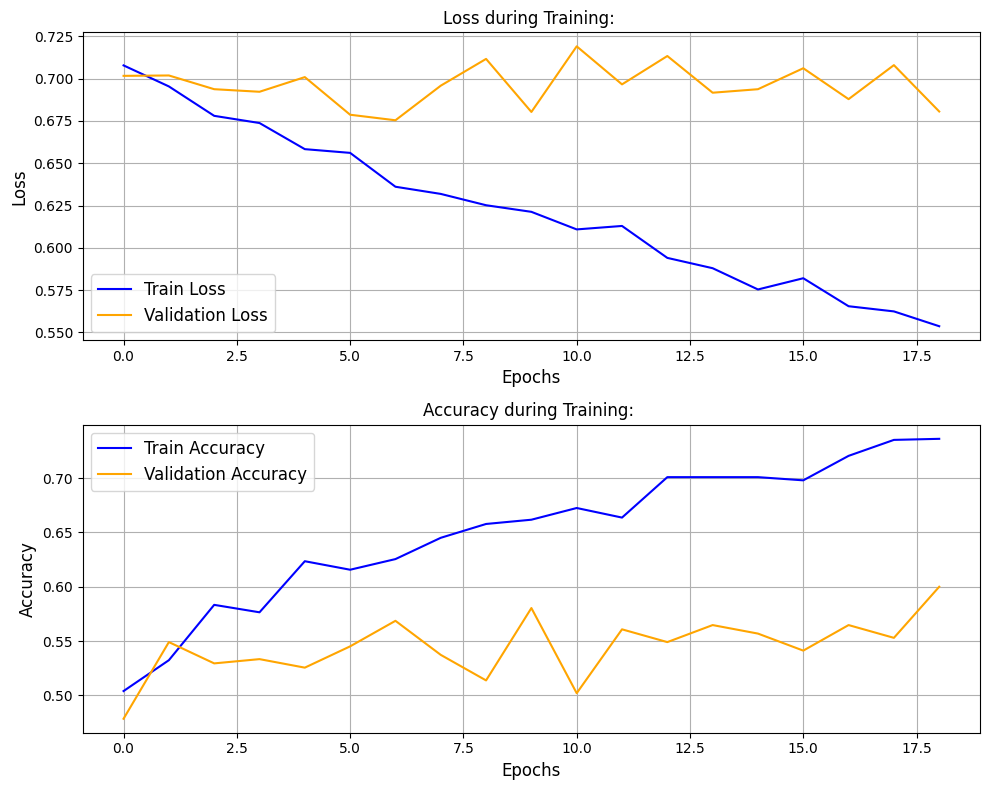

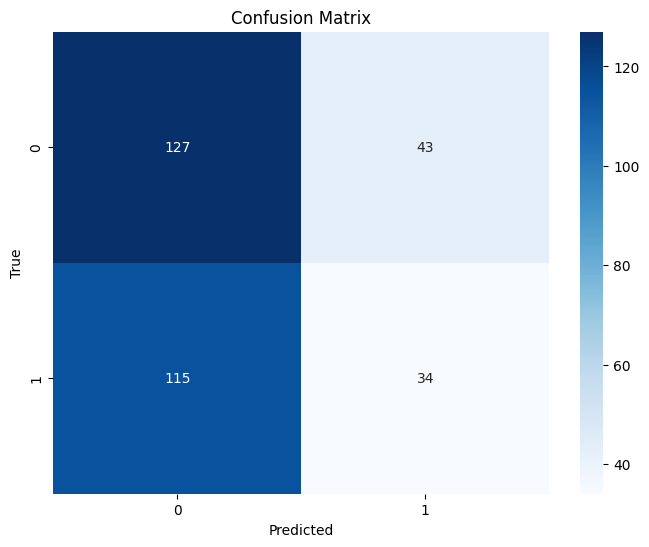

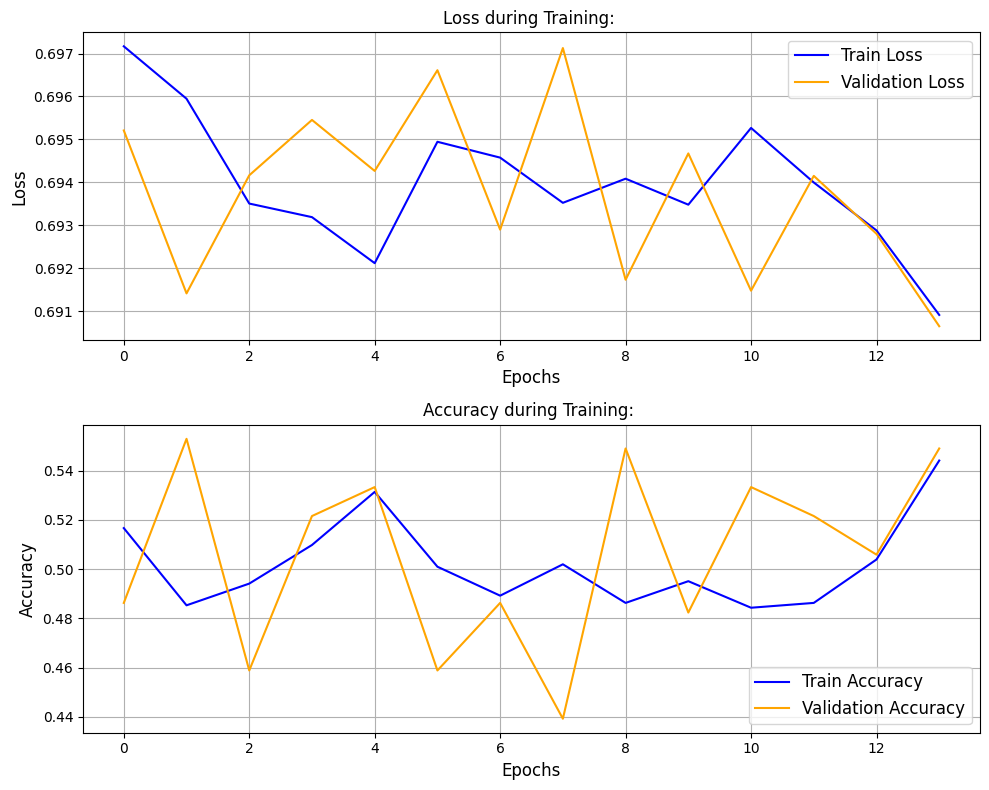

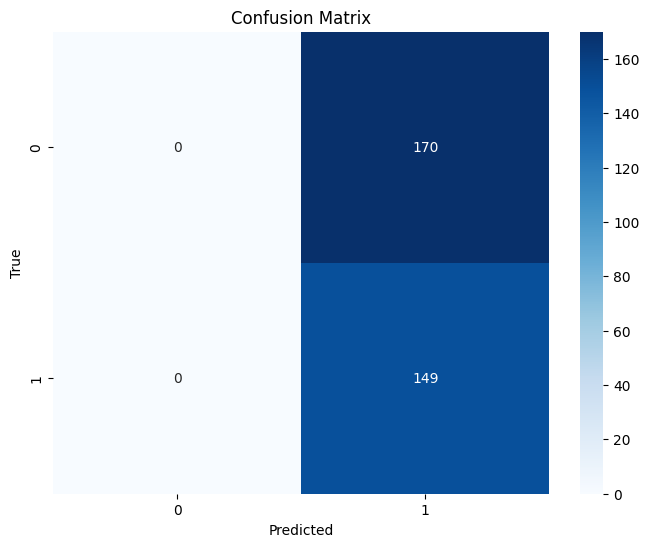

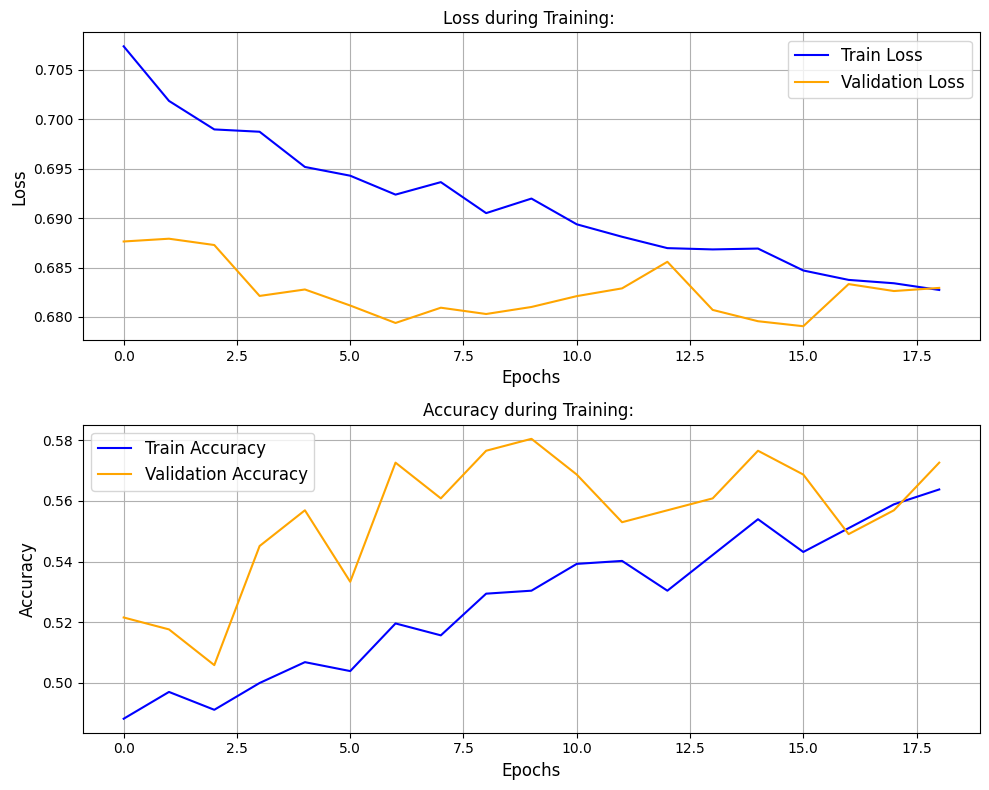

...

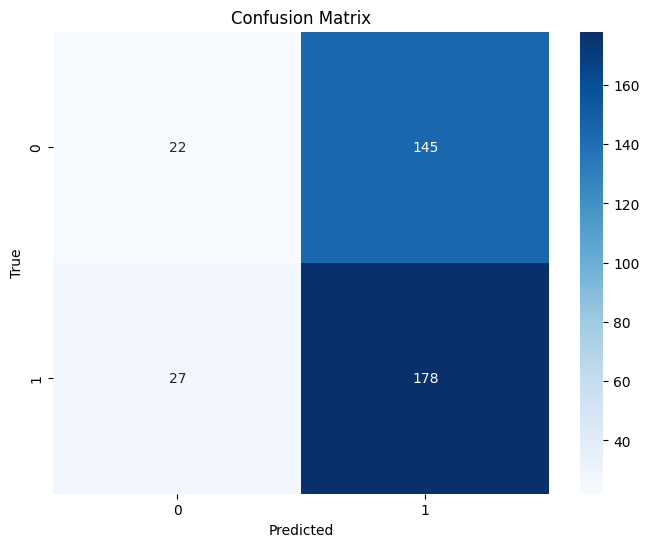

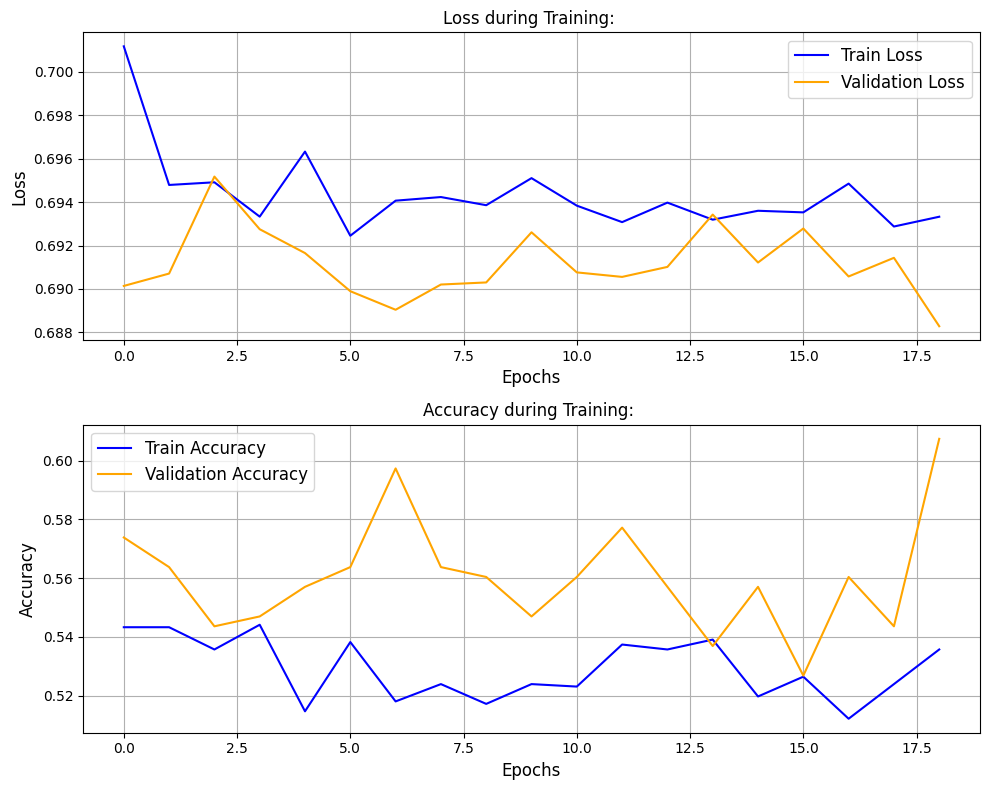

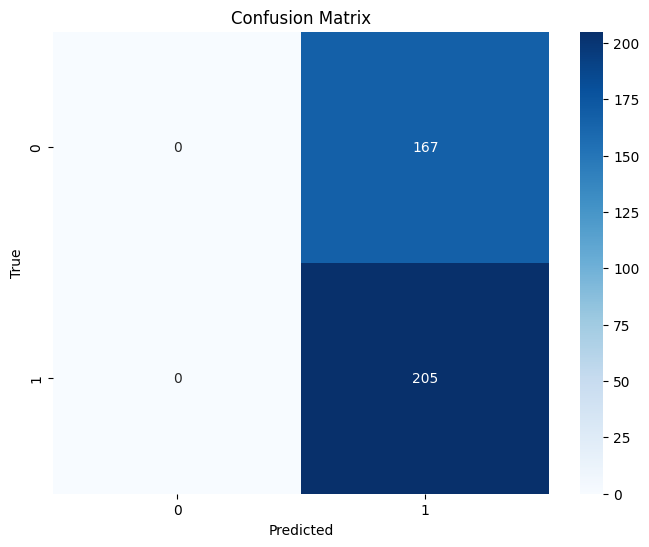

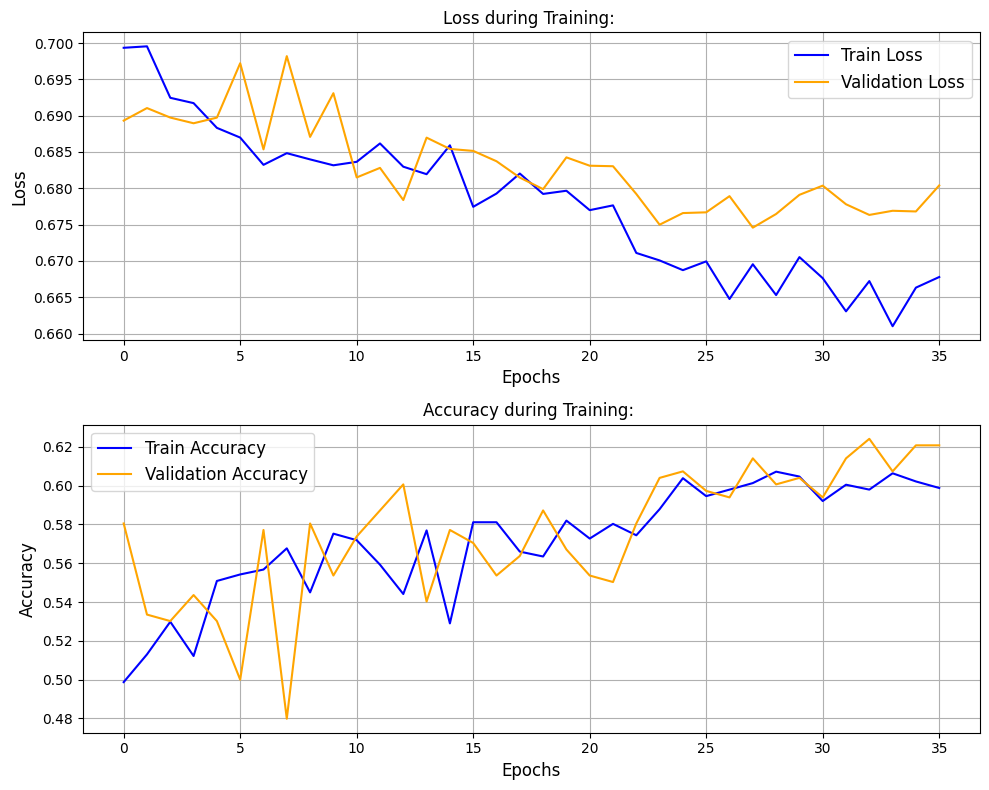

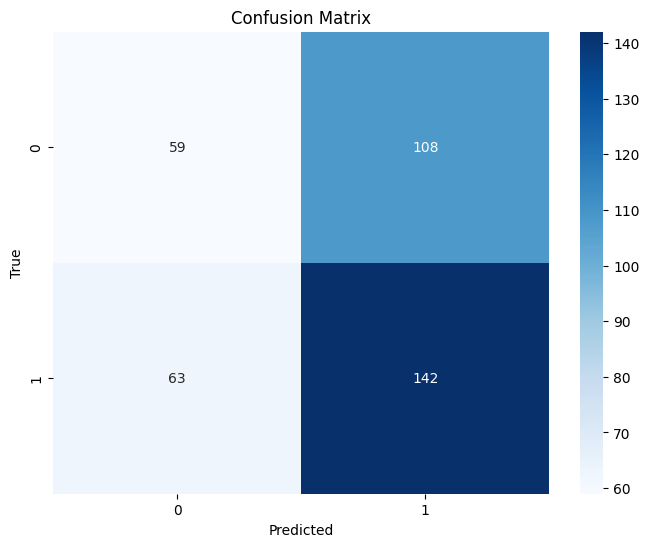

In [27]:
'''

La pipeline 1D (CNN1D, BiLSTM, Transformer) va a 

1) caricare i best .pkl, 
2) ricalcolare correttamente la train AUC alla best-epoch, 
3) valuta il test set, e
4) salva tutto dove ti aspetti, senza sorprese.
'''


# Imposta il seme per la riproducibilità

#Imposta il seme per i generatori casuali di PyTorch (per operazioni sui tensori e inizializzazione dei pesi dei modelli).
#Importante se vuoi garantire che l'addestramento del modello produca gli stessi risultati in diverse esecuzioni.
torch.manual_seed(32)

#Imposta il seme per NumPy, utile se NumPy viene usato per operazioni casuali (ad es. shuffling dei dati, inizializzazione di matrici, ecc.).
#Importante se usi NumPy per il preprocessing dei dati e vuoi riproducibilità.

np.random.seed(32)

#mposta il seme per il modulo random di Python (utile se si usano funzioni di randomizzazione di Python puro).
#Importante solo se usi random per operazioni come mescolamento di liste.
random.seed(32)

#Imposta il seme per i generatori casuali su GPU, se disponibile.
#Utile se stai eseguendo il codice su una GPU per garantire riproducibilità anche in quel contesto.

if torch.cuda.is_available():
    torch.cuda.manual_seed_all(32)

       
'''

In questo caso, 

il set processed_datasets traccia i dataset già elaborati, 
e il set processed_models tiene traccia delle combinazioni già effettuate (modello + dataset). 

In questo modo, puoi escludere un dataset dal training se è già stato utilizzato in precedenza, 
anche se usato con un modello differente.
'''

# Dizionario per tracciare la standardizzazione usata per ogni combinazione d
# Dizionario per salvare informazioni sul modello (es. se i dati sono standardizzati)
models_info = {}


# Set per tenere traccia dei dataset già elaborati
processed_datasets = set()

# Set per tenere traccia delle combinazioni già elaborate
processed_models = set()


# Path delle performance dei modelli ottimizzati con weight and biases
# Path per trovare le best performances di ogni modello per ogni combinazione dei dati
base_folder = "/home/stefano/Interrogait/WB_time_domain_best_results"
                                        # "WB_time_domain_best_results" <--- cartella che ha salvato i best models 1D da W&B

# Path di salvataggio delle performance dei modelli dopo estrazione best models da base_folder
save_path_folder = "/home/stefano/Interrogait/time_domain_1D_best_models_post_WB"
                                              #time_domain_1D_best_models_post_WB <--- cartella salverà le metriche dei best models 1D post W&&B

'''SOLO PER MODIFICA DEI DATI TIME-DOMAIN 1D'''
#modifico il data_dict in modo che sia 'piatto' e non annidato su tre livelli 
data_dict = {
    f"{cond}_{dtype}_{cat}": pair
    for cond, d1 in data_dict.items()
    for dtype, d2 in d1.items()
    for cat, pair in d2.items()
}

# --- LOOP PRINCIPALE (con minime modifiche) ---
for key, (X_data, y_data) in data_dict.items():
    
    print(f"\n\nEstrazione Dati per il dataset: \033[1m{key}\033[0m, \tShape X: \033[1m{X_data.shape}\033[0m, Shape y: \033[1m{y_data.shape}\033[0m")
    
    if key in processed_datasets:
        print(f"ATTENZIONE: Il dataset {key} è già stato elaborato! Salto iterazione...")
        continue
        
    processed_datasets.add(key)
    
    X_train, X_val, X_test, y_train, y_val, y_test = split_data(X_data, y_data)
    print(f"Dataset Splitting: Train: \033[1m{X_train.shape}\033[0m, Val: \033[1m{X_val.shape}\033[0m, Test: \033[1m{X_test.shape}\033[0m")
    
    
    '''
    CREO COPIA TEST_LOADER_RAW PER I PLOT DEL POWER RAW PER BANDA E CLASSE
    '''
    # 1) salva una copia RAW dei soli dati di test PRIMA di standardizzare
    X_test_raw = X_test.copy()
    y_test_raw = y_test.copy()
    
    # 2) tensori
    X_raw_tensor = torch.tensor(X_test_raw, dtype=torch.float32)
    y_raw_tensor = torch.tensor(y_test_raw, dtype=torch.long)
    
    
    
    #for model_name in ["CNN2D", "BiLSTM", "Transformer"]:
    
    '''ATTENZIONE MODIFICA QUI'''
    
    for model_name in ["CNN1D", "BiLSTM", "Transformer"]:
        
        # Set the seed before any stochastic step of the pipeline
        set_seed(32)

        model_key = f"{model_name}_{key}"
        if model_key in processed_models:
            print(f"ATTENZIONE: Il modello {model_name} per il dataset {key} è già stato addestrato! Salto iterazione...")
            continue
        processed_models.add(model_key)
        
        print(f"\nPreparazione dati per il dataset \033[1m{key}\033[0m e il modello \033[1m{model_name}\033[0m...")
        
        # Prova a caricare la configurazione e i pesi ottimali dal file .pkl
        
        '''
        load_config_if_available --> prende in input 'key' che è la chiave composita (i.e, th_resp_vs_pt_resp_1_20_familiar_th)
        parse_combination_key --> prende in input 'key' che suddivide la chiave composita in stringhe separate
        
        exp_cond, data_type, category_subject che sfrutto per crearmi la directory path che mi servirà per caricarmi 
        pesi del modello e i suoi iper-parametri
        
        Diciamo che in questo caso, sfrutto 'parse_combination_key per qualcosa che serve a 'load_config_if_available' in modo IMPLICITO..
        '''
        
        config, best_weights = load_config_if_available(key, model_name, base_folder)
        
        if config is None:
            raise ValueError(f"\033[1mNessun file .pkl trovato per {model_name} su {key}\033[0m. Non posso procedere senza la configurazione ottimale.")
        
        '''
        Successivamente, queste variabili vengono invece create in maniera ESPLICITA per fasi successive del loop
        MA in questo caso, parsifica la chiave una VOLTA SOLA e memorizza i valori!
        '''
        
        # Parsifica la chiave una volta sola e memorizza i valori
        exp_cond, data_type, category_subject = parse_combination_key(key)
        
        '''
        Dpodiché, 
        
        1) si carica i vari valori degli iper-parametri,
        2) si esegue la standardizzazione se servisse,
        3) prepara il modello per la divisione in train_loader etc.,
        4) si carica la configurazione dei pesi del modello, 
        5) assegna i vari valori degli iper-parametri del modello corrente per la combinazione di dati correntemente iterata 
        
        6) esegue il training e il test e poi
        
        7) si salva il tutto nella path corrispondente...
        
        
        
        
        Ricordati di aggiungere le varie variabili associate alla definizione dinamica dei valori dei parametri model-specific qui!
    
        
        
        '''
        
        '''
        PER DARE UNIFORMITÀ AL CODICE, CAMBIO IL NOME DELLE VARIABILI, CHE CONTENGONO I VALORI OTTIMIZZATI 
        DA FORNIRE IN INPUT ALLE VARIE FUNZIONI CHE SONO RICHIAMATE NEL LOOP'''
        
        
        model_lr = config["lr"]
        model_weight_decay = config["weight_decay"]
        model_n_epochs = config["n_epochs"]
        model_patience = config["patience"]
        
        
        model_batch_size = config["batch_size"]
        model_standardization = config["standardization"]
        
        #model_n_epochs = config["n_epochs"]
        #model_patience = config["patience"]
        
        #model_lr = config["lr"]
        
        '''NUOVE MODIFICHE'''
        model_beta1 =  config["beta1"]
        model_beta2 =  config["beta2"]
        model_eps = config["eps"]
        
        
        
        #model_weight_decay = config["weight_decay"]
        #model_standardization = config["standardization"]
        
        #print(f"Parametri per \033[1m{model_name}\033[0m: batch_size= \033[1m{model_batch_size}\033[0m, n_epochs= \033[1m{model_n_epochs}\033[0m, patience= \033[1m{model_patience}\033[0m, lr= \033[1m{model_lr}\033[0m, weight_decay= \033[1m{model_weight_decay}\033[0m, standardization= \033[1m{model_standardization}\033[0m")
        print(f"Parametri per \033[1m{model_name}\033[0m: batch_size= \033[1m{model_batch_size}\033[0m, n_epochs= \033[1m{model_n_epochs}\033[0m, patience= \033[1m{model_patience}\033[0m, lr= \033[1m{model_lr}\033[0m, model_beta1= \033[1m{model_beta1}\033[0m,  model_beta2= \033[1m{model_beta2}\033[0m,  model_eps= \033[1m{model_eps}\033[0m, standardization= \033[1m{model_standardization}\033[0m")
        
        # Salva nel dizionario se per quella combinazione è stata applicata la standardizzazione ai dati
        models_info[model_key] = {"standardization": model_standardization}
        
        
        # 3) dataset & loader per test set (per plots power raw) –‑  IMPORTANTISSIMO: shuffle=False
        raw_dataset = TensorDataset(X_raw_tensor, y_raw_tensor)
        test_loader_raw = DataLoader(raw_dataset,
                             batch_size=model_batch_size,
                             shuffle=False)
        
        
        
        '''PER MANTENERE LA STESSA LOGICA DEL CODICE (ANCHE SE POTREI INSERIRLA DENTRO PREPARE_DATA_FOR_MODEL MODIFICANDO LA FUNZIONE (SI VEDA IN CELLA SOPRA COME)
        IMPONGONO LA STANDARDIZZAZIONE PRIMA DI QUESTA FUNZIONE
        '''

        if model_standardization:
            X_train, X_val, X_test = standardize_data(X_train, X_val, X_test)
            print(f"\033[1mSÌ Standardizzazione Dati!\033[0m")
        else:
            print(f"\033[1mNO Standardizzazione Dati!\033[0m")
        
        # Sposta il modello sulla GPU (se disponibile)
        device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')

        
        # Preparazione dei dataloaders
        train_loader, val_loader, test_loader, class_weights_tensor = prepare_data_for_model(
            X_train, X_val, X_test, y_train, y_val, y_test, model_type = model_name, batch_size = model_batch_size)
        

        '''
        # ====== MODELLI TIME DOMAIN 1D ======
    
        # --- CNN1D solo quando model_name=="CNN1D" ---
        "conv_out_channels":{"values":[16,20,24,28,32]},

        "conv_k1":{"values":[2,4,6,8]},
        "conv_k2":{"values":[2,4,6,8]},
        "conv_k3":{"values":[2,4,6,8]},

        "conv_s1":{"values":[1,2]},
        "conv_s2":{"values":[1,2]},
        "conv_s3":{"values":[1,2]},

        "pool_p1":{"values":[1,2]},
        "pool_p2":{"values":[1,2]},
        "pool_p3":{"values":[1,2]},

        "pool_type":{"values":["max","avg"]},
        "fc1_units":{"values":[8,10,12,14,16]},

        "cnn_act1":{"values":["relu","selu","elu"]},
        "cnn_act2":{"values":["relu","selu","elu"]},
        "cnn_act3":{"values":["relu","selu","elu"]},
        
        ...
        
        if config.model_name == "CNN1D":
        
        #Numero di classi da riconoscere (es. binaria)
        num_classes = 2
        
        model = CNN1D(
            input_channels   = channels,
            num_classes      = num_classes,
            conv_out_channels= config.conv_out_channels,
            conv_k1          = config.conv_k1,
            conv_k2          = config.conv_k2,
            conv_k3          = config.conv_k3,
            conv_s1          = config.conv_s1,
            conv_s2          = config.conv_s2,
            conv_s3          = config.conv_s3,
            pool_type        = config.pool_type,
            pool_p1          = config.pool_p1,
            pool_p2          = config.pool_p2,
            pool_p3          = config.pool_p3,
            fc1_units        = config.fc1_units,
            dropout          = config.dropout,
            cnn_act1         = config.cnn_act1,
            cnn_act2         = config.cnn_act2,
            cnn_act3         = config.cnn_act3,
        )
        
        
        # --- BiLSTM solo quando model_name=="BiLSTM" ---
        "hidden_size":{"values":list(range(16,34,2))},
        "bidirectional":{"values":[0,1]},
        
        
        elif config.model_name == "BiLSTM":
    
        # Numero di canali EEG (features ad ogni time-step)
        #input_size  = 3
        
        input_size  = channels
        
        #Numero di classi da riconoscere (es. binaria)
        num_classes = 2

        model = ReadMEndYou(
            input_size    = input_size,         # qui: canali EEG
            hidden_size   = config.hidden_size, # estratto dallo sweep
            output_size   = num_classes,        # es. 2 classi
            num_layers    = 3,                  # fisso a 3 come nel tuo costruttore
            dropout       = config.dropout,     # estratto dallo sweep
            bidirectional = config.bidirectional# True/False dallo sweep
        )
        
        
        ...
        
        
        
        # --- Transformer solo quando model_name=="Transformer" ---
        "d_model":{"values":list(range(8,65,8))},
        
        #"num_heads":{"values":[2,4,6,8,10,12]}, # 6,10,12 vanno tolti, perché non divisori di tutti i d_model!
        #"num_heads":{"values":[2,4,8]}, # solo divisori di tutti i d_model
        
        "num_layers":{"values":[1,2,3]},
        "ff_mult":{"values":[2,4]},
        "transformer_activations":{"values":["relu","gelu"]},

        # Comune alle 3 reti neurali (CNN1D, BiLSTM e Transformer) 
        "dropout":{"values":[0.0,0.1,0.2,0.3,0.4,0.5]}
        
        ...
        
        
        elif config.model_name == "Transformer":
        
        # Numero di canali EEG
        #num_channels = 3
        
        num_channels = channels
        
        #Lunghezza della sequenza (punti temporali EEG)
        #seq_length  = 250
        
        seq_length = time_steps
        
        num_classes  = 2

        model = ReadMYMind(
            num_channels = num_channels,
            seq_length   = seq_length,
            d_model      = config.d_model,    # estratto dallo sweep
            num_heads    = config.num_heads,  # estratto dallo sweep
            num_layers   = config.num_layers,  # estratto dallo sweep
            num_classes  = num_classes,       # es. classificazione binaria
            ff_mult = config.ff_mult,          # <— moltiplicatore layer feed-forward transformer
            dropout = config.dropout,
            transformer_activations = config.transformer_activations
        )
        print(f"\nInizializzazione Modello \033[1m{config.model_name}\033[0m")
        
        
        
        '''
        
        
        '''PARAMETRI MODEL-SPECIFIC DI CNN2D_LSTM_TF, BiLSTM e Transformer, ma richiamati al momenti della inizializzazione deii relativi sweep_config! '''
        
        #model_dropout = config['dropout']
        #model_bidirectional = config['bidirectional']
        #model_d_model = config['d_model']
        #model_num_heads = config['num_heads']
        #model_num_layers  = config['num_layers']
        
        
        # Per caricare la shape dei dati 1D da X_train, X_val, X_test, etc.
        
        #Prelevo le dimensioni di channels e time_steps dei miei dati 
        #(250 time points, ossia 1 secondo, escluso il pre-stimolo di -200 mms!)
        
        _, channels, time_steps = X_train.shape
        
        
        # Nome dei tre sweep config usati
        
        # sweep_config_cnn1d
        # sweep_config_bilstm
        # sweep_config_transformer
        
        if model_name == "CNN1D":
            
            
            #Sweep Config CNN1D (sweep_config_cnn1d)
            
            sweep_config = sweep_config_cnn1d
        
            #Numero di classi da riconoscere (es. binaria)
            num_classes = 2
            
            model_conv_out_channels = config["conv_out_channels"]
            model_conv_k1=config["conv_k1"]
            model_conv_k2=config["conv_k2"]
            model_conv_k3=config["conv_k3"]
            model_conv_s1=config["conv_s1"]
            model_conv_s2=config["conv_s2"]
            model_conv_s3=config["conv_s3"]
            model_pool_type=config["pool_type"]
            model_pool_p1=config["pool_p1"]
            model_pool_p2=config["pool_p2"]
            model_pool_p3=config["pool_p3"]
            model_fc1_units=config["fc1_units"]
            model_dropout=config["dropout"]
            model_cnn_act1=config["cnn_act1"]
            model_cnn_act2=config["cnn_act2"]
            model_cnn_act3=config["cnn_act3"]
            
        
            model = CNN1D(
                input_channels   = channels,
                num_classes      = num_classes,
                conv_out_channels= model_conv_out_channels, 
                conv_k1          = model_conv_k1,
                conv_k2          = model_conv_k2,
                conv_k3          = model_conv_k3,
                conv_s1          = model_conv_s1,
                conv_s2          = model_conv_s2,
                conv_s3          = model_conv_s3,
                pool_type        = model_pool_type,
                pool_p1          = model_pool_p1,
                pool_p2          = model_pool_p2,
                pool_p3          = model_pool_p3,
                fc1_units        = model_fc1_units,
                dropout          = model_dropout,
                cnn_act1         = model_cnn_act1,
                cnn_act2         = model_cnn_act2,
                cnn_act3         = model_cnn_act3,
            )
        
        
        elif model_name == "BiLSTM":
            
            #Sweep Config BiLSTM (sweep_config_bilstm)
            
            sweep_config = sweep_config_bilstm
            
            
            # Numero di canali EEG (features ad ogni time-step)
            #input_size  = 3

            input_size  = channels
            
            
            #Numero di classi da riconoscere (es. binaria)
            num_classes = 2
            
            model_hidden_size =config["hidden_size"]
            model_dropout=config["dropout"]
            model_bidirectional=config["bidirectional"]
            
            
            model = ReadMEndYou(
                input_size    = input_size,         # qui: canali EEG
                hidden_size   = model_hidden_size, # estratto dallo sweep
                output_size   = num_classes,        # es. 2 classi
                num_layers    = 3,                  # fisso a 3 come nel tuo costruttore
                dropout       = model_dropout,     # estratto dallo sweep
                bidirectional = model_bidirectional# True/False dallo sweep
            )
        
        
        elif model_name == "Transformer":
            
            #Sweep Config Transformer (sweep_config_transformer)
            
            sweep_config = sweep_config_transformer
            
            # Numero di canali EEG
            #num_channels = 3

            num_channels = channels

            #Lunghezza della sequenza (punti temporali EEG)
            #seq_length  = 250

            seq_length = time_steps

            num_classes  = 2
            
            
            model_d_model=config["d_model"]
            model_num_heads=config["num_heads"]
            model_num_layers=config["num_layers"]
            model_ff_mult=config["ff_mult"]
            model_dropout=config["dropout"]
            model_transformer_activations=config["transformer_activations"]
            
            model = ReadMYMind(
                num_channels = num_channels,
                seq_length   = seq_length,
                d_model      = model_d_model,    # estratto dallo sweep
                num_heads    = model_num_heads,  # estratto dallo sweep
                num_layers   = model_num_layers,  # estratto dallo sweep
                num_classes  = num_classes,       # es. classificazione binaria
                ff_mult = model_ff_mult,          # <— moltiplicatore layer feed-forward transformer
                dropout = model_dropout,
                transformer_activations = model_transformer_activations
            )
        
        else:
            raise ValueError(f"Modello {model_name} non riconosciuto.")
        
        # Se abbiamo caricato i pesi ottimali, li carichiamo nel modello
        if best_weights is not None:
            try:
                model.load_state_dict(best_weights)
                print(f"📊 Modello \033[1m{model_name}\033[0m inizializzato con \033[01i pesi ottimizzati\033[0m tramite hyper-parameter tuning su \033[1mWeight & Biases\033[0m")
            except Exception as e:
                print(f"⚠️Errore nel caricamento dei pesi per {model_name} su {key}: {e}")
                continue
        
        
        '''NUOVE MODIFICHE'''
        # Definizione del criterio di perdita
        criterion = nn.CrossEntropyLoss(weight = class_weights_tensor)
        
        '''OLD VERSION'''
        # Definizione dell'ottimizzatore con i parametri aggiornati
        #optimizer = torch.optim.Adam(model.parameters(), lr = model_lr, weight_decay = model_weight_decay)
        
        '''NUOVE MODIFICHE'''
        
         # 10) ottimizzatore + scheduler + early stopping
        optimizer = torch.optim.Adam(
            model.parameters(),
            lr    = model_lr,
            betas = (model_beta1, model_beta2),
            eps   = model_eps,
            weight_decay = model_weight_decay
            
        )
            
        scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
            optimizer,
            mode     = "min",   # monitoriamo val_loss
            factor   = 0.1,
            patience = 8,
            verbose  = True
        )
        #early_stopping = EarlyStopping(patience=model_patience, mode="min")
        
        early_stopping = EarlyStopping(patience=model_patience, mode="max")
        
        
        #criterion = nn.CrossEntropyLoss(weight=class_weights_tensor)
        
        
        '''OLD VERSION'''
        #print(f"🏋️‍♂️Avvio del training per \033[1m{model_name}\033[0m sul dataset \033[1m{key}\033[0m...")
        #my_train_results = training(model, train_loader, val_loader, optimizer, criterion, n_epochs = model_n_epochs, patience = model_patience)
    
        #print(f"Avvio del testing per \033[1m{model_name}\033[0m sul dataset \033[1m{key}\033[0m...")
        #my_test_results = testing(my_train_results, test_loader, criterion)
        
        '''NEW VERSION'''
        # --- dopo model.load_state_dict(best_weights) e criterion = nn.CrossEntropyLoss() ---

        # 1) prepara i data_loaders per train/val
        data_loaders = {
            "train": train_loader,
            "val":   val_loader
        }
        
        print(f"🏋️‍♂️Salvo le metriche del training per \033[1m{model_name}\033[0m sul dataset \033[1m{key}\033[0m a seguito della ottimizzazione su W&B ...")
        # 2) richiama la funzione che pesca da W&B la best‐run e corregge la train AUC
        
        #ATTENZIONE al potenziale problema di stringa, non di API: 

        #i due esempi che hai postato in realtà usano diversi caratteri “‑” (uno è il classico ASCII U+002D, l’altro è un non‑breaking hyphen U+2011 o simili), quindi quando chiami
        
        #entity = "stefano‑bargione‑universit‑di‑roma‑tor‑vergata"
        #stai passando un nome che W&B non riconosce (e quindi api.projects(entity=…) torna vuoto), mentre con

        #entity = "stefano-bargione-universit-di-roma-tor-vergata"
        #funziona perché lì usi i semplici - ASCII.

        my_train_results = load_best_run_results(
            key=key,
            model = model,
            sweep_config = sweep_config,
            data_loaders = data_loaders,
            entity = "stefano-bargione-universit-di-roma-tor-vergata"
        )
        
        
        '''
        L’entity che passi a Api().runs(f"{entity}/{project}") è semplicemente il tuo account (o l’organizzazione) su W&B,
        cioè la parte che compare subito prima del nome del progetto nell’URL.

        Per esempio, se quando apri il tuo progetto su W&B vedi un indirizzo del tipo
        
        -> https://wandb.ai/steclab/some_project_name, allora entity = "steclab".
        
        Se invece lavori sotto un’organizzazione 
        
        -> “cool‑team”, e l’URL è https://wandb.ai/cool-team/some_project_name, allora userai entity = "cool-team".

        Puoi verificarlo:

        Accedi a wandb.ai e vai sul progetto.
        Leggi la prima parte dell’URL (tra wandb.ai/ e il /project_name).
        Copiala esattamente come stringa in entity.

        Così il tuo Api().runs(f"{entity}/{project}") andrà a pescare proprio le run che hai lanciato tu.

        my_train_results = load_best_run_results(
            key= key,
            model = model,
            sweep_config = sweep_config,
            data_loaders = data_loaders,
            entity= "mio-entity"
        )
        
        '''
        
        print(f"Avvio del testing per \033[1m{model_name}\033[0m sul dataset \033[1m{key}\033[0m...")
        # 3) usa il best_model caricato dentro `train_results` e chiama il testing
        my_test_results = testing(my_train_results, test_loader, criterion)
        
                        
        print(f"Salvataggio dei risultati per \033[1m{model_name}\033[0m sul dataset \033[1m{key}\033[0m...")
        save_performance_results(model_name,
                                 my_train_results,
                                 my_test_results,
                                 key,
                                 exp_cond,
                                 model_standardization,
                                 base_folder = save_path_folder)
        

In [28]:
print("finito")

finito


In [29]:
'''
dict_keys(['BiLSTM_th_resp_vs_pt_resp_wavelet_unfamiliar_pt', 
'BiLSTM_pt_resp_vs_shared_resp_1_20_unfamiliar_th', 
'BiLSTM_pt_resp_vs_shared_resp_1_45_familiar_th'])
'''

print(models_info.keys())

dict_keys(['CNN1D_th_resp_vs_pt_resp_1_20_familiar_th', 'BiLSTM_th_resp_vs_pt_resp_1_20_familiar_th', 'Transformer_th_resp_vs_pt_resp_1_20_familiar_th', 'CNN1D_th_resp_vs_pt_resp_1_20_familiar_pt', 'BiLSTM_th_resp_vs_pt_resp_1_20_familiar_pt', 'Transformer_th_resp_vs_pt_resp_1_20_familiar_pt', 'CNN1D_th_resp_vs_pt_resp_1_20_unfamiliar_th', 'BiLSTM_th_resp_vs_pt_resp_1_20_unfamiliar_th', 'Transformer_th_resp_vs_pt_resp_1_20_unfamiliar_th', 'CNN1D_th_resp_vs_pt_resp_1_20_unfamiliar_pt', 'BiLSTM_th_resp_vs_pt_resp_1_20_unfamiliar_pt', 'Transformer_th_resp_vs_pt_resp_1_20_unfamiliar_pt', 'CNN1D_th_resp_vs_pt_resp_1_45_familiar_th', 'BiLSTM_th_resp_vs_pt_resp_1_45_familiar_th', 'Transformer_th_resp_vs_pt_resp_1_45_familiar_th', 'CNN1D_th_resp_vs_pt_resp_1_45_familiar_pt', 'BiLSTM_th_resp_vs_pt_resp_1_45_familiar_pt', 'Transformer_th_resp_vs_pt_resp_1_45_familiar_pt', 'CNN1D_th_resp_vs_pt_resp_1_45_unfamiliar_th', 'BiLSTM_th_resp_vs_pt_resp_1_45_unfamiliar_th', 'Transformer_th_resp_vs_pt_res

In [30]:
with open('/home/stefano/Interrogait/time_domain_1D_best_models_post_WB.pkl', 'wb') as f:
    pickle.dump(models_info, f)

In [ ]:
'''

Modelli per i quali ho problemi nelle tabelle dopo...

models_info['BiLSTM_th_resp_vs_pt_resp_wavelet_unfamiliar_pt']
models_info['BiLSTM_pt_resp_vs_shared_resp_1_20_unfamiliar_th']
models_info['BiLSTM_pt_resp_vs_shared_resp_1_45_familiar_th']
'''


In [210]:
models_info['BiLSTM_th_resp_vs_pt_resp_wavelet_unfamiliar_pt']

{'standardization': True}

#### **CREAZIONE DELLE TABLES CON INTEGRAZIONE DELLE PERFORMANCE TRAINING, VAL & TEST DEI MODELLI DENTRO DATAFRAME**

#### **Integrazioni in Tabelle AGGREGATE delle Performance Training, Val e Test del Modello dentro DataFrame - NEW APPROACH**

In [12]:
import pickle 
path = '/home/stefano/Interrogait/'

with open(f"{path}time_domain_1D_best_models_post_WB.pkl", "rb") as f:
    models_info = pickle.load(f)

In [13]:
'''
In questo codice:

model_info.get('standardization', False) cerca la chiave 'standardization' all'interno di ogni sottodizionario. 
Se non esiste, restituirà False come valore di default.
Se standardization è True, stampa la chiave associata.
'''

# Ciclo attraverso le chiavi di 'models_info'
for key, model_info in models_info.items():
    # Controllo se 'standardization' è True
    if model_info.get('standardization', False):  # Default a False nel caso in cui non esista la chiave
        print(key)  # Stampa la chiave

CNN1D_th_resp_vs_pt_resp_1_20_familiar_th
BiLSTM_th_resp_vs_pt_resp_1_20_familiar_th
Transformer_th_resp_vs_pt_resp_1_20_familiar_th
CNN1D_th_resp_vs_pt_resp_1_20_familiar_pt
BiLSTM_th_resp_vs_pt_resp_1_20_familiar_pt
Transformer_th_resp_vs_pt_resp_1_20_familiar_pt
CNN1D_th_resp_vs_pt_resp_1_20_unfamiliar_th
BiLSTM_th_resp_vs_pt_resp_1_20_unfamiliar_th
Transformer_th_resp_vs_pt_resp_1_20_unfamiliar_th
CNN1D_th_resp_vs_pt_resp_1_20_unfamiliar_pt
BiLSTM_th_resp_vs_pt_resp_1_20_unfamiliar_pt
Transformer_th_resp_vs_pt_resp_1_20_unfamiliar_pt
CNN1D_th_resp_vs_pt_resp_1_45_familiar_th
BiLSTM_th_resp_vs_pt_resp_1_45_familiar_th
Transformer_th_resp_vs_pt_resp_1_45_familiar_th
CNN1D_th_resp_vs_pt_resp_1_45_familiar_pt
BiLSTM_th_resp_vs_pt_resp_1_45_familiar_pt
Transformer_th_resp_vs_pt_resp_1_45_familiar_pt
CNN1D_th_resp_vs_pt_resp_1_45_unfamiliar_th
BiLSTM_th_resp_vs_pt_resp_1_45_unfamiliar_th
Transformer_th_resp_vs_pt_resp_1_45_unfamiliar_th
CNN1D_th_resp_vs_pt_resp_1_45_unfamiliar_pt
BiLSTM_

In [14]:
models_info

{'CNN1D_th_resp_vs_pt_resp_1_20_familiar_th': {'standardization': True},
 'BiLSTM_th_resp_vs_pt_resp_1_20_familiar_th': {'standardization': True},
 'Transformer_th_resp_vs_pt_resp_1_20_familiar_th': {'standardization': True},
 'CNN1D_th_resp_vs_pt_resp_1_20_familiar_pt': {'standardization': True},
 'BiLSTM_th_resp_vs_pt_resp_1_20_familiar_pt': {'standardization': True},
 'Transformer_th_resp_vs_pt_resp_1_20_familiar_pt': {'standardization': True},
 'CNN1D_th_resp_vs_pt_resp_1_20_unfamiliar_th': {'standardization': True},
 'BiLSTM_th_resp_vs_pt_resp_1_20_unfamiliar_th': {'standardization': True},
 'Transformer_th_resp_vs_pt_resp_1_20_unfamiliar_th': {'standardization': True},
 'CNN1D_th_resp_vs_pt_resp_1_20_unfamiliar_pt': {'standardization': True},
 'BiLSTM_th_resp_vs_pt_resp_1_20_unfamiliar_pt': {'standardization': True},
 'Transformer_th_resp_vs_pt_resp_1_20_unfamiliar_pt': {'standardization': True},
 'CNN1D_th_resp_vs_pt_resp_1_45_familiar_th': {'standardization': True},
 'BiLSTM_th

In [16]:
'''
Siccome la stringa associata alla category subject è diversa tra i due.. 

familiar_th  familiar_pt unfamiliar_pt unfamiliar_pt  da un lato (models_info)
th_fam, pt_fam, th_unfam, pt_unfam  dall'altro (all_models)

la corrispondenza non avverrà mai... per cui, si deve fare il mapping corrispondente tra 
le stringhe di uno e dell'altro, in modo che models_info cambi come parte della stringa della sua chiave da queste 

familiar_th  familiar_pt unfamiliar_pt unfamiliar_pt
a queste
th_fam, pt_fam, th_unfam, pt_unfam 

'''

mapping_subject = {
    "familiar_th": "th_fam",
    "familiar_pt": "pt_fam",
    "unfamiliar_th": "th_unfam",
    "unfamiliar_pt": "pt_unfam"
}

def remap_key_suffix(key: str, mapping: dict) -> str:
    # prova i pattern più lunghi prima per evitare match parziali (es. "unfamiliar_th" vs "familiar_th")
    for old in sorted(mapping.keys(), key=len, reverse=True):
        if key.endswith(old):
            return key[:-len(old)] + mapping[old]   # sostituisci SOLO il suffisso
    return key

updated_models_info = { remap_key_suffix(k, mapping_subject): v
                        for k, v in models_info.items() }

models_info = updated_models_info

In [17]:
models_info.keys()

dict_keys(['CNN1D_th_resp_vs_pt_resp_1_20_th_fam', 'BiLSTM_th_resp_vs_pt_resp_1_20_th_fam', 'Transformer_th_resp_vs_pt_resp_1_20_th_fam', 'CNN1D_th_resp_vs_pt_resp_1_20_pt_fam', 'BiLSTM_th_resp_vs_pt_resp_1_20_pt_fam', 'Transformer_th_resp_vs_pt_resp_1_20_pt_fam', 'CNN1D_th_resp_vs_pt_resp_1_20_th_unfam', 'BiLSTM_th_resp_vs_pt_resp_1_20_th_unfam', 'Transformer_th_resp_vs_pt_resp_1_20_th_unfam', 'CNN1D_th_resp_vs_pt_resp_1_20_pt_unfam', 'BiLSTM_th_resp_vs_pt_resp_1_20_pt_unfam', 'Transformer_th_resp_vs_pt_resp_1_20_pt_unfam', 'CNN1D_th_resp_vs_pt_resp_1_45_th_fam', 'BiLSTM_th_resp_vs_pt_resp_1_45_th_fam', 'Transformer_th_resp_vs_pt_resp_1_45_th_fam', 'CNN1D_th_resp_vs_pt_resp_1_45_pt_fam', 'BiLSTM_th_resp_vs_pt_resp_1_45_pt_fam', 'Transformer_th_resp_vs_pt_resp_1_45_pt_fam', 'CNN1D_th_resp_vs_pt_resp_1_45_th_unfam', 'BiLSTM_th_resp_vs_pt_resp_1_45_th_unfam', 'Transformer_th_resp_vs_pt_resp_1_45_th_unfam', 'CNN1D_th_resp_vs_pt_resp_1_45_pt_unfam', 'BiLSTM_th_resp_vs_pt_resp_1_45_pt_unfam

In [18]:
''' Ciclo attraverso le chiavi di 'models_info' AGGIORNATO!'''

for key, model_info in models_info.items():
    # Controllo se 'standardization' è True
    if model_info.get('standardization', False):  # Default a False nel caso in cui non esista la chiave
        print(key)  # Stampa la chiavi

CNN1D_th_resp_vs_pt_resp_1_20_th_fam
BiLSTM_th_resp_vs_pt_resp_1_20_th_fam
Transformer_th_resp_vs_pt_resp_1_20_th_fam
CNN1D_th_resp_vs_pt_resp_1_20_pt_fam
BiLSTM_th_resp_vs_pt_resp_1_20_pt_fam
Transformer_th_resp_vs_pt_resp_1_20_pt_fam
CNN1D_th_resp_vs_pt_resp_1_20_th_unfam
BiLSTM_th_resp_vs_pt_resp_1_20_th_unfam
Transformer_th_resp_vs_pt_resp_1_20_th_unfam
CNN1D_th_resp_vs_pt_resp_1_20_pt_unfam
BiLSTM_th_resp_vs_pt_resp_1_20_pt_unfam
Transformer_th_resp_vs_pt_resp_1_20_pt_unfam
CNN1D_th_resp_vs_pt_resp_1_45_th_fam
BiLSTM_th_resp_vs_pt_resp_1_45_th_fam
Transformer_th_resp_vs_pt_resp_1_45_th_fam
CNN1D_th_resp_vs_pt_resp_1_45_pt_fam
BiLSTM_th_resp_vs_pt_resp_1_45_pt_fam
Transformer_th_resp_vs_pt_resp_1_45_pt_fam
CNN1D_th_resp_vs_pt_resp_1_45_th_unfam
BiLSTM_th_resp_vs_pt_resp_1_45_th_unfam
Transformer_th_resp_vs_pt_resp_1_45_th_unfam
CNN1D_th_resp_vs_pt_resp_1_45_pt_unfam
BiLSTM_th_resp_vs_pt_resp_1_45_pt_unfam
Transformer_th_resp_vs_pt_resp_1_45_pt_unfam
CNN1D_th_resp_vs_pt_resp_wavelet

In [19]:
'''
Parsing della chiave e costruzione del path:
Usando la funzione parse_combination_key si estraggono 

exp_cond, data_type e category_subject dalla chiave del dataset. 

Questi vengono usati per costruire il percorso in cui cercare i file .pkl.
'''

# Funzione per parsare la chiave
def parse_combination_models_keys(combination_key):
    """
    Estrae (exp_cond, data_type, category_subject) da combination_key.
    
    Il formato atteso PRIMA è:
    
    "th_resp_vs_pt_resp|pt_resp_vs_shared_resp|th_resp_vs_shared_resp" _ spectrograms" _ "familiar_th|familiar_pt|unfamiliar_th|unfamiliar_pt"
    
    Il formato atteso ORA è:
    
     "th_resp_vs_pt_resp|pt_resp_vs_shared_resp|th_resp_vs_shared_resp" _ spectrograms" _ "th_fam|th_unfam|pt_fam|pt_unfam"
     
    """
    #r"^(th_resp_vs_pt_resp|pt_resp_vs_shared_resp|th_resp_vs_shared_resp)_(spectrograms)_(th_fam|th_unfam|pt_fam|pt_unfam)$", 
    
    match = re.match(
        
        #PRIMA
        #r"^(th_resp_vs_pt_resp|pt_resp_vs_shared_resp|th_resp_vs_shared_resp)_(1_20|1_45|wavelet)_(familiar_th|familiar_pt|unfamiliar_th|unfamiliar_pt)$",
        
        #DOPO
        
        r"^(th_resp_vs_pt_resp|pt_resp_vs_shared_resp|th_resp_vs_shared_resp)_(1_20|1_45|wavelet)_(th_fam|th_unfam|pt_fam|pt_unfam)$",
        
        #r"^(rest_vs_left_fist|rest_vs_right_fist|left_fist_vs_right_fist)_(spectrograms)_(th_fam|th_unfam|pt_fam|pt_unfam)$",
        #r"^(rest_vs_both_feet|rest_vs_both_fists|both_feet_vs_both_fists)_(spectrograms)_(th_fam|th_unfam|pt_fam|pt_unfam)$",
        combination_key
    )
    if match:
        return match.groups()  # (exp_cond, data_type, category_subject)
    else:
        raise ValueError(f"Formato non valido: {combination_key}")
        
    return exp_cond, data_type, category_subject


Processing aggregate table: th_resp_vs_pt_resp - 1_20 - Observer_Role


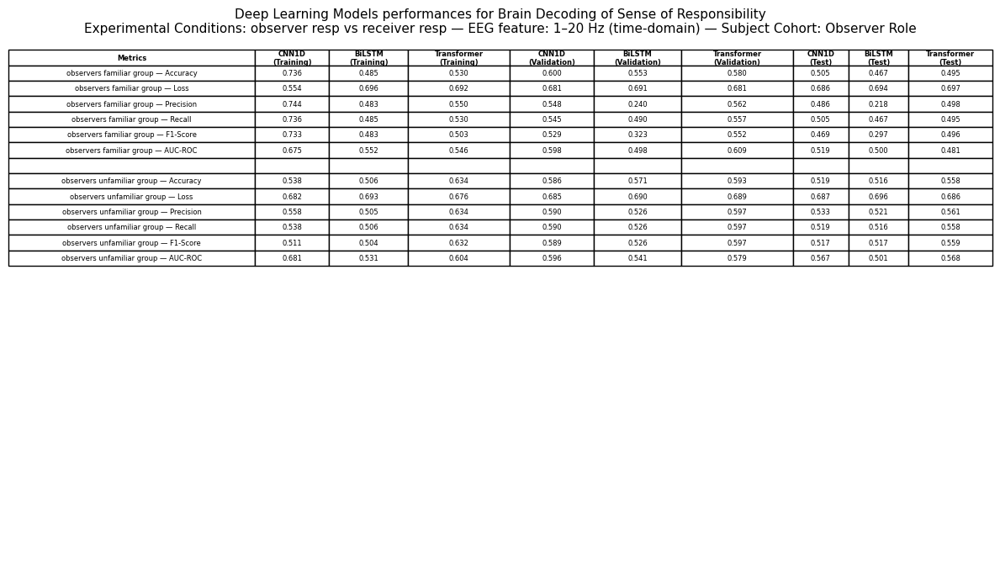

Tabella aggregata mostrata: th_resp_vs_pt_resp - 1_20 - Observer_Role

Processing aggregate table: th_resp_vs_pt_resp - 1_20 - Receiver_Role


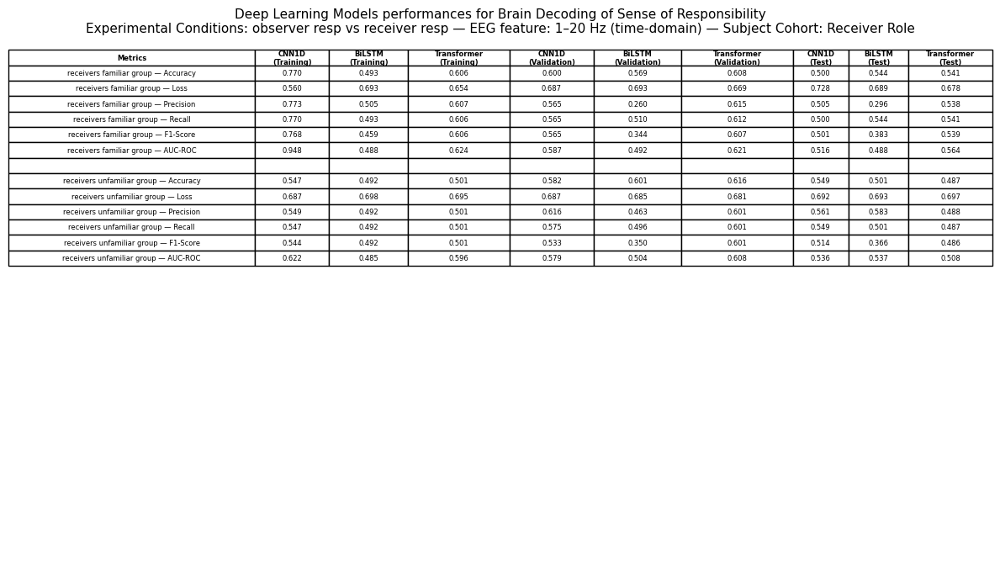

Tabella aggregata mostrata: th_resp_vs_pt_resp - 1_20 - Receiver_Role

Processing aggregate table: th_resp_vs_pt_resp - 1_45 - Observer_Role


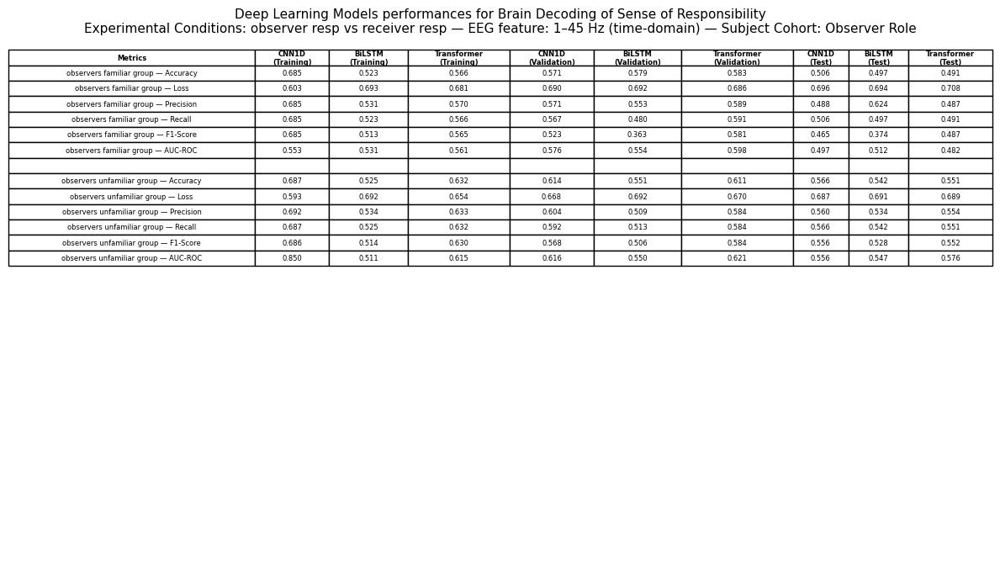

Tabella aggregata mostrata: th_resp_vs_pt_resp - 1_45 - Observer_Role

Processing aggregate table: th_resp_vs_pt_resp - 1_45 - Receiver_Role


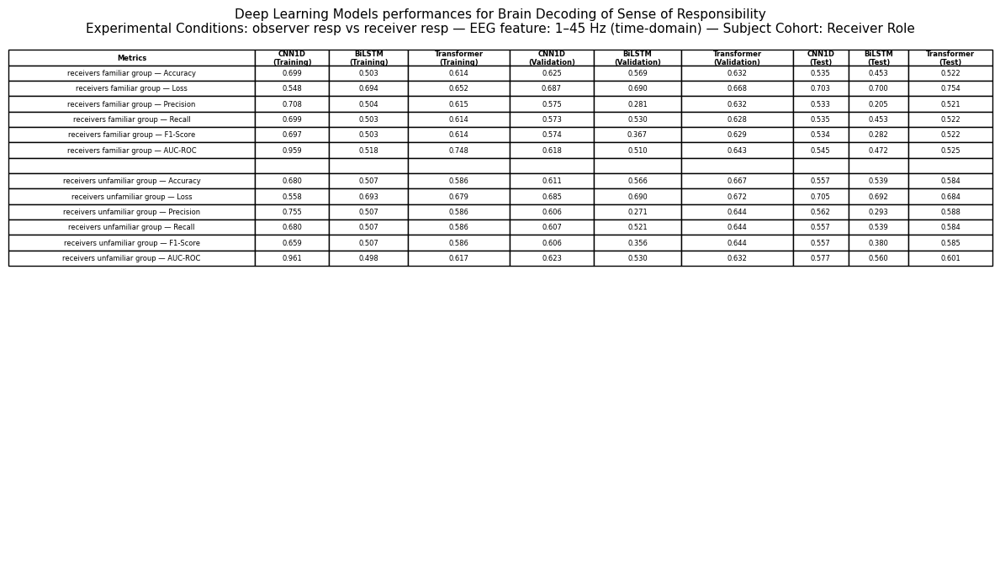

Tabella aggregata mostrata: th_resp_vs_pt_resp - 1_45 - Receiver_Role

Processing aggregate table: th_resp_vs_pt_resp - wavelet - Observer_Role


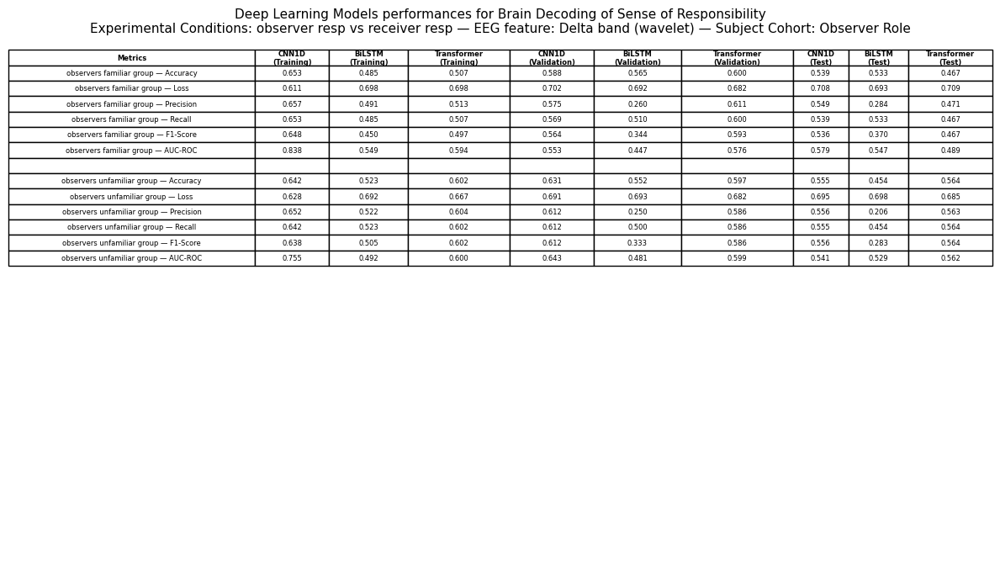

Tabella aggregata mostrata: th_resp_vs_pt_resp - wavelet - Observer_Role

Processing aggregate table: th_resp_vs_pt_resp - wavelet - Receiver_Role


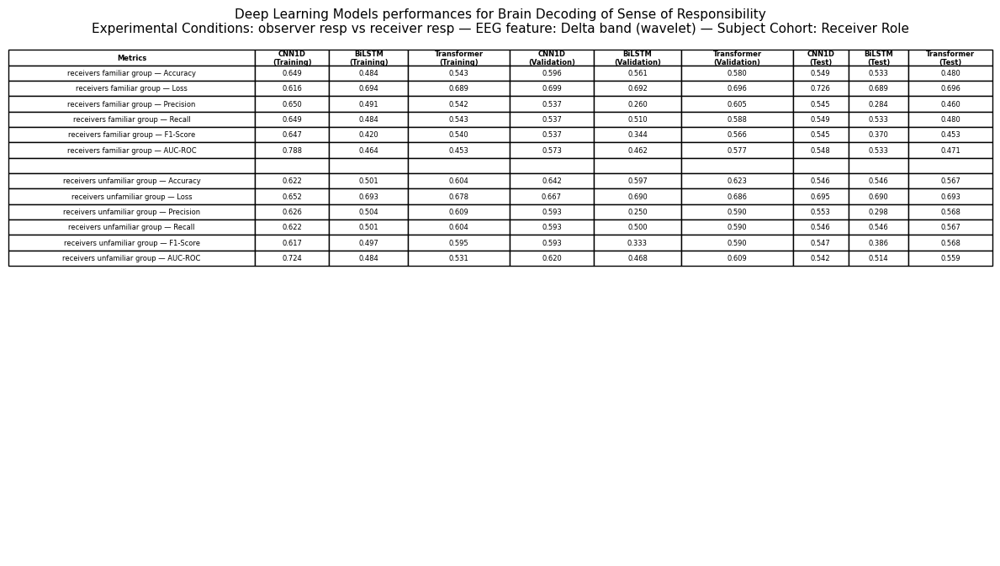

Tabella aggregata mostrata: th_resp_vs_pt_resp - wavelet - Receiver_Role

Processing aggregate table: th_resp_vs_shared_resp - 1_20 - Observer_Role


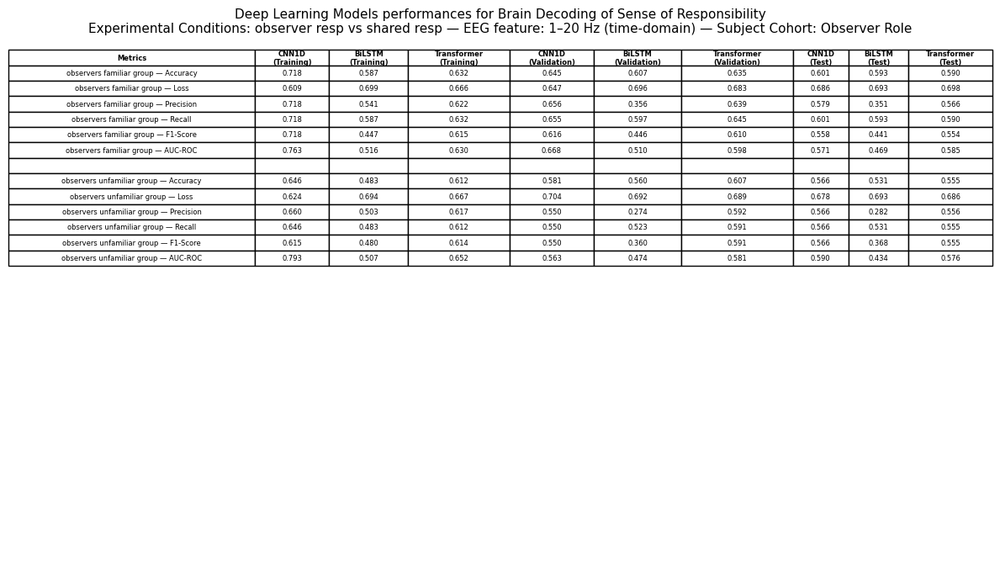

Tabella aggregata mostrata: th_resp_vs_shared_resp - 1_20 - Observer_Role

Processing aggregate table: th_resp_vs_shared_resp - 1_20 - Receiver_Role


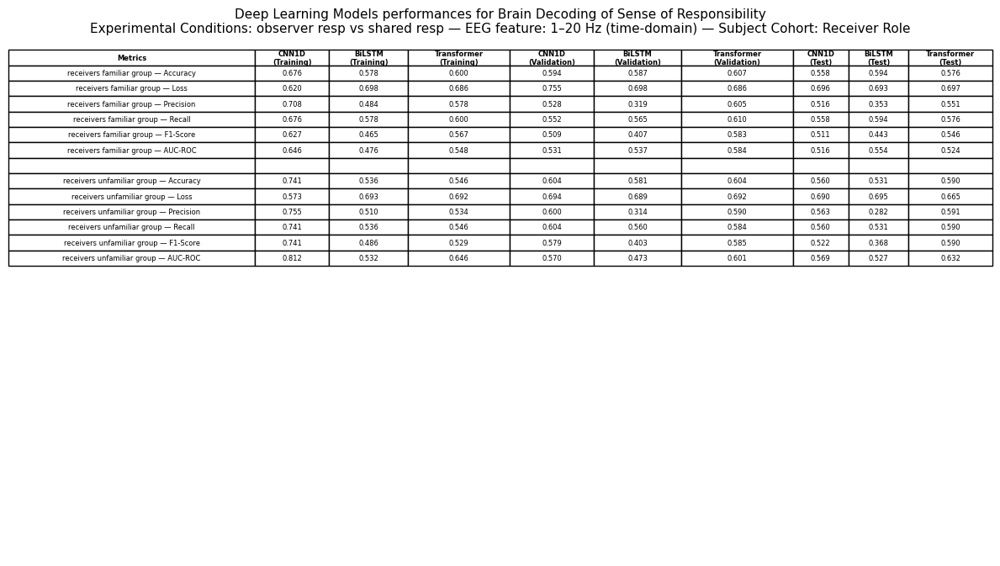

Tabella aggregata mostrata: th_resp_vs_shared_resp - 1_20 - Receiver_Role

Processing aggregate table: th_resp_vs_shared_resp - 1_45 - Observer_Role


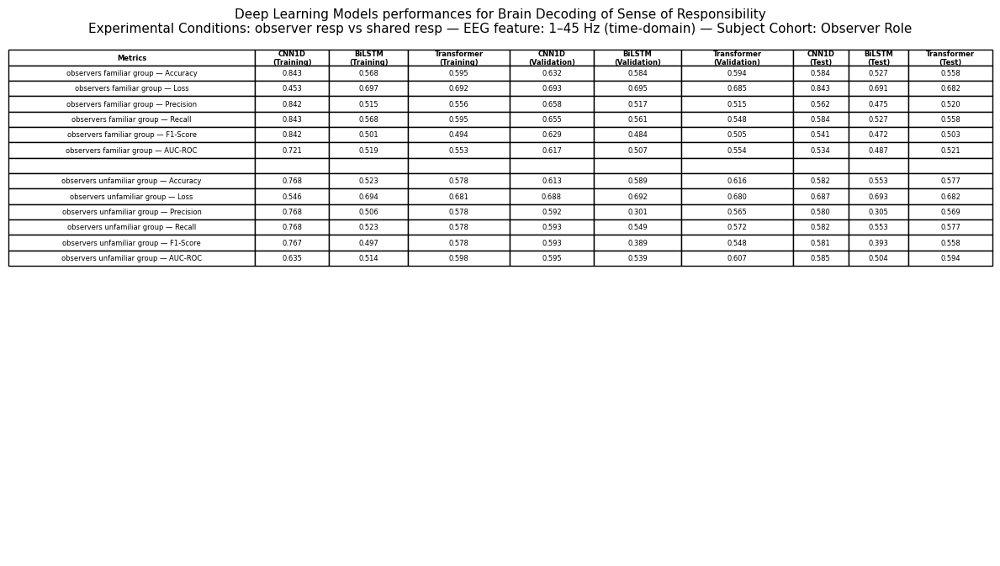

Tabella aggregata mostrata: th_resp_vs_shared_resp - 1_45 - Observer_Role

Processing aggregate table: th_resp_vs_shared_resp - 1_45 - Receiver_Role


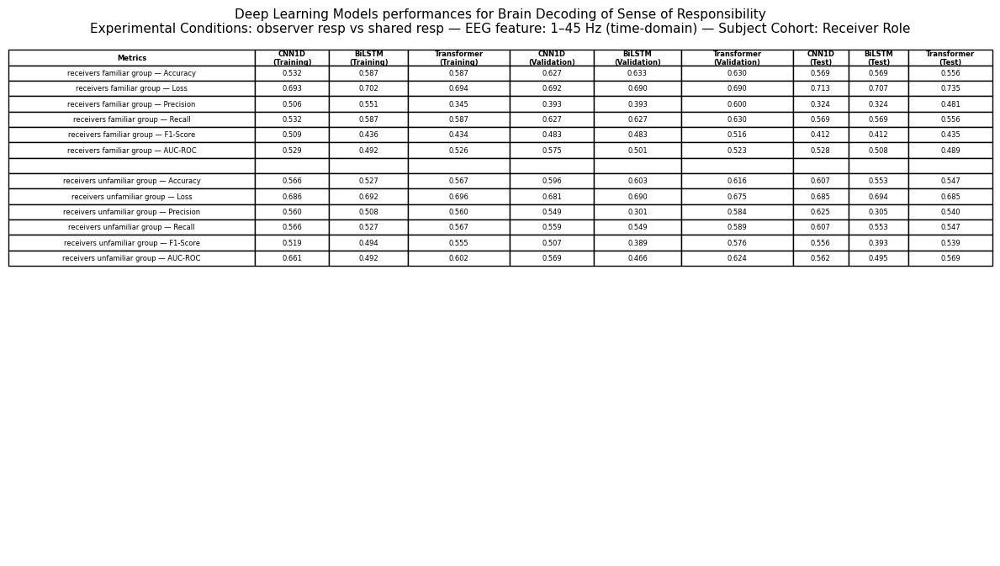

Tabella aggregata mostrata: th_resp_vs_shared_resp - 1_45 - Receiver_Role

Processing aggregate table: th_resp_vs_shared_resp - wavelet - Observer_Role


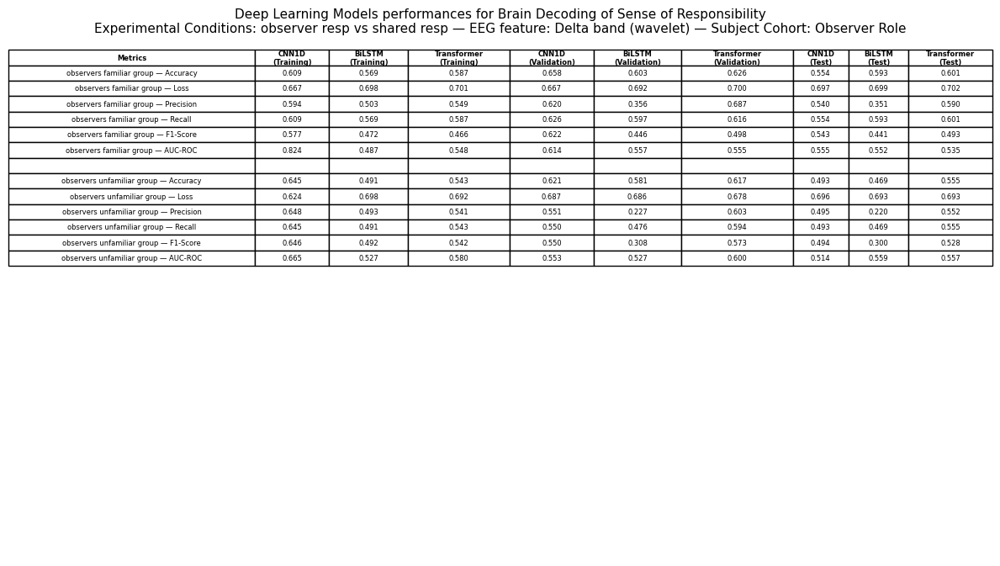

Tabella aggregata mostrata: th_resp_vs_shared_resp - wavelet - Observer_Role

Processing aggregate table: th_resp_vs_shared_resp - wavelet - Receiver_Role


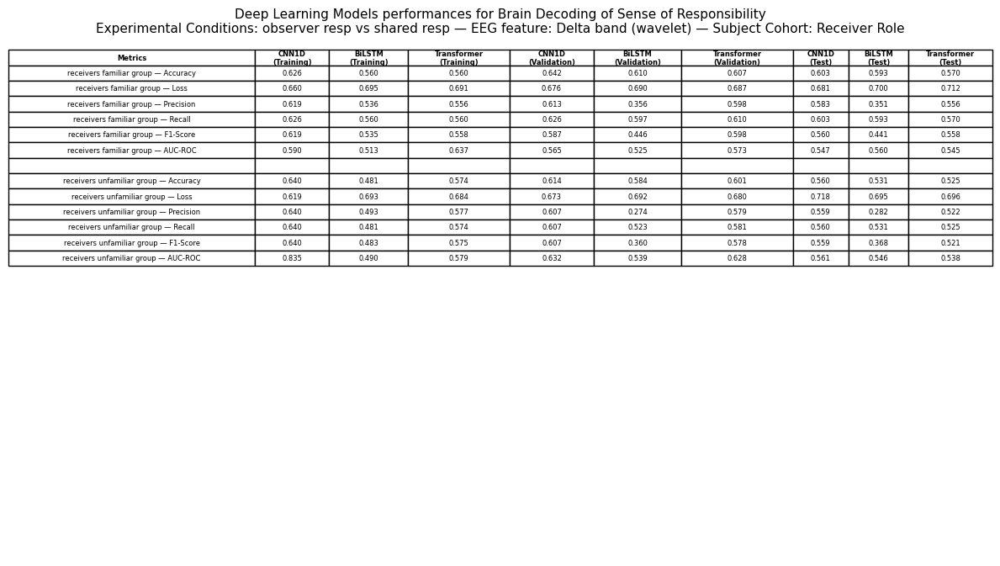

Tabella aggregata mostrata: th_resp_vs_shared_resp - wavelet - Receiver_Role

Processing aggregate table: pt_resp_vs_shared_resp - 1_20 - Observer_Role


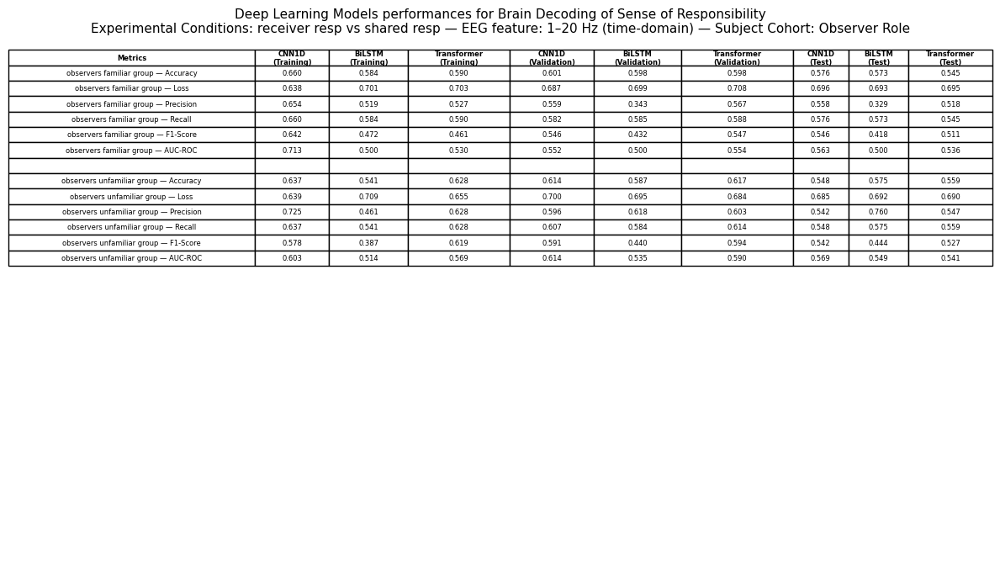

Tabella aggregata mostrata: pt_resp_vs_shared_resp - 1_20 - Observer_Role

Processing aggregate table: pt_resp_vs_shared_resp - 1_20 - Receiver_Role


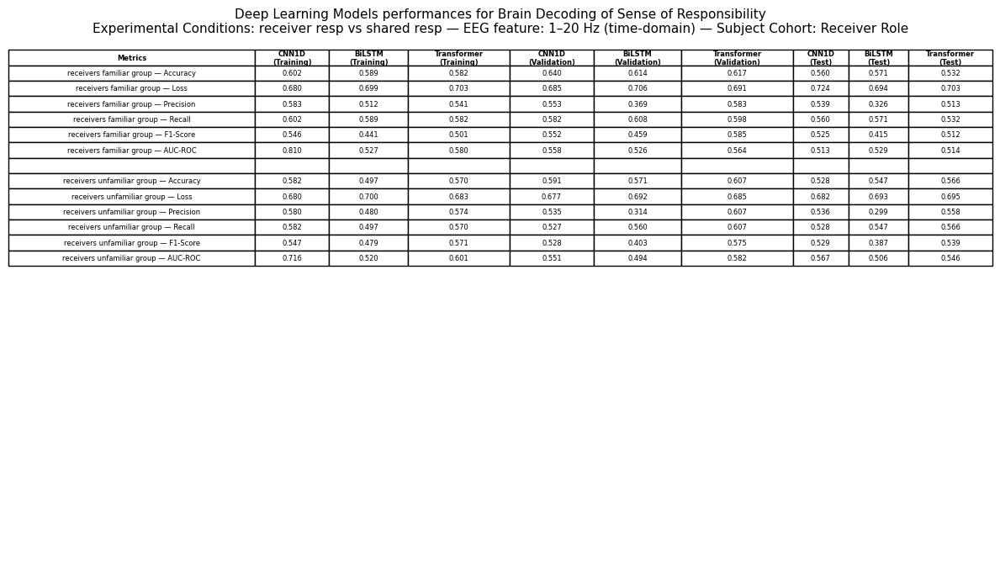

Tabella aggregata mostrata: pt_resp_vs_shared_resp - 1_20 - Receiver_Role

Processing aggregate table: pt_resp_vs_shared_resp - 1_45 - Observer_Role


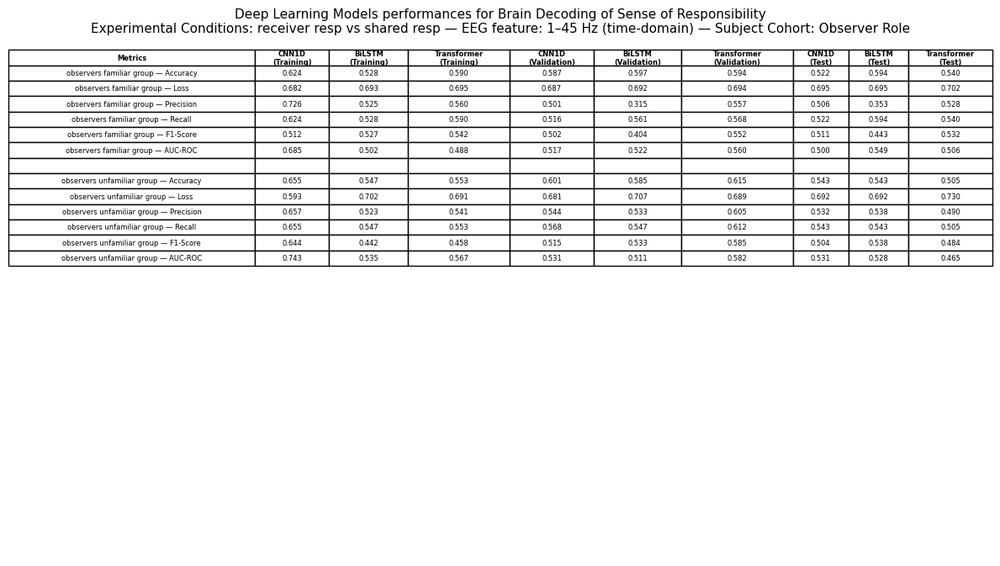

Tabella aggregata mostrata: pt_resp_vs_shared_resp - 1_45 - Observer_Role

Processing aggregate table: pt_resp_vs_shared_resp - 1_45 - Receiver_Role


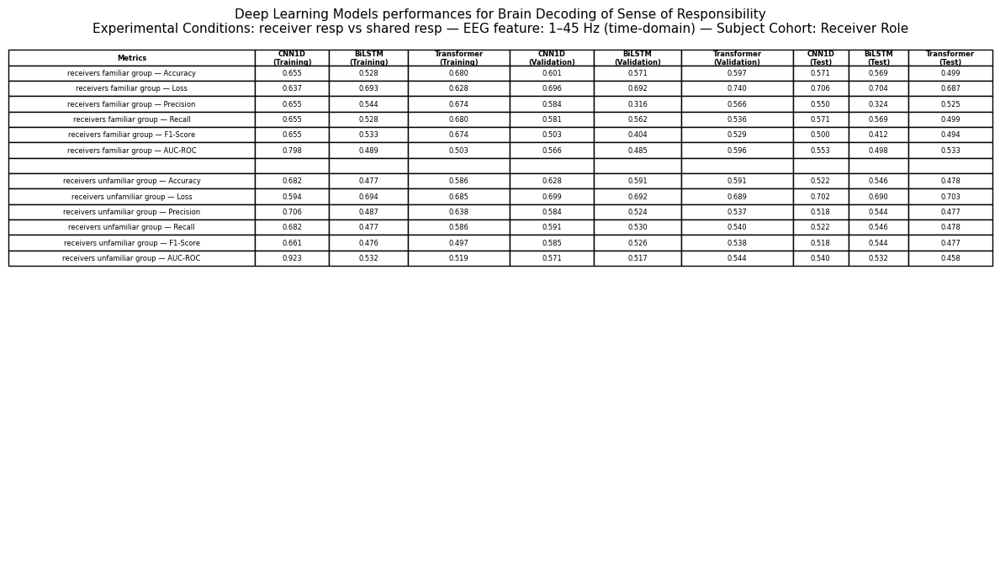

Tabella aggregata mostrata: pt_resp_vs_shared_resp - 1_45 - Receiver_Role

Processing aggregate table: pt_resp_vs_shared_resp - wavelet - Observer_Role


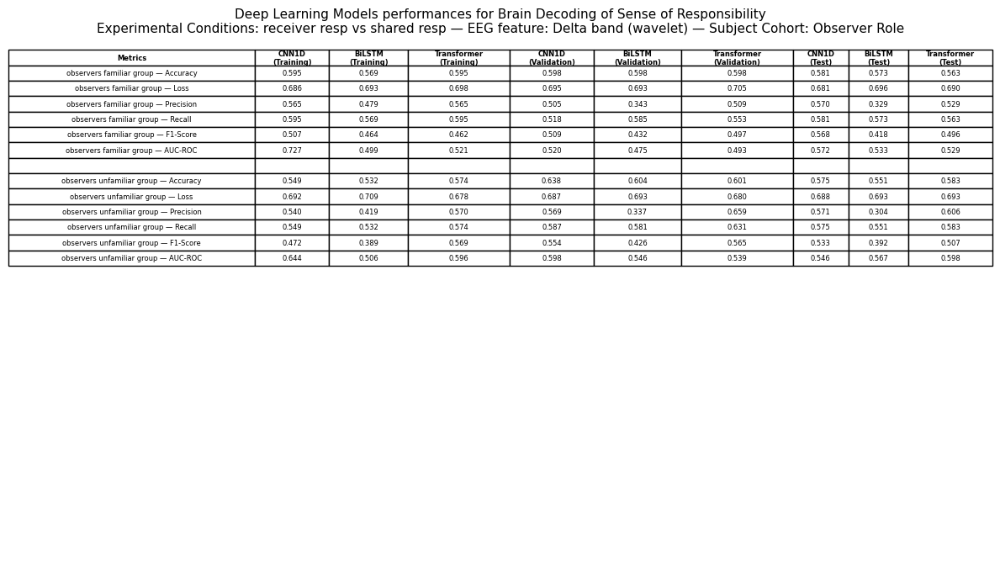

Tabella aggregata mostrata: pt_resp_vs_shared_resp - wavelet - Observer_Role

Processing aggregate table: pt_resp_vs_shared_resp - wavelet - Receiver_Role


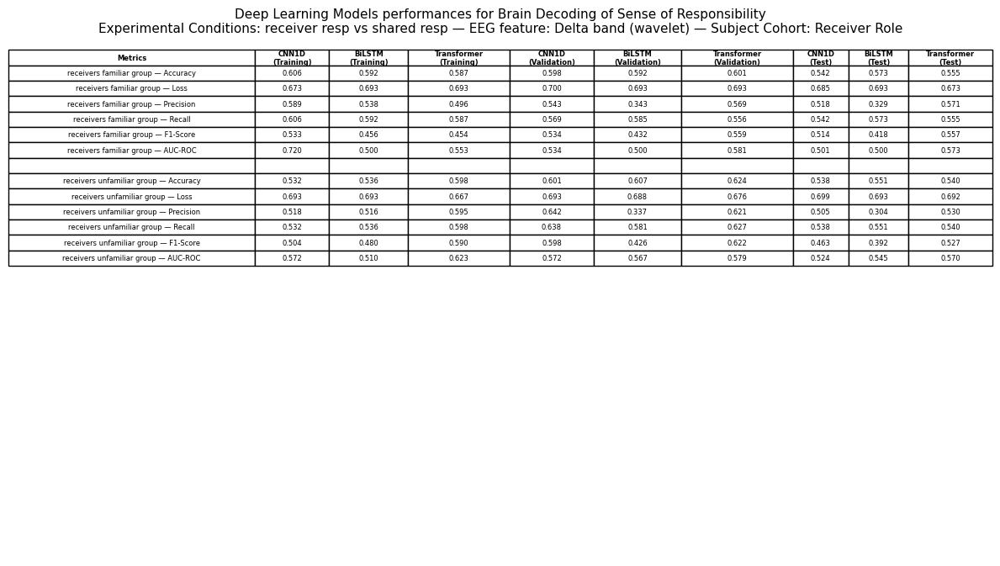

Tabella aggregata mostrata: pt_resp_vs_shared_resp - wavelet - Receiver_Role


In [20]:
'''SOLUZIONE FINALE:  METRICHE PRIMA DI TUTTI I MODELLI SUL TRAIN ... POI SUL VALIDATION ...  E POI SUL TEST SET'''

import os
import re
import pickle
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt


# ---------- Helpers ----------
def find_model_blob(all_models, condition, data_type, subfolder, model_prefix):
    """Ritorna il dict salvato a disco per il modello richiesto (o None) cercando per filename prefix."""
    key = f"{condition}_{data_type}_{subfolder}"
    if key not in all_models:
        return None
    for fname, blob in all_models[key].items():
        if fname.startswith(model_prefix + "_"):
            return blob
    return None


def fmt(v, star=False):
    """Formatta un valore numerico a 3 decimali e aggiunge '*' se standardizzato (se vuoi)."""
    try:
        val = float(v)
        s = f"{val:.3f}"
    except Exception:
        s = "-"
    return s + ("" if star else "")


def format_col_label(label: str) -> str:
    """
    Converte 'CNN1D (Training)' -> 'CNN1D\n(Training)' per header a due righe.
    Lascia 'Metrics' invariato.
    """
    if label == "Metrics":
        return label
    if "(" in label and label.endswith(")"):
        model, phase = label.split("(", 1)
        model = model.strip()
        phase = "(" + phase.strip()
        return f"{model}\n{phase}"
    return label


def pretty_condition_name(cond: str) -> str:
    """
    th_resp_vs_pt_resp        -> 'observer resp vs receiver resp'
    th_resp_vs_shared_resp    -> 'observer resp vs shared resp'
    pt_resp_vs_shared_resp    -> 'receiver resp vs shared resp'
    """
    token_map = {
        "th_resp": "observer resp",
        "pt_resp": "receiver resp",
        "shared_resp": "shared resp",
    }
    parts = cond.split("_vs_")
    pretty_parts = [token_map.get(p, p.replace("_", " ")) for p in parts]
    return " vs ".join(pretty_parts)


# ---------- Config ----------
base_folder = "/home/stefano/Interrogait/time_domain_1D_best_models_post_WB"

experimental_conditions = [
    "th_resp_vs_pt_resp",
    "th_resp_vs_shared_resp",
    "pt_resp_vs_shared_resp",
]

data_types = ["1_20", "1_45", "wavelet"]
subfolders = ["th_fam", "th_unfam", "pt_fam", "pt_unfam"]

MODEL_ORDER = ["CNN1D", "BiLSTM", "Transformer"]
PHASES = ["Training", "Validation", "Test"]   # <--- aggiunto per chiarezza

# (label, train_key, val_key, test_key)
METRICS = [
    ("Accuracy",  "train_accuracy",  "val_accuracy",  "test_accuracy"),
    ("Loss",      "train_loss",      "val_loss",      "test_loss"),
    ("Precision", "train_precision", "val_precision", "test_precision"),
    ("Recall",    "train_recall",    "val_recall",    "test_recall"),
    ("F1-Score",  "train_f1_score",  "val_f1_score",  "test_f1_score"),
    ("AUC-ROC",   "train_auc",       "val_auc",       "test_auc"),
]

ROLE_GROUPS = {
    "Observer_Role": ["th_fam", "th_unfam"],
    "Receiver_Role": ["pt_fam", "pt_unfam"],
}

# Etichette che appariranno nella colonna "Metrics"
DISPLAY_LABELS = {
    "th_fam":   "observers familiar group",
    "th_unfam": "observers unfamiliar group",
    "pt_fam":   "receivers familiar group",
    "pt_unfam": "receivers unfamiliar group",
}

# Etichette per il tipo di dato nel titolo
DATA_LABELS = {
    "1_20":    "1–20 Hz (time-domain)",
    "1_45":    "1–45 Hz (time-domain)",
    "wavelet": "Delta band (wavelet)",
}

#SHOW_ONLY = False  # cambia in False per salvare i PNG
SHOW_ONLY = True  # cambia in False per salvare i PNG

# ---------- Carica models_info se esiste ----------
try:
    with open("/home/stefano/Interrogait/time_domain_1D_best_models_post_WB.pkl", "rb") as f:
        models_info = pickle.load(f)
except Exception:
    print("⚠️  models_info non trovato/caricabile: nessun indicatore di standardizzazione (*).")
    models_info = {}

# ---------- Caricamento modelli ----------
all_models = {}

for condition in experimental_conditions:
    for data_type in data_types:
        for subfolder in subfolders:
            path = os.path.join(base_folder, condition, data_type, subfolder)
            if not os.path.exists(path):
                print(f"Directory non trovata: {path}")
                continue

            key = f"{condition}_{data_type}_{subfolder}"
            all_models[key] = {}

            for file in os.listdir(path):
                if file.endswith(".pkl"):
                    file_path = os.path.join(path, file)
                    try:
                        with open(file_path, "rb") as f:
                            all_models[key][file] = pickle.load(f)
                    except Exception as e:
                        print(f"Errore nel caricamento di {file}: {e}")


# =========================================================
#  PASS 2: tabelle aggregate per ruolo (Observer / Receiver)
# =========================================================
for condition in experimental_conditions:
    for data_type in data_types:
        for role_label, subs in ROLE_GROUPS.items():

            print(f"\nProcessing aggregate table: {condition} - {data_type} - {role_label}")

            # ---------- COSTRUZIONE DF ----------
            # ORA: prima tutte le colonne Train (tutti i modelli),
            #      poi tutte le colonne Validation, poi Test.
            columns = ["Metrics"]
            for phase in PHASES:                      # <- loop su Training / Validation / Test
                for m in MODEL_ORDER:                 #    e dentro sui modelli
                    columns.append(f"{m} ({phase})")

            df_data = {c: [] for c in columns}

            for idx_sub, subfolder in enumerate(subs):

                subfolder_disp = DISPLAY_LABELS.get(subfolder, subfolder)

                for label, tr_key, val_key, te_key in METRICS:

                    df_data["Metrics"].append(f"{subfolder_disp} — {label}")

                    for m in MODEL_ORDER:
                        blob = find_model_blob(all_models, condition, data_type, subfolder, m)

                        mi_key = f"{m}_{condition}_{data_type}_{subfolder}"
                        std_flag = bool(models_info.get(mi_key, {}).get("standardization", False))

                        if blob is None:
                            for phase in PHASES:
                                df_data[f"{m} ({phase})"].append("-")
                            continue

                        try:
                            tr = blob.get("my_train_results", {}).get("training_performances", {})
                            va = blob.get("my_train_results", {}).get("validation_performances", {})
                            te = blob.get("my_test_results", {}).get("test_performances", {})

                            tr_val = tr.get(tr_key,  [None])[0]
                            va_val = va.get(val_key, [None])[0]
                            te_val = te.get(te_key, [None])[0]

                            df_data[f"{m} (Training)"].append(fmt(tr_val, star=std_flag))
                            df_data[f"{m} (Validation)"].append(fmt(va_val, star=std_flag))
                            df_data[f"{m} (Test)"].append(fmt(te_val, star=std_flag))

                        except Exception:
                            for phase in PHASES:
                                df_data[f"{m} ({phase})"].append("-")

                # riga vuota di separazione (fam / unfam)
                if idx_sub == 0:
                    df_data["Metrics"].append("")
                    for phase in PHASES:
                        for m in MODEL_ORDER:
                            df_data[f"{m} ({phase})"].append("")

            df_performances = pd.DataFrame(df_data)

            # =========================
            #  PREPARAZIONE PER PLOT
            # =========================
            df_display = df_performances.copy()

            col_weights = []
            for col in df_display.columns:
                header_len = len(str(col))
                body_max = df_display[col].astype(str).map(len).max()
                col_weights.append(max(header_len, body_max))

            col_weights = np.array(col_weights, dtype=float)
            col_weights[0] *= 1.4  # "Metrics" più larga
            col_widths = (col_weights / col_weights.sum()) * 0.98

            # ---------- FIGURA & AX ----------
            fig, ax = plt.subplots(figsize=(14, 8))
            ax.axis("off")

            cond_pretty = pretty_condition_name(condition)
            data_pretty = DATA_LABELS.get(data_type, data_type)
            role_pretty = role_label.replace("_", " ")

            line1 = "Deep Learning Models performances for Brain Decoding of Sense of Responsibility"
            line2 = f"Experimental Conditions: {cond_pretty} — EEG feature: {data_pretty} — Subject Cohort: {role_pretty}"

            ax.set_title(
                f"{line1}\n{line2}",
                fontsize=11,
                pad=6,
            )

            col_labels = [format_col_label(c) for c in df_display.columns]

            tabla = ax.table(
                cellText=df_display.values,
                colLabels=col_labels,
                loc="upper center",
                cellLoc="center",
                colWidths=col_widths.tolist(),
            )

            tabla.auto_set_font_size(False)
            base_fontsize = 6
            header_fontsize = 6

            tabla.set_fontsize(base_fontsize)
            tabla.scale(1.1, 1.1)

            for (row, col), cell in tabla.get_celld().items():
                if row == 0:
                    cell.set_text_props(weight="bold", fontsize=header_fontsize)

            if SHOW_ONLY:
                plt.show()
                plt.close(fig)
                print(f"Tabella aggregata mostrata: {condition} - {data_type} - {role_label}")
            else:
                out_dir = os.path.join(base_folder, condition, data_type, "aggregated")
                os.makedirs(out_dir, exist_ok=True)
                out_name = f"models_performances_{condition}_{data_type}_{role_label}.png"
                out_path = os.path.join(out_dir, out_name)

                fig.savefig(out_path, bbox_inches="tight", dpi=300)
                plt.close(fig)

                print(f"Tabella aggregata salvata: {out_path}")
